<a href="https://colab.research.google.com/github/MallikharjunaSakhamuri/EdgeRepresentationDHT/blob/main/EdgeRepresentationDHT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
!pip install stellargraph

In [ ]:
!pip install chardet

In [ ]:
import stellargraph as sg
from stellargraph.mapper import PaddedGraphGenerator
from stellargraph.layer import GCNSupervisedGraphClassification
from stellargraph import StellarGraph

In [ ]:
from sklearn import model_selection
from sklearn.metrics import confusion_matrix,auc,precision_recall_curve,roc_curve
from tensorflow.keras import Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy,mean_squared_error
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from stellargraph import IndexedArray

In [ ]:
import itertools
import matplotlib.pyplot as plt

In [ ]:
def read_para(path):
    df = pd.read_csv(path,sep='\t',header=None)
    dic = {}
    for i in range(df.shape[0]):
        hla = df[0].iloc[i]
        paratope = df[1].iloc[i]
        try:
            dic[hla] = paratope
        except KeyError:
            dic[hla] = []
            dic[hla].append(paratope)
    return dic

In [ ]:
def dict_inventory(inventory):
    dicA, dicB, dicC = {}, {}, {}
    dic = {'A': dicA, 'B': dicB, 'C': dicC}

    for hla in inventory:
        type_ = hla[4]  # A,B,C
        first2 = hla[6:8]  # 01
        last2 = hla[8:]  # 01
        try:
            dic[type_][first2].append(last2)
        except KeyError:
            dic[type_][first2] = []
            dic[type_][first2].append(last2)

    return dic

In [ ]:
def rescue_unknown_hla(hla, dic_inventory):
    type_ = hla[4]
    first2 = hla[6:8]
    last2 = hla[8:]
    big_category = dic_inventory[type_]
    #print(hla)
    if not big_category.get(first2) == None:
        small_category = big_category.get(first2)
        distance = [abs(int(last2) - int(i)) for i in small_category]
        optimal = min(zip(small_category, distance), key=lambda x: x[1])[0]
        return 'HLA-' + str(type_) + '*' + str(first2) + str(optimal)
    else:
        small_category = list(big_category.keys())
        distance = [abs(int(first2) - int(i)) for i in small_category]
        optimal = min(zip(small_category, distance), key=lambda x: x[1])[0]
        return 'HLA-' + str(type_) + '*' + str(optimal) + str(big_category[optimal][0])

In [ ]:
class Graph_Constructor():

    @staticmethod
    def combinator(pep,hla):
        source = ['p' + str(i+1) for i in range(len(pep))]
        target = ['h' + str(i+1) for i in range(len(hla))]
        return source,target

    @staticmethod
    def numerical(pep,hla,after_pca,embed=12):   # after_pca [21,12]
        pep = pep.replace('X','-').upper()
        hla = hla.replace('X','-').upper()
        feature_array_pep = np.empty([len(pep),embed])
        feature_array_hla = np.empty([len(hla),embed])
        amino = 'ARNDCQEGHILKMFPSTWYV-'
        for i in range(len(pep)):
            feature_array_pep[i,:] = after_pca[amino.index(pep[i]),:]
        for i in range(len(hla)):
            feature_array_hla[i,:] = after_pca[amino.index(hla[i]),:]
        feature_array = np.concatenate([feature_array_pep,feature_array_hla],axis=0)
        #print(feature_array_pep.shape,feature_array_hla.shape,feature_array.shape)
        return feature_array

    @staticmethod
    def unweight_edge(pep,hla,after_pca):
        source,target = Graph_Constructor.combinator(pep,hla)
        combine = list(itertools.product(source,target))
        weight = itertools.repeat(1,len(source)*len(target))
        edges = pd.DataFrame({'source':[item[0] for item in combine],'target':[item[1] for item in combine],'weight':weight})
        feature_array = Graph_Constructor.numerical(pep,hla,after_pca)
        try:nodes = IndexedArray(feature_array,index=source+target)
        except: print(pep,hla,feature_array.shape)
        graph = StellarGraph(nodes,edges,node_type_default='corner',edge_type_default='line')
        return graph

    @staticmethod
    def update_edges_new(pep,hla,edges):

#       print ( "pep", pep)
#       print ( "hla", hla)
#       print ( "edges", edges)

      pep = pep.replace('X','-').upper()
      hla = hla.replace('X','-').upper()

      amino = 'ARNDCQEGHILKMFPSTWYV-'

      edges_weights = pd.read_csv(r'D:\PhD\New_Graph_Model\data\Edge_weights_pca_array_new.txt',sep=' ',header = None)

      # create a dictionary to map amino acid characters to their position in the amino acid string
      amino_dict = {}
      for i, c in enumerate(amino):
        amino_dict[c] = i

      # loop through the rows of the edges dataframe
      for index, row in edges.iterrows():
            # get the source and target nodes from the row
            source = row['source']
            target = row['target']


            # check if source is a peptide or HLA allele
            if source[0] == 'p':
            # get the position of the amino acid in the peptide sequence
                pos = int(source[1:]) - 1

                # get the amino acid character at that position
                amino_char = pep[pos]

                # get the index of the amino acid character in the amino acid string
                amino_pos = amino_dict[amino_char]

            elif source[0] == 'h':
                # get the position of the amino acid in the HLA allele
                pos = int(source[1:]) - 1

                # get the amino acid character at that position
                amino_char = hla[pos]

                # get the index of the amino acid character in the amino acid string
                amino_pos = amino_dict[amino_char]

            # check if target is a peptide or HLA allele
            if target[0] == 'p':
                # get the position of the amino acid in the peptide sequence
                pos = int(target[1:]) - 1

                # get the amino acid character at that position
                amino_char = pep[pos]

                # get the index of the amino acid character in the amino acid string
                amino_pos2 = amino_dict[amino_char]

            elif target[0] == 'h':
                # get the position of the amino acid in the HLA allele
                pos = int(target[1:]) - 1

                # get the amino acid character at that position
                amino_char = hla[pos]

                # get the index of the amino acid character in the amino acid string
                amino_pos2 = amino_dict[amino_char]

                # get the weight value from the weights dataframe
                weight = edges_weights.iloc[amino_pos, amino_pos2]

            # update the weight column in the edges dataframe
            #edges.at[index, 'weight'] = weight
            edges['weight'] = edges['weight'].astype(float)
            edges.at[index, 'weight'] = (weight)

      # Check if source[0] and target[0] are same, if not update weight accordingly
      for index, row in edges.iterrows():
        source, target = row['source'], row['target']
        weight = row['weight']
        mean = np.mean(edges['weight'])
        std = np.std(edges['weight'])

        if source[0] != target[0] and (weight > (mean + std) or weight < (mean - std)):
            edges.at[index, 'weight'] = -1

      return edges

    @staticmethod
    def weight_anchor_edge(pep,hla,after_pca):
        source, target = Graph_Constructor.combinator(pep, hla)
        combine = list(itertools.product(source, target))
        weight = itertools.repeat(1, len(source) * len(target))
        edges = pd.DataFrame({'source': [item[0] for item in combine], 'target': [item[1] for item in combine], 'weight': weight})
        for i in range(edges.shape[0]):
            col1 = edges.iloc[i]['source']
            col2 = edges.iloc[i]['target']
            col3 = edges.iloc[i]['weight']
            if col1 == 'a2' or col1 == 'a9' or col1 ==  'a10':
                edges.iloc[i]['weight'] = 1.5
        feature_array = Graph_Constructor.numerical(pep, hla, after_pca)
        nodes = IndexedArray(feature_array, index=source + target)
        graph = StellarGraph(nodes, edges, node_type_default='corner', edge_type_default='line')
        return graph

    @staticmethod
    def intra_and_inter(pep,hla,after_pca):
        source, target = Graph_Constructor.combinator(pep, hla)
        combine = list(itertools.product(source, target))
        weight = itertools.repeat(2, len(source) * len(target))
        edges_inter = pd.DataFrame({'source': [item[0] for item in combine], 'target': [item[1] for item in combine], 'weight': weight})
        intra_pep = list(itertools.combinations(source,2))
        intra_hla = list(itertools.combinations(target,2))
        intra = intra_pep + intra_hla
        weight = itertools.repeat(1,len(intra))
        edges_intra = pd.DataFrame({'source':[item[0] for item in intra],'target':[item[1] for item in intra],'weight':weight})
        edges = pd.concat([edges_inter,edges_intra])
        edges = edges.set_index(pd.Index(np.arange(edges.shape[0])))

        # Updating Edge weights
        edges = Graph_Constructor.update_edges_new(pep,hla,edges)

        # Dual Hyper Transfer
        #New_nodes,new_Edges = Graph_Constructor.DHT(source,target,edges,feature_array)

        feature_array = Graph_Constructor.numerical(pep, hla, after_pca)
        nodes = IndexedArray(feature_array, index=source + target)
#         print('Nodes Type',type(nodes))
#         print('Edges Type',type(edges))
#         print ("nodes, edges:",nodes, edges)
        graph = StellarGraph(nodes, edges, node_type_default='corner', edge_type_default='line')
        return graph

    @staticmethod
    def entrance_v1(df,after_pca,hla_dic,dic_inventory):
        graphs = []
        graph_labels = []
        for i in range(df.shape[0]):
            print(i)
            pep = df['peptide'].iloc[i]
            try:
                hla = hla_dic[df['HLA'].iloc[i]]
            except KeyError:
                hla = hla_dic[rescue_unknown_hla(df['HLA'].iloc[i],dic_inventory)]
            label = df['immunogenicity'].iloc[i]
            #if label != 'Negative': label = 0
            #else: label = 1
            #graph = Graph_Constructor.unweight_edge(pep,hla,after_pca)
            #graph = Graph_Constructor.unweight_edge(pep,hla,after_pca)
            graph = Graph_Constructor.intra_and_inter(pep,hla,after_pca)
            graphs.append(graph)
            graph_labels.append(label)
        graph_labels = pd.Series(graph_labels)
        return graphs,graph_labels

    @staticmethod
    def entrance(df, after_pca, hla_dic, dic_inventory):
        graphs = []
        graph_labels = []
        for i in range(df.shape[0]):
            print(i)
            pep = df['peptide'].iloc[i]
            try:
                hla = hla_dic[df['HLA'].iloc[i]]
            except KeyError:
                hla = hla_dic[rescue_unknown_hla(df['HLA'].iloc[i], dic_inventory)]
            label = df['immunogenicity'].iloc[i]

            # Construct the hypergraph
            graph = HyperGraph_Constructor.hypergraph(pep, hla, after_pca)

            graphs.append(graph)
            graph_labels.append(label)
        graph_labels = pd.Series(graph_labels)
        return graphs, graph_labels

In [ ]:
class HyperGraph_Constructor_v1(Graph_Constructor):

    @staticmethod
    def combinator_hyperedge(pep, hla):
        # Create source-target pairs for hyperedges
        source = ['p' + str(i+1) for i in range(len(pep))]
        target = ['h' + str(i+1) for i in range(len(hla))]
        # In hypergraphs, one edge can link multiple nodes, so return both sets together
        return source, target

    @staticmethod
    def hypergraph(pep, hla, after_pca):
        source, target = HyperGraph_Constructor.combinator_hyperedge(pep, hla)
        combine = list(itertools.product(source, target))  # Hyperedges can be more complex
        weight = itertools.repeat(1, len(source) * len(target))

        edges = pd.DataFrame({'source': [item[0] for item in combine],
                              'target': [item[1] for item in combine],
                              'weight': weight})

        feature_array = HyperGraph_Constructor.numerical(pep, hla, after_pca)
        nodes = IndexedArray(feature_array, index=source + target)
        hypergraph = StellarGraph(nodes, edges, node_type_default='corner', edge_type_default='line')

        return hypergraph

In [ ]:
class HyperGraph_Constructor(Graph_Constructor):

    @staticmethod
    def combinator_hyperedge(pep, hla):
        """
        Create source-target pairs for hyperedges where each node (from peptide and HLA)
        is connected to each other in a bipartite-like graph.
        """
        source = ['p' + str(i+1) for i in range(len(pep))]
        target = ['h' + str(i+1) for i in range(len(hla))]
        return source, target

    @staticmethod
    def hypergraph(pep, hla, after_pca):
        """
        Construct a hypergraph from peptide and HLA sequences with associated numerical features.
        """
        # Get source and target nodes
        source, target = HyperGraph_Constructor.combinator_hyperedge(pep, hla)

        # Create product of all possible source-target pairs to form hyperedges
        combine = list(itertools.product(source, target))

        # Assign a weight of 1 to all hyperedges (this can be adapted for variable weighting)
        weights = [1] * len(combine)  # Replace itertools.repeat for clarity

        # Create edges DataFrame with source-target pairs and their weights
        edges = pd.DataFrame({
            'source': [item[0] for item in combine],
            'target': [item[1] for item in combine],
            'weight': weights
        })

        # Generate node features from peptide and HLA sequences
        feature_array = HyperGraph_Constructor.numerical(pep, hla, after_pca)

        # Combine source and target nodes to form the node set
        node_index = source + target

        # Create a dictionary where node index maps to their feature vectors
        nodes = pd.DataFrame(feature_array, index=node_index)

        # Create a StellarGraph object with nodes and edges
        hypergraph = StellarGraph(nodes=nodes, edges=edges)

        return hypergraph


In [ ]:
class HyperGraph_Constructor_DHT(Graph_Constructor):

    @staticmethod
    def combinator_hyperedge(pep, hla):
        """
        Create source-target pairs for hyperedges where each node (from peptide and HLA)
        is connected to each other in a bipartite-like graph.
        """
        source = ['p' + str(i+1) for i in range(len(pep))]
        target = ['h' + str(i+1) for i in range(len(hla))]
        return source, target

    @staticmethod
    def dht_incidence_matrix(edges_df, node_index):
        """
        Create the incidence matrix for the dual hypergraph transformation.
        Swaps the role of nodes and edges.
        """
        incidence_matrix = np.zeros((len(node_index), len(edges_df)))

        # For each edge, set the incidence of its source and target nodes
        for i, (source, target) in enumerate(zip(edges_df['source'], edges_df['target'])):
            incidence_matrix[node_index.index(source), i] = 1
            incidence_matrix[node_index.index(target), i] = 1

        return incidence_matrix.T  # Return the transpose for the dual form

    @staticmethod
    def dual_hypergraph(pep, hla, after_pca):
        """
        Construct the dual hypergraph where edges are treated as nodes, and nodes as hyperedges.
        """
        source, target = HyperGraph_Constructor_DHT.combinator_hyperedge(pep, hla)
        combine = list(itertools.product(source, target))
        weights = [1] * len(combine)  # Assign weight of 1 to all edges

        # Create edges DataFrame with source-target pairs and weights
        edges = pd.DataFrame({
            'source': [item[0] for item in combine],
            'target': [item[1] for item in combine],
            'weight': weights
        })

        # Generate node features from peptide and HLA sequences
        feature_array = HyperGraph_Constructor_DHT.numerical(pep, hla, after_pca)
        node_index = source + target

        # Apply Dual Hypergraph Transformation (DHT) - swap the role of nodes and edges
        incidence_matrix = HyperGraph_Constructor_DHT.dht_incidence_matrix(edges, node_index)

        # Create a StellarGraph object with nodes and incidence matrix (now hyperedges)
        nodes_df = pd.DataFrame(feature_array, index=node_index)
        dual_hypergraph = StellarGraph(nodes=nodes_df, edges=edges)

        return dual_hypergraph


In [ ]:
class HyperGraph_Constructor_DHT_Cluster(HyperGraph_Constructor_DHT):

    @staticmethod
    def entrance(df, after_pca, hla_dic, dic_inventory, n_clusters=5):
        """
        Custom entrance method for HyperGraph_Constructor_DHT_Cluster, which constructs dual hypergraphs
        with edge clustering applied for graph-level classification.

        Args:
        - df: DataFrame containing HLA and peptide data.
        - after_pca: PCA-transformed feature data for amino acids.
        - hla_dic: Dictionary mapping HLA alleles to their pseudo sequences.
        - dic_inventory: Dictionary containing inventory of HLA alleles.
        - n_clusters: Number of clusters for edge clustering (default: 5).

        Returns:
        - graphs: List of dual hypergraphs with clustered edges.
        - graph_labels: Corresponding labels for graph-level classification.
        """
        graphs = []
        graph_labels = []

        # Loop over each sample in the DataFrame
        for i in range(df.shape[0]):
            print(f"Processing sample {i + 1}/{df.shape[0]}")  # Debug print to track progress

            # Get the peptide and HLA information
            pep = df['peptide'].iloc[i]
            try:
                hla = hla_dic[df['HLA'].iloc[i]]
            except KeyError:
                hla = hla_dic[rescue_unknown_hla(df['HLA'].iloc[i], dic_inventory)]

            # Get the label (immunogenicity) for graph classification
            label = df['immunogenicity'].iloc[i]

            # Construct the dual hypergraph with clustering applied
            graph = HyperGraph_Constructor_DHT_Cluster.dual_hypergraph_cluster(pep, hla, after_pca, n_clusters=n_clusters)

            # Append the constructed graph and its label to the lists
            graphs.append(graph)
            graph_labels.append(label)

        # Convert graph_labels to a pandas Series for consistency
        graph_labels = pd.Series(graph_labels)

        return graphs, graph_labels

    @staticmethod
    def generate_edge_features(edges_df, node_features):
        """
        Generate edge features by combining the source and target node features.
        This can be done by concatenating or averaging the node features of the source and target nodes.

        Args:
        - edges_df: DataFrame with source and target node identifiers.
        - node_features: DataFrame or numpy array containing the node features.

        Returns:
        - edge_features: Features generated for each edge by combining the source and target node features.
        """
        edge_features = []

        # Loop over each edge to combine the source and target node features
        for idx, row in edges_df.iterrows():
            source_node = row['source']
            target_node = row['target']

            # Get the node features for the source and target
            source_feature = node_features.loc[source_node].values
            target_feature = node_features.loc[target_node].values

            # Combine source and target features (e.g., concatenation, mean, etc.)
            combined_feature = np.concatenate([source_feature, target_feature])

            # Append the combined feature to the list
            edge_features.append(combined_feature)

        # Convert the list to a numpy array for clustering
        edge_features = np.array(edge_features)

        return edge_features

    @staticmethod
    def hypercluster(edges_df, edge_features, n_clusters=5):
        """
        Perform clustering of edges to aggregate similar edges into clusters.
        This reduces the graph complexity by grouping edges based on their similarity.
        """
        from sklearn.cluster import KMeans

        # Perform KMeans clustering on the edge features
        kmeans = KMeans(n_clusters=n_clusters)
        clusters = kmeans.fit_predict(edge_features)

        # Add cluster labels to the edges DataFrame
        edges_df['cluster'] = clusters

        # Check if the 'weight' column exists, if not, assign a default weight
        if 'weight' not in edges_df.columns:
            edges_df['weight'] = 1.0  # Assign default weight

        # Aggregate edges within each cluster (e.g., mean weight, or other aggregation methods)
        clustered_edges = edges_df.groupby('cluster').agg({
            'source': 'first',
            'target': 'first',
            'weight': 'mean'  # Use 'mean' as the aggregation method for weights
        }).reset_index(drop=True)

#         print("clustered_edges.head():", clustered_edges.head())  # Debug output

        return clustered_edges

    @staticmethod
    def dual_hypergraph_cluster(pep, hla, after_pca, n_clusters=5):
        """
        Construct the dual hypergraph and apply clustering on edge representations.
        """
        # Construct the dual hypergraph as before
        dual_hypergraph = HyperGraph_Constructor_DHT.dual_hypergraph(pep, hla, after_pca)
        edges_df = dual_hypergraph.edges()

        # Ensure that edges_df is a DataFrame
        edges_df = pd.DataFrame(edges_df, columns=['source', 'target'])

        # Get the node features from the graph
        node_features = pd.DataFrame(dual_hypergraph.node_features(), index=dual_hypergraph.nodes())

        # Generate edge features by combining the source and target node features
        edge_features = HyperGraph_Constructor_DHT_Cluster.generate_edge_features(edges_df, node_features)

        # Perform clustering on the edge features
        clustered_edges = HyperGraph_Constructor_DHT_Cluster.hypercluster(edges_df, edge_features, n_clusters=n_clusters)

        # Rebuild the hypergraph with clustered edges
        hypergraph_clustered = StellarGraph(
            nodes=node_features,  # Correctly formatted node features
            edges=clustered_edges
        )

        return hypergraph_clustered




In [ ]:
class HyperGraph_Constructor_DHT_HyperDrop(HyperGraph_Constructor_DHT):

    @staticmethod
    def hyperdrop(edges_df, edge_features, top_k=0.5):
        """
        Perform edge dropping based on the importance score of edges.
        This will drop the bottom (1 - top_k)% of edges and keep the top_k% for classification.
        """
        # Compute scores for each edge (e.g., L2 norm or any other metric)
        edge_scores = np.linalg.norm(edge_features, axis=1)

        # Sort edges by their scores in descending order and keep top_k percentage
        num_edges_to_keep = int(top_k * len(edge_scores))
        top_edge_indices = np.argsort(edge_scores)[-num_edges_to_keep:]

        # Convert edges_df from list of tuples to DataFrame
        edges_df = pd.DataFrame(edges_df, columns=['source', 'target'])

        # Add a default 'weight' column if it doesn't exist
        edges_df['weight'] = 1  # Assign default weight

        # Keep only the top_k percentage of edges
        edges_dropped = edges_df.iloc[top_edge_indices]

        print("edges_dropped.head():", edges_dropped.head())  # Check the result

        return edges_dropped

    @staticmethod
    def dual_hypergraph_hyperdrop(pep, hla, after_pca, top_k=0.5):
        """
        Construct the dual hypergraph and apply edge dropping (HyperDrop) on edge representations.
        """
        # Construct the dual hypergraph as before
        dual_hypergraph = HyperGraph_Constructor_DHT.dual_hypergraph(pep, hla, after_pca)
        edges_df = dual_hypergraph.edges()

        # Apply HyperDrop to drop irrelevant edges
        edge_features = dual_hypergraph.node_features()
        dropped_edges = HyperGraph_Constructor_DHT_HyperDrop.hyperdrop(edges_df, edge_features, top_k=top_k)

        # Ensure node features are in the correct format (DataFrame or dict)
        node_features = pd.DataFrame(dual_hypergraph.node_features(), index=dual_hypergraph.nodes())

        # Ensure correct DataFrame structure
        assert 'source' in dropped_edges.columns, "Missing source column in edges_dropped"
        assert 'target' in dropped_edges.columns, "Missing target column in edges_dropped"

        # Rebuild the hypergraph with only the top_k% edges
        hypergraph_dropped = StellarGraph(
            nodes=node_features,  # Correctly formatted node features
            edges=dropped_edges
        )

        return hypergraph_dropped

    @staticmethod
    def entrance(df, after_pca, hla_dic, dic_inventory, top_k=0.5):
        graphs = []
        graph_labels = []
        for i in range(df.shape[0]):
            pep = df['peptide'].iloc[i]
            try:
                hla = hla_dic[df['HLA'].iloc[i]]
            except KeyError:
                hla = hla_dic[rescue_unknown_hla(df['HLA'].iloc[i], dic_inventory)]
            label = df['immunogenicity'].iloc[i]

            # Construct the dual hypergraph with HyperDrop applied
            graph = HyperGraph_Constructor_DHT_HyperDrop.dual_hypergraph_hyperdrop(pep, hla, after_pca, top_k=top_k)

            graphs.append(graph)
            graph_labels.append(label)

        graph_labels = pd.Series(graph_labels)
        return graphs, graph_labels

In [ ]:
def train_fold(model, train_gen, test_gen, es, epochs):
    history = model.fit(
        train_gen, epochs=epochs, validation_data=test_gen, verbose=2, callbacks=[es],)
    # calculate performance on the test data and return along with history
    test_metrics = model.evaluate(test_gen, verbose=0)
    test_acc = test_metrics[model.metrics_names.index("acc")]
    return history, test_acc

In [ ]:
# def get_generators(train_index, test_index, graph_labels, batch_size):
#     train_gen = generator.flow(
#         train_index, targets=graph_labels.iloc[train_index].values, batch_size=batch_size)
#     test_gen = generator.flow(
#         test_index, targets=graph_labels.iloc[test_index].values, batch_size=batch_size)

#     return train_gen, test_gen


def get_generators(train_index, val_index, test_index, graph_labels, batch_size):
    train_gen = generator.flow(
        train_index, targets=graph_labels.iloc[train_index].values, batch_size=batch_size
    )
    val_gen = generator.flow(
        val_index, targets=graph_labels.iloc[val_index].values, batch_size=batch_size
    )
    test_gen = generator.flow(
        test_index, targets=graph_labels.iloc[test_index].values, batch_size=batch_size
    )
    return train_gen, val_gen, test_gen


In [ ]:
def draw_ROC(y_true,y_pred):

    fpr,tpr,_ = roc_curve(y_true,y_pred,pos_label=1)
    area_mine = auc(fpr,tpr)
    fig = plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
            lw=lw, label='ROC curve (area = %0.2f)' % area_mine)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

In [ ]:
def draw_PR(y_true,y_pred):
    precision,recall,_ = precision_recall_curve(y_true,y_pred,pos_label=1)
    area_PR = auc(recall,precision)
    baseline = np.sum(np.array(y_true) == 1) / len(y_true)

    plt.figure()
    lw = 2
    plt.plot(recall,precision, color='darkorange',
            lw=lw, label='PR curve (area = %0.2f)' % area_PR)
    plt.plot([0, 1], [baseline, baseline], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('PR curve example')
    plt.legend(loc="lower right")
    plt.show()

In [ ]:
def draw_history(history):
    plt.subplot(211)
    plt.title('Loss')
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='validation')
    plt.legend()
    # plot accuracy during training
    plt.subplot(212)
    plt.title('Accuracy')
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()
    plt.show()

In [ ]:
def hla_df_to_dic(hla):
    dic = {}
    for i in range(hla.shape[0]):
        col1 = hla['HLA'].iloc[i]  # HLA allele
        col2 = hla['pseudo'].iloc[i]  # pseudo sequence
        dic[col1] = col2
    return dic

In [ ]:
def retain_910(ori):
    cond = []
    for i in range(ori.shape[0]):
        peptide = ori['peptide'].iloc[i]
        if len(peptide) == 9 or len(peptide) == 10:
            cond.append(True)
        else:
            cond.append(False)
    data = ori.loc[cond]
    data = data.set_index(pd.Index(np.arange(data.shape[0])))
    return data

In [ ]:
ori_train = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\remove0123_sample100.csv')
# ori_train = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\remove0123_sample100_Test.csv')
hla = pd.read_csv('D:\\PhD\\GraphImmuno_NewResults\\data\\hla2paratopeTable_aligned.txt',sep='\t')
after_pca = np.loadtxt('D:\\PhD\\GraphImmuno_NewResults\\data\\after_pca.txt')

hla_dic = hla_df_to_dic(hla)
inventory = list(hla_dic.keys())
dic_inventory = dict_inventory(inventory)

ori_train['immunogenicity'], ori_train['potential'] = ori_train['potential'], ori_train['immunogenicity']

In [ ]:
# Create graphs and labels using the new HyperGraph_Constructor
#graphs, graph_labels = HyperGraph_Constructor_DHT.entrance(ori_train, after_pca, hla_dic, dic_inventory)
graphs, graph_labels = HyperGraph_Constructor_DHT_HyperDrop.entrance(ori_train, after_pca, hla_dic, dic_inventory, top_k=0.5)
# graphs, graph_labels = HyperGraph_Constructor_DHT_Cluster.entrance(ori_train, after_pca, hla_dic, dic_inventory, n_clusters=5)

# Initialize the generator for dual hypergraphs
generator = PaddedGraphGenerator(graphs=graphs)

edges_dropped.head():    source target  weight
31     p1    h32       1
27     p1    h28       1
3      p1     h4       1
46     p2     h1       1
45     p1    h46       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
3      p1     h4       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
32     p1    h33       1
3      p1     h4       1
2      p1     h3       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
28     p1    h29       1
47     p2     h2       1
46     p2     h1       1
26     p1    h27       1
39     p1    h40       1
edges_dropped.head():    source target  weight
32     p1    h33       1
6      p1     h7       1
45     p1    h46       1
4      p1     h5       1
27     p1    h28       1
edges_dropped.head():    source target  weight
3      p1     h4       1
47     p2     h2       1
46     p2     h1       1
39     p1    h40  

edges_dropped.head():    source target  weight
7      p1     h8       1
5      p1     h6       1
26     p1    h27       1
33     p1    h34       1
3      p1     h4       1
edges_dropped.head():    source target  weight
31     p1    h32       1
32     p1    h33       1
46     p2     h1       1
45     p1    h46       1
7      p1     h8       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
5      p1     h6       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
4      p1     h5       1
2      p1     h3       1
38     p1    h39       1
edges_dropped.head():    source target  weight
4      p1     h5       1
46     p2     h1       1
45     p1    h46       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
47     p2     h2       1
3      p1     h4       1
26     p1    h27       1
39     p1    h40  

edges_dropped.head():    source target  weight
45     p1    h46       1
46     p2     h1       1
5      p1     h6       1
25     p1    h26       1
38     p1    h39       1
edges_dropped.head():    source target  weight
32     p1    h33       1
47     p2     h2       1
4      p1     h5       1
46     p2     h1       1
39     p1    h40       1
edges_dropped.head():    source target  weight
25     p1    h26       1
5      p1     h6       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
4      p1     h5       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
46     p2     h1       1
0      p1     h1       1
28     p1    h29       1
8      p1     h9       1
37     p1    h38       1
edges_dropped.head():    source target  weight
35     p1    h36       1
25     p1    h26       1
32     p1    h33       1
45     p1    h46  

edges_dropped.head():    source target  weight
46     p2     h1       1
4      p1     h5       1
3      p1     h4       1
25     p1    h26       1
38     p1    h39       1
edges_dropped.head():    source target  weight
32     p1    h33       1
46     p2     h1       1
47     p2     h2       1
39     p1    h40       1
6      p1     h7       1
edges_dropped.head():    source target  weight
28     p1    h29       1
32     p1    h33       1
47     p2     h2       1
46     p2     h1       1
39     p1    h40       1
edges_dropped.head():    source target  weight
25     p1    h26       1
0      p1     h1       1
1      p1     h2       1
4      p1     h5       1
45     p1    h46       1
edges_dropped.head():    source target  weight
3      p1     h4       1
33     p1    h34       1
32     p1    h33       1
47     p2     h2       1
46     p2     h1       1
edges_dropped.head():    source target  weight
28     p1    h29       1
7      p1     h8       1
33     p1    h34       1
32     p1    h33  

edges_dropped.head():    source target  weight
32     p1    h33       1
5      p1     h6       1
6      p1     h7       1
7      p1     h8       1
45     p1    h46       1
edges_dropped.head():    source target  weight
32     p1    h33       1
33     p1    h34       1
4      p1     h5       1
8      p1     h9       1
47     p2     h2       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
5      p1     h6       1
0      p1     h1       1
25     p1    h26       1
edges_dropped.head():    source target  weight
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
7      p1     h8       1
6      p1     h7       1
edges_dropped.head():    source target  weight
27     p1    h28       1
46     p2     h1       1
45     p1    h46       1
25     p1    h26       1
3      p1     h4       1
edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
25     p1    h26       1
45     p1    h46  

edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
3      p1     h4       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
35     p1    h36       1
25     p1    h26       1
32     p1    h33       1
3      p1     h4       1
7      p1     h8       1
edges_dropped.head():    source target  weight
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
37     p1    h38       1
4      p1     h5       1
edges_dropped.head():    source target  weight
32     p1    h33       1
45     p1    h46       1
2      p1     h3       1
27     p1    h28       1
5      p1     h6       1
edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
37     p1    h38       1
edges_dropped.head():    source target  weight
2      p1     h3       1
46     p2     h1       1
45     p1    h46       1
4      p1     h5  

edges_dropped.head():    source target  weight
22     p1    h23       1
23     p1    h24       1
26     p1    h27       1
5      p1     h6       1
33     p1    h34       1
edges_dropped.head():    source target  weight
3      p1     h4       1
45     p1    h46       1
46     p2     h1       1
6      p1     h7       1
5      p1     h6       1
edges_dropped.head():    source target  weight
0      p1     h1       1
8      p1     h9       1
26     p1    h27       1
33     p1    h34       1
1      p1     h2       1
edges_dropped.head():    source target  weight
47     p2     h2       1
26     p1    h27       1
39     p1    h40       1
5      p1     h6       1
6      p1     h7       1
edges_dropped.head():    source target  weight
32     p1    h33       1
6      p1     h7       1
45     p1    h46       1
0      p1     h1       1
5      p1     h6       1
edges_dropped.head():    source target  weight
32     p1    h33       1
47     p2     h2       1
46     p2     h1       1
39     p1    h40  

edges_dropped.head():    source target  weight
4      p1     h5       1
46     p2     h1       1
45     p1    h46       1
25     p1    h26       1
38     p1    h39       1
edges_dropped.head():    source target  weight
32     p1    h33       1
45     p1    h46       1
6      p1     h7       1
27     p1    h28       1
3      p1     h4       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
7      p1     h8       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
7      p1     h8       1
45     p1    h46       1
0      p1     h1       1
edges_dropped.head():    source target  weight
27     p1    h28       1
4      p1     h5       1
46     p2     h1       1
45     p1    h46       1
25     p1    h26       1
edges_dropped.head():    source target  weight
5      p1     h6       1
47     p2     h2       1
6      p1     h7       1
8      p1     h9  

edges_dropped.head():    source target  weight
32     p1    h33       1
45     p1    h46       1
3      p1     h4       1
27     p1    h28       1
7      p1     h8       1
edges_dropped.head():    source target  weight
26     p1    h27       1
2      p1     h3       1
32     p1    h33       1
0      p1     h1       1
3      p1     h4       1
edges_dropped.head():    source target  weight
46     p2     h1       1
5      p1     h6       1
47     p2     h2       1
2      p1     h3       1
26     p1    h27       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
edges_dropped.head():    source target  weight
27     p1    h28       1
46     p2     h1       1
45     p1    h46       1
25     p1    h26       1
38     p1    h39       1
edges_dropped.head():    source target  weight
45     p1    h46       1
6      p1     h7       1
38     p1    h39       1
25     p1    h26  

edges_dropped.head():    source target  weight
33     p1    h34       1
46     p2     h1       1
28     p1    h29       1
4      p1     h5       1
7      p1     h8       1
edges_dropped.head():    source target  weight
46     p2     h1       1
47     p2     h2       1
26     p1    h27       1
39     p1    h40       1
4      p1     h5       1
edges_dropped.head():    source target  weight
27     p1    h28       1
46     p2     h1       1
45     p1    h46       1
2      p1     h3       1
7      p1     h8       1
edges_dropped.head():    source target  weight
2      p1     h3       1
5      p1     h6       1
39     p1    h40       1
26     p1    h27       1
13     p1    h14       1
edges_dropped.head():    source target  weight
41     p1    h42       1
7      p1     h8       1
32     p1    h33       1
0      p1     h1       1
25     p1    h26       1
edges_dropped.head():    source target  weight
46     p2     h1       1
2      p1     h3       1
39     p1    h40       1
3      p1     h4  

edges_dropped.head():    source target  weight
45     p1    h46       1
2      p1     h3       1
7      p1     h8       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
32     p1    h33       1
47     p2     h2       1
3      p1     h4       1
46     p2     h1       1
4      p1     h5       1
edges_dropped.head():    source target  weight
6      p1     h7       1
45     p1    h46       1
46     p2     h1       1
25     p1    h26       1
38     p1    h39       1
edges_dropped.head():    source target  weight
2      p1     h3       1
4      p1     h5       1
46     p2     h1       1
45     p1    h46       1
7      p1     h8       1
edges_dropped.head():    source target  weight
5      p1     h6       1
25     p1    h26       1
32     p1    h33       1
7      p1     h8       1
3      p1     h4       1
edges_dropped.head():    source target  weight
41     p1    h42       1
25     p1    h26       1
32     p1    h33       1
6      p1     h7  

edges_dropped.head():    source target  weight
0      p1     h1       1
25     p1    h26       1
3      p1     h4       1
5      p1     h6       1
45     p1    h46       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
4      p1     h5       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
2      p1     h3       1
7      p1     h8       1
38     p1    h39       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
2      p1     h3       1
27     p1    h28       1
edges_dropped.head():    source target  weight
35     p1    h36       1
25     p1    h26       1
32     p1    h33       1
3      p1     h4       1
45     p1    h46       1
edges_dropped.head():    source target  weight
45     p1    h46       1
38     p1    h39       1
25     p1    h26       1
12     p1    h13  

edges_dropped.head():    source target  weight
27     p1    h28       1
6      p1     h7       1
46     p2     h1       1
45     p1    h46       1
25     p1    h26       1
edges_dropped.head():    source target  weight
26     p1    h27       1
4      p1     h5       1
46     p2     h1       1
28     p1    h29       1
38     p1    h39       1
edges_dropped.head():    source target  weight
31     p1    h32       1
32     p1    h33       1
27     p1    h28       1
4      p1     h5       1
45     p1    h46       1
edges_dropped.head():    source target  weight
47     p2     h2       1
46     p2     h1       1
7      p1     h8       1
26     p1    h27       1
39     p1    h40       1
edges_dropped.head():    source target  weight
27     p1    h28       1
5      p1     h6       1
4      p1     h5       1
46     p2     h1       1
45     p1    h46       1
edges_dropped.head():    source target  weight
4      p1     h5       1
33     p1    h34       1
3      p1     h4       1
46     p2     h1  

edges_dropped.head():    source target  weight
47     p2     h2       1
46     p2     h1       1
26     p1    h27       1
5      p1     h6       1
39     p1    h40       1
edges_dropped.head():    source target  weight
33     p1    h34       1
47     p2     h2       1
46     p2     h1       1
39     p1    h40       1
26     p1    h27       1
edges_dropped.head():    source target  weight
3      p1     h4       1
45     p1    h46       1
46     p2     h1       1
25     p1    h26       1
7      p1     h8       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
edges_dropped.head():    source target  weight
33     p1    h34       1
4      p1     h5       1
46     p2     h1       1
28     p1    h29       1
37     p1    h38       1
edges_dropped.head():    source target  weight
45     p1    h46       1
4      p1     h5       1
0      p1     h1       1
3      p1     h4  

edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
4      p1     h5       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
2      p1     h3       1
45     p1    h46       1
0      p1     h1       1
edges_dropped.head():    source target  weight
5      p1     h6       1
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
edges_dropped.head():    source target  weight
0      p1     h1       1
28     p1    h29       1
46     p2     h1       1
47     p2     h2       1
26     p1    h27       1
edges_dropped.head():    source target  weight
33     p1    h34       1
46     p2     h1       1
47     p2     h2       1
26     p1    h27       1
39     p1    h40       1
edges_dropped.head():    source target  weight
45     p1    h46       1
6      p1     h7       1
46     p2     h1       1
5      p1     h6  

edges_dropped.head():    source target  weight
32     p1    h33       1
46     p2     h1       1
47     p2     h2       1
7      p1     h8       1
39     p1    h40       1
edges_dropped.head():    source target  weight
47     p2     h2       1
46     p2     h1       1
0      p1     h1       1
26     p1    h27       1
39     p1    h40       1
edges_dropped.head():    source target  weight
27     p1    h28       1
6      p1     h7       1
46     p2     h1       1
45     p1    h46       1
25     p1    h26       1
edges_dropped.head():    source target  weight
46     p2     h1       1
47     p2     h2       1
6      p1     h7       1
39     p1    h40       1
0      p1     h1       1
edges_dropped.head():    source target  weight
4      p1     h5       1
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
5      p1     h6       1
edges_dropped.head():    source target  weight
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37  

edges_dropped.head():    source target  weight
33     p1    h34       1
47     p2     h2       1
46     p2     h1       1
26     p1    h27       1
3      p1     h4       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
6      p1     h7       1
45     p1    h46       1
0      p1     h1       1
edges_dropped.head():    source target  weight
33     p1    h34       1
32     p1    h33       1
46     p2     h1       1
47     p2     h2       1
0      p1     h1       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
38     p1    h39       1
25     p1    h26       1
12     p1    h13       1
edges_dropped.head():    source target  weight
54     p2     h9       1
8      p1     h9       1
0      p1     h1       1
26     p1    h27       1
33     p1    h34       1
edges_dropped.head():    source target  weight
39     p1    h40       1
4      p1     h5       1
34     p1    h35       1
46     p2     h1  

edges_dropped.head():    source target  weight
0      p1     h1       1
45     p1    h46       1
27     p1    h28       1
5      p1     h6       1
37     p1    h38       1
edges_dropped.head():    source target  weight
27     p1    h28       1
46     p2     h1       1
45     p1    h46       1
25     p1    h26       1
2      p1     h3       1
edges_dropped.head():    source target  weight
28     p1    h29       1
32     p1    h33       1
46     p2     h1       1
8      p1     h9       1
47     p2     h2       1
edges_dropped.head():    source target  weight
3      p1     h4       1
28     p1    h29       1
46     p2     h1       1
47     p2     h2       1
39     p1    h40       1
edges_dropped.head():    source target  weight
35     p1    h36       1
7      p1     h8       1
4      p1     h5       1
32     p1    h33       1
25     p1    h26       1
edges_dropped.head():    source target  weight
47     p2     h2       1
4      p1     h5       1
5      p1     h6       1
46     p2     h1  

edges_dropped.head():    source target  weight
3      p1     h4       1
6      p1     h7       1
2      p1     h3       1
46     p2     h1       1
45     p1    h46       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
38     p1    h39       1
4      p1     h5       1
12     p1    h13       1
edges_dropped.head():    source target  weight
0      p1     h1       1
1      p1     h2       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
edges_dropped.head():    source target  weight
7      p1     h8       1
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
2      p1     h3       1
edges_dropped.head():    source target  weight
38     p1    h39       1
4      p1     h5       1
33     p1    h34       1
45     p1    h46       1
0      p1     h1       1
edges_dropped.head():    source target  weight
32     p1    h33       1
46     p2     h1       1
47     p2     h2       1
4      p1     h5  

edges_dropped.head():    source target  weight
46     p2     h1       1
0      p1     h1       1
8      p1     h9       1
2      p1     h3       1
26     p1    h27       1
edges_dropped.head():    source target  weight
46     p2     h1       1
0      p1     h1       1
7      p1     h8       1
3      p1     h4       1
26     p1    h27       1
edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
27     p1    h28       1
5      p1     h6       1
36     p1    h37       1
edges_dropped.head():    source target  weight
2      p1     h3       1
26     p1    h27       1
0      p1     h1       1
3      p1     h4       1
6      p1     h7       1
edges_dropped.head():    source target  weight
32     p1    h33       1
46     p2     h1       1
45     p1    h46       1
2      p1     h3       1
3      p1     h4       1
edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37  

edges_dropped.head():    source target  weight
35     p1    h36       1
25     p1    h26       1
4      p1     h5       1
32     p1    h33       1
45     p1    h46       1
edges_dropped.head():    source target  weight
8      p1     h9       1
2      p1     h3       1
5      p1     h6       1
25     p1    h26       1
32     p1    h33       1
edges_dropped.head():    source target  weight
5      p1     h6       1
26     p1    h27       1
25     p1    h26       1
28     p1    h29       1
27     p1    h28       1
edges_dropped.head():    source target  weight
32     p1    h33       1
46     p2     h1       1
47     p2     h2       1
3      p1     h4       1
2      p1     h3       1
edges_dropped.head():    source target  weight
26     p1    h27       1
8      p1     h9       1
46     p2     h1       1
2      p1     h3       1
28     p1    h29       1
edges_dropped.head():    source target  weight
4      p1     h5       1
25     p1    h26       1
32     p1    h33       1
7      p1     h8  

edges_dropped.head():    source target  weight
52     p2     h7       1
6      p1     h7       1
38     p1    h39       1
33     p1    h34       1
3      p1     h4       1
edges_dropped.head():    source target  weight
32     p1    h33       1
6      p1     h7       1
47     p2     h2       1
46     p2     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
4      p1     h5       1
45     p1    h46       1
27     p1    h28       1
edges_dropped.head():    source target  weight
8      p1     h9       1
6      p1     h7       1
7      p1     h8       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
4      p1     h5       1
33     p1    h34       1
45     p1    h46       1
0      p1     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
50     p2     h5       1
33     p1    h34       1
26     p1    h27       1
4      p1     h5  

edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
0      p1     h1       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
47     p2     h2       1
5      p1     h6       1
8      p1     h9       1
39     p1    h40       1
26     p1    h27       1
edges_dropped.head():    source target  weight
0      p1     h1       1
2      p1     h3       1
7      p1     h8       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
0      p1     h1       1
28     p1    h29       1
46     p2     h1       1
47     p2     h2       1
4      p1     h5       1
edges_dropped.head():    source target  weight
38     p1    h39       1
1      p1     h2       1
7      p1     h8       1
2      p1     h3       1
33     p1    h34       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27  

edges_dropped.head():    source target  weight
8      p1     h9       1
47     p2     h2       1
46     p2     h1       1
5      p1     h6       1
4      p1     h5       1
edges_dropped.head():    source target  weight
32     p1    h33       1
45     p1    h46       1
2      p1     h3       1
27     p1    h28       1
36     p1    h37       1
edges_dropped.head():    source target  weight
40     p1    h41       1
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
3      p1     h4       1
26     p1    h27       1
33     p1    h34       1
1      p1     h2       1
46     p2     h1       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
25     p1    h26       1
38     p1    h39       1
12     p1    h13       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
7      p1     h8       1
45     p1    h46  

edges_dropped.head():    source target  weight
4      p1     h5       1
38     p1    h39       1
1      p1     h2       1
6      p1     h7       1
33     p1    h34       1
edges_dropped.head():    source target  weight
32     p1    h33       1
33     p1    h34       1
28     p1    h29       1
47     p2     h2       1
46     p2     h1       1
edges_dropped.head():    source target  weight
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
37     p1    h38       1
3      p1     h4       1
edges_dropped.head():    source target  weight
47     p2     h2       1
8      p1     h9       1
6      p1     h7       1
0      p1     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
28     p1    h29       1
46     p2     h1       1
47     p2     h2       1
39     p1    h40       1
26     p1    h27       1
edges_dropped.head():    source target  weight
8      p1     h9       1
26     p1    h27       1
25     p1    h26       1
2      p1     h3  

edges_dropped.head():    source target  weight
47     p2     h2       1
4      p1     h5       1
46     p2     h1       1
26     p1    h27       1
8      p1     h9       1
edges_dropped.head():    source target  weight
38     p1    h39       1
1      p1     h2       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
39     p1    h40       1
0      p1     h1       1
34     p1    h35       1
27     p1    h28       1
46     p2     h1       1
edges_dropped.head():    source target  weight
45     p1    h46       1
7      p1     h8       1
5      p1     h6       1
25     p1    h26       1
38     p1    h39       1
edges_dropped.head():    source target  weight
28     p1    h29       1
5      p1     h6       1
47     p2     h2       1
46     p2     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
32     p1    h33       1
46     p2     h1       1
47     p2     h2       1
3      p1     h4  

edges_dropped.head():    source target  weight
2      p1     h3       1
45     p1    h46       1
4      p1     h5       1
46     p2     h1       1
25     p1    h26       1
edges_dropped.head():    source target  weight
4      p1     h5       1
46     p2     h1       1
45     p1    h46       1
6      p1     h7       1
0      p1     h1       1
edges_dropped.head():    source target  weight
38     p1    h39       1
4      p1     h5       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
4      p1     h5       1
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
1      p1     h2       1
46     p2     h1       1
28     p1    h29       1
6      p1     h7       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27  

edges_dropped.head():    source target  weight
40     p1    h41       1
41     p1    h42       1
38     p1    h39       1
0      p1     h1       1
6      p1     h7       1
edges_dropped.head():    source target  weight
33     p1    h34       1
32     p1    h33       1
47     p2     h2       1
46     p2     h1       1
8      p1     h9       1
edges_dropped.head():    source target  weight
32     p1    h33       1
5      p1     h6       1
3      p1     h4       1
1      p1     h2       1
4      p1     h5       1
edges_dropped.head():    source target  weight
50     p2     h5       1
21     p1    h22       1
38     p1    h39       1
33     p1    h34       1
3      p1     h4       1
edges_dropped.head():    source target  weight
2      p1     h3       1
33     p1    h34       1
26     p1    h27       1
6      p1     h7       1
46     p2     h1       1
edges_dropped.head():    source target  weight
22     p1    h23       1
35     p1    h36       1
38     p1    h39       1
33     p1    h34  

edges_dropped.head():    source target  weight
47     p2     h2       1
40     p1    h41       1
41     p1    h42       1
3      p1     h4       1
8      p1     h9       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
4      p1     h5       1
45     p1    h46       1
2      p1     h3       1
edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
27     p1    h28       1
4      p1     h5       1
36     p1    h37       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
3      p1     h4       1
45     p1    h46       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
46     p2     h1       1
0      p1     h1       1
28     p1    h29       1
37     p1    h38       1
edges_dropped.head():    source target  weight
6      p1     h7       1
33     p1    h34       1
26     p1    h27       1
7      p1     h8  

edges_dropped.head():    source target  weight
50     p2     h5       1
38     p1    h39       1
5      p1     h6       1
8      p1     h9       1
33     p1    h34       1
edges_dropped.head():    source target  weight
38     p1    h39       1
5      p1     h6       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
2      p1     h3       1
33     p1    h34       1
6      p1     h7       1
28     p1    h29       1
47     p2     h2       1
edges_dropped.head():    source target  weight
4      p1     h5       1
46     p2     h1       1
45     p1    h46       1
6      p1     h7       1
25     p1    h26       1
edges_dropped.head():    source target  weight
42     p1    h43       1
39     p1    h40       1
9      p1    h10       1
4      p1     h5       1
34     p1    h35       1
edges_dropped.head():    source target  weight
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
37     p1    h38  

edges_dropped.head():    source target  weight
2      p1     h3       1
38     p1    h39       1
5      p1     h6       1
6      p1     h7       1
33     p1    h34       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
4      p1     h5       1
2      p1     h3       1
33     p1    h34       1
edges_dropped.head():    source target  weight
47     p2     h2       1
35     p1    h36       1
38     p1    h39       1
5      p1     h6       1
33     p1    h34       1
edges_dropped.head():    source target  weight
22     p1    h23       1
38     p1    h39       1
5      p1     h6       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
7      p1     h8       1
8      p1     h9       1
26     p1    h27       1
46     p2     h1       1
4      p1     h5       1
edges_dropped.head():    source target  weight
39     p1    h40       1
0      p1     h1       1
4      p1     h5       1
7      p1     h8  

edges_dropped.head():    source target  weight
1      p1     h2       1
6      p1     h7       1
33     p1    h34       1
26     p1    h27       1
5      p1     h6       1
edges_dropped.head():    source target  weight
3      p1     h4       1
9      p1    h10       1
26     p1    h27       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
5      p1     h6       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
7      p1     h8       1
38     p1    h39       1
4      p1     h5       1
edges_dropped.head():    source target  weight
46     p2     h1       1
0      p1     h1       1
26     p1    h27       1
39     p1    h40       1
3      p1     h4       1
edges_dropped.head():    source target  weight
0      p1     h1       1
1      p1     h2       1
2      p1     h3       1
33     p1    h34  

edges_dropped.head():    source target  weight
26     p1    h27       1
6      p1     h7       1
33     p1    h34       1
7      p1     h8       1
46     p2     h1       1
edges_dropped.head():    source target  weight
32     p1    h33       1
1      p1     h2       1
45     p1    h46       1
2      p1     h3       1
27     p1    h28       1
edges_dropped.head():    source target  weight
40     p1    h41       1
21     p1    h22       1
2      p1     h3       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
30     p1    h31       1
7      p1     h8       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
4      p1     h5       1
32     p1    h33       1
45     p1    h46       1
3      p1     h4       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
6      p1     h7       1
45     p1    h46  

edges_dropped.head():    source target  weight
27     p1    h28       1
6      p1     h7       1
46     p2     h1       1
45     p1    h46       1
5      p1     h6       1
edges_dropped.head():    source target  weight
3      p1     h4       1
22     p1    h23       1
21     p1    h22       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
32     p1    h33       1
46     p2     h1       1
47     p2     h2       1
2      p1     h3       1
6      p1     h7       1
edges_dropped.head():    source target  weight
52     p2     h7       1
38     p1    h39       1
7      p1     h8       1
33     p1    h34       1
6      p1     h7       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
4      p1     h5       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
28     p1    h29       1
47     p2     h2       1
46     p2     h1       1
39     p1    h40  

edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
37     p1    h38       1
edges_dropped.head():    source target  weight
1      p1     h2       1
41     p1    h42       1
4      p1     h5       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
1      p1     h2       1
41     p1    h42       1
36     p1    h37       1
8      p1     h9       1
39     p1    h40       1
edges_dropped.head():    source target  weight
45     p1    h46       1
0      p1     h1       1
25     p1    h26       1
38     p1    h39       1
12     p1    h13       1
edges_dropped.head():    source target  weight
42     p1    h43       1
39     p1    h40       1
4      p1     h5       1
34     p1    h35       1
46     p2     h1       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27  

edges_dropped.head():    source target  weight
38     p1    h39       1
7      p1     h8       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
41     p1    h42       1
4      p1     h5       1
3      p1     h4       1
8      p1     h9       1
7      p1     h8       1
edges_dropped.head():    source target  weight
40     p1    h41       1
38     p1    h39       1
8      p1     h9       1
7      p1     h8       1
33     p1    h34       1
edges_dropped.head():    source target  weight
46     p2     h1       1
45     p1    h46       1
3      p1     h4       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
35     p1    h36       1
8      p1     h9       1
38     p1    h39       1
6      p1     h7       1
33     p1    h34       1
edges_dropped.head():    source target  weight
8      p1     h9       1
1      p1     h2       1
46     p2     h1       1
28     p1    h29  

edges_dropped.head():    source target  weight
27     p1    h28       1
5      p1     h6       1
46     p2     h1       1
45     p1    h46       1
3      p1     h4       1
edges_dropped.head():    source target  weight
48     p2     h3       1
22     p1    h23       1
4      p1     h5       1
39     p1    h40       1
1      p1     h2       1
edges_dropped.head():    source target  weight
33     p1    h34       1
5      p1     h6       1
26     p1    h27       1
45     p1    h46       1
39     p1    h40       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
27     p1    h28       1
7      p1     h8       1
46     p2     h1       1
45     p1    h46       1
4      p1     h5       1
edges_dropped.head():    source target  weight
22     p1    h23       1
39     p1    h40       1
8      p1     h9       1
34     p1    h35  

edges_dropped.head():    source target  weight
47     p2     h2       1
22     p1    h23       1
3      p1     h4       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
38     p1    h39       1
8      p1     h9       1
1      p1     h2       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
53     p2     h8       1
49     p2     h4       1
39     p1    h40       1
4      p1     h5       1
34     p1    h35       1
edges_dropped.head():    source target  weight
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
6      p1     h7       1
edges_dropped.head():    source target  weight
4      p1     h5       1
46     p2     h1       1
45     p1    h46       1
38     p1    h39       1
25     p1    h26       1
edges_dropped.head():    source target  weight
38     p1    h39       1
7      p1     h8       1
33     p1    h34       1
26     p1    h27  

edges_dropped.head():    source target  weight
45     p1    h46       1
4      p1     h5       1
38     p1    h39       1
25     p1    h26       1
3      p1     h4       1
edges_dropped.head():    source target  weight
28     p1    h29       1
47     p2     h2       1
46     p2     h1       1
26     p1    h27       1
39     p1    h40       1
edges_dropped.head():    source target  weight
8      p1     h9       1
1      p1     h2       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
35     p1    h36       1
8      p1     h9       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
47     p2     h2       1
35     p1    h36       1
3      p1     h4       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
6      p1     h7       1
3      p1     h4       1
45     p1    h46       1
27     p1    h28  

edges_dropped.head():    source target  weight
41     p1    h42       1
8      p1     h9       1
1      p1     h2       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
5      p1     h6       1
6      p1     h7       1
33     p1    h34       1
edges_dropped.head():    source target  weight
8      p1     h9       1
38     p1    h39       1
6      p1     h7       1
33     p1    h34       1
45     p1    h46       1
edges_dropped.head():    source target  weight
39     p1    h40       1
9      p1    h10       1
1      p1     h2       1
34     p1    h35       1
46     p2     h1       1
edges_dropped.head():    source target  weight
40     p1    h41       1
38     p1    h39       1
33     p1    h34       1
0      p1     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
38     p1    h39       1
0      p1     h1       1
6      p1     h7       1
33     p1    h34  

edges_dropped.head():    source target  weight
7      p1     h8       1
32     p1    h33       1
3      p1     h4       1
5      p1     h6       1
45     p1    h46       1
edges_dropped.head():    source target  weight
47     p2     h2       1
48     p2     h3       1
22     p1    h23       1
21     p1    h22       1
1      p1     h2       1
edges_dropped.head():    source target  weight
45     p1    h46       1
6      p1     h7       1
38     p1    h39       1
25     p1    h26       1
12     p1    h13       1
edges_dropped.head():    source target  weight
38     p1    h39       1
25     p1    h26       1
32     p1    h33       1
0      p1     h1       1
45     p1    h46       1
edges_dropped.head():    source target  weight
39     p1    h40       1
6      p1     h7       1
2      p1     h3       1
7      p1     h8       1
34     p1    h35       1
edges_dropped.head():    source target  weight
27     p1    h28       1
4      p1     h5       1
7      p1     h8       1
26     p1    h27  

edges_dropped.head():    source target  weight
22     p1    h23       1
50     p2     h5       1
1      p1     h2       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
38     p1    h39       1
8      p1     h9       1
2      p1     h3       1
1      p1     h2       1
5      p1     h6       1
edges_dropped.head():    source target  weight
1      p1     h2       1
41     p1    h42       1
42     p1    h43       1
39     p1    h40       1
5      p1     h6       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
39     p1    h40       1
7      p1     h8       1
9      p1    h10       1
4      p1     h5       1
34     p1    h35       1
edges_dropped.head():    source target  weight
6      p1     h7       1
45     p1    h46       1
46     p2     h1       1
25     p1    h26  

edges_dropped.head():    source target  weight
2      p1     h3       1
1      p1     h2       1
34     p1    h35       1
46     p2     h1       1
27     p1    h28       1
edges_dropped.head():    source target  weight
48     p2     h3       1
42     p1    h43       1
39     p1    h40       1
9      p1    h10       1
34     p1    h35       1
edges_dropped.head():    source target  weight
35     p1    h36       1
2      p1     h3       1
38     p1    h39       1
4      p1     h5       1
33     p1    h34       1
edges_dropped.head():    source target  weight
1      p1     h2       1
22     p1    h23       1
21     p1    h22       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
40     p1    h41       1
50     p2     h5       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
1      p1     h2       1
3      p1     h4       1
38     p1    h39       1
33     p1    h34  

edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
3      p1     h4       1
0      p1     h1       1
45     p1    h46       1
edges_dropped.head():    source target  weight
4      p1     h5       1
23     p1    h24       1
22     p1    h23       1
39     p1    h40       1
34     p1    h35       1
edges_dropped.head():    source target  weight
41     p1    h42       1
38     p1    h39       1
2      p1     h3       1
33     p1    h34       1
0      p1     h1       1
edges_dropped.head():    source target  weight
48     p2     h3       1
47     p2     h2       1
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
22     p1    h23       1
7      p1     h8       1
1      p1     h2       1
5      p1     h6       1
39     p1    h40       1
edges_dropped.head():    source target  weight
22     p1    h23       1
38     p1    h39       1
33     p1    h34       1
7      p1     h8  

edges_dropped.head():    source target  weight
6      p1     h7       1
33     p1    h34       1
45     p1    h46       1
0      p1     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
6      p1     h7       1
8      p1     h9       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
39     p1    h40       1
edges_dropped.head():    source target  weight
1      p1     h2       1
4      p1     h5       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
1      p1     h2       1
38     p1    h39       1
8      p1     h9       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
40     p1    h41       1
38     p1    h39       1
6      p1     h7       1
33     p1    h34  

edges_dropped.head():    source target  weight
22     p1    h23       1
39     p1    h40       1
5      p1     h6       1
9      p1    h10       1
34     p1    h35       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
47     p2     h2       1
40     p1    h41       1
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
40     p1    h41       1
38     p1    h39       1
8      p1     h9       1
4      p1     h5       1
33     p1    h34       1
edges_dropped.head():    source target  weight
32     p1    h33       1
47     p2     h2       1
8      p1     h9       1
46     p2     h1       1
0      p1     h1       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
4      p1     h5       1
33     p1    h34  

edges_dropped.head():    source target  weight
41     p1    h42       1
38     p1    h39       1
33     p1    h34       1
5      p1     h6       1
4      p1     h5       1
edges_dropped.head():    source target  weight
1      p1     h2       1
7      p1     h8       1
39     p1    h40       1
9      p1    h10       1
3      p1     h4       1
edges_dropped.head():    source target  weight
12     p1    h13       1
13     p1    h14       1
46     p2     h1       1
23     p1    h24       1
34     p1    h35       1
edges_dropped.head():    source target  weight
38     p1    h39       1
3      p1     h4       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
6      p1     h7       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
22     p1    h23       1
6      p1     h7       1
49     p2     h4       1
39     p1    h40  

edges_dropped.head():    source target  weight
35     p1    h36       1
5      p1     h6       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
22     p1    h23       1
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
6      p1     h7       1
edges_dropped.head():    source target  weight
21     p1    h22       1
8      p1     h9       1
5      p1     h6       1
38     p1    h39       1
2      p1     h3       1
edges_dropped.head():    source target  weight
38     p1    h39       1
0      p1     h1       1
1      p1     h2       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
41     p1    h42       1
38     p1    h39       1
8      p1     h9       1
5      p1     h6  

edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
3      p1     h4       1
26     p1    h27       1
32     p1    h33       1
edges_dropped.head():    source target  weight
38     p1    h39       1
1      p1     h2       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
38     p1    h39       1
4      p1     h5       1
3      p1     h4       1
33     p1    h34       1
5      p1     h6       1
edges_dropped.head():    source target  weight
38     p1    h39       1
8      p1     h9       1
5      p1     h6       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
38     p1    h39       1
0      p1     h1       1
6      p1     h7       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
1      p1     h2       1
45     p1    h46  

edges_dropped.head():    source target  weight
41     p1    h42       1
38     p1    h39       1
2      p1     h3       1
8      p1     h9       1
33     p1    h34       1
edges_dropped.head():    source target  weight
38     p1    h39       1
3      p1     h4       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
42     p1    h43       1
41     p1    h42       1
36     p1    h37       1
9      p1    h10       1
39     p1    h40       1
edges_dropped.head():    source target  weight
20     p1    h21       1
21     p1    h22       1
37     p1    h38       1
36     p1    h37       1
35     p1    h36       1
edges_dropped.head():    source target  weight
22     p1    h23       1
41     p1    h42       1
38     p1    h39       1
0      p1     h1       1
7      p1     h8       1
edges_dropped.head():    source target  weight
21     p1    h22       1
38     p1    h39       1
0      p1     h1       1
5      p1     h6  

edges_dropped.head():    source target  weight
2      p1     h3       1
25     p1    h26       1
8      p1     h9       1
45     p1    h46       1
32     p1    h33       1
edges_dropped.head():    source target  weight
52     p2     h7       1
1      p1     h2       1
38     p1    h39       1
8      p1     h9       1
33     p1    h34       1
edges_dropped.head():    source target  weight
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
2      p1     h3       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
5      p1     h6       1
38     p1    h39       1
6      p1     h7       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
53     p2     h8       1
39     p1    h40       1
2      p1     h3       1
34     p1    h35  

edges_dropped.head():    source target  weight
33     p1    h34       1
4      p1     h5       1
28     p1    h29       1
29     p1    h30       1
31     p1    h32       1
edges_dropped.head():    source target  weight
22     p1    h23       1
21     p1    h22       1
3      p1     h4       1
38     p1    h39       1
8      p1     h9       1
edges_dropped.head():    source target  weight
21     p1    h22       1
26     p1    h27       1
32     p1    h33       1
24     p1    h25       1
35     p1    h36       1
edges_dropped.head():    source target  weight
40     p1    h41       1
52     p2     h7       1
38     p1    h39       1
4      p1     h5       1
33     p1    h34       1
edges_dropped.head():    source target  weight
21     p1    h22       1
38     p1    h39       1
0      p1     h1       1
1      p1     h2       1
8      p1     h9       1
edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
6      p1     h7       1
48     p2     h3       1
38     p1    h39       1
4      p1     h5       1
1      p1     h2       1
edges_dropped.head():    source target  weight
33     p1    h34       1
5      p1     h6       1
45     p1    h46       1
0      p1     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
1      p1     h2       1
38     p1    h39       1
6      p1     h7       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
1      p1     h2       1
33     p1    h34       1
26     p1    h27       1
4      p1     h5       1
45     p1    h46       1
edges_dropped.head():    source target  weight
26     p1    h27       1
7      p1     h8       1
9      p1    h10       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
4      p1     h5       1
5      p1     h6       1
33     p1    h34       1
26     p1    h27  

edges_dropped.head():    source target  weight
38     p1    h39       1
4      p1     h5       1
8      p1     h9       1
33     p1    h34       1
0      p1     h1       1
edges_dropped.head():    source target  weight
21     p1    h22       1
7      p1     h8       1
15     p1    h16       1
2      p1     h3       1
24     p1    h25       1
edges_dropped.head():    source target  weight
21     p1    h22       1
38     p1    h39       1
0      p1     h1       1
1      p1     h2       1
4      p1     h5       1
edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
9      p1    h10       1
5      p1     h6       1
29     p1    h30       1
edges_dropped.head():    source target  weight
8      p1     h9       1
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
edges_dropped.head():    source target  weight
22     p1    h23       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27  

edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
5      p1     h6       1
29     p1    h30       1
31     p1    h32       1
edges_dropped.head():    source target  weight
46     p2     h1       1
9      p1    h10       1
33     p1    h34       1
27     p1    h28       1
7      p1     h8       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
8      p1     h9       1
edges_dropped.head():    source target  weight
46     p2     h1       1
33     p1    h34       1
27     p1    h28       1
1      p1     h2       1
26     p1    h27       1
edges_dropped.head():    source target  weight
1      p1     h2       1
9      p1    h10       1
26     p1    h27       1
28     p1    h29  

edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
5      p1     h6       1
32     p1    h33       1
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
edges_dropped.head():    source target  weight
2      p1     h3       1
48     p2     h3       1
24     p1    h25       1
25     p1    h26       1
26     p1    h27       1
edges_dropped.head():    source target  weight
2      p1     h3       1
3      p1     h4       1
27     p1    h28       1
46     p2     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29       1
edges_dropped.head():    source target  weight
1      p1     h2       1
32     p1    h33       1
0      p1     h1       1
2      p1     h3  

edges_dropped.head():    source target  weight
26     p1    h27       1
2      p1     h3       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
39     p1    h40       1
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
45     p1    h46       1
edges_dropped.head():    source target  weight
32     p1    h33       1
5      p1     h6       1
4      p1     h5       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
27     p1    h28       1
3      p1     h4       1
23     p1    h24       1
21     p1    h22       1
22     p1    h23       1
edges_dropped.head():    source target  weight
46     p2     h1       1
9      p1    h10       1
33     p1    h34       1
27     p1    h28       1
26     p1    h27       1
edges_dropped.head():    source target  weight
2      p1     h3       1
3      p1     h4       1
8      p1     h9       1
26     p1    h27  

edges_dropped.head():    source target  weight
20     p1    h21       1
48     p2     h3       1
35     p1    h36       1
41     p1    h42       1
4      p1     h5       1
edges_dropped.head():    source target  weight
27     p1    h28       1
23     p1    h24       1
22     p1    h23       1
21     p1    h22       1
7      p1     h8       1
edges_dropped.head():    source target  weight
41     p1    h42       1
48     p2     h3       1
51     p2     h6       1
37     p1    h38       1
3      p1     h4       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
45     p1    h46       1
3      p1     h4       1
27     p1    h28       1
edges_dropped.head():    source target  weight
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
2      p1     h3       1
28     p1    h29       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31  

edges_dropped.head():    source target  weight
20     p1    h21       1
21     p1    h22       1
37     p1    h38       1
36     p1    h37       1
35     p1    h36       1
edges_dropped.head():    source target  weight
8      p1     h9       1
2      p1     h3       1
6      p1     h7       1
45     p1    h46       1
32     p1    h33       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
51     p2     h6       1
35     p1    h36       1
20     p1    h21       1
22     p1    h23       1
0      p1     h1       1
edges_dropped.head():    source target  weight
21     p1    h22       1
37     p1    h38       1
36     p1    h37       1
35     p1    h36  

edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
6      p1     h7       1
8      p1     h9       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
27     p1    h28       1
21     p1    h22       1
22     p1    h23       1
23     p1    h24       1
25     p1    h26       1
edges_dropped.head():    source target  weight
20     p1    h21       1
40     p1    h41       1
21     p1    h22       1
37     p1    h38       1
36     p1    h37       1
edges_dropped.head():    source target  weight
26     p1    h27       1
37     p1    h38       1
36     p1    h37       1
48     p2     h3       1
35     p1    h36       1
edges_dropped.head():    source target  weight
20     p1    h21       1
48     p2     h3       1
6      p1     h7       1
51     p2     h6  

edges_dropped.head():    source target  weight
21     p1    h22       1
23     p1    h24       1
22     p1    h23       1
4      p1     h5       1
25     p1    h26       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
2      p1     h3       1
edges_dropped.head():    source target  weight
26     p1    h27       1
45     p1    h46       1
25     p1    h26       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
33     p1    h34       1
0      p1     h1       1
27     p1    h28       1
4      p1     h5       1
26     p1    h27       1
edges_dropped.head():    source target  weight
46     p2     h1       1
33     p1    h34       1
9      p1    h10       1
4      p1     h5       1
28     p1    h29       1
edges_dropped.head():    source target  weight
6      p1     h7       1
45     p1    h46       1
32     p1    h33       1
8      p1     h9  

edges_dropped.head():    source target  weight
36     p1    h37       1
35     p1    h36       1
37     p1    h38       1
22     p1    h23       1
4      p1     h5       1
edges_dropped.head():    source target  weight
2      p1     h3       1
6      p1     h7       1
45     p1    h46       1
32     p1    h33       1
25     p1    h26       1
edges_dropped.head():    source target  weight
48     p2     h3       1
51     p2     h6       1
41     p1    h42       1
22     p1    h23       1
33     p1    h34       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
5      p1     h6       1
3      p1     h4       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
4      p1     h5  

edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
26     p1    h27       1
6      p1     h7       1
28     p1    h29       1
edges_dropped.head():    source target  weight
20     p1    h21       1
48     p2     h3       1
40     p1    h41       1
22     p1    h23       1
6      p1     h7       1
edges_dropped.head():    source target  weight
51     p2     h6       1
35     p1    h36       1
5      p1     h6       1
22     p1    h23       1
33     p1    h34       1
edges_dropped.head():    source target  weight
27     p1    h28       1
4      p1     h5       1
21     p1    h22       1
23     p1    h24       1
22     p1    h23       1
edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
9      p1    h10       1
29     p1    h30       1
31     p1    h32       1
edges_dropped.head():    source target  weight
4      p1     h5       1
7      p1     h8       1
46     p2     h1       1
33     p1    h34  

edges_dropped.head():    source target  weight
51     p2     h6       1
41     p1    h42       1
21     p1    h22       1
33     p1    h34       1
4      p1     h5       1
edges_dropped.head():    source target  weight
27     p1    h28       1
3      p1     h4       1
21     p1    h22       1
22     p1    h23       1
23     p1    h24       1
edges_dropped.head():    source target  weight
20     p1    h21       1
21     p1    h22       1
37     p1    h38       1
36     p1    h37       1
35     p1    h36       1
edges_dropped.head():    source target  weight
46     p2     h1       1
33     p1    h34       1
27     p1    h28       1
26     p1    h27       1
31     p1    h32       1
edges_dropped.head():    source target  weight
9      p1    h10       1
27     p1    h28       1
26     p1    h27       1
5      p1     h6       1
2      p1     h3       1
edges_dropped.head():    source target  weight
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
1      p1     h2       1
26     p1    h27       1
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
edges_dropped.head():    source target  weight
45     p1    h46       1
26     p1    h27       1
25     p1    h26       1
2      p1     h3       1
30     p1    h31       1
edges_dropped.head():    source target  weight
52     p2     h7       1
27     p1    h28       1
2      p1     h3       1
23     p1    h24       1
22     p1    h23       1
edges_dropped.head():    source target  weight
46     p2     h1       1
33     p1    h34       1
6      p1     h7       1
7      p1     h8       1
28     p1    h29       1
edges_dropped.head():    source target  weight
20     p1    h21       1
21     p1    h22       1
37     p1    h38       1
36     p1    h37       1
35     p1    h36       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
45     p1    h46       1
7      p1     h8       1
8      p1     h9       1
32     p1    h33       1
4      p1     h5       1
edges_dropped.head():    source target  weight
35     p1    h36       1
41     p1    h42       1
22     p1    h23       1
2      p1     h3       1
33     p1    h34       1
edges_dropped.head():    source target  weight
26     p1    h27       1
28     p1    h29       1
29     p1    h30       1
31     p1    h32       1
6      p1     h7       1
edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
1      p1     h2       1
edges_dropped.head():    source target  weight
51     p2     h6       1
35     p1    h36       1
41     p1    h42       1
22     p1    h23       1
33     p1    h34       1
edges_dropped.head():    source target  weight
27     p1    h28       1
21     p1    h22       1
23     p1    h24       1
22     p1    h23  

edges_dropped.head():    source target  weight
26     p1    h27       1
8      p1     h9       1
45     p1    h46       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
5      p1     h6       1
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
8      p1     h9       1
edges_dropped.head():    source target  weight
0      p1     h1       1
27     p1    h28       1
26     p1    h27       1
9      p1    h10       1
5      p1     h6       1
edges_dropped.head():    source target  weight
26     p1    h27       1
33     p1    h34       1
46     p2     h1       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
1      p1     h2       1
26     p1    h27       1
9      p1    h10       1
edges_dropped.head():    source target  weight
1      p1     h2       1
32     p1    h33       1
8      p1     h9       1
27     p1    h28  

edges_dropped.head():    source target  weight
8      p1     h9       1
26     p1    h27       1
25     p1    h26       1
28     p1    h29       1
27     p1    h28       1
edges_dropped.head():    source target  weight
35     p1    h36       1
48     p2     h3       1
22     p1    h23       1
7      p1     h8       1
33     p1    h34       1
edges_dropped.head():    source target  weight
25     p1    h26       1
2      p1     h3       1
26     p1    h27       1
5      p1     h6       1
6      p1     h7       1
edges_dropped.head():    source target  weight
1      p1     h2       1
26     p1    h27       1
5      p1     h6       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
30     p1    h31       1
edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
8      p1     h9       1
25     p1    h26       1
38     p1    h39       1
0      p1     h1       1
12     p1    h13       1
edges_dropped.head():    source target  weight
27     p1    h28       1
3      p1     h4       1
26     p1    h27       1
7      p1     h8       1
9      p1    h10       1
edges_dropped.head():    source target  weight
25     p1    h26       1
2      p1     h3       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
39     p1    h40       1
38     p1    h39       1
16     p1    h17       1
25     p1    h26       1
2      p1     h3       1
edges_dropped.head():    source target  weight
32     p1    h33       1
6      p1     h7       1
5      p1     h6       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
32     p1    h33       1
2      p1     h3       1
27     p1    h28       1
30     p1    h31  

edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
8      p1     h9       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
7      p1     h8       1
26     p1    h27       1
31     p1    h32       1
edges_dropped.head():    source target  weight
8      p1     h9       1
2      p1     h3       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
edges_dropped.head():    source target  weight
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28  

edges_dropped.head():    source target  weight
8      p1     h9       1
1      p1     h2       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
5      p1     h6       1
25     p1    h26       1
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
7      p1     h8       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
6      p1     h7       1
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
25     p1    h26       1
edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
31     p1    h32       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
2      p1     h3       1
30     p1    h31  

edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
edges_dropped.head():    source target  weight
8      p1     h9       1
26     p1    h27       1
28     p1    h29       1
29     p1    h30       1
31     p1    h32       1
edges_dropped.head():    source target  weight
26     p1    h27       1
46     p2     h1       1
33     p1    h34       1
3      p1     h4       1
28     p1    h29       1
edges_dropped.head():    source target  weight
0      p1     h1       1
26     p1    h27       1
5      p1     h6       1
25     p1    h26       1
4      p1     h5       1
edges_dropped.head():    source target  weight
26     p1    h27       1
0      p1     h1       1
7      p1     h8       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
7      p1     h8       1
28     p1    h29  

edges_dropped.head():    source target  weight
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
45     p1    h46       1
2      p1     h3       1
26     p1    h27       1
25     p1    h26       1
8      p1     h9       1
edges_dropped.head():    source target  weight
9      p1    h10       1
26     p1    h27       1
2      p1     h3       1
4      p1     h5       1
28     p1    h29       1
edges_dropped.head():    source target  weight
0      p1     h1       1
26     p1    h27       1
2      p1     h3       1
25     p1    h26       1
8      p1     h9       1
edges_dropped.head():    source target  weight
45     p1    h46       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
32     p1    h33       1
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
8      p1     h9       1
edges_dropped.head():    source target  weight
2      p1     h3       1
32     p1    h33       1
8      p1     h9       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
8      p1     h9  

edges_dropped.head():    source target  weight
25     p1    h26       1
5      p1     h6       1
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
6      p1     h7       1
30     p1    h31       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29       1
edges_dropped.head():    source target  weight
8      p1     h9       1
32     p1    h33       1
45     p1    h46       1
26     p1    h27       1
25     p1    h26       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
6      p1     h7       1
2      p1     h3  

edges_dropped.head():    source target  weight
26     p1    h27       1
1      p1     h2       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
8      p1     h9       1
32     p1    h33       1
1      p1     h2       1
edges_dropped.head():    source target  weight
3      p1     h4       1
4      p1     h5       1
24     p1    h25       1
25     p1    h26       1
46     p2     h1       1
edges_dropped.head():    source target  weight
25     p1    h26       1
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
8      p1     h9       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
2      p1     h3  

edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
3      p1     h4       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
2      p1     h3       1
32     p1    h33       1
0      p1     h1       1
30     p1    h31       1
edges_dropped.head():    source target  weight
1      p1     h2       1
6      p1     h7       1
32     p1    h33       1
8      p1     h9       1
4      p1     h5       1
edges_dropped.head():    source target  weight
25     p1    h26       1
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
3      p1     h4       1
8      p1     h9       1
1      p1     h2       1
32     p1    h33       1
edges_dropped.head():    source target  weight
8      p1     h9       1
33     p1    h34       1
27     p1    h28       1
24     p1    h25  

edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
2      p1     h3       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
7      p1     h8       1
3      p1     h4       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
6      p1     h7       1
2      p1     h3       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
37     p1    h38       1
48     p2     h3       1
35     p1    h36       1
27     p1    h28  

edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
32     p1    h33       1
5      p1     h6       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
5      p1     h6       1
26     p1    h27       1
25     p1    h26       1
28     p1    h29       1
27     p1    h28       1
edges_dropped.head():    source target  weight
32     p1    h33       1
6      p1     h7       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
edges_dropped.head():    source target  weight
0      p1     h1       1
8      p1     h9       1
24     p1    h25       1
33     p1    h34       1
2      p1     h3       1
edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
25     p1    h26       1
26     p1    h27  

edges_dropped.head():    source target  weight
41     p1    h42       1
49     p2     h4       1
26     p1    h27       1
7      p1     h8       1
33     p1    h34       1
edges_dropped.head():    source target  weight
27     p1    h28       1
23     p1    h24       1
22     p1    h23       1
21     p1    h22       1
25     p1    h26       1
edges_dropped.head():    source target  weight
41     p1    h42       1
22     p1    h23       1
26     p1    h27       1
1      p1     h2       1
33     p1    h34       1
edges_dropped.head():    source target  weight
36     p1    h37       1
35     p1    h36       1
37     p1    h38       1
22     p1    h23       1
26     p1    h27       1
edges_dropped.head():    source target  weight
22     p1    h23       1
48     p2     h3       1
32     p1    h33       1
27     p1    h28       1
5      p1     h6       1
edges_dropped.head():    source target  weight
32     p1    h33       1
8      p1     h9       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
42     p1    h43       1
49     p2     h4       1
5      p1     h6       1
1      p1     h2       1
33     p1    h34       1
edges_dropped.head():    source target  weight
39     p1    h40       1
37     p1    h38       1
1      p1     h2       1
26     p1    h27       1
7      p1     h8       1
edges_dropped.head():    source target  weight
39     p1    h40       1
9      p1    h10       1
34     p1    h35       1
46     p2     h1       1
27     p1    h28       1
edges_dropped.head():    source target  weight
52     p2     h7       1
49     p2     h4       1
42     p1    h43       1
41     p1    h42       1
33     p1    h34       1
edges_dropped.head():    source target  weight
22     p1    h23       1
5      p1     h6       1
7      p1     h8       1
26     p1    h27       1
33     p1    h34       1
edges_dropped.head():    source target  weight
27     p1    h28       1
6      p1     h7       1
1      p1     h2       1
45     p1    h46  

edges_dropped.head():    source target  weight
32     p1    h33       1
47     p2     h2       1
46     p2     h1       1
26     p1    h27       1
39     p1    h40       1
edges_dropped.head():    source target  weight
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
52     p2     h7       1
3      p1     h4       1
1      p1     h2       1
26     p1    h27       1
33     p1    h34       1
edges_dropped.head():    source target  weight
35     p1    h36       1
41     p1    h42       1
22     p1    h23       1
2      p1     h3       1
33     p1    h34       1
edges_dropped.head():    source target  weight
41     p1    h42       1
5      p1     h6       1
4      p1     h5       1
26     p1    h27       1
33     p1    h34       1
edges_dropped.head():    source target  weight
52     p2     h7       1
39     p1    h40       1
37     p1    h38       1
1      p1     h2  

edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
8      p1     h9       1
edges_dropped.head():    source target  weight
22     p1    h23       1
21     p1    h22       1
20     p1    h21       1
48     p2     h3       1
26     p1    h27       1
edges_dropped.head():    source target  weight
46     p2     h1       1
8      p1     h9       1
9      p1    h10       1
33     p1    h34       1
27     p1    h28       1
edges_dropped.head():    source target  weight
36     p1    h37       1
7      p1     h8       1
32     p1    h33       1
45     p1    h46       1
25     p1    h26       1
edges_dropped.head():    source target  weight
1      p1     h2       1
45     p1    h46       1
8      p1     h9       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
3      p1     h4       1
28     p1    h29  

edges_dropped.head():    source target  weight
46     p2     h1       1
27     p1    h28       1
26     p1    h27       1
31     p1    h32       1
4      p1     h5       1
edges_dropped.head():    source target  weight
8      p1     h9       1
33     p1    h34       1
27     p1    h28       1
6      p1     h7       1
31     p1    h32       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
9      p1    h10       1
26     p1    h27       1
0      p1     h1       1
edges_dropped.head():    source target  weight
51     p2     h6       1
41     p1    h42       1
21     p1    h22       1
33     p1    h34       1
24     p1    h25       1
edges_dropped.head():    source target  weight
48     p2     h3       1
51     p2     h6       1
20     p1    h21       1
22     p1    h23       1
33     p1    h34       1
edges_dropped.head():    source target  weight
51     p2     h6       1
41     p1    h42       1
21     p1    h22       1
33     p1    h34  

edges_dropped.head():    source target  weight
38     p1    h39       1
16     p1    h17       1
37     p1    h38       1
22     p1    h23       1
23     p1    h24       1
edges_dropped.head():    source target  weight
37     p1    h38       1
22     p1    h23       1
23     p1    h24       1
6      p1     h7       1
7      p1     h8       1
edges_dropped.head():    source target  weight
36     p1    h37       1
24     p1    h25       1
5      p1     h6       1
1      p1     h2       1
0      p1     h1       1
edges_dropped.head():    source target  weight
51     p2     h6       1
22     p1    h23       1
24     p1    h25       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
21     p1    h22       1
36     p1    h37       1
4      p1     h5       1
24     p1    h25       1
3      p1     h4       1
edges_dropped.head():    source target  weight
22     p1    h23       1
36     p1    h37       1
7      p1     h8       1
24     p1    h25  

edges_dropped.head():    source target  weight
38     p1    h39       1
16     p1    h17       1
3      p1     h4       1
25     p1    h26       1
28     p1    h29       1
edges_dropped.head():    source target  weight
45     p1    h46       1
32     p1    h33       1
26     p1    h27       1
25     p1    h26       1
3      p1     h4       1
edges_dropped.head():    source target  weight
51     p2     h6       1
35     p1    h36       1
22     p1    h23       1
6      p1     h7       1
33     p1    h34       1
edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
6      p1     h7       1
edges_dropped.head():    source target  weight
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
6      p1     h7       1
2      p1     h3       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
5      p1     h6  

edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
7      p1     h8       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
41     p1    h42       1
22     p1    h23       1
21     p1    h22       1
8      p1     h9       1
39     p1    h40       1
edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
6      p1     h7       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
24     p1    h25       1
28     p1    h29       1
7      p1     h8       1
25     p1    h26       1
6      p1     h7       1
edges_dropped.head():    source target  weight
6      p1     h7       1
46     p2     h1       1
9      p1    h10       1
33     p1    h34       1
27     p1    h28       1
edges_dropped.head():    source target  weight
27     p1    h28       1
23     p1    h24       1
4      p1     h5       1
46     p2     h1  

edges_dropped.head():    source target  weight
51     p2     h6       1
40     p1    h41       1
27     p1    h28       1
22     p1    h23       1
21     p1    h22       1
edges_dropped.head():    source target  weight
47     p2     h2       1
39     p1    h40       1
38     p1    h39       1
15     p1    h16       1
36     p1    h37       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
23     p1    h24       1
5      p1     h6       1
46     p2     h1       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
4      p1     h5       1
edges_dropped.head():    source target  weight
32     p1    h33       1
8      p1     h9       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
36     p1    h37       1
27     p1    h28       1
23     p1    h24       1
21     p1    h22  

edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
7      p1     h8       1
45     p1    h46       1
32     p1    h33       1
edges_dropped.head():    source target  weight
47     p2     h2       1
39     p1    h40       1
38     p1    h39       1
36     p1    h37       1
21     p1    h22       1
edges_dropped.head():    source target  weight
29     p1    h30       1
34     p1    h35       1
25     p1    h26       1
9      p1    h10       1
4      p1     h5       1
edges_dropped.head():    source target  weight
45     p1    h46       1
5      p1     h6       1
27     p1    h28       1
36     p1    h37       1
37     p1    h38       1
edges_dropped.head():    source target  weight
4      p1     h5       1
25     p1    h26       1
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
edges_dropped.head():    source target  weight
4      p1     h5       1
8      p1     h9       1
46     p2     h1       1
26     p1    h27  

edges_dropped.head():    source target  weight
37     p1    h38       1
35     p1    h36       1
26     p1    h27       1
4      p1     h5       1
40     p1    h41       1
edges_dropped.head():    source target  weight
5      p1     h6       1
36     p1    h37       1
47     p2     h2       1
34     p1    h35       1
43     p1    h44       1
edges_dropped.head():    source target  weight
24     p1    h25       1
25     p1    h26       1
7      p1     h8       1
46     p2     h1       1
32     p1    h33       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29       1
edges_dropped.head():    source target  weight
4      p1     h5       1
47     p2     h2       1
36     p1    h37       1
34     p1    h35       1
7      p1     h8       1
edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
4      p1     h5       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
12     p1    h13       1
45     p1    h46       1
3      p1     h4       1
edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
25     p1    h26       1
4      p1     h5       1
26     p1    h27       1
edges_dropped.head():    source target  weight
40     p1    h41       1
42     p1    h43       1
49     p2     h4       1
7      p1     h8       1
8      p1     h9       1
edges_dropped.head():    source target  weight
41     p1    h42       1
51     p2     h6       1
48     p2     h3       1
39     p1    h40       1
7      p1     h8       1
edges_dropped.head():    source target  weight
32     p1    h33       1
8      p1     h9       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
2      p1     h3       1
9      p1    h10       1
26     p1    h27       1
3      p1     h4       1
8      p1     h9       1
edges_dropped.head():    source target  weight
27     p1    h28       1
24     p1    h25       1
46     p2     h1       1
45     p1    h46       1
1      p1     h2       1
edges_dropped.head():    source target  weight
37     p1    h38       1
48     p2     h3       1
24     p1    h25       1
25     p1    h26       1
26     p1    h27       1
edges_dropped.head():    source target  weight
45     p1    h46       1
2      p1     h3       1
12     p1    h13       1
24     p1    h25       1
5      p1     h6       1
edges_dropped.head():    source target  weight
22     p1    h23       1
52     p2     h7       1
42     p1    h43       1
25     p1    h26       1
28     p1    h29       1
edges_dropped.head():    source target  weight
38     p1    h39       1
0      p1     h1       1
4      p1     h5       1
33     p1    h34  

edges_dropped.head():    source target  weight
38     p1    h39       1
16     p1    h17       1
25     p1    h26       1
6      p1     h7       1
28     p1    h29       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29       1
edges_dropped.head():    source target  weight
38     p1    h39       1
33     p1    h34       1
45     p1    h46       1
0      p1     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
8      p1     h9       1
33     p1    h34       1
27     p1    h28       1
12     p1    h13       1
45     p1    h46       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
1      p1     h2       1
32     p1    h33       1
edges_dropped.head():    source target  weight
27     p1    h28       1
23     p1    h24       1
0      p1     h1       1
46     p2     h1  

edges_dropped.head():    source target  weight
51     p2     h6       1
41     p1    h42       1
21     p1    h22       1
33     p1    h34       1
24     p1    h25       1
edges_dropped.head():    source target  weight
50     p2     h5       1
48     p2     h3       1
22     p1    h23       1
37     p1    h38       1
24     p1    h25       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
8      p1     h9       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
8      p1     h9       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
51     p2     h6       1
37     p1    h38       1
2      p1     h3       1
24     p1    h25  

edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
6      p1     h7       1
32     p1    h33       1
edges_dropped.head():    source target  weight
7      p1     h8       1
9      p1    h10       1
26     p1    h27       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
48     p2     h3       1
4      p1     h5       1
40     p1    h41       1
41     p1    h42       1
27     p1    h28       1
edges_dropped.head():    source target  weight
2      p1     h3       1
38     p1    h39       1
22     p1    h23       1
25     p1    h26       1
27     p1    h28       1
edges_dropped.head():    source target  weight
4      p1     h5       1
5      p1     h6       1
6      p1     h7       1
33     p1    h34       1
45     p1    h46       1
edges_dropped.head():    source target  weight
40     p1    h41       1
48     p2     h3       1
37     p1    h38       1
2      p1     h3  

edges_dropped.head():    source target  weight
51     p2     h6       1
38     p1    h39       1
36     p1    h37       1
24     p1    h25       1
27     p1    h28       1
edges_dropped.head():    source target  weight
45     p1    h46       1
8      p1     h9       1
25     p1    h26       1
32     p1    h33       1
6      p1     h7       1
edges_dropped.head():    source target  weight
37     p1    h38       1
21     p1    h22       1
26     p1    h27       1
22     p1    h23       1
33     p1    h34       1
edges_dropped.head():    source target  weight
27     p1    h28       1
21     p1    h22       1
22     p1    h23       1
23     p1    h24       1
7      p1     h8       1
edges_dropped.head():    source target  weight
24     p1    h25       1
28     p1    h29       1
34     p1    h35       1
1      p1     h2       1
47     p2     h2       1
edges_dropped.head():    source target  weight
0      p1     h1       1
25     p1    h26       1
26     p1    h27       1
8      p1     h9  

edges_dropped.head():    source target  weight
32     p1    h33       1
45     p1    h46       1
26     p1    h27       1
25     p1    h26       1
30     p1    h31       1
edges_dropped.head():    source target  weight
32     p1    h33       1
8      p1     h9       1
28     p1    h29       1
30     p1    h31       1
27     p1    h28       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
6      p1     h7       1
32     p1    h33       1
edges_dropped.head():    source target  weight
25     p1    h26       1
46     p2     h1       1
2      p1     h3       1
32     p1    h33       1
3      p1     h4       1
edges_dropped.head():    source target  weight
40     p1    h41       1
41     p1    h42       1
22     p1    h23       1
21     p1    h22       1
39     p1    h40       1
edges_dropped.head():    source target  weight
7      p1     h8       1
22     p1    h23       1
14     p1    h15       1
25     p1    h26  

edges_dropped.head():    source target  weight
51     p2     h6       1
23     p1    h24       1
22     p1    h23       1
38     p1    h39       1
7      p1     h8       1
edges_dropped.head():    source target  weight
14     p1    h15       1
8      p1     h9       1
27     p1    h28       1
26     p1    h27       1
33     p1    h34       1
edges_dropped.head():    source target  weight
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
22     p1    h23       1
37     p1    h38       1
6      p1     h7       1
5      p1     h6       1
24     p1    h25       1
edges_dropped.head():    source target  weight
23     p1    h24       1
22     p1    h23       1
21     p1    h22       1
25     p1    h26       1
34     p1    h35       1
edges_dropped.head():    source target  weight
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
45     p1    h46       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
27     p1    h28       1
8      p1     h9       1
22     p1    h23       1
21     p1    h22       1
24     p1    h25       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
52     p2     h7       1
38     p1    h39       1
22     p1    h23       1
25     p1    h26       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
35     p1    h36       1
41     p1    h42       1
22     p1    h23       1
4      p1     h5  

edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
0      p1     h1       1
edges_dropped.head():    source target  weight
29     p1    h30       1
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
4      p1     h5       1
edges_dropped.head():    source target  weight
21     p1    h22       1
40     p1    h41       1
35     p1    h36       1
51     p2     h6       1
33     p1    h34       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
2      p1     h3       1
46     p2     h1       1
edges_dropped.head():    source target  weight
53     p2     h8       1
23     p1    h24       1
50     p2     h5       1
5      p1     h6       1
26     p1    h27       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
46     p2     h1  

edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
27     p1    h28       1
3      p1     h4       1
5      p1     h6       1
45     p1    h46       1
12     p1    h13       1
edges_dropped.head():    source target  weight
25     p1    h26       1
1      p1     h2       1
46     p2     h1       1
32     p1    h33       1
0      p1     h1       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
6      p1     h7       1
edges_dropped.head():    source target  weight
25     p1    h26       1
47     p2     h2       1
7      p1     h8       1
36     p1    h37  

edges_dropped.head():    source target  weight
5      p1     h6       1
48     p2     h3       1
7      p1     h8       1
37     p1    h38       1
35     p1    h36       1
edges_dropped.head():    source target  weight
39     p1    h40       1
38     p1    h39       1
16     p1    h17       1
37     p1    h38       1
22     p1    h23       1
edges_dropped.head():    source target  weight
27     p1    h28       1
2      p1     h3       1
26     p1    h27       1
9      p1    h10       1
3      p1     h4       1
edges_dropped.head():    source target  weight
0      p1     h1       1
25     p1    h26       1
24     p1    h25       1
46     p2     h1       1
32     p1    h33       1
edges_dropped.head():    source target  weight
32     p1    h33       1
8      p1     h9       1
1      p1     h2       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
32     p1    h33  

edges_dropped.head():    source target  weight
4      p1     h5       1
26     p1    h27       1
28     p1    h29       1
29     p1    h30       1
31     p1    h32       1
edges_dropped.head():    source target  weight
48     p2     h3       1
0      p1     h1       1
22     p1    h23       1
21     p1    h22       1
15     p1    h16       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
5      p1     h6       1
6      p1     h7       1
45     p1    h46       1
edges_dropped.head():    source target  weight
4      p1     h5       1
25     p1    h26       1
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
8      p1     h9       1
25     p1    h26       1
32     p1    h33       1
2      p1     h3  

edges_dropped.head():    source target  weight
21     p1    h22       1
39     p1    h40       1
33     p1    h34       1
0      p1     h1       1
27     p1    h28       1
edges_dropped.head():    source target  weight
38     p1    h39       1
23     p1    h24       1
50     p2     h5       1
6      p1     h7       1
33     p1    h34       1
edges_dropped.head():    source target  weight
23     p1    h24       1
7      p1     h8       1
46     p2     h1       1
45     p1    h46       1
1      p1     h2       1
edges_dropped.head():    source target  weight
5      p1     h6       1
45     p1    h46       1
25     p1    h26       1
32     p1    h33       1
6      p1     h7       1
edges_dropped.head():    source target  weight
16     p1    h17       1
4      p1     h5       1
25     p1    h26       1
0      p1     h1       1
26     p1    h27       1
edges_dropped.head():    source target  weight
23     p1    h24       1
22     p1    h23       1
25     p1    h26       1
2      p1     h3  

edges_dropped.head():    source target  weight
3      p1     h4       1
2      p1     h3       1
26     p1    h27       1
25     p1    h26       1
47     p2     h2       1
edges_dropped.head():    source target  weight
1      p1     h2       1
2      p1     h3       1
32     p1    h33       1
45     p1    h46       1
5      p1     h6       1
edges_dropped.head():    source target  weight
26     p1    h27       1
1      p1     h2       1
32     p1    h33       1
0      p1     h1       1
30     p1    h31       1
edges_dropped.head():    source target  weight
21     p1    h22       1
20     p1    h21       1
48     p2     h3       1
22     p1    h23       1
2      p1     h3       1
edges_dropped.head():    source target  weight
23     p1    h24       1
0      p1     h1       1
46     p2     h1       1
2      p1     h3       1
6      p1     h7       1
edges_dropped.head():    source target  weight
5      p1     h6       1
2      p1     h3       1
32     p1    h33       1
0      p1     h1  

edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
45     p1    h46       1
8      p1     h9       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
5      p1     h6       1
6      p1     h7       1
edges_dropped.head():    source target  weight
16     p1    h17       1
37     p1    h38       1
22     p1    h23       1
23     p1    h24       1
25     p1    h26       1
edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
2      p1     h3       1
26     p1    h27       1
edges_dropped.head():    source target  weight
4      p1     h5       1
39     p1    h40       1
22     p1    h23       1
37     p1    h38  

edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
6      p1     h7       1
28     p1    h29       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
8      p1     h9       1
3      p1     h4       1
edges_dropped.head():    source target  weight
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
4      p1     h5       1
edges_dropped.head():    source target  weight
3      p1     h4       1
26     p1    h27       1
46     p2     h1       1
9      p1    h10       1
33     p1    h34       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
23     p1    h24       1
46     p2     h1       1
7      p1     h8       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31  

edges_dropped.head():    source target  weight
27     p1    h28       1
46     p2     h1       1
26     p1    h27       1
33     p1    h34       1
3      p1     h4       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
3      p1     h4       1
edges_dropped.head():    source target  weight
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
2      p1     h3       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
25     p1    h26       1
47     p2     h2       1
7      p1     h8       1
33     p1    h34       1
edges_dropped.head():    source target  weight
30     p1    h31       1
40     p1    h41       1
23     p1    h24       1
7      p1     h8       1
5      p1     h6       1
edges_dropped.head():    source target  weight
23     p1    h24       1
52     p2     h7       1
3      p1     h4       1
25     p1    h26  

edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
8      p1     h9       1
edges_dropped.head():    source target  weight
0      p1     h1       1
25     p1    h26       1
32     p1    h33       1
26     p1    h27       1
27     p1    h28       1
edges_dropped.head():    source target  weight
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
edges_dropped.head():    source target  weight
51     p2     h6       1
49     p2     h4       1
40     p1    h41       1
42     p1    h43       1
0      p1     h1       1
edges_dropped.head():    source target  weight
2      p1     h3       1
46     p2     h1       1
25     p1    h26       1
37     p1    h38       1
12     p1    h13       1
edges_dropped.head():    source target  weight
47     p2     h2       1
2      p1     h3       1
46     p2     h1       1
26     p1    h27  

edges_dropped.head():    source target  weight
35     p1    h36       1
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
5      p1     h6       1
45     p1    h46       1
8      p1     h9       1
32     p1    h33       1
25     p1    h26       1
edges_dropped.head():    source target  weight
5      p1     h6       1
25     p1    h26       1
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
edges_dropped.head():    source target  weight
1      p1     h2       1
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
27     p1    h28  

edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
4      p1     h5       1
edges_dropped.head():    source target  weight
25     p1    h26       1
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
26     p1    h27       1
5      p1     h6       1
31     p1    h32       1
edges_dropped.head():    source target  weight
4      p1     h5       1
26     p1    h27       1
25     p1    h26       1
28     p1    h29       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
4      p1     h5       1
28     p1    h29       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
1      p1     h2  

edges_dropped.head():    source target  weight
32     p1    h33       1
6      p1     h7       1
2      p1     h3       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
2      p1     h3       1
edges_dropped.head():    source target  weight
26     p1    h27       1
2      p1     h3       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
27     p1    h28       1
23     p1    h24       1
46     p2     h1       1
45     p1    h46       1
24     p1    h25       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
2      p1     h3       1
edges_dropped.head():    source target  weight
6      p1     h7       1
24     p1    h25       1
25     p1    h26       1
46     p2     h1  

edges_dropped.head():    source target  weight
26     p1    h27       1
0      p1     h1       1
5      p1     h6       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
40     p1    h41       1
21     p1    h22       1
0      p1     h1       1
32     p1    h33       1
7      p1     h8       1
edges_dropped.head():    source target  weight
23     p1    h24       1
22     p1    h23       1
16     p1    h17       1
40     p1    h41       1
39     p1    h40       1
edges_dropped.head():    source target  weight
41     p1    h42       1
48     p2     h3       1
37     p1    h38       1
24     p1    h25       1
25     p1    h26       1
edges_dropped.head():    source target  weight
26     p1    h27       1
5      p1     h6       1
28     p1    h29       1
29     p1    h30       1
31     p1    h32       1
edges_dropped.head():    source target  weight
27     p1    h28       1
5      p1     h6       1
6      p1     h7       1
45     p1    h46  

edges_dropped.head():    source target  weight
7      p1     h8       1
26     p1    h27       1
25     p1    h26       1
28     p1    h29       1
27     p1    h28       1
edges_dropped.head():    source target  weight
15     p1    h16       1
26     p1    h27       1
5      p1     h6       1
39     p1    h40       1
48     p2     h3       1
edges_dropped.head():    source target  weight
33     p1    h34       1
40     p1    h41       1
5      p1     h6       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
50     p2     h5       1
48     p2     h3       1
41     p1    h42       1
39     p1    h40       1
37     p1    h38       1
edges_dropped.head():    source target  weight
51     p2     h6       1
23     p1    h24       1
22     p1    h23       1
38     p1    h39       1
7      p1     h8       1
edges_dropped.head():    source target  weight
3      p1     h4       1
2      p1     h3       1
34     p1    h35       1
47     p2     h2  

edges_dropped.head():    source target  weight
50     p2     h5       1
40     p1    h41       1
16     p1    h17       1
26     p1    h27       1
25     p1    h26       1
edges_dropped.head():    source target  weight
2      p1     h3       1
32     p1    h33       1
8      p1     h9       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
23     p1    h24       1
22     p1    h23       1
9      p1    h10       1
3      p1     h4       1
25     p1    h26       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
28     p1    h29       1
30     p1    h31       1
27     p1    h28       1
edges_dropped.head():    source target  weight
5      p1     h6       1
4      p1     h5       1
25     p1    h26       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
7      p1     h8  

edges_dropped.head():    source target  weight
38     p1    h39       1
4      p1     h5       1
39     p1    h40       1
6      p1     h7       1
5      p1     h6       1
edges_dropped.head():    source target  weight
45     p1    h46       1
8      p1     h9       1
2      p1     h3       1
25     p1    h26       1
32     p1    h33       1
edges_dropped.head():    source target  weight
27     p1    h28       1
3      p1     h4       1
45     p1    h46       1
12     p1    h13       1
24     p1    h25       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
46     p2     h1       1
6      p1     h7       1
8      p1     h9       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
51     p2     h6       1
35     p1    h36       1
48     p2     h3       1
22     p1    h23  

edges_dropped.head():    source target  weight
21     p1    h22       1
38     p1    h39       1
6      p1     h7       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
32     p1    h33       1
3      p1     h4       1
2      p1     h3       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
32     p1    h33       1
4      p1     h5       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
2      p1     h3       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
5      p1     h6       1
25     p1    h26       1
37     p1    h38       1
4      p1     h5       1
12     p1    h13       1
edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
6      p1     h7       1
25     p1    h26  

edges_dropped.head():    source target  weight
2      p1     h3       1
33     p1    h34       1
27     p1    h28       1
5      p1     h6       1
3      p1     h4       1
edges_dropped.head():    source target  weight
39     p1    h40       1
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
46     p2     h1       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
6      p1     h7       1
25     p1    h26       1
32     p1    h33       1
1      p1     h2       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
3      p1     h4       1
8      p1     h9       1
edges_dropped.head():    source target  weight
27     p1    h28       1
8      p1     h9       1
23     p1    h24       1
22     p1    h23  

edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
3      p1     h4       1
edges_dropped.head():    source target  weight
1      p1     h2       1
25     p1    h26       1
32     p1    h33       1
4      p1     h5       1
27     p1    h28       1
edges_dropped.head():    source target  weight
41     p1    h42       1
48     p2     h3       1
22     p1    h23       1
50     p2     h5       1
21     p1    h22       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
45     p1    h46       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29       1
edges_dropped.head():    source target  weight
16     p1    h17       1
4      p1     h5       1
25     p1    h26       1
33     p1    h34  

edges_dropped.head():    source target  weight
5      p1     h6       1
26     p1    h27       1
32     p1    h33       1
8      p1     h9       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
5      p1     h6       1
27     p1    h28       1
edges_dropped.head():    source target  weight
5      p1     h6       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
1      p1     h2       1
edges_dropped.head():    source target  weight
25     p1    h26       1
6      p1     h7       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
1      p1     h2       1
9      p1    h10       1
26     p1    h27       1
edges_dropped.head():    source target  weight
45     p1    h46       1
8      p1     h9       1
25     p1    h26       1
32     p1    h33  

edges_dropped.head():    source target  weight
0      p1     h1       1
26     p1    h27       1
4      p1     h5       1
25     p1    h26       1
8      p1     h9       1
edges_dropped.head():    source target  weight
32     p1    h33       1
5      p1     h6       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
32     p1    h33       1
45     p1    h46       1
26     p1    h27       1
25     p1    h26       1
8      p1     h9       1
edges_dropped.head():    source target  weight
1      p1     h2       1
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
48     p2     h3       1
40     p1    h41       1
41     p1    h42       1
1      p1     h2       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
4      p1     h5       1
5      p1     h6       1
45     p1    h46       1
32     p1    h33       1
8      p1     h9       1
edges_dropped.head():    source target  weight
32     p1    h33       1
2      p1     h3       1
27     p1    h28       1
6      p1     h7       1
30     p1    h31       1
edges_dropped.head():    source target  weight
51     p2     h6       1
0      p1     h1       1
25     p1    h26       1
5      p1     h6       1
32     p1    h33       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
4      p1     h5       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
23     p1    h24       1
22     p1    h23       1
25     p1    h26       1
26     p1    h27       1
1      p1     h2       1
edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
30     p1    h31       1
28     p1    h29  

edges_dropped.head():    source target  weight
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
2      p1     h3       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29       1
edges_dropped.head():    source target  weight
4      p1     h5       1
6      p1     h7       1
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
edges_dropped.head():    source target  weight
15     p1    h16       1
24     p1    h25       1
32     p1    h33       1
27     p1    h28       1
1      p1     h2       1
edges_dropped.head():    source target  weight
13     p1    h14       1
2      p1     h3       1
35     p1    h36       1
27     p1    h28       1
5      p1     h6       1
edges_dropped.head():    source target  weight
8      p1     h9       1
5      p1     h6       1
26     p1    h27       1
32     p1    h33  

edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
8      p1     h9       1
2      p1     h3       1
28     p1    h29       1
edges_dropped.head():    source target  weight
26     p1    h27       1
3      p1     h4       1
45     p1    h46       1
32     p1    h33       1
4      p1     h5       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
48     p2     h3       1
8      p1     h9       1
50     p2     h5       1
22     p1    h23       1
6      p1     h7       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29       1
edges_dropped.head():    source target  weight
38     p1    h39       1
39     p1    h40       1
9      p1    h10       1
8      p1     h9  

edges_dropped.head():    source target  weight
26     p1    h27       1
2      p1     h3       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
45     p1    h46       1
8      p1     h9       1
2      p1     h3       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
45     p1    h46       1
46     p2     h1       1
edges_dropped.head():    source target  weight
27     p1    h28       1
4      p1     h5       1
9      p1    h10       1
26     p1    h27       1
28     p1    h29       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
16     p1    h17       1
47     p2     h2       1
37     p1    h38       1
41     p1    h42  

edges_dropped.head():    source target  weight
40     p1    h41       1
41     p1    h42       1
8      p1     h9       1
38     p1    h39       1
33     p1    h34       1
edges_dropped.head():    source target  weight
25     p1    h26       1
47     p2     h2       1
34     p1    h35       1
36     p1    h37       1
43     p1    h44       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
0      p1     h1       1
3      p1     h4       1
7      p1     h8       1
6      p1     h7       1
25     p1    h26       1
edges_dropped.head():    source target  weight
21     p1    h22       1
20     p1    h21       1
5      p1     h6       1
48     p2     h3       1
3      p1     h4       1
edges_dropped.head():    source target  weight
23     p1    h24       1
8      p1     h9       1
33     p1    h34       1
26     p1    h27  

edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
6      p1     h7       1
12     p1    h13       1
45     p1    h46       1
edges_dropped.head():    source target  weight
8      p1     h9       1
5      p1     h6       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
32     p1    h33       1
5      p1     h6       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
0      p1     h1       1
3      p1     h4       1
26     p1    h27       1
25     p1    h26       1
5      p1     h6       1
edges_dropped.head():    source target  weight
34     p1    h35       1
23     p1    h24       1
49     p2     h4       1
8      p1     h9       1
33     p1    h34       1
edges_dropped.head():    source target  weight
32     p1    h33       1
2      p1     h3       1
27     p1    h28       1
28     p1    h29  

edges_dropped.head():    source target  weight
8      p1     h9       1
6      p1     h7       1
32     p1    h33       1
45     p1    h46       1
46     p2     h1       1
edges_dropped.head():    source target  weight
27     p1    h28       1
23     p1    h24       1
0      p1     h1       1
6      p1     h7       1
46     p2     h1       1
edges_dropped.head():    source target  weight
48     p2     h3       1
51     p2     h6       1
20     p1    h21       1
22     p1    h23       1
33     p1    h34       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
45     p1    h46       1
8      p1     h9       1
1      p1     h2       1
edges_dropped.head():    source target  weight
8      p1     h9       1
32     p1    h33       1
2      p1     h3       1
6      p1     h7       1
27     p1    h28       1
edges_dropped.head():    source target  weight
22     p1    h23       1
48     p2     h3       1
32     p1    h33       1
27     p1    h28  

edges_dropped.head():    source target  weight
22     p1    h23       1
36     p1    h37       1
24     p1    h25       1
3      p1     h4       1
27     p1    h28       1
edges_dropped.head():    source target  weight
24     p1    h25       1
34     p1    h35       1
28     p1    h29       1
2      p1     h3       1
47     p2     h2       1
edges_dropped.head():    source target  weight
8      p1     h9       1
4      p1     h5       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
46     p2     h1       1
9      p1    h10       1
33     p1    h34       1
27     p1    h28       1
edges_dropped.head():    source target  weight
27     p1    h28       1
21     p1    h22       1
22     p1    h23       1
23     p1    h24       1
25     p1    h26       1
edges_dropped.head():    source target  weight
47     p2     h2       1
35     p1    h36       1
41     p1    h42       1
38     p1    h39  

edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
29     p1    h30       1
31     p1    h32       1
28     p1    h29       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
27     p1    h28       1
28     p1    h29       1
edges_dropped.head():    source target  weight
42     p1    h43       1
36     p1    h37       1
30     p1    h31       1
22     p1    h23       1
23     p1    h24       1
edges_dropped.head():    source target  weight
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
12     p1    h13       1
15     p1    h16       1
edges_dropped.head():    source target  weight
27     p1    h28       1
2      p1     h3       1
26     p1    h27       1
9      p1    h10       1
3      p1     h4       1
edges_dropped.head():    source target  weight
37     p1    h38       1
15     p1    h16       1
36     p1    h37       1
7      p1     h8  

edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
7      p1     h8       1
45     p1    h46       1
32     p1    h33       1
edges_dropped.head():    source target  weight
38     p1    h39       1
15     p1    h16       1
2      p1     h3       1
3      p1     h4       1
24     p1    h25       1
edges_dropped.head():    source target  weight
26     p1    h27       1
46     p2     h1       1
9      p1    h10       1
33     p1    h34       1
27     p1    h28       1
edges_dropped.head():    source target  weight
46     p2     h1       1
33     p1    h34       1
27     p1    h28       1
26     p1    h27       1
5      p1     h6       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
26     p1    h27       1
7      p1     h8       1
31     p1    h32       1
edges_dropped.head():    source target  weight
23     p1    h24       1
22     p1    h23       1
21     p1    h22       1
7      p1     h8  

edges_dropped.head():    source target  weight
37     p1    h38       1
48     p2     h3       1
35     p1    h36       1
27     p1    h28       1
24     p1    h25       1
edges_dropped.head():    source target  weight
51     p2     h6       1
24     p1    h25       1
25     p1    h26       1
26     p1    h27       1
3      p1     h4       1
edges_dropped.head():    source target  weight
39     p1    h40       1
15     p1    h16       1
37     p1    h38       1
2      p1     h3       1
35     p1    h36       1
edges_dropped.head():    source target  weight
25     p1    h26       1
32     p1    h33       1
45     p1    h46       1
27     p1    h28       1
36     p1    h37       1
edges_dropped.head():    source target  weight
53     p2     h8       1
7      p1     h8       1
23     p1    h24       1
2      p1     h3       1
39     p1    h40       1
edges_dropped.head():    source target  weight
37     p1    h38       1
22     p1    h23       1
23     p1    h24       1
8      p1     h9  

edges_dropped.head():    source target  weight
0      p1     h1       1
27     p1    h28       1
26     p1    h27       1
28     p1    h29       1
29     p1    h30       1
edges_dropped.head():    source target  weight
0      p1     h1       1
6      p1     h7       1
26     p1    h27       1
20     p1    h21       1
21     p1    h22       1
edges_dropped.head():    source target  weight
0      p1     h1       1
1      p1     h2       1
26     p1    h27       1
3      p1     h4       1
8      p1     h9       1
edges_dropped.head():    source target  weight
0      p1     h1       1
26     p1    h27       1
6      p1     h7       1
25     p1    h26       1
1      p1     h2       1
edges_dropped.head():    source target  weight
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
4      p1     h5       1
edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
27     p1    h28       1
3      p1     h4  

edges_dropped.head():    source target  weight
28     p1    h29       1
34     p1    h35       1
47     p2     h2       1
8      p1     h9       1
4      p1     h5       1
edges_dropped.head():    source target  weight
41     p1    h42       1
24     p1    h25       1
25     p1    h26       1
7      p1     h8       1
46     p2     h1       1
edges_dropped.head():    source target  weight
26     p1    h27       1
45     p1    h46       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
46     p2     h1       1
27     p1    h28       1
2      p1     h3       1
26     p1    h27       1
31     p1    h32       1
edges_dropped.head():    source target  weight
25     p1    h26       1
46     p2     h1       1
5      p1     h6       1
32     p1    h33       1
0      p1     h1       1
edges_dropped.head():    source target  weight
26     p1    h27       1
9      p1    h10       1
28     p1    h29       1
29     p1    h30  

edges_dropped.head():    source target  weight
28     p1    h29       1
29     p1    h30       1
31     p1    h32       1
13     p1    h14       1
16     p1    h17       1
edges_dropped.head():    source target  weight
8      p1     h9       1
7      p1     h8       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
26     p1    h27       1
32     p1    h33       1
7      p1     h8       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
1      p1     h2       1
2      p1     h3       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
27     p1    h28       1
28     p1    h29       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
0      p1     h1  

edges_dropped.head():    source target  weight
0      p1     h1       1
20     p1    h21       1
33     p1    h34       1
5      p1     h6       1
30     p1    h31       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
0      p1     h1       1
4      p1     h5       1
edges_dropped.head():    source target  weight
51     p2     h6       1
41     p1    h42       1
21     p1    h22       1
33     p1    h34       1
24     p1    h25       1
edges_dropped.head():    source target  weight
37     p1    h38       1
35     p1    h36       1
26     p1    h27       1
40     p1    h41       1
5      p1     h6       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
12     p1    h13  

edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
5      p1     h6       1
7      p1     h8       1
27     p1    h28       1
edges_dropped.head():    source target  weight
49     p2     h4       1
23     p1    h24       1
7      p1     h8       1
28     p1    h29       1
33     p1    h34       1
edges_dropped.head():    source target  weight
45     p1    h46       1
8      p1     h9       1
26     p1    h27       1
32     p1    h33       1
6      p1     h7       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
2      p1     h3       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
40     p1    h41       1
52     p2     h7       1
38     p1    h39       1
5      p1     h6       1
4      p1     h5       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
0      p1     h1  

edges_dropped.head():    source target  weight
32     p1    h33       1
5      p1     h6       1
2      p1     h3       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
0      p1     h1       1
25     p1    h26       1
45     p1    h46       1
32     p1    h33       1
26     p1    h27       1
edges_dropped.head():    source target  weight
3      p1     h4       1
25     p1    h26       1
32     p1    h33       1
2      p1     h3       1
27     p1    h28       1
edges_dropped.head():    source target  weight
6      p1     h7       1
25     p1    h26       1
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
25     p1    h26       1
8      p1     h9       1
28     p1    h29       1
4      p1     h5       1
edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
9      p1    h10       1
29     p1    h30  

edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
26     p1    h27       1
9      p1    h10       1
31     p1    h32       1
edges_dropped.head():    source target  weight
27     p1    h28       1
23     p1    h24       1
3      p1     h4       1
46     p2     h1       1
45     p1    h46       1
edges_dropped.head():    source target  weight
30     p1    h31       1
50     p2     h5       1
26     p1    h27       1
34     p1    h35       1
28     p1    h29       1
edges_dropped.head():    source target  weight
41     p1    h42       1
38     p1    h39       1
3      p1     h4       1
33     p1    h34       1
26     p1    h27       1
edges_dropped.head():    source target  weight
4      p1     h5       1
25     p1    h26       1
26     p1    h27       1
1      p1     h2       1
3      p1     h4       1
edges_dropped.head():    source target  weight
26     p1    h27       1
4      p1     h5       1
45     p1    h46       1
32     p1    h33  

edges_dropped.head():    source target  weight
51     p2     h6       1
35     p1    h36       1
41     p1    h42       1
22     p1    h23       1
0      p1     h1       1
edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
6      p1     h7       1
5      p1     h6       1
29     p1    h30       1
edges_dropped.head():    source target  weight
48     p2     h3       1
26     p1    h27       1
50     p2     h5       1
37     p1    h38       1
8      p1     h9       1
edges_dropped.head():    source target  weight
21     p1    h22       1
37     p1    h38       1
24     p1    h25       1
25     p1    h26       1
26     p1    h27       1
edges_dropped.head():    source target  weight
42     p1    h43       1
23     p1    h24       1
22     p1    h23       1
9      p1    h10       1
1      p1     h2       1
edges_dropped.head():    source target  weight
26     p1    h27       1
8      p1     h9       1
31     p1    h32       1
28     p1    h29  

edges_dropped.head():    source target  weight
32     p1    h33       1
0      p1     h1       1
30     p1    h31       1
28     p1    h29       1
27     p1    h28       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
6      p1     h7       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
48     p2     h3       1
51     p2     h6       1
41     p1    h42       1
22     p1    h23       1
33     p1    h34       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
47     p2     h2       1
36     p1    h37       1
34     p1    h35       1
43     p1    h44       1
24     p1    h25       1
edges_dropped.head():    source target  weight
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
8      p1     h9  

edges_dropped.head():    source target  weight
7      p1     h8       1
8      p1     h9       1
15     p1    h16       1
24     p1    h25       1
0      p1     h1       1
edges_dropped.head():    source target  weight
26     p1    h27       1
28     p1    h29       1
29     p1    h30       1
31     p1    h32       1
8      p1     h9       1
edges_dropped.head():    source target  weight
40     p1    h41       1
34     p1    h35       1
27     p1    h28       1
21     p1    h22       1
22     p1    h23       1
edges_dropped.head():    source target  weight
27     p1    h28       1
26     p1    h27       1
46     p2     h1       1
9      p1    h10       1
33     p1    h34       1
edges_dropped.head():    source target  weight
32     p1    h33       1
7      p1     h8       1
27     p1    h28       1
28     p1    h29       1
30     p1    h31       1
edges_dropped.head():    source target  weight
49     p2     h4       1
51     p2     h6       1
27     p1    h28       1
4      p1     h5  

edges_dropped.head():    source target  weight
45     p1    h46       1
8      p1     h9       1
32     p1    h33       1
1      p1     h2       1
27     p1    h28       1
edges_dropped.head():    source target  weight
51     p2     h6       1
41     p1    h42       1
48     p2     h3       1
39     p1    h40       1
8      p1     h9       1
edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
45     p1    h46       1
8      p1     h9       1
edges_dropped.head():    source target  weight
5      p1     h6       1
8      p1     h9       1
25     p1    h26       1
26     p1    h27       1
28     p1    h29       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
3      p1     h4       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
4      p1     h5       1
26     p1    h27       1
45     p1    h46       1
32     p1    h33  

edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
3      p1     h4       1
26     p1    h27       1
0      p1     h1       1
edges_dropped.head():    source target  weight
27     p1    h28       1
24     p1    h25       1
5      p1     h6       1
46     p2     h1       1
45     p1    h46       1
edges_dropped.head():    source target  weight
22     p1    h23       1
39     p1    h40       1
5      p1     h6       1
34     p1    h35       1
2      p1     h3       1
edges_dropped.head():    source target  weight
4      p1     h5       1
28     p1    h29       1
25     p1    h26       1
34     p1    h35       1
47     p2     h2       1
edges_dropped.head():    source target  weight
16     p1    h17       1
4      p1     h5       1
25     p1    h26       1
27     p1    h28       1
26     p1    h27       1
edges_dropped.head():    source target  weight
36     p1    h37       1
27     p1    h28       1
22     p1    h23       1
40     p1    h41  

edges_dropped.head():    source target  weight
38     p1    h39       1
7      p1     h8       1
33     p1    h34       1
26     p1    h27       1
4      p1     h5       1
edges_dropped.head():    source target  weight
27     p1    h28       1
22     p1    h23       1
28     p1    h29       1
40     p1    h41       1
25     p1    h26       1
edges_dropped.head():    source target  weight
25     p1    h26       1
28     p1    h29       1
40     p1    h41       1
34     p1    h35       1
47     p2     h2       1
edges_dropped.head():    source target  weight
40     p1    h41       1
28     p1    h29       1
46     p2     h1       1
47     p2     h2       1
4      p1     h5       1
edges_dropped.head():    source target  weight
23     p1    h24       1
22     p1    h23       1
9      p1    h10       1
42     p1    h43       1
1      p1     h2       1
edges_dropped.head():    source target  weight
28     p1    h29       1
25     p1    h26       1
34     p1    h35       1
5      p1     h6  

edges_dropped.head():    source target  weight
5      p1     h6       1
32     p1    h33       1
25     p1    h26       1
26     p1    h27       1
45     p1    h46       1
edges_dropped.head():    source target  weight
40     p1    h41       1
28     p1    h29       1
25     p1    h26       1
34     p1    h35       1
47     p2     h2       1
edges_dropped.head():    source target  weight
21     p1    h22       1
39     p1    h40       1
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
edges_dropped.head():    source target  weight
39     p1    h40       1
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
46     p2     h1       1
edges_dropped.head():    source target  weight
26     p1    h27       1
1      p1     h2       1
39     p1    h40       1
33     p1    h34       1
27     p1    h28       1
edges_dropped.head():    source target  weight
40     p1    h41       1
28     p1    h29       1
5      p1     h6       1
47     p2     h2  

edges_dropped.head():    source target  weight
24     p1    h25       1
41     p1    h42       1
9      p1    h10       1
6      p1     h7       1
34     p1    h35       1
edges_dropped.head():    source target  weight
39     p1    h40       1
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
46     p2     h1       1
edges_dropped.head():    source target  weight
48     p2     h3       1
24     p1    h25       1
25     p1    h26       1
26     p1    h27       1
4      p1     h5       1
edges_dropped.head():    source target  weight
26     p1    h27       1
45     p1    h46       1
8      p1     h9       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
6      p1     h7       1
25     p1    h26       1
32     p1    h33       1
4      p1     h5       1
27     p1    h28       1
edges_dropped.head():    source target  weight
0      p1     h1       1
27     p1    h28       1
30     p1    h31       1
28     p1    h29  

edges_dropped.head():    source target  weight
42     p1    h43       1
37     p1    h38       1
26     p1    h27       1
9      p1    h10       1
5      p1     h6       1
edges_dropped.head():    source target  weight
27     p1    h28       1
23     p1    h24       1
46     p2     h1       1
45     p1    h46       1
6      p1     h7       1
edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
0      p1     h1       1
edges_dropped.head():    source target  weight
6      p1     h7       1
45     p1    h46       1
25     p1    h26       1
32     p1    h33       1
7      p1     h8       1
edges_dropped.head():    source target  weight
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
12     p1    h13       1
15     p1    h16       1
edges_dropped.head():    source target  weight
25     p1    h26       1
45     p1    h46       1
8      p1     h9       1
26     p1    h27  

edges_dropped.head():    source target  weight
22     p1    h23       1
48     p2     h3       1
32     p1    h33       1
27     p1    h28       1
2      p1     h3       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
3      p1     h4       1
46     p2     h1       1
edges_dropped.head():    source target  weight
1      p1     h2       1
5      p1     h6       1
26     p1    h27       1
2      p1     h3       1
28     p1    h29       1
edges_dropped.head():    source target  weight
33     p1    h34       1
40     p1    h41       1
5      p1     h6       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
20     p1    h21       1
41     p1    h42       1
48     p2     h3       1
37     p1    h38       1
22     p1    h23       1
edges_dropped.head():    source target  weight
51     p2     h6       1
27     p1    h28       1
21     p1    h22       1
22     p1    h23  

edges_dropped.head():    source target  weight
25     p1    h26       1
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
8      p1     h9       1
edges_dropped.head():    source target  weight
26     p1    h27       1
30     p1    h31       1
27     p1    h28       1
28     p1    h29       1
15     p1    h16       1
edges_dropped.head():    source target  weight
46     p2     h1       1
33     p1    h34       1
27     p1    h28       1
26     p1    h27       1
3      p1     h4       1
edges_dropped.head():    source target  weight
32     p1    h33       1
8      p1     h9       1
27     p1    h28       1
4      p1     h5       1
28     p1    h29       1
edges_dropped.head():    source target  weight
1      p1     h2       1
45     p1    h46       1
8      p1     h9       1
25     p1    h26       1
32     p1    h33       1
edges_dropped.head():    source target  weight
36     p1    h37       1
25     p1    h26       1
5      p1     h6       1
2      p1     h3  

edges_dropped.head():    source target  weight
0      p1     h1       1
6      p1     h7       1
8      p1     h9       1
20     p1    h21       1
33     p1    h34       1
edges_dropped.head():    source target  weight
45     p1    h46       1
25     p1    h26       1
26     p1    h27       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
27     p1    h28       1
4      p1     h5       1
2      p1     h3       1
12     p1    h13       1
45     p1    h46       1
edges_dropped.head():    source target  weight
51     p2     h6       1
38     p1    h39       1
36     p1    h37       1
24     p1    h25       1
27     p1    h28       1
edges_dropped.head():    source target  weight
20     p1    h21       1
40     p1    h41       1
21     p1    h22       1
37     p1    h38       1
36     p1    h37       1
edges_dropped.head():    source target  weight
26     p1    h27       1
32     p1    h33       1
3      p1     h4       1
27     p1    h28  

edges_dropped.head():    source target  weight
20     p1    h21       1
21     p1    h22       1
37     p1    h38       1
36     p1    h37       1
35     p1    h36       1
edges_dropped.head():    source target  weight
45     p1    h46       1
32     p1    h33       1
8      p1     h9       1
6      p1     h7       1
7      p1     h8       1
edges_dropped.head():    source target  weight
26     p1    h27       1
45     p1    h46       1
32     p1    h33       1
27     p1    h28       1
30     p1    h31       1
edges_dropped.head():    source target  weight
36     p1    h37       1
25     p1    h26       1
32     p1    h33       1
26     p1    h27       1
27     p1    h28       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
24     p1    h25       1
5      p1     h6       1
46     p2     h1       1
edges_dropped.head():    source target  weight
32     p1    h33       1
5      p1     h6       1
27     p1    h28       1
6      p1     h7  

edges_dropped.head():    source target  weight
38     p1    h39       1
16     p1    h17       1
8      p1     h9       1
25     p1    h26       1
33     p1    h34       1
edges_dropped.head():    source target  weight
22     p1    h23       1
36     p1    h37       1
2      p1     h3       1
24     p1    h25       1
27     p1    h28       1
edges_dropped.head():    source target  weight
22     p1    h23       1
52     p2     h7       1
25     p1    h26       1
1      p1     h2       1
5      p1     h6       1
edges_dropped.head():    source target  weight
22     p1    h23       1
52     p2     h7       1
2      p1     h3       1
25     p1    h26       1
33     p1    h34       1
edges_dropped.head():    source target  weight
21     p1    h22       1
22     p1    h23       1
23     p1    h24       1
6      p1     h7       1
34     p1    h35       1
edges_dropped.head():    source target  weight
28     p1    h29       1
5      p1     h6       1
34     p1    h35       1
47     p2     h2  

edges_dropped.head():    source target  weight
34     p1    h35       1
24     p1    h25       1
28     p1    h29       1
47     p2     h2       1
5      p1     h6       1
edges_dropped.head():    source target  weight
33     p1    h34       1
40     p1    h41       1
5      p1     h6       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
34     p1    h35       1
24     p1    h25       1
28     p1    h29       1
47     p2     h2       1
5      p1     h6       1
edges_dropped.head():    source target  weight
26     p1    h27       1
5      p1     h6       1
45     p1    h46       1
32     p1    h33       1
27     p1    h28       1
edges_dropped.head():    source target  weight
24     p1    h25       1
28     p1    h29       1
34     p1    h35       1
47     p2     h2       1
4      p1     h5       1
edges_dropped.head():    source target  weight
33     p1    h34       1
27     p1    h28       1
23     p1    h24       1
46     p2     h1  

edges_dropped.head():    source target  weight
9      p1    h10       1
1      p1     h2       1
4      p1     h5       1
34     p1    h35       1
46     p2     h1       1
edges_dropped.head():    source target  weight
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
45     p1    h46       1
39     p1    h40       1
edges_dropped.head():    source target  weight
38     p1    h39       1
33     p1    h34       1
26     p1    h27       1
1      p1     h2       1
45     p1    h46       1
edges_dropped.head():    source target  weight
38     p1    h39       1
33     p1    h34       1
45     p1    h46       1
26     p1    h27       1
3      p1     h4       1
edges_dropped.head():    source target  weight
48     p2     h3       1
22     p1    h23       1
39     p1    h40       1
5      p1     h6       1
34     p1    h35       1
edges_dropped.head():    source target  weight
9      p1    h10       1
39     p1    h40       1
34     p1    h35       1
46     p2     h1  

In [ ]:
graph_labels

0       0.347444
1       0.346545
2       0.346239
3       0.345162
4       0.343674
          ...   
8966    0.370625
8967    0.356673
8968    0.300920
8969    0.280177
8970    0.262157
Length: 8971, dtype: float64

In [ ]:
graph_labels = pd.get_dummies(graph_labels, drop_first=True)

In [ ]:
ori_train1 = ori_train

In [ ]:
ori_train1.loc[ori_train1["potential"] != "Negative", "potential"] = 'Positive'
ori_train1['potential'] = ori_train1['potential'].astype('category')
ori_train1['potential'] = pd.factorize(ori_train1['potential'])[0]

In [ ]:
graph_labels = ori_train1['potential']

In [ ]:
graph_labels.value_counts().to_frame()

,potential
0,4912
1,4059


In [ ]:
from stellargraph.mapper import PaddedGraphGenerator
from stellargraph.layer import GCNSupervisedGraphClassification
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np

# Split train and test set
# train_index, test_index = train_test_split(graph_labels.index, train_size=0.5, stratify=graph_labels)

# First split into train and temp (which will be split into validation and test)
train_index, temp_index = train_test_split(
    graph_labels.index, train_size=0.6, stratify=graph_labels
)

# Now split temp into validation and test
val_index, test_index = train_test_split(
    temp_index, train_size=0.5, stratify=graph_labels.loc[temp_index]
)

# Define the PaddedGraphGenerator for the StellarGraph model
generator = PaddedGraphGenerator(graphs=graphs)

# Define the GCN model
gc_model = GCNSupervisedGraphClassification(
    layer_sizes=[64, 64],
    activations=["relu", "relu"],
    generator=generator,
    dropout=0.2,
)

# Build the model structure
x_inp, x_out = gc_model.in_out_tensors()

# Add Dense layers
predictions = Dense(units=32, activation="relu")(x_out)
predictions = Dense(units=16, activation="relu")(predictions)
predictions = Dense(units=1, activation="sigmoid")(predictions)  # Sigmoid for binary classification

# Define the final model
model = Model(inputs=x_inp, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Define the training and testing generators
# def get_generators(train_index, test_index, graph_labels, batch_size):
#     train_gen = generator.flow(train_index, targets=graph_labels.iloc[train_index].values, batch_size=batch_size)
#     test_gen = generator.flow(test_index, targets=graph_labels.iloc[test_index].values, batch_size=batch_size)
#     return train_gen, test_gen

def get_generators(train_index, val_index, test_index, graph_labels, batch_size):
    train_gen = generator.flow(
        train_index, targets=graph_labels.iloc[train_index].values, batch_size=batch_size
    )
    val_gen = generator.flow(
        val_index, targets=graph_labels.iloc[val_index].values, batch_size=batch_size
    )
    test_gen = generator.flow(
        test_index, targets=graph_labels.iloc[test_index].values, batch_size=batch_size
    )
    return train_gen, val_gen, test_gen




In [ ]:
epochs = 100
# Get the training and testing generators
# train_gen, test_gen = get_generators(train_index, test_index, graph_labels, batch_size=50)

train_gen, val_gen, test_gen = get_generators(train_index, val_index, test_index, graph_labels, batch_size=50)

# Define EarlyStopping callback
es = EarlyStopping(
    monitor='val_accuracy',  # Monitor validation accuracy instead of loss
    patience=10,             # Number of epochs with no improvement before stopping
    restore_best_weights=True
)

# Train the model with EarlyStopping
# history = model.fit(
#     train_gen,
#     epochs=100,
#     validation_data=test_gen,
#     verbose=2,
#     callbacks=[es],  # EarlyStopping callback
# )

# Train the model with EarlyStopping on validation data
history = model.fit(
    train_gen,
    epochs=100,
    validation_data=val_gen,
    verbose=2,
    callbacks=[es],  # EarlyStopping callback
)

# # Evaluate the model on the test set
# test_metrics = model.evaluate(test_gen, verbose=0)

# # Print test metrics
# print("\nTest Set Metrics:")
# for name, val in zip(model.metrics_names, test_metrics):
#     print(f"\t{name}: {val:.4f}")

# Evaluate the model on the test set
test_metrics = model.evaluate(test_gen, verbose=0)

# Print test metrics
print("\nTest Set Metrics:")
for name, val in zip(model.metrics_names, test_metrics):
    print(f"\t{name}: {val:.4f}")


Epoch 1/100
108/108 - 2s - loss: 0.6761 - accuracy: 0.5702 - val_loss: 0.6406 - val_accuracy: 0.6611 - 2s/epoch - 20ms/step
Epoch 2/100
108/108 - 1s - loss: 0.6302 - accuracy: 0.6375 - val_loss: 0.5812 - val_accuracy: 0.6940 - 771ms/epoch - 7ms/step
Epoch 3/100
108/108 - 1s - loss: 0.6035 - accuracy: 0.6676 - val_loss: 0.5781 - val_accuracy: 0.7152 - 765ms/epoch - 7ms/step
Epoch 4/100
108/108 - 1s - loss: 0.5922 - accuracy: 0.6810 - val_loss: 0.5693 - val_accuracy: 0.6862 - 737ms/epoch - 7ms/step
Epoch 5/100
108/108 - 1s - loss: 0.5826 - accuracy: 0.6869 - val_loss: 0.5541 - val_accuracy: 0.7007 - 752ms/epoch - 7ms/step
Epoch 6/100
108/108 - 1s - loss: 0.5788 - accuracy: 0.6931 - val_loss: 0.5459 - val_accuracy: 0.7207 - 733ms/epoch - 7ms/step
Epoch 7/100
108/108 - 1s - loss: 0.5735 - accuracy: 0.6931 - val_loss: 0.5689 - val_accuracy: 0.6667 - 750ms/epoch - 7ms/step
Epoch 8/100
108/108 - 1s - loss: 0.5620 - accuracy: 0.6997 - val_loss: 0.5414 - val_accuracy: 0.7386 - 756ms/epoch - 7ms

In [ ]:
test_metrics = model.evaluate(test_gen)
print("\nTest Set Metrics:")
for name, val in zip(model.metrics_names, test_metrics):
    print("\t{}: {:0.4f}".format(name, val))

36/36 [==============================] - 0s 6ms/step - loss: 0.4973 - accuracy: 0.7460

Test Set Metrics:
	loss: 0.4973
	accuracy: 0.7460


In [ ]:
!pip install seaborn

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
import seaborn as sns
import matplotlib.pyplot as plt

# Get the true labels and predicted probabilities from the test generator
y_true = np.concatenate([y for _, y in test_gen])  # True labels from the test generator
y_pred_proba = model.predict(test_gen).ravel()     # Predicted probabilities from the model

# Convert predicted probabilities to binary predictions (threshold 0.5)
y_pred = (y_pred_proba > 0.5).astype(int)

36/36 [==============================] - 0s 5ms/step


In [ ]:
# Plot confusion matrix
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
    plt.show()

# Plot ROC curve
def plot_roc_curve(y_true, y_pred_proba):
    fpr, tpr, _ = roc_curve(y_true, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Plot Precision-Recall curve
def plot_precision_recall_curve(y_true, y_pred_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_pred_proba)
    pr_auc = auc(recall, precision)

    plt.figure()
    plt.plot(recall, precision, color='darkorange', lw=2, label='PR curve (area = %0.2f)' % pr_auc)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc="lower right")
    plt.show()

# Plot training history
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    # Loss Plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='validation')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Accuracy Plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='train')
    plt.plot(history.history['val_accuracy'], label='validation')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.show()

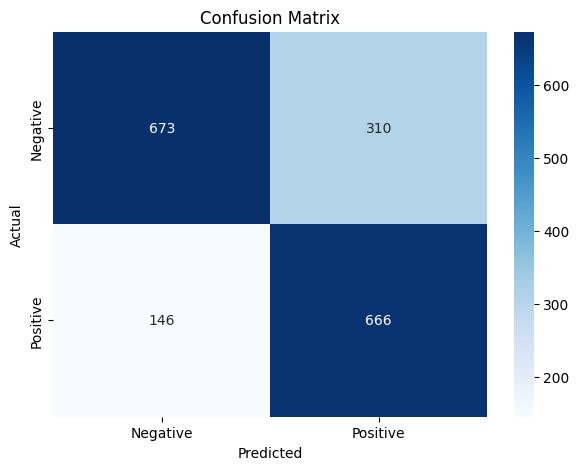

              precision    recall  f1-score   support

           0       0.82      0.68      0.75       983
           1       0.68      0.82      0.74       812

    accuracy                           0.75      1795
   macro avg       0.75      0.75      0.75      1795
weighted avg       0.76      0.75      0.75      1795



In [ ]:
# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred)

# Print classification report
print(classification_report(y_true, y_pred))



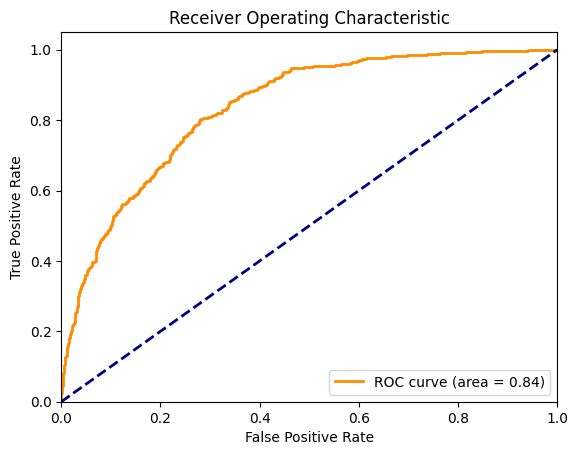

In [ ]:
# Plot ROC Curve
plot_roc_curve(y_true, y_pred_proba)


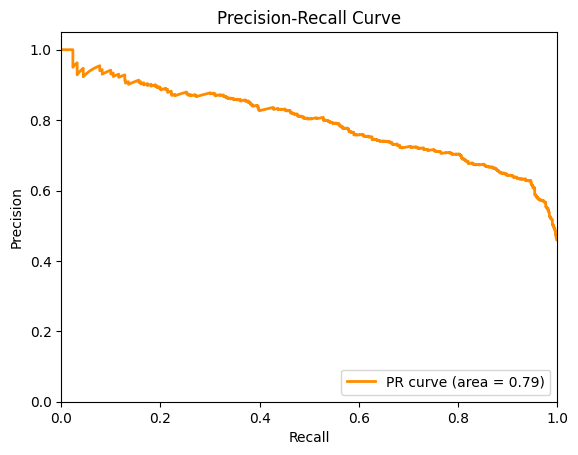

In [ ]:

# Plot Precision-Recall Curve
plot_precision_recall_curve(y_true, y_pred_proba)


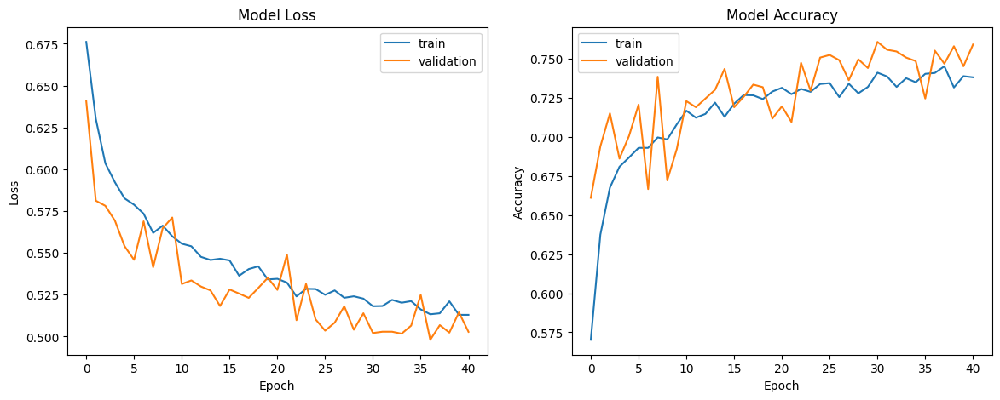

In [ ]:

# Plot training history (accuracy and loss)
plot_metrics(history)

Matthews Correlation Coefficient (MCC): 0.5045

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.68      0.75       983
           1       0.68      0.82      0.74       812

    accuracy                           0.75      1795
   macro avg       0.75      0.75      0.75      1795
weighted avg       0.76      0.75      0.75      1795



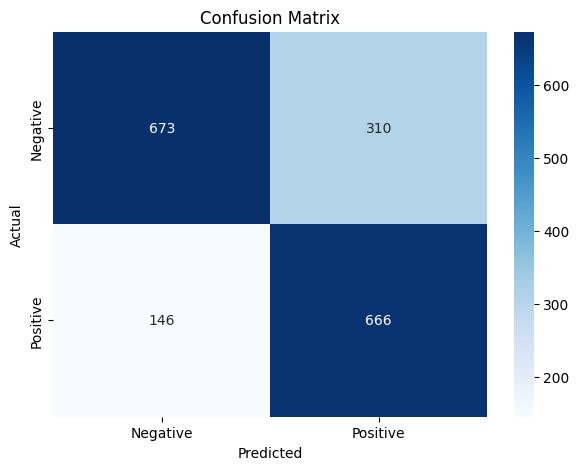

              precision    recall  f1-score   support

           0       0.82      0.68      0.75       983
           1       0.68      0.82      0.74       812

    accuracy                           0.75      1795
   macro avg       0.75      0.75      0.75      1795
weighted avg       0.76      0.75      0.75      1795


Matthews Correlation Coefficient (MCC): 0.5045


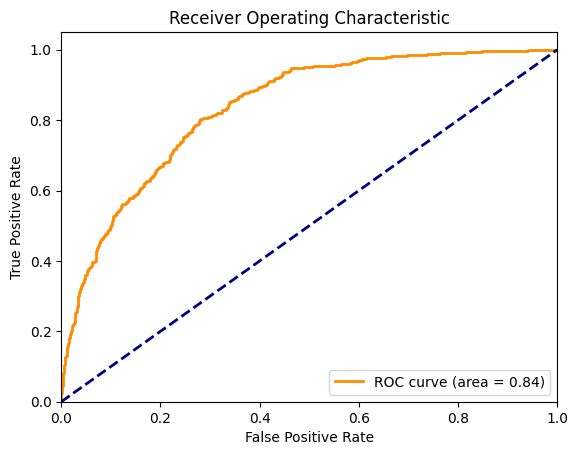

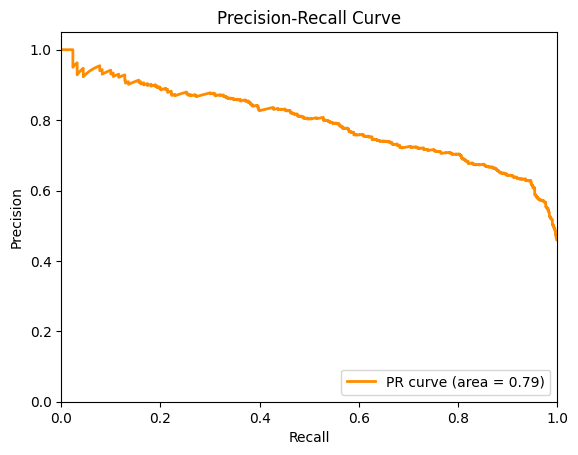

In [ ]:
from sklearn.metrics import matthews_corrcoef, classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the MCC value
mcc = matthews_corrcoef(y_true, y_pred)
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

# Display other classification metrics (optional)
print("\nClassification Report:")
print(classification_report(y_true, y_pred))

# Plot confusion matrix
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
    plt.show()

# Plot ROC curve
def plot_roc_curve(y_true, y_pred_proba):
    fpr, tpr, _ = roc_curve(y_true, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Plot Precision-Recall curve
def plot_precision_recall_curve(y_true, y_pred_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_pred_proba)
    pr_auc = auc(recall, precision)

    plt.figure()
    plt.plot(recall, precision, color='darkorange', lw=2, label='PR curve (area = %0.2f)' % pr_auc)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc="lower right")
    plt.show()

# Example usage after the classification task
# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred)

# Print classification report and MCC value
print(classification_report(y_true, y_pred))
print(f"\nMatthews Correlation Coefficient (MCC): {mcc:.4f}")

# Plot ROC Curve
plot_roc_curve(y_true, y_pred_proba)

# Plot Precision-Recall curve
plot_precision_recall_curve(y_true, y_pred_proba)


In [ ]:
print(f"\nMatthews Correlation Coefficient (MCC): {mcc:.4f}")


Matthews Correlation Coefficient (MCC): 0.5045


Cluster Distribution:
Cluster 0: 258140 nodes
Cluster 1: 118430 nodes
Cluster 2: 16429 nodes
Cluster 3: 66025 nodes
Cluster 4: 36870 nodes


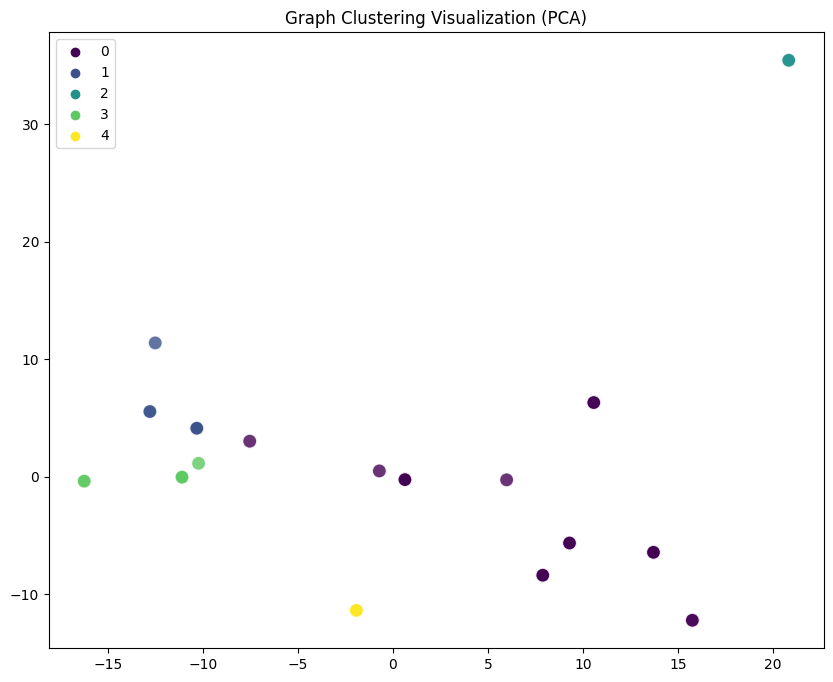

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

class HyperGraphClustering:
    def __init__(self, n_clusters=5):
        self.n_clusters = n_clusters

    def apply_kmeans(self, node_features):
        """
        Apply KMeans clustering on node features.

        Args:
        - node_features: The features of the graph nodes.

        Returns:
        - clusters: An array of cluster labels assigned to each node.
        """
        kmeans = KMeans(n_clusters=self.n_clusters)
        clusters = kmeans.fit_predict(node_features)
        return clusters

    def analyze_clusters(self, clusters):
        """
        Analyze the clusters by showing the number of nodes in each cluster.

        Args:
        - clusters: Cluster labels assigned to each node.
        """
        unique, counts = np.unique(clusters, return_counts=True)
        cluster_info = dict(zip(unique, counts))
        print("Cluster Distribution:")
        for cluster_id, size in cluster_info.items():
            print(f"Cluster {cluster_id}: {size} nodes")

    def visualize_clusters(self, graph, clusters):
        """
        Visualize the clusters in a 2D space (using PCA for dimensionality reduction).

        Args:
        - graph: The input hypergraph (StellarGraph object).
        - clusters: Cluster labels assigned to each node.
        """
        node_features = graph.node_features()
        pca = PCA(n_components=2)
        reduced_features = pca.fit_transform(node_features)

        plt.figure(figsize=(10, 8))
        sns.scatterplot(
            x=reduced_features[:, 0],
            y=reduced_features[:, 1],
            hue=clusters,
            palette="viridis",
            s=100,
            alpha=0.8
        )
        plt.title("Graph Clustering Visualization (PCA)")
        plt.show()

# Example usage with your hypergraph:

# Initialize the clustering model
n_clusters = 5
graph_clustering = HyperGraphClustering(n_clusters=n_clusters)

# Get node features from the graph
node_features = [graph.node_features() for graph in graphs]  # Assuming a list of graphs

# Flatten node features for all graphs
node_features = np.vstack(node_features)

# Step 2: Apply KMeans Clustering on Node Features
clusters = graph_clustering.apply_kmeans(node_features)

# Step 3: Analyze the Clusters
graph_clustering.analyze_clusters(clusters)

# Step 4: Visualize the Clusters (optional, for a single graph)
# You can pass one of the graphs and the cluster labels
graph_clustering.visualize_clusters(graphs[0], clusters[:len(graphs[0].nodes())])


Cluster Distribution:
Cluster 0: 100022 nodes
Cluster 1: 110829 nodes
Cluster 2: 36870 nodes
Cluster 3: 231744 nodes
Cluster 4: 16429 nodes


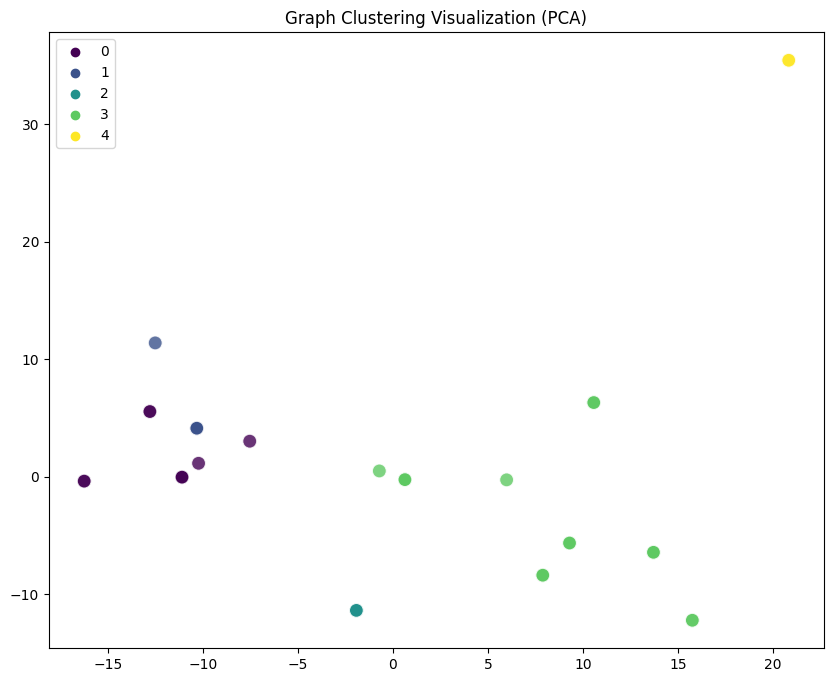

In [ ]:
# Create the hypergraphs using the existing workflow
# graphs, graph_labels = HyperGraph_Constructor_DHT_Cluster.entrance(ori_train, after_pca, hla_dic, dic_inventory, n_clusters=5)

# Initialize the clustering class
graph_clustering = HyperGraphClustering(n_clusters=5)

# Get node features for all graphs (assuming each graph has node features)
node_features = [graph.node_features() for graph in graphs]

# Flatten node features for all graphs
node_features = np.vstack(node_features)

# Apply KMeans clustering to the node features
clusters = graph_clustering.apply_kmeans(node_features)

# Analyze the clusters (print number of nodes in each cluster)
graph_clustering.analyze_clusters(clusters)

# Visualize the clusters for a single graph (optional)
graph_clustering.visualize_clusters(graphs[0], clusters[:len(graphs[0].nodes())])


In [ ]:
# Validation on external dataset Dengue

In [ ]:
# ori_train = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\remove0123_sample100.csv')
ori_train_Dengue = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\dengue_test.csv')
ori_train_Dengue_bk = ori_train_Dengue
hla = pd.read_csv('D:\\PhD\\GraphImmuno_NewResults\\data\\hla2paratopeTable_aligned.txt',sep='\t')
after_pca = np.loadtxt('D:\\PhD\\GraphImmuno_NewResults\\data\\after_pca.txt')

hla_dic = hla_df_to_dic(hla)
inventory = list(hla_dic.keys())
dic_inventory = dict_inventory(inventory)

# ori_train['immunogenicity'], ori_train['potential'] = ori_train_external['potential'], ori_train_external['immunogenicity']

In [ ]:
# Create graphs and labels using the new HyperGraph_Constructor
#graphs, graph_labels = HyperGraph_Constructor_DHT.entrance(ori_train, after_pca, hla_dic, dic_inventory)
#graphs, graph_labels = HyperGraph_Constructor_DHT_HyperDrop.entrance(ori_train, after_pca, hla_dic, dic_inventory, top_k=0.5)
external_graphs, external_graph_labels = HyperGraph_Constructor_DHT_Cluster.entrance(ori_train_Dengue, after_pca, hla_dic, dic_inventory, n_clusters=5)

# Initialize the generator for dual hypergraphs
generator = PaddedGraphGenerator(graphs=graphs)

Processing sample 1/408
Processing sample 2/408
Processing sample 3/408
Processing sample 4/408
Processing sample 5/408
Processing sample 6/408
Processing sample 7/408
Processing sample 8/408
Processing sample 9/408
Processing sample 10/408
Processing sample 11/408
Processing sample 12/408
Processing sample 13/408
Processing sample 14/408
Processing sample 15/408
Processing sample 16/408
Processing sample 17/408
Processing sample 18/408
Processing sample 19/408
Processing sample 20/408
Processing sample 21/408
Processing sample 22/408
Processing sample 23/408
Processing sample 24/408
Processing sample 25/408
Processing sample 26/408
Processing sample 27/408
Processing sample 28/408
Processing sample 29/408
Processing sample 30/408
Processing sample 31/408
Processing sample 32/408
Processing sample 33/408
Processing sample 34/408
Processing sample 35/408
Processing sample 36/408
Processing sample 37/408
Processing sample 38/408
Processing sample 39/408
Processing sample 40/408
Processin

Processing sample 321/408
Processing sample 322/408
Processing sample 323/408
Processing sample 324/408
Processing sample 325/408
Processing sample 326/408
Processing sample 327/408
Processing sample 328/408
Processing sample 329/408
Processing sample 330/408
Processing sample 331/408
Processing sample 332/408
Processing sample 333/408
Processing sample 334/408
Processing sample 335/408
Processing sample 336/408
Processing sample 337/408
Processing sample 338/408
Processing sample 339/408
Processing sample 340/408
Processing sample 341/408
Processing sample 342/408
Processing sample 343/408
Processing sample 344/408
Processing sample 345/408
Processing sample 346/408
Processing sample 347/408
Processing sample 348/408
Processing sample 349/408
Processing sample 350/408
Processing sample 351/408
Processing sample 352/408
Processing sample 353/408
Processing sample 354/408
Processing sample 355/408
Processing sample 356/408
Processing sample 357/408
Processing sample 358/408
Processing s

In [ ]:
# graph_labels = pd.get_dummies(graph_labels, drop_first=True)
# ori_train1 = ori_train
# ori_train1.loc[ori_train1["potential"] != "Negative", "potential"] = 'Positive'
# ori_train1['potential'] = ori_train1['potential'].astype('category')
# ori_train1['potential'] = pd.factorize(ori_train1['potential'])[0]
graph_labels = ori_train_Dengue['immunogenicity']
graph_labels.value_counts().to_frame()

,immunogenicity
1,408


In [ ]:
len(external_graph_labels)

408

In [ ]:
# ori_train_Dengue

In [ ]:
# ori_train_Dengue_bk['immunogenicity']

In [ ]:
assert len(external_graphs) == len(external_graph_labels), "Mismatch in number of graphs and labels."

9/9 [==============================] - 0s 7ms/step
Optimal Threshold: 0.0579
Cannot compute ROC AUC or PR AUC - only one class present in y_true.
Cannot compute Matthews Correlation Coefficient (MCC) - only one class present in y_true.
Accuracy on External Data: 0.9975

Classification Report on External Data:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      1.00      1.00       408

    accuracy                           1.00       408
   macro avg       0.50      0.50      0.50       408
weighted avg       1.00      1.00      1.00       408



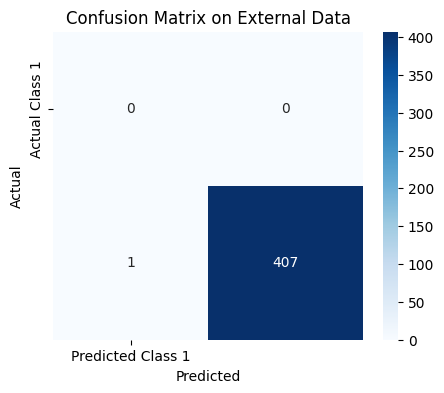

C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_ranking.py:992: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning,


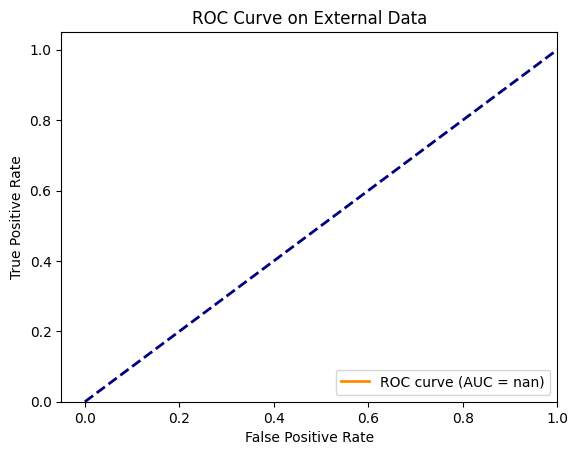

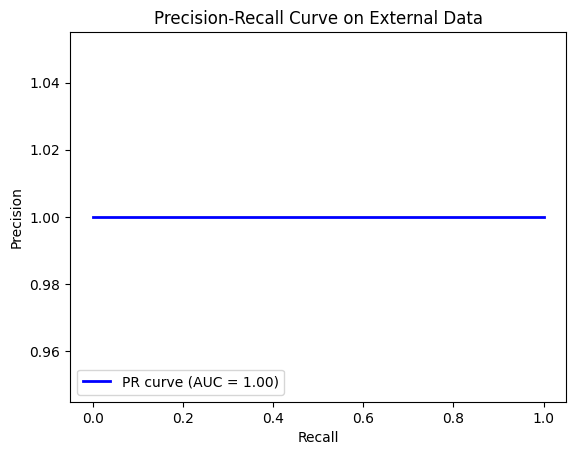

In [ ]:
# Step 1: Load external datasets
from stellargraph import StellarGraph
import pandas as pd
import numpy as np

# Ensure data integrity
assert len(external_graphs) == len(external_graph_labels), "Mismatch in graphs and labels."

# Step 2: Preprocess external graphs (if necessary)
node_feature_size = graphs[0].node_features().shape[1]

def preprocess_graph(graph):
    features = graph.node_features()
    if features.shape[1] != node_feature_size:
        padded_features = np.zeros((features.shape[0], node_feature_size))
        padded_features[:, :features.shape[1]] = features
        graph = StellarGraph(graph.to_networkx(), node_features=padded_features)
    return graph

external_graphs = [preprocess_graph(g) for g in external_graphs]

# Step 3: Create data generators
from stellargraph.mapper import PaddedGraphGenerator

external_generator = PaddedGraphGenerator(graphs=external_graphs)
external_index = np.arange(len(external_graphs))

external_gen = external_generator.flow(
    external_index,
    targets=external_graph_labels.values,
    batch_size=50,
    symmetric_normalization=False,
)

# Step 4: Predict on external data
external_predictions_proba = model.predict(external_gen).ravel()

# Adjust the threshold based on precision-recall curve
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(external_graph_labels.values, external_predictions_proba)
f1_scores = 2 * (precision * recall) / (precision + recall)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal Threshold: {optimal_threshold:.4f}")

# Apply the optimal threshold
external_predictions = (external_predictions_proba > optimal_threshold).astype(int)

# Step 5: Compute and display metrics
# Step 5: Compute and display metrics
from sklearn.metrics import accuracy_score, matthews_corrcoef, roc_auc_score, average_precision_score

external_y_true = external_graph_labels.values

# Check if more than one class is present
unique_classes = np.unique(external_y_true)
if len(unique_classes) > 1:
    # Compute ROC AUC and PR AUC
    external_roc_auc = roc_auc_score(external_y_true, external_predictions_proba)
    external_pr_auc = average_precision_score(external_y_true, external_predictions_proba)
else:
    external_roc_auc = None
    external_pr_auc = None
    print("Cannot compute ROC AUC or PR AUC - only one class present in y_true.")

# Compute other metrics
external_accuracy = accuracy_score(external_y_true, external_predictions)

# Handle MCC similarly
if len(unique_classes) > 1:
    external_mcc = matthews_corrcoef(external_y_true, external_predictions)
else:
    external_mcc = None
    print("Cannot compute Matthews Correlation Coefficient (MCC) - only one class present in y_true.")

print(f"Accuracy on External Data: {external_accuracy:.4f}")
if external_mcc is not None:
    print(f"Matthews Correlation Coefficient (MCC): {external_mcc:.4f}")
if external_roc_auc is not None:
    print(f"ROC AUC Score: {external_roc_auc:.4f}")
if external_pr_auc is not None:
    print(f"Precision-Recall AUC: {external_pr_auc:.4f}")

# Classification report
print("\nClassification Report on External Data:")
print(classification_report(external_y_true, external_predictions, zero_division=0))

# Proceed with confusion matrix and other available metrics
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=['Predicted Class 1'],
        yticklabels=['Actual Class 1']
    )
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix on External Data')
    plt.show()

# Plot the confusion matrix
plot_confusion_matrix(external_y_true, external_predictions)


# Plot ROC Curve
def plot_roc_curve(y_true, y_proba):
    from sklearn.metrics import roc_curve, auc
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve on External Data')
    plt.legend(loc='lower right')
    plt.show()

plot_roc_curve(external_y_true, external_predictions_proba)

# Plot Precision-Recall Curve
def plot_precision_recall_curve(y_true, y_proba):
    from sklearn.metrics import precision_recall_curve, auc
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    pr_auc = auc(recall, precision)

    plt.figure()
    plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (AUC = {pr_auc:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve on External Data')
    plt.legend(loc='lower left')
    plt.show()

plot_precision_recall_curve(external_y_true, external_predictions_proba)


In [ ]:
#Cell data check

In [ ]:

# ori_train = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\remove0123_sample100.csv')
ori_train_Dengue = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\deephlapan_result_cell.csv')
ori_train_Dengue_bk = ori_train_Dengue
hla = pd.read_csv('D:\\PhD\\GraphImmuno_NewResults\\data\\hla2paratopeTable_aligned.txt',sep='\t')
after_pca = np.loadtxt('D:\\PhD\\GraphImmuno_NewResults\\data\\after_pca.txt')

hla_dic = hla_df_to_dic(hla)
inventory = list(hla_dic.keys())
dic_inventory = dict_inventory(inventory)

# ori_train['immunogenicity'], ori_train['potential'] = ori_train_external['potential'], ori_train_external['immunogenicity']

# Create graphs and labels using the new HyperGraph_Constructor
#graphs, graph_labels = HyperGraph_Constructor_DHT.entrance(ori_train, after_pca, hla_dic, dic_inventory)
#graphs, graph_labels = HyperGraph_Constructor_DHT_HyperDrop.entrance(ori_train, after_pca, hla_dic, dic_inventory, top_k=0.5)
external_graphs, external_graph_labels = HyperGraph_Constructor_DHT_Cluster.entrance(ori_train_Dengue, after_pca, hla_dic, dic_inventory, n_clusters=5)

# Initialize the generator for dual hypergraphs
generator = PaddedGraphGenerator(graphs=graphs)

count_graph_labels = ori_train_Dengue['immunogenicity']
count_graph_labels.value_counts().to_frame()

assert len(external_graphs) == len(external_graph_labels), "Mismatch in number of graphs and labels."

Processing sample 1/522
Processing sample 2/522
Processing sample 3/522
Processing sample 4/522
Processing sample 5/522
Processing sample 6/522
Processing sample 7/522
Processing sample 8/522
Processing sample 9/522
Processing sample 10/522
Processing sample 11/522
Processing sample 12/522
Processing sample 13/522
Processing sample 14/522
Processing sample 15/522
Processing sample 16/522
Processing sample 17/522
Processing sample 18/522
Processing sample 19/522
Processing sample 20/522
Processing sample 21/522
Processing sample 22/522
Processing sample 23/522
Processing sample 24/522
Processing sample 25/522
Processing sample 26/522
Processing sample 27/522
Processing sample 28/522
Processing sample 29/522
Processing sample 30/522
Processing sample 31/522
Processing sample 32/522
Processing sample 33/522
Processing sample 34/522
Processing sample 35/522
Processing sample 36/522
Processing sample 37/522
Processing sample 38/522
Processing sample 39/522
Processing sample 40/522
Processin

Processing sample 321/522
Processing sample 322/522
Processing sample 323/522
Processing sample 324/522
Processing sample 325/522
Processing sample 326/522
Processing sample 327/522
Processing sample 328/522
Processing sample 329/522
Processing sample 330/522
Processing sample 331/522
Processing sample 332/522
Processing sample 333/522
Processing sample 334/522
Processing sample 335/522
Processing sample 336/522
Processing sample 337/522
Processing sample 338/522
Processing sample 339/522
Processing sample 340/522
Processing sample 341/522
Processing sample 342/522
Processing sample 343/522
Processing sample 344/522
Processing sample 345/522
Processing sample 346/522
Processing sample 347/522
Processing sample 348/522
Processing sample 349/522
Processing sample 350/522
Processing sample 351/522
Processing sample 352/522
Processing sample 353/522
Processing sample 354/522
Processing sample 355/522
Processing sample 356/522
Processing sample 357/522
Processing sample 358/522
Processing s

11/11 [==============================] - 0s 6ms/step
Optimal Threshold: 0.9777
Accuracy on External Data: 0.9330
Matthews Correlation Coefficient (MCC): 0.0000
ROC AUC Score: 0.5590
Precision-Recall AUC: 0.1076

Classification Report on External Data:
              precision    recall  f1-score   support

           0       0.93      1.00      0.97       487
           1       0.00      0.00      0.00        35

    accuracy                           0.93       522
   macro avg       0.47      0.50      0.48       522
weighted avg       0.87      0.93      0.90       522



C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted sampl

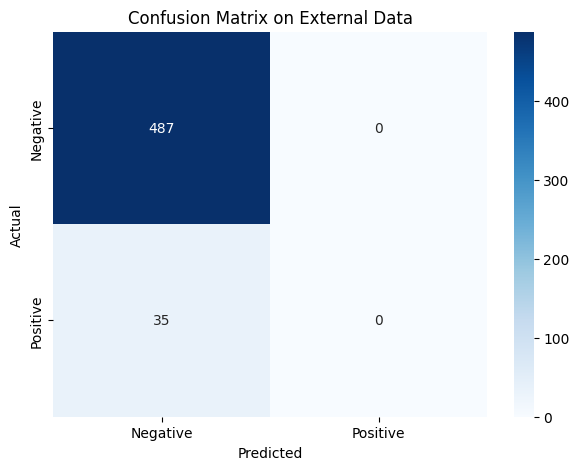

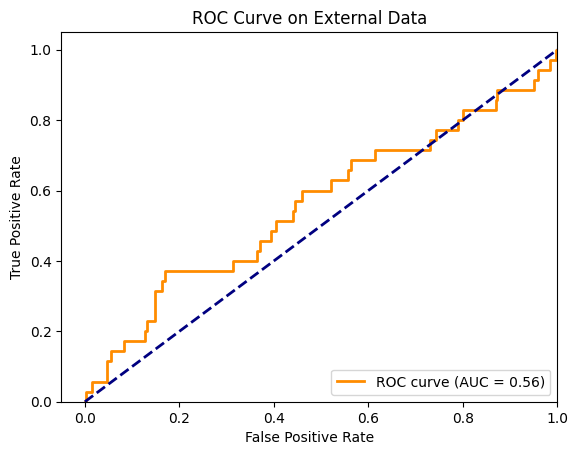

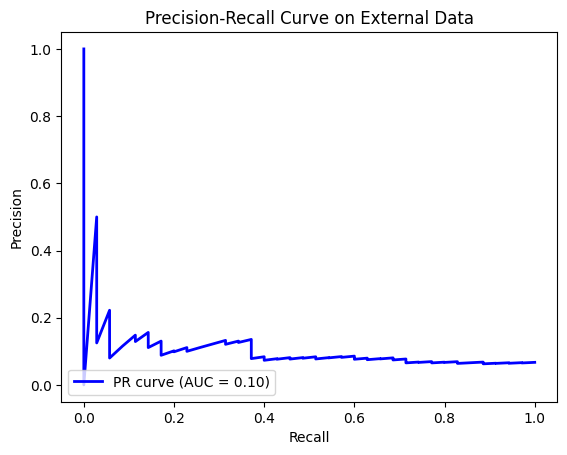

In [ ]:
# Step 1: Load external datasets
from stellargraph import StellarGraph
import pandas as pd
import numpy as np

# Ensure data integrity
assert len(external_graphs) == len(external_graph_labels), "Mismatch in graphs and labels."

# Step 2: Preprocess external graphs (if necessary)
node_feature_size = graphs[0].node_features().shape[1]

def preprocess_graph(graph):
    features = graph.node_features()
    if features.shape[1] != node_feature_size:
        padded_features = np.zeros((features.shape[0], node_feature_size))
        padded_features[:, :features.shape[1]] = features
        graph = StellarGraph(graph.to_networkx(), node_features=padded_features)
    return graph

external_graphs = [preprocess_graph(g) for g in external_graphs]

# Step 3: Create data generators
from stellargraph.mapper import PaddedGraphGenerator

external_generator = PaddedGraphGenerator(graphs=external_graphs)
external_index = np.arange(len(external_graphs))

external_gen = external_generator.flow(
    external_index,
    targets=external_graph_labels.values,
    batch_size=50,
    symmetric_normalization=False,
)

# Step 4: Predict on external data
external_predictions_proba = model.predict(external_gen).ravel()

# Adjust the threshold based on precision-recall curve
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(external_graph_labels.values, external_predictions_proba)
f1_scores = 2 * (precision * recall) / (precision + recall)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal Threshold: {optimal_threshold:.4f}")

# Apply the optimal threshold
external_predictions = (external_predictions_proba > optimal_threshold).astype(int)

# Step 5: Compute and display metrics
from sklearn.metrics import accuracy_score, matthews_corrcoef, roc_auc_score, average_precision_score

external_y_true = external_graph_labels.values
external_accuracy = accuracy_score(external_y_true, external_predictions)
external_mcc = matthews_corrcoef(external_y_true, external_predictions)
external_roc_auc = roc_auc_score(external_y_true, external_predictions_proba)
external_pr_auc = average_precision_score(external_y_true, external_predictions_proba)

print(f"Accuracy on External Data: {external_accuracy:.4f}")
print(f"Matthews Correlation Coefficient (MCC): {external_mcc:.4f}")
print(f"ROC AUC Score: {external_roc_auc:.4f}")
print(f"Precision-Recall AUC: {external_pr_auc:.4f}")

# Step 6: Additional metrics and visualization
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

print("\nClassification Report on External Data:")
print(classification_report(external_y_true, external_predictions))

def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=['Negative', 'Positive'],
        yticklabels=['Negative', 'Positive']
    )
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix on External Data')
    plt.show()

# Plot the confusion matrix
plot_confusion_matrix(external_y_true, external_predictions)

# Plot ROC Curve
def plot_roc_curve(y_true, y_proba):
    from sklearn.metrics import roc_curve, auc
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve on External Data')
    plt.legend(loc='lower right')
    plt.show()

plot_roc_curve(external_y_true, external_predictions_proba)

# Plot Precision-Recall Curve
def plot_precision_recall_curve(y_true, y_proba):
    from sklearn.metrics import precision_recall_curve, auc
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    pr_auc = auc(recall, precision)

    plt.figure()
    plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (AUC = {pr_auc:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve on External Data')
    plt.legend(loc='lower left')
    plt.show()

plot_precision_recall_curve(external_y_true, external_predictions_proba)


In [ ]:
# Covid convalescent

In [ ]:

# ori_train = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\remove0123_sample100.csv')
ori_train_Dengue = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\sars_cov_2_result.csv')
ori_train_Dengue_bk = ori_train_Dengue
hla = pd.read_csv('D:\\PhD\\GraphImmuno_NewResults\\data\\hla2paratopeTable_aligned.txt',sep='\t')
after_pca = np.loadtxt('D:\\PhD\\GraphImmuno_NewResults\\data\\after_pca.txt')

hla_dic = hla_df_to_dic(hla)
inventory = list(hla_dic.keys())
dic_inventory = dict_inventory(inventory)

ori_train_Dengue['immunogenicity'] = ori_train_Dengue['immunogenicity-con']

# ori_train['immunogenicity'], ori_train['potential'] = ori_train_external['potential'], ori_train_external['immunogenicity']

# Create graphs and labels using the new HyperGraph_Constructor
#graphs, graph_labels = HyperGraph_Constructor_DHT.entrance(ori_train, after_pca, hla_dic, dic_inventory)
#graphs, graph_labels = HyperGraph_Constructor_DHT_HyperDrop.entrance(ori_train, after_pca, hla_dic, dic_inventory, top_k=0.5)
external_graphs, external_graph_labels = HyperGraph_Constructor_DHT_Cluster.entrance(ori_train_Dengue, after_pca, hla_dic, dic_inventory, n_clusters=5)

# Initialize the generator for dual hypergraphs
generator = PaddedGraphGenerator(graphs=graphs)

count_graph_labels = ori_train_Dengue['immunogenicity']
count_graph_labels.value_counts().to_frame()

assert len(external_graphs) == len(external_graph_labels), "Mismatch in number of graphs and labels."

Processing sample 1/92
Processing sample 2/92
Processing sample 3/92
Processing sample 4/92
Processing sample 5/92
Processing sample 6/92
Processing sample 7/92
Processing sample 8/92
Processing sample 9/92
Processing sample 10/92
Processing sample 11/92
Processing sample 12/92
Processing sample 13/92
Processing sample 14/92
Processing sample 15/92
Processing sample 16/92
Processing sample 17/92
Processing sample 18/92
Processing sample 19/92
Processing sample 20/92
Processing sample 21/92
Processing sample 22/92
Processing sample 23/92
Processing sample 24/92
Processing sample 25/92
Processing sample 26/92
Processing sample 27/92
Processing sample 28/92
Processing sample 29/92
Processing sample 30/92
Processing sample 31/92
Processing sample 32/92
Processing sample 33/92
Processing sample 34/92
Processing sample 35/92
Processing sample 36/92
Processing sample 37/92
Processing sample 38/92
Processing sample 39/92
Processing sample 40/92
Processing sample 41/92
Processing sample 42/92
P

2/2 [==============================] - 0s 5ms/step
Accuracy on External Data: 0.3370
Matthews Correlation Coefficient (MCC) on External Data: -0.1801

Classification Report on External Data:
              precision    recall  f1-score   support

           0       0.61      0.25      0.36        67
           1       0.22      0.56      0.31        25

    accuracy                           0.34        92
   macro avg       0.41      0.41      0.34        92
weighted avg       0.50      0.34      0.35        92



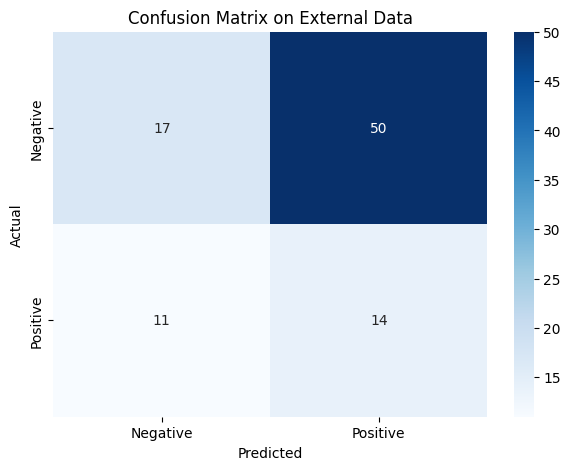

In [ ]:
# Step 1: Load external datasets
from stellargraph import StellarGraph
import pandas as pd
import numpy as np

# Ensure data integrity
assert len(external_graphs) == len(external_graph_labels), "Mismatch in graphs and labels."

# Step 2: Preprocess external graphs (if necessary)
# Example preprocessing (ensure node features have the correct size)
node_feature_size = graphs[0].node_features().shape[1]

def preprocess_graph(graph):
    features = graph.node_features()
    if features.shape[1] != node_feature_size:
        padded_features = np.zeros((features.shape[0], node_feature_size))
        padded_features[:, :features.shape[1]] = features
        graph = StellarGraph(graph.to_networkx(), node_features=padded_features)
    return graph

external_graphs = [preprocess_graph(g) for g in external_graphs]

# Step 3: Create data generators
from stellargraph.mapper import PaddedGraphGenerator

external_generator = PaddedGraphGenerator(graphs=external_graphs)
external_index = np.arange(len(external_graphs))

external_gen = external_generator.flow(
    external_index,
    targets=external_graph_labels.values,
    batch_size=50,  # Adjust batch size if needed
    symmetric_normalization=False,
)

# Step 4: Predict on external data
external_predictions_proba = model.predict(external_gen).ravel()
external_predictions = (external_predictions_proba > 0.5).astype(int)

# Step 5: Compute and display metrics
from sklearn.metrics import accuracy_score, matthews_corrcoef

external_y_true = external_graph_labels.values
external_accuracy = accuracy_score(external_y_true, external_predictions)
external_mcc = matthews_corrcoef(external_y_true, external_predictions)

print(f"Accuracy on External Data: {external_accuracy:.4f}")
print(f"Matthews Correlation Coefficient (MCC) on External Data: {external_mcc:.4f}")

# Step 6: Additional metrics and visualization
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

print("\nClassification Report on External Data:")
print(classification_report(external_y_true, external_predictions))

def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=['Negative', 'Positive'],
        yticklabels=['Negative', 'Positive']
    )
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix on External Data')
    plt.show()

# Plot the confusion matrix
plot_confusion_matrix(external_y_true, external_predictions)


2/2 [==============================] - 0s 5ms/step
Optimal Threshold: 0.9079
Accuracy on External Data: 0.7283
Matthews Correlation Coefficient (MCC): 0.0000
ROC AUC Score: 0.3761
Precision-Recall AUC: 0.2414

Classification Report on External Data:
              precision    recall  f1-score   support

           0       0.73      1.00      0.84        67
           1       0.00      0.00      0.00        25

    accuracy                           0.73        92
   macro avg       0.36      0.50      0.42        92
weighted avg       0.53      0.73      0.61        92



C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted sampl

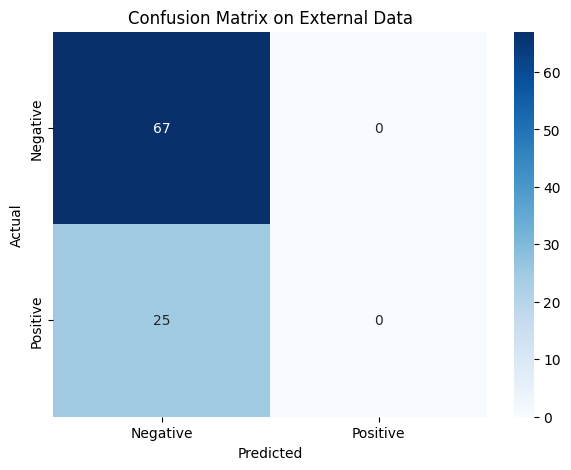

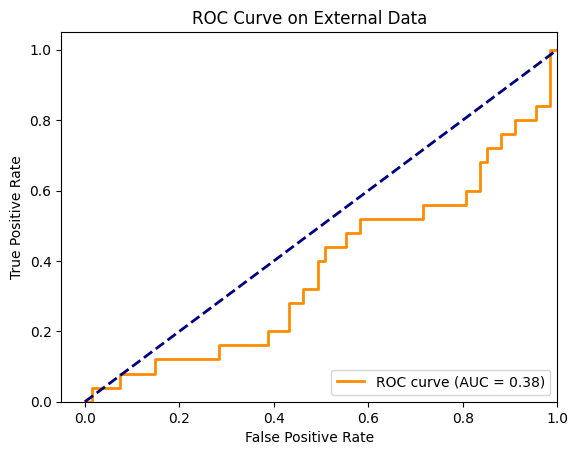

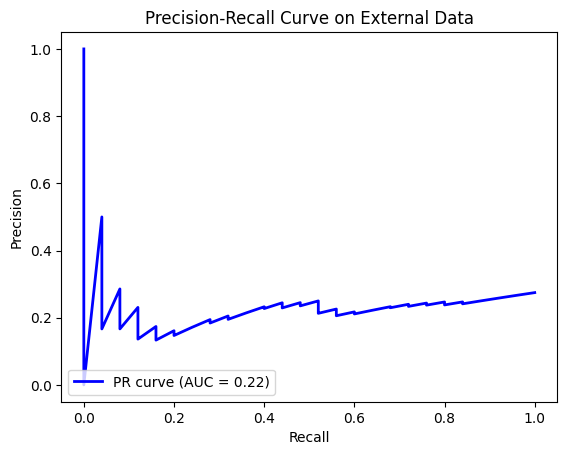

In [ ]:
# Step 1: Load external datasets
from stellargraph import StellarGraph
import pandas as pd
import numpy as np

# Ensure data integrity
assert len(external_graphs) == len(external_graph_labels), "Mismatch in graphs and labels."

# Step 2: Preprocess external graphs (if necessary)
node_feature_size = graphs[0].node_features().shape[1]

def preprocess_graph(graph):
    features = graph.node_features()
    if features.shape[1] != node_feature_size:
        padded_features = np.zeros((features.shape[0], node_feature_size))
        padded_features[:, :features.shape[1]] = features
        graph = StellarGraph(graph.to_networkx(), node_features=padded_features)
    return graph

external_graphs = [preprocess_graph(g) for g in external_graphs]

# Step 3: Create data generators
from stellargraph.mapper import PaddedGraphGenerator

external_generator = PaddedGraphGenerator(graphs=external_graphs)
external_index = np.arange(len(external_graphs))

external_gen = external_generator.flow(
    external_index,
    targets=external_graph_labels.values,
    batch_size=50,
    symmetric_normalization=False,
)

# Step 4: Predict on external data
external_predictions_proba = model.predict(external_gen).ravel()

# Adjust the threshold based on precision-recall curve
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(external_graph_labels.values, external_predictions_proba)
f1_scores = 2 * (precision * recall) / (precision + recall)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal Threshold: {optimal_threshold:.4f}")

# Apply the optimal threshold
external_predictions = (external_predictions_proba > optimal_threshold).astype(int)

# Step 5: Compute and display metrics
from sklearn.metrics import accuracy_score, matthews_corrcoef, roc_auc_score, average_precision_score

external_y_true = external_graph_labels.values
external_accuracy = accuracy_score(external_y_true, external_predictions)
external_mcc = matthews_corrcoef(external_y_true, external_predictions)
external_roc_auc = roc_auc_score(external_y_true, external_predictions_proba)
external_pr_auc = average_precision_score(external_y_true, external_predictions_proba)

print(f"Accuracy on External Data: {external_accuracy:.4f}")
print(f"Matthews Correlation Coefficient (MCC): {external_mcc:.4f}")
print(f"ROC AUC Score: {external_roc_auc:.4f}")
print(f"Precision-Recall AUC: {external_pr_auc:.4f}")

# Step 6: Additional metrics and visualization
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

print("\nClassification Report on External Data:")
print(classification_report(external_y_true, external_predictions))

def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=['Negative', 'Positive'],
        yticklabels=['Negative', 'Positive']
    )
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix on External Data')
    plt.show()

# Plot the confusion matrix
plot_confusion_matrix(external_y_true, external_predictions)

# Plot ROC Curve
def plot_roc_curve(y_true, y_proba):
    from sklearn.metrics import roc_curve, auc
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve on External Data')
    plt.legend(loc='lower right')
    plt.show()

plot_roc_curve(external_y_true, external_predictions_proba)

# Plot Precision-Recall Curve
def plot_precision_recall_curve(y_true, y_proba):
    from sklearn.metrics import precision_recall_curve, auc
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    pr_auc = auc(recall, precision)

    plt.figure()
    plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (AUC = {pr_auc:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve on External Data')
    plt.legend(loc='lower left')
    plt.show()

plot_precision_recall_curve(external_y_true, external_predictions_proba)


In [ ]:
# Covid unexposed

In [ ]:

# ori_train = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\remove0123_sample100.csv')
ori_train_Dengue = pd.read_csv('D:\\PhD\Subgraph_Sampling_SLOT_GNN\\Data\\sars_cov_2_result.csv')
ori_train_Dengue_bk = ori_train_Dengue
hla = pd.read_csv('D:\\PhD\\GraphImmuno_NewResults\\data\\hla2paratopeTable_aligned.txt',sep='\t')
after_pca = np.loadtxt('D:\\PhD\\GraphImmuno_NewResults\\data\\after_pca.txt')

hla_dic = hla_df_to_dic(hla)
inventory = list(hla_dic.keys())
dic_inventory = dict_inventory(inventory)

ori_train_Dengue['immunogenicity'] = ori_train_Dengue['immunogenicity-un']

# ori_train['immunogenicity'], ori_train['potential'] = ori_train_external['potential'], ori_train_external['immunogenicity']

# Create graphs and labels using the new HyperGraph_Constructor
#graphs, graph_labels = HyperGraph_Constructor_DHT.entrance(ori_train, after_pca, hla_dic, dic_inventory)
#graphs, graph_labels = HyperGraph_Constructor_DHT_HyperDrop.entrance(ori_train, after_pca, hla_dic, dic_inventory, top_k=0.5)
external_graphs, external_graph_labels = HyperGraph_Constructor_DHT_Cluster.entrance(ori_train_Dengue, after_pca, hla_dic, dic_inventory, n_clusters=5)

# Initialize the generator for dual hypergraphs
generator = PaddedGraphGenerator(graphs=graphs)

count_graph_labels = ori_train_Dengue['immunogenicity']
count_graph_labels.value_counts().to_frame()

assert len(external_graphs) == len(external_graph_labels), "Mismatch in number of graphs and labels."

Processing sample 1/92
Processing sample 2/92
Processing sample 3/92
Processing sample 4/92
Processing sample 5/92
Processing sample 6/92
Processing sample 7/92
Processing sample 8/92
Processing sample 9/92
Processing sample 10/92
Processing sample 11/92
Processing sample 12/92
Processing sample 13/92
Processing sample 14/92
Processing sample 15/92
Processing sample 16/92
Processing sample 17/92
Processing sample 18/92
Processing sample 19/92
Processing sample 20/92
Processing sample 21/92
Processing sample 22/92
Processing sample 23/92
Processing sample 24/92
Processing sample 25/92
Processing sample 26/92
Processing sample 27/92
Processing sample 28/92
Processing sample 29/92
Processing sample 30/92
Processing sample 31/92
Processing sample 32/92
Processing sample 33/92
Processing sample 34/92
Processing sample 35/92
Processing sample 36/92
Processing sample 37/92
Processing sample 38/92
Processing sample 39/92
Processing sample 40/92
Processing sample 41/92
Processing sample 42/92
P

2/2 [==============================] - 0s 5ms/step
Optimal Threshold: 0.8981
Accuracy on External Data: 0.9130
Matthews Correlation Coefficient (MCC): 0.0000
ROC AUC Score: 0.3824
Precision-Recall AUC: 0.1934

Classification Report on External Data:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        84
           1       0.00      0.00      0.00         8

    accuracy                           0.91        92
   macro avg       0.46      0.50      0.48        92
weighted avg       0.83      0.91      0.87        92



C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


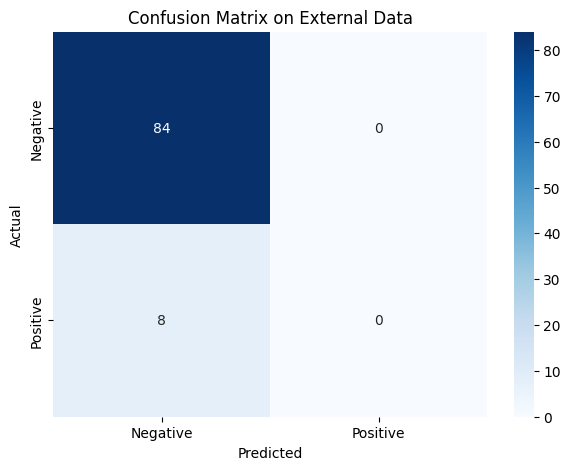

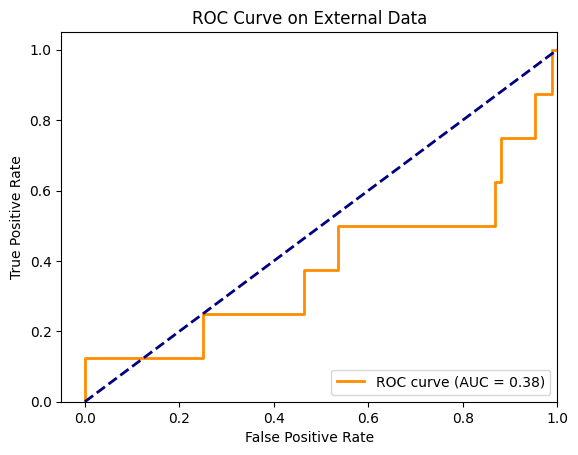

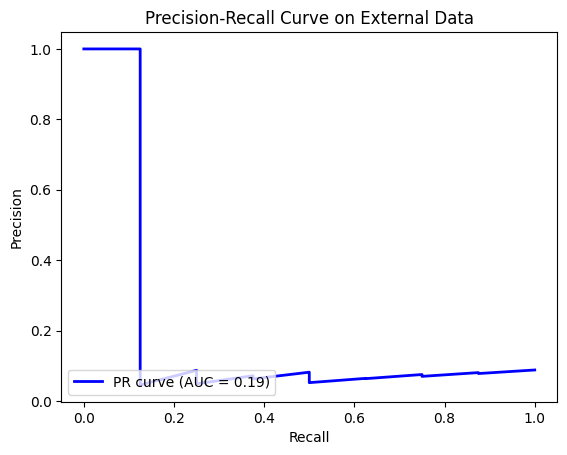

In [ ]:
# Step 1: Load external datasets
from stellargraph import StellarGraph
import pandas as pd
import numpy as np

# Ensure data integrity
assert len(external_graphs) == len(external_graph_labels), "Mismatch in graphs and labels."

# Step 2: Preprocess external graphs (if necessary)
node_feature_size = graphs[0].node_features().shape[1]

def preprocess_graph(graph):
    features = graph.node_features()
    if features.shape[1] != node_feature_size:
        padded_features = np.zeros((features.shape[0], node_feature_size))
        padded_features[:, :features.shape[1]] = features
        graph = StellarGraph(graph.to_networkx(), node_features=padded_features)
    return graph

external_graphs = [preprocess_graph(g) for g in external_graphs]

# Step 3: Create data generators
from stellargraph.mapper import PaddedGraphGenerator

external_generator = PaddedGraphGenerator(graphs=external_graphs)
external_index = np.arange(len(external_graphs))

external_gen = external_generator.flow(
    external_index,
    targets=external_graph_labels.values,
    batch_size=50,
    symmetric_normalization=False,
)

# Step 4: Predict on external data
external_predictions_proba = model.predict(external_gen).ravel()

# Adjust the threshold based on precision-recall curve
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(external_graph_labels.values, external_predictions_proba)
f1_scores = 2 * (precision * recall) / (precision + recall)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal Threshold: {optimal_threshold:.4f}")

# Apply the optimal threshold
external_predictions = (external_predictions_proba > optimal_threshold).astype(int)

# Step 5: Compute and display metrics
from sklearn.metrics import accuracy_score, matthews_corrcoef, roc_auc_score, average_precision_score

external_y_true = external_graph_labels.values
external_accuracy = accuracy_score(external_y_true, external_predictions)
external_mcc = matthews_corrcoef(external_y_true, external_predictions)
external_roc_auc = roc_auc_score(external_y_true, external_predictions_proba)
external_pr_auc = average_precision_score(external_y_true, external_predictions_proba)

print(f"Accuracy on External Data: {external_accuracy:.4f}")
print(f"Matthews Correlation Coefficient (MCC): {external_mcc:.4f}")
print(f"ROC AUC Score: {external_roc_auc:.4f}")
print(f"Precision-Recall AUC: {external_pr_auc:.4f}")

# Step 6: Additional metrics and visualization
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

print("\nClassification Report on External Data:")
print(classification_report(external_y_true, external_predictions))

def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=['Negative', 'Positive'],
        yticklabels=['Negative', 'Positive']
    )
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix on External Data')
    plt.show()

# Plot the confusion matrix
plot_confusion_matrix(external_y_true, external_predictions)

# Plot ROC Curve
def plot_roc_curve(y_true, y_proba):
    from sklearn.metrics import roc_curve, auc
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve on External Data')
    plt.legend(loc='lower right')
    plt.show()

plot_roc_curve(external_y_true, external_predictions_proba)

# Plot Precision-Recall Curve
def plot_precision_recall_curve(y_true, y_proba):
    from sklearn.metrics import precision_recall_curve, auc
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    pr_auc = auc(recall, precision)

    plt.figure()
    plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (AUC = {pr_auc:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve on External Data')
    plt.legend(loc='lower left')
    plt.show()

plot_precision_recall_curve(external_y_true, external_predictions_proba)


In [ ]:
type(graphs[0])

stellargraph.core.graph.StellarGraph

In [ ]:
# Unsupervised Learning

In [ ]:
!pip install graph2vec

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for graph2vec: filename=graph2vec-0.0.2-py3-none-any.whl size=4975 sha256=9f869e4652ccd065cdd75b60d3b8dfdb429c404ff2b539438b72eb26cfe2350b
  Stored in directory: c:\users\malli\appdata\local\pip\cache\wheels\99\55\df\b14c2fb8237cb1ba0af160aa08c910fb8da02e11d3c1e3ec93
Successfully built graph2vec


In [ ]:
!pip install karateclub

  Using cached karateclub-1.3.3-py3-none-any.whl
  Using cached tqdm-4.66.5-py3-none-any.whl (78 kB)
  Using cached python_louvain-0.16-py3-none-any.whl
  Using cached PyGSP-0.5.1-py2.py3-none-any.whl (1.8 MB)
  Using cached decorator-4.4.2-py2.py3-none-any.whl (9.2 kB)
     -------------------------------------- 101.6/101.6 kB 5.7 MB/s eta 0:00:00
     ---------------------------------------- 1.8/1.8 MB 28.7 MB/s eta 0:00:00
  Attempting uninstall: decorator
    Found existing installation: decorator 5.1.1
    Uninstalling decorator-5.1.1:
      Successfully uninstalled decorator-5.1.1


Fitting Graph2Vec model...
Cluster Distribution:
Cluster 0: 2799 graphs
Cluster 1: 2319 graphs
Cluster 2: 1561 graphs
Cluster 3: 1724 graphs
Cluster 4: 568 graphs


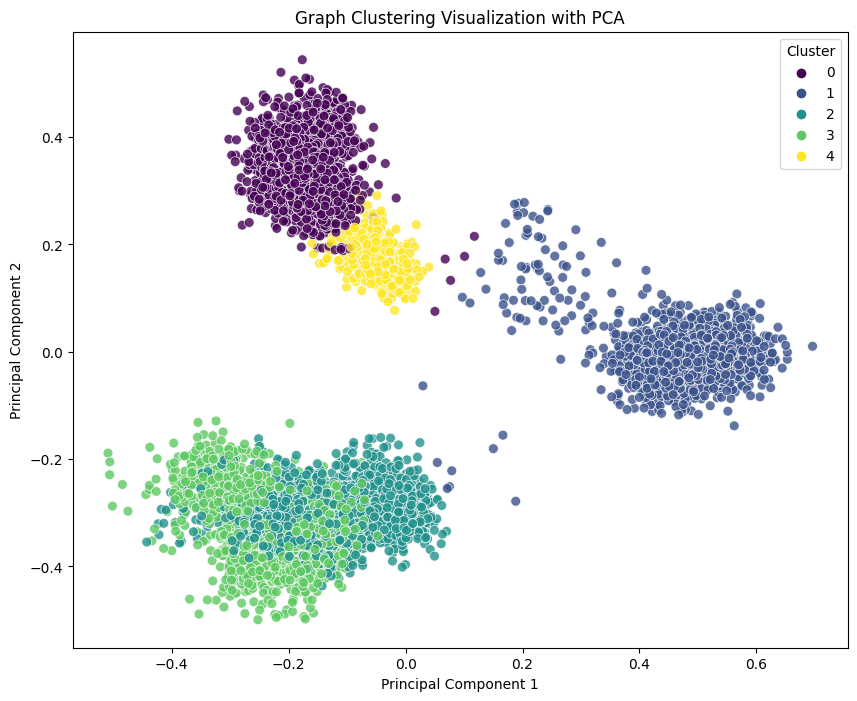

C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


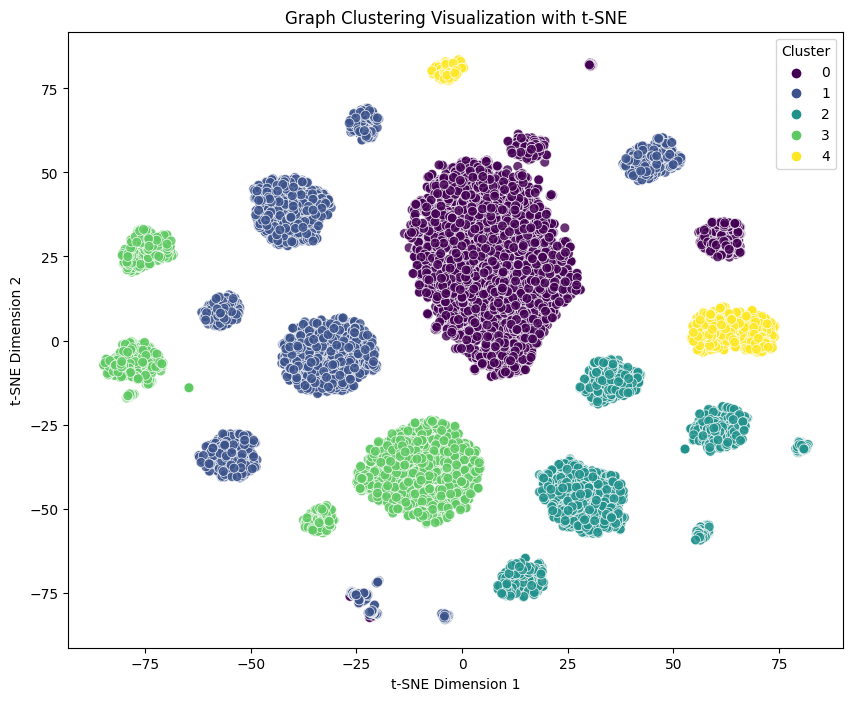

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import networkx as nx
from karateclub import Graph2Vec

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE



# Convert StellarGraph objects to NetworkX graphs and relabel nodes
nx_graphs = []
for g in graphs:
    # Convert to NetworkX graph
    nx_g = g.to_networkx()

    # Relabel nodes to consecutive integers starting from 0
    nx_g = nx.convert_node_labels_to_integers(nx_g, first_label=0, ordering='default')
    nx_graphs.append(nx_g)

# Instantiate Graph2Vec model
graph2vec_model = Graph2Vec(dimensions=128, workers=4, epochs=10, min_count=1)

# Fit the model to the list of NetworkX graphs
print("Fitting Graph2Vec model...")
graph2vec_model.fit(nx_graphs)

# Get the embeddings for each graph
graph_embeddings = graph2vec_model.get_embedding()

# Apply KMeans clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(graph_embeddings)

# Analyze clusters
unique, counts = np.unique(clusters, return_counts=True)
cluster_info = dict(zip(unique, counts))
print("Cluster Distribution:")
for cluster_id, size in cluster_info.items():
    print(f"Cluster {cluster_id}: {size} graphs")

# Visualize with PCA
pca = PCA(n_components=2)
reduced_embeddings = pca.fit_transform(graph_embeddings)

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=reduced_embeddings[:, 0],
    y=reduced_embeddings[:, 1],
    hue=clusters,
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Graph Clustering Visualization with PCA")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title='Cluster')
plt.show()

# Visualize with t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
tsne_embeddings = tsne.fit_transform(graph_embeddings)

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=tsne_embeddings[:, 0],
    y=tsne_embeddings[:, 1],
    hue=clusters,
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Graph Clustering Visualization with t-SNE")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend(title='Cluster')
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import networkx as nx
from stellargraph import StellarGraph
from karateclub import Graph2Vec

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


Fitting Graph2Vec model...
Cluster Distribution:
Cluster 0: 2799 graphs
Cluster 1: 1561 graphs
Cluster 2: 2318 graphs
Cluster 3: 568 graphs
Cluster 4: 1725 graphs


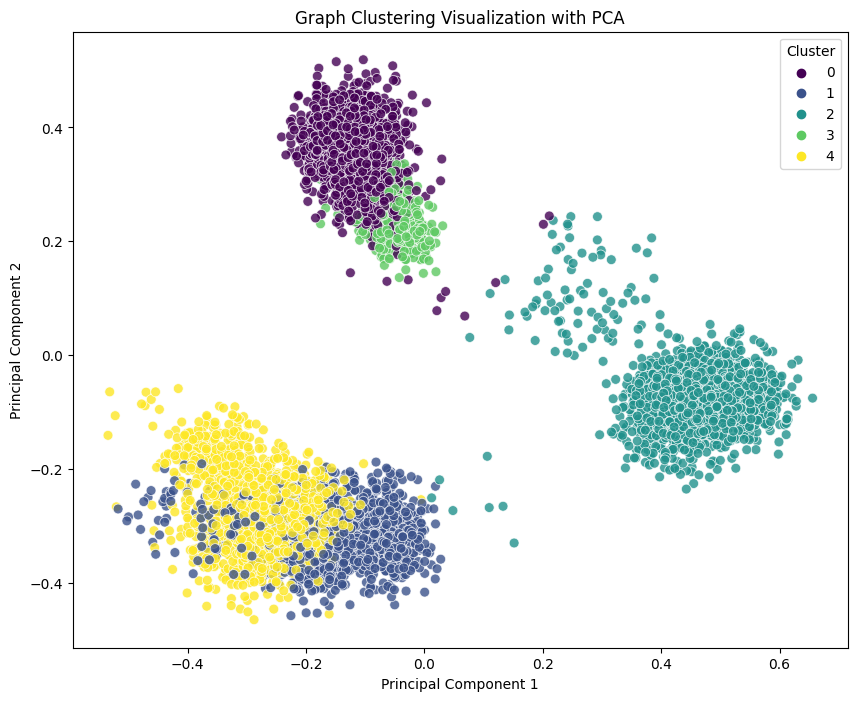

In [ ]:
nx_graphs = []
for g in graphs:
    # Convert to NetworkX graph
    nx_g = g.to_networkx()

    # Relabel nodes to consecutive integers starting from 0
    nx_g = nx.convert_node_labels_to_integers(nx_g, first_label=0, ordering='default')
    nx_graphs.append(nx_g)
# Instantiate Graph2Vec model
graph2vec_model = Graph2Vec(dimensions=128, workers=4, epochs=10, min_count=1)

# Fit the model to the list of NetworkX graphs
print("Fitting Graph2Vec model...")
graph2vec_model.fit(nx_graphs)

# Get the embeddings for each graph
graph_embeddings = graph2vec_model.get_embedding()

# Define the number of clusters
n_clusters = 5

# Apply KMeans clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(graph_embeddings)

# Analyze clusters
unique, counts = np.unique(clusters, return_counts=True)
cluster_info = dict(zip(unique, counts))
print("Cluster Distribution:")
for cluster_id, size in cluster_info.items():
    print(f"Cluster {cluster_id}: {size} graphs")
# Reduce dimensionality with PCA
pca = PCA(n_components=2)
reduced_embeddings = pca.fit_transform(graph_embeddings)

# Plot the clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=reduced_embeddings[:, 0],
    y=reduced_embeddings[:, 1],
    hue=clusters,
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Graph Clustering Visualization with PCA")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title='Cluster')
plt.show()


C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


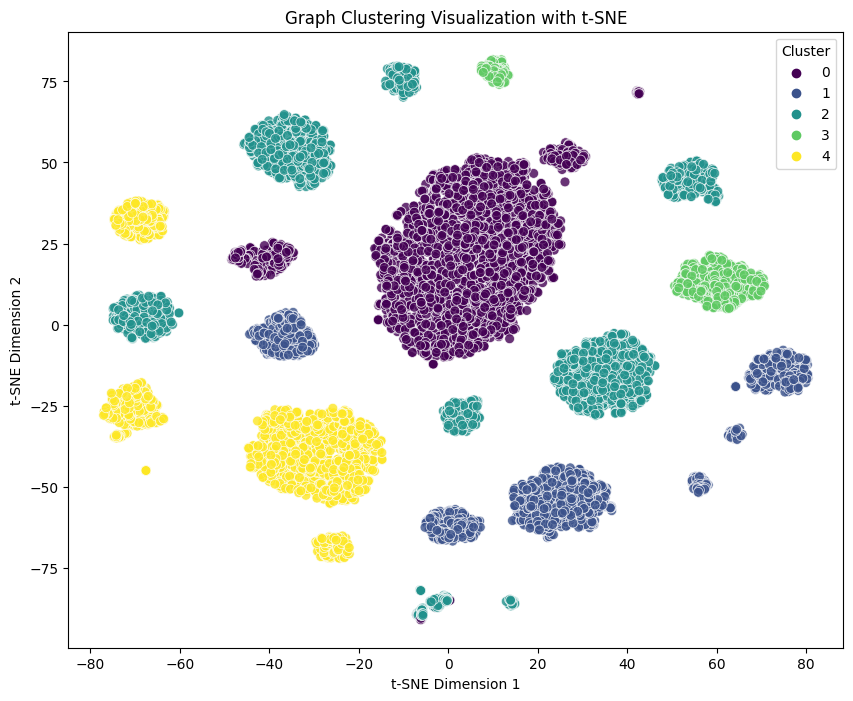

In [ ]:
# Reduce dimensionality with t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
tsne_embeddings = tsne.fit_transform(graph_embeddings)

# Plot the clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=tsne_embeddings[:, 0],
    y=tsne_embeddings[:, 1],
    hue=clusters,
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Graph Clustering Visualization with t-SNE")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend(title='Cluster')
plt.show()


In [ ]:
#Graph Kernel Methods

In [ ]:
!pip install grakel

  Using cached GraKeL-0.1.10-cp37-cp37m-win_amd64.whl (676 kB)
     ------------------------------------- 491.3/491.3 kB 10.2 MB/s eta 0:00:00


In [ ]:
from grakel import GraphKernel
from grakel.datasets import generate_dataset

# Convert NetworkX graphs to GraKeL format
from grakel import Graph

import networkx as nx

# Convert graphs to simple graphs if they are MultiGraphs
for i, nx_g in enumerate(nx_graphs):
    if isinstance(nx_g, nx.MultiGraph) or isinstance(nx_g, nx.MultiDiGraph):
        nx_g = nx.Graph(nx_g)
        nx_graphs[i] = nx_g  # Update the list with the converted graph

for i, nx_g in enumerate(nx_graphs):
    mapping = dict(zip(nx_g.nodes(), range(nx_g.number_of_nodes())))
    nx_g = nx.relabel_nodes(nx_g, mapping)
    nx_graphs[i] = nx_g


gk_graphs = []
for nx_g in nx_graphs:
    # Skip empty graphs
    if nx_g.number_of_nodes() == 0:
        continue

    # Ensure the graph is simple and nodes are relabeled
    if isinstance(nx_g, nx.MultiGraph) or isinstance(nx_g, nx.MultiDiGraph):
        nx_g = nx.Graph(nx_g)
    mapping = dict(zip(nx_g.nodes(), range(nx_g.number_of_nodes())))
    nx_g = nx.relabel_nodes(nx_g, mapping)

    # Get edge list
    edge_list = nx_g.edges()

    # Create GraKeL graph without labels
    G = Graph(edge_list)
    gk_graphs.append(G)

# Initialize the Weisfeiler-Lehman kernel with the base kernel (e.g., vertex histogram)
gk = GraphKernel(kernel=[{"name": "weisfeiler_lehman", "n_iter": 5}, {"name": "vertex_histogram"}])

# Compute the kernel matrix
K = gk.fit_transform(gk_graphs)

# Apply spectral clustering using the kernel matrix
from sklearn.cluster import SpectralClustering

n_clusters = 5
clustering = SpectralClustering(
    n_clusters=n_clusters,
    affinity='precomputed',
    assign_labels='kmeans',
    random_state=42
)
clusters = clustering.fit_predict(K)

# Analyze clusters
unique, counts = np.unique(clusters, return_counts=True)
cluster_info = dict(zip(unique, counts))
print("Cluster Distribution:")
for cluster_id, size in cluster_info.items():
    print(f"Cluster {cluster_id}: {size} graphs")
from sklearn.manifold import MDS

# Reduce dimensionality with MDS
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
mds_embeddings = mds.fit_transform(1 - K)  # 1 - K to convert similarity to dissimilarity

# Plot the clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=mds_embeddings[:, 0],
    y=mds_embeddings[:, 1],
    hue=clusters,
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Graph Clustering Visualization with MDS")
plt.xlabel("MDS Dimension 1")
plt.ylabel("MDS Dimension 2")
plt.legend(title='Cluster')
plt.show()



ValueError: Graph does not have any labels for vertices.

In [ ]:
#3. Subgraph/Motif Mining

In [ ]:
import networkx as nx

# Find cliques (fully connected subgraphs) in each graph
for i, nx_g in enumerate(nx_graphs):
    cliques = list(nx.find_cliques(nx_g))
    print(f"Graph {i} has {len(cliques)} cliques")

Graph 0 has 55 cliques
Graph 1 has 56 cliques
Graph 2 has 54 cliques
Graph 3 has 59 cliques
Graph 4 has 57 cliques
Graph 5 has 59 cliques
Graph 6 has 58 cliques
Graph 7 has 54 cliques
Graph 8 has 56 cliques
Graph 9 has 58 cliques
Graph 10 has 59 cliques
Graph 11 has 56 cliques
Graph 12 has 56 cliques
Graph 13 has 57 cliques
Graph 14 has 55 cliques
Graph 15 has 57 cliques
Graph 16 has 57 cliques
Graph 17 has 59 cliques
Graph 18 has 57 cliques
Graph 19 has 57 cliques
Graph 20 has 59 cliques
Graph 21 has 57 cliques
Graph 22 has 58 cliques
Graph 23 has 57 cliques
Graph 24 has 58 cliques
Graph 25 has 58 cliques
Graph 26 has 57 cliques
Graph 27 has 56 cliques
Graph 28 has 57 cliques
Graph 29 has 56 cliques
Graph 30 has 54 cliques
Graph 31 has 57 cliques
Graph 32 has 57 cliques
Graph 33 has 57 cliques
Graph 34 has 55 cliques
Graph 35 has 55 cliques
Graph 36 has 59 cliques
Graph 37 has 56 cliques
Graph 38 has 56 cliques
Graph 39 has 56 cliques
Graph 40 has 56 cliques
Graph 41 has 56 cliques
Gr

Graph 2957 has 55 cliques
Graph 2958 has 56 cliques
Graph 2959 has 54 cliques
Graph 2960 has 54 cliques
Graph 2961 has 55 cliques
Graph 2962 has 57 cliques
Graph 2963 has 56 cliques
Graph 2964 has 55 cliques
Graph 2965 has 57 cliques
Graph 2966 has 55 cliques
Graph 2967 has 55 cliques
Graph 2968 has 55 cliques
Graph 2969 has 55 cliques
Graph 2970 has 55 cliques
Graph 2971 has 56 cliques
Graph 2972 has 57 cliques
Graph 2973 has 55 cliques
Graph 2974 has 54 cliques
Graph 2975 has 55 cliques
Graph 2976 has 55 cliques
Graph 2977 has 55 cliques
Graph 2978 has 54 cliques
Graph 2979 has 56 cliques
Graph 2980 has 55 cliques
Graph 2981 has 55 cliques
Graph 2982 has 56 cliques
Graph 2983 has 55 cliques
Graph 2984 has 56 cliques
Graph 2985 has 54 cliques
Graph 2986 has 55 cliques
Graph 2987 has 55 cliques
Graph 2988 has 54 cliques
Graph 2989 has 55 cliques
Graph 2990 has 54 cliques
Graph 2991 has 55 cliques
Graph 2992 has 57 cliques
Graph 2993 has 55 cliques
Graph 2994 has 54 cliques
Graph 2995 h

Graph 4475 has 54 cliques
Graph 4476 has 54 cliques
Graph 4477 has 54 cliques
Graph 4478 has 54 cliques
Graph 4479 has 54 cliques
Graph 4480 has 54 cliques
Graph 4481 has 54 cliques
Graph 4482 has 53 cliques
Graph 4483 has 54 cliques
Graph 4484 has 54 cliques
Graph 4485 has 53 cliques
Graph 4486 has 54 cliques
Graph 4487 has 54 cliques
Graph 4488 has 54 cliques
Graph 4489 has 54 cliques
Graph 4490 has 53 cliques
Graph 4491 has 54 cliques
Graph 4492 has 54 cliques
Graph 4493 has 54 cliques
Graph 4494 has 56 cliques
Graph 4495 has 54 cliques
Graph 4496 has 54 cliques
Graph 4497 has 54 cliques
Graph 4498 has 54 cliques
Graph 4499 has 54 cliques
Graph 4500 has 55 cliques
Graph 4501 has 54 cliques
Graph 4502 has 54 cliques
Graph 4503 has 54 cliques
Graph 4504 has 54 cliques
Graph 4505 has 54 cliques
Graph 4506 has 54 cliques
Graph 4507 has 54 cliques
Graph 4508 has 54 cliques
Graph 4509 has 54 cliques
Graph 4510 has 54 cliques
Graph 4511 has 54 cliques
Graph 4512 has 54 cliques
Graph 4513 h

Graph 6197 has 54 cliques
Graph 6198 has 54 cliques
Graph 6199 has 59 cliques
Graph 6200 has 56 cliques
Graph 6201 has 57 cliques
Graph 6202 has 55 cliques
Graph 6203 has 54 cliques
Graph 6204 has 56 cliques
Graph 6205 has 54 cliques
Graph 6206 has 56 cliques
Graph 6207 has 57 cliques
Graph 6208 has 54 cliques
Graph 6209 has 55 cliques
Graph 6210 has 57 cliques
Graph 6211 has 54 cliques
Graph 6212 has 55 cliques
Graph 6213 has 56 cliques
Graph 6214 has 57 cliques
Graph 6215 has 55 cliques
Graph 6216 has 56 cliques
Graph 6217 has 56 cliques
Graph 6218 has 57 cliques
Graph 6219 has 55 cliques
Graph 6220 has 58 cliques
Graph 6221 has 58 cliques
Graph 6222 has 54 cliques
Graph 6223 has 55 cliques
Graph 6224 has 54 cliques
Graph 6225 has 55 cliques
Graph 6226 has 57 cliques
Graph 6227 has 54 cliques
Graph 6228 has 55 cliques
Graph 6229 has 55 cliques
Graph 6230 has 54 cliques
Graph 6231 has 55 cliques
Graph 6232 has 54 cliques
Graph 6233 has 54 cliques
Graph 6234 has 54 cliques
Graph 6235 h

Graph 7580 has 55 cliques
Graph 7581 has 54 cliques
Graph 7582 has 55 cliques
Graph 7583 has 58 cliques
Graph 7584 has 55 cliques
Graph 7585 has 56 cliques
Graph 7586 has 56 cliques
Graph 7587 has 55 cliques
Graph 7588 has 55 cliques
Graph 7589 has 54 cliques
Graph 7590 has 56 cliques
Graph 7591 has 55 cliques
Graph 7592 has 54 cliques
Graph 7593 has 56 cliques
Graph 7594 has 54 cliques
Graph 7595 has 56 cliques
Graph 7596 has 56 cliques
Graph 7597 has 54 cliques
Graph 7598 has 57 cliques
Graph 7599 has 57 cliques
Graph 7600 has 57 cliques
Graph 7601 has 56 cliques
Graph 7602 has 55 cliques
Graph 7603 has 57 cliques
Graph 7604 has 54 cliques
Graph 7605 has 55 cliques
Graph 7606 has 58 cliques
Graph 7607 has 54 cliques
Graph 7608 has 56 cliques
Graph 7609 has 58 cliques
Graph 7610 has 54 cliques
Graph 7611 has 55 cliques
Graph 7612 has 54 cliques
Graph 7613 has 56 cliques
Graph 7614 has 55 cliques
Graph 7615 has 57 cliques
Graph 7616 has 55 cliques
Graph 7617 has 55 cliques
Graph 7618 h

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming nx_graphs is your list of NetworkX graphs
# Ensure that your graphs are simple graphs (no multiple edges)
for i, nx_g in enumerate(nx_graphs):
    if isinstance(nx_g, nx.MultiGraph) or isinstance(nx_g, nx.MultiDiGraph):
        nx_g = nx.Graph(nx_g)  # Convert to simple graph
        nx_graphs[i] = nx_g

# Calculate clique sizes
clique_sizes = []
for i, nx_g in enumerate(nx_graphs):
    # Find all maximal cliques in the graph
    cliques = list(nx.find_cliques(nx_g))
    # Get the sizes of each clique and extend the list
    clique_sizes.extend([len(clique) for clique in cliques])
    print(f"Graph {i+1} has {len(cliques)} cliques")

# Plot the distribution of clique sizes
plt.figure(figsize=(10, 6))
plt.hist(clique_sizes, bins=range(1, max(clique_sizes)+2), align='left', edgecolor='black', rwidth=0.8)
plt.title('Distribution of Clique Sizes Across All Graphs')
plt.xlabel('Clique Size')
plt.ylabel('Frequency')
plt.xticks(range(1, max(clique_sizes)+1))
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns

# Create a DataFrame from the clique sizes
clique_sizes_df = pd.DataFrame({'Clique Size': clique_sizes})

# Count the frequency of each clique size
clique_size_counts = clique_sizes_df['Clique Size'].value_counts().sort_index()

# Plot the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=clique_size_counts.index, y=clique_size_counts.values, color='skyblue')
plt.title('Distribution of Clique Sizes Across All Graphs')
plt.xlabel('Clique Size')
plt.ylabel('Frequency')
plt.show()


In [ ]:
import matplotlib.pyplot as plt
clique_sizes = 4

plt.figure(figsize=(10, 6))
plt.hist(clique_sizes, bins=range(1, max(clique_sizes)+1), align='left', edgecolor='black')
plt.title('Distribution of Clique Sizes Across All Graphs')
plt.xlabel('Clique Size')
plt.ylabel('Frequency')
plt.xticks(range(1, max(clique_sizes)+1))
plt.show()


TypeError: 'int' object is not iterable

<Figure size 1000x600 with 0 Axes>

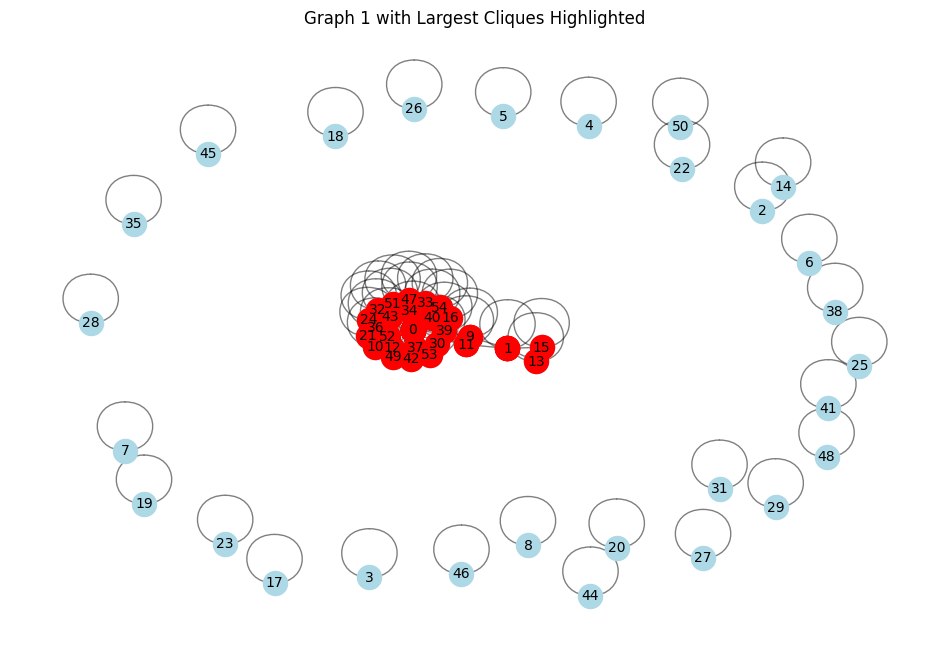

In [ ]:
import networkx as nx

# Select a graph to visualize
graph_index = 0  # Change to the index of the graph you want to visualize
nx_g = nx_graphs[graph_index]

# Find cliques
cliques = list(nx.find_cliques(nx_g))

# Get the largest cliques
max_clique_size = max(len(clique) for clique in cliques)
largest_cliques = [clique for clique in cliques if len(clique) == max_clique_size]

# Visualize the graph highlighting the largest cliques
pos = nx.spring_layout(nx_g)
plt.figure(figsize=(12, 8))
nx.draw_networkx_edges(nx_g, pos, alpha=0.5)
nx.draw_networkx_nodes(nx_g, pos, node_color='lightblue', node_size=300)
nx.draw_networkx_labels(nx_g, pos, font_size=10)

# Highlight nodes in the largest cliques
for clique in largest_cliques:
    nx.draw_networkx_nodes(nx_g, pos, nodelist=clique, node_color='red', node_size=300)

plt.title(f'Graph {graph_index+1} with Largest Cliques Highlighted')
plt.axis('off')
plt.show()


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming nx_graphs is your list of NetworkX graphs
# Ensure that your graphs are simple graphs (no multiple edges)
for i, nx_g in enumerate(nx_graphs):
    if isinstance(nx_g, nx.MultiGraph) or isinstance(nx_g, nx.MultiDiGraph):
        nx_g = nx.Graph(nx_g)  # Convert to simple graph
        nx_graphs[i] = nx_g

# Calculate clique sizes
clique_sizes = []
for i, nx_g in enumerate(nx_graphs):
    # Find all maximal cliques in the graph
    cliques = list(nx.find_cliques(nx_g))
    # Get the sizes of each clique and extend the list
    clique_sizes.extend([len(clique) for clique in cliques])
    print(f"Graph {i+1} has {len(cliques)} cliques")




Graph 1 has 55 cliques
Graph 2 has 56 cliques
Graph 3 has 54 cliques
Graph 4 has 59 cliques
Graph 5 has 57 cliques
Graph 6 has 59 cliques
Graph 7 has 58 cliques
Graph 8 has 54 cliques
Graph 9 has 56 cliques
Graph 10 has 58 cliques
Graph 11 has 59 cliques
Graph 12 has 56 cliques
Graph 13 has 56 cliques
Graph 14 has 57 cliques
Graph 15 has 55 cliques
Graph 16 has 57 cliques
Graph 17 has 57 cliques
Graph 18 has 59 cliques
Graph 19 has 57 cliques
Graph 20 has 57 cliques
Graph 21 has 59 cliques
Graph 22 has 57 cliques
Graph 23 has 58 cliques
Graph 24 has 57 cliques
Graph 25 has 58 cliques
Graph 26 has 58 cliques
Graph 27 has 57 cliques
Graph 28 has 56 cliques
Graph 29 has 57 cliques
Graph 30 has 56 cliques
Graph 31 has 54 cliques
Graph 32 has 57 cliques
Graph 33 has 57 cliques
Graph 34 has 57 cliques
Graph 35 has 55 cliques
Graph 36 has 55 cliques
Graph 37 has 59 cliques
Graph 38 has 56 cliques
Graph 39 has 56 cliques
Graph 40 has 56 cliques
Graph 41 has 56 cliques
Graph 42 has 56 cliques
G

Graph 1883 has 59 cliques
Graph 1884 has 55 cliques
Graph 1885 has 54 cliques
Graph 1886 has 55 cliques
Graph 1887 has 57 cliques
Graph 1888 has 57 cliques
Graph 1889 has 57 cliques
Graph 1890 has 55 cliques
Graph 1891 has 55 cliques
Graph 1892 has 57 cliques
Graph 1893 has 53 cliques
Graph 1894 has 55 cliques
Graph 1895 has 58 cliques
Graph 1896 has 57 cliques
Graph 1897 has 56 cliques
Graph 1898 has 58 cliques
Graph 1899 has 56 cliques
Graph 1900 has 55 cliques
Graph 1901 has 56 cliques
Graph 1902 has 55 cliques
Graph 1903 has 56 cliques
Graph 1904 has 57 cliques
Graph 1905 has 57 cliques
Graph 1906 has 54 cliques
Graph 1907 has 54 cliques
Graph 1908 has 54 cliques
Graph 1909 has 57 cliques
Graph 1910 has 54 cliques
Graph 1911 has 57 cliques
Graph 1912 has 54 cliques
Graph 1913 has 56 cliques
Graph 1914 has 54 cliques
Graph 1915 has 54 cliques
Graph 1916 has 55 cliques
Graph 1917 has 57 cliques
Graph 1918 has 55 cliques
Graph 1919 has 55 cliques
Graph 1920 has 54 cliques
Graph 1921 h

Graph 3935 has 56 cliques
Graph 3936 has 57 cliques
Graph 3937 has 54 cliques
Graph 3938 has 57 cliques
Graph 3939 has 54 cliques
Graph 3940 has 55 cliques
Graph 3941 has 54 cliques
Graph 3942 has 54 cliques
Graph 3943 has 54 cliques
Graph 3944 has 54 cliques
Graph 3945 has 55 cliques
Graph 3946 has 55 cliques
Graph 3947 has 54 cliques
Graph 3948 has 54 cliques
Graph 3949 has 56 cliques
Graph 3950 has 54 cliques
Graph 3951 has 54 cliques
Graph 3952 has 54 cliques
Graph 3953 has 54 cliques
Graph 3954 has 55 cliques
Graph 3955 has 54 cliques
Graph 3956 has 54 cliques
Graph 3957 has 55 cliques
Graph 3958 has 54 cliques
Graph 3959 has 54 cliques
Graph 3960 has 54 cliques
Graph 3961 has 58 cliques
Graph 3962 has 54 cliques
Graph 3963 has 54 cliques
Graph 3964 has 54 cliques
Graph 3965 has 54 cliques
Graph 3966 has 55 cliques
Graph 3967 has 56 cliques
Graph 3968 has 54 cliques
Graph 3969 has 54 cliques
Graph 3970 has 54 cliques
Graph 3971 has 53 cliques
Graph 3972 has 54 cliques
Graph 3973 h

Graph 5680 has 54 cliques
Graph 5681 has 54 cliques
Graph 5682 has 55 cliques
Graph 5683 has 57 cliques
Graph 5684 has 54 cliques
Graph 5685 has 57 cliques
Graph 5686 has 54 cliques
Graph 5687 has 54 cliques
Graph 5688 has 54 cliques
Graph 5689 has 54 cliques
Graph 5690 has 57 cliques
Graph 5691 has 55 cliques
Graph 5692 has 54 cliques
Graph 5693 has 58 cliques
Graph 5694 has 55 cliques
Graph 5695 has 53 cliques
Graph 5696 has 58 cliques
Graph 5697 has 54 cliques
Graph 5698 has 53 cliques
Graph 5699 has 56 cliques
Graph 5700 has 56 cliques
Graph 5701 has 58 cliques
Graph 5702 has 54 cliques
Graph 5703 has 57 cliques
Graph 5704 has 55 cliques
Graph 5705 has 54 cliques
Graph 5706 has 54 cliques
Graph 5707 has 54 cliques
Graph 5708 has 54 cliques
Graph 5709 has 59 cliques
Graph 5710 has 55 cliques
Graph 5711 has 57 cliques
Graph 5712 has 54 cliques
Graph 5713 has 54 cliques
Graph 5714 has 57 cliques
Graph 5715 has 56 cliques
Graph 5716 has 55 cliques
Graph 5717 has 57 cliques
Graph 5718 h

Graph 7123 has 57 cliques
Graph 7124 has 54 cliques
Graph 7125 has 58 cliques
Graph 7126 has 55 cliques
Graph 7127 has 56 cliques
Graph 7128 has 54 cliques
Graph 7129 has 58 cliques
Graph 7130 has 56 cliques
Graph 7131 has 54 cliques
Graph 7132 has 57 cliques
Graph 7133 has 55 cliques
Graph 7134 has 54 cliques
Graph 7135 has 55 cliques
Graph 7136 has 58 cliques
Graph 7137 has 55 cliques
Graph 7138 has 55 cliques
Graph 7139 has 54 cliques
Graph 7140 has 54 cliques
Graph 7141 has 54 cliques
Graph 7142 has 54 cliques
Graph 7143 has 55 cliques
Graph 7144 has 54 cliques
Graph 7145 has 54 cliques
Graph 7146 has 54 cliques
Graph 7147 has 54 cliques
Graph 7148 has 54 cliques
Graph 7149 has 54 cliques
Graph 7150 has 54 cliques
Graph 7151 has 56 cliques
Graph 7152 has 55 cliques
Graph 7153 has 54 cliques
Graph 7154 has 57 cliques
Graph 7155 has 54 cliques
Graph 7156 has 54 cliques
Graph 7157 has 54 cliques
Graph 7158 has 54 cliques
Graph 7159 has 56 cliques
Graph 7160 has 57 cliques
Graph 7161 h

Graph 8323 has 54 cliques
Graph 8324 has 54 cliques
Graph 8325 has 58 cliques
Graph 8326 has 54 cliques
Graph 8327 has 54 cliques
Graph 8328 has 56 cliques
Graph 8329 has 57 cliques
Graph 8330 has 57 cliques
Graph 8331 has 58 cliques
Graph 8332 has 57 cliques
Graph 8333 has 54 cliques
Graph 8334 has 58 cliques
Graph 8335 has 56 cliques
Graph 8336 has 56 cliques
Graph 8337 has 56 cliques
Graph 8338 has 57 cliques
Graph 8339 has 56 cliques
Graph 8340 has 54 cliques
Graph 8341 has 58 cliques
Graph 8342 has 56 cliques
Graph 8343 has 54 cliques
Graph 8344 has 55 cliques
Graph 8345 has 56 cliques
Graph 8346 has 57 cliques
Graph 8347 has 58 cliques
Graph 8348 has 54 cliques
Graph 8349 has 55 cliques
Graph 8350 has 56 cliques
Graph 8351 has 57 cliques
Graph 8352 has 54 cliques
Graph 8353 has 54 cliques
Graph 8354 has 58 cliques
Graph 8355 has 58 cliques
Graph 8356 has 55 cliques
Graph 8357 has 56 cliques
Graph 8358 has 54 cliques
Graph 8359 has 55 cliques
Graph 8360 has 56 cliques
Graph 8361 h

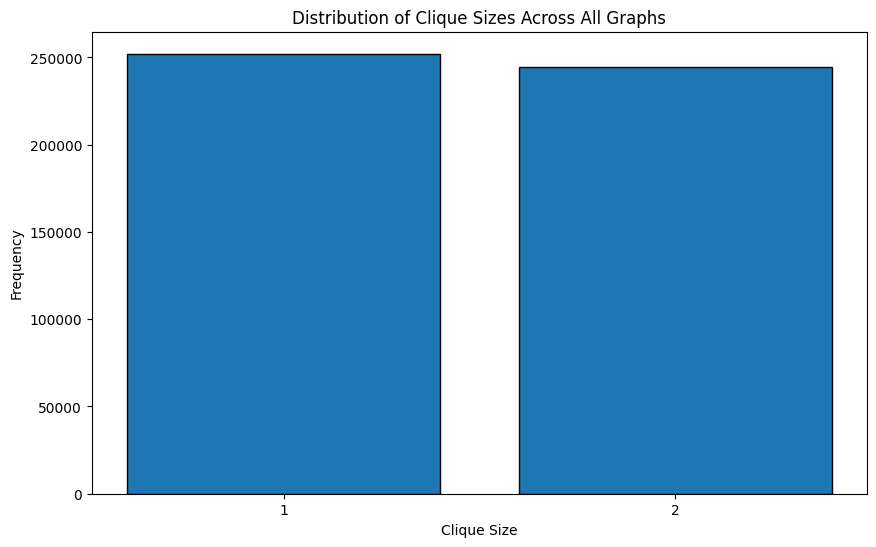

In [ ]:
# Plot the distribution of clique sizes
plt.figure(figsize=(10, 6))
plt.hist(clique_sizes, bins=range(1, max(clique_sizes)+2), align='left', edgecolor='black', rwidth=0.8)
plt.title('Distribution of Clique Sizes Across All Graphs')
plt.xlabel('Clique Size')
plt.ylabel('Frequency')
plt.xticks(range(1, max(clique_sizes)+1))
plt.show()

In [ ]:
#4. Graph Generative Models

In [ ]:
#5. Clustering Based on Graph Features

C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\cluster\_kmeans.py:1255: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return self.fit(X, sample_weight=sample_weight).labels_


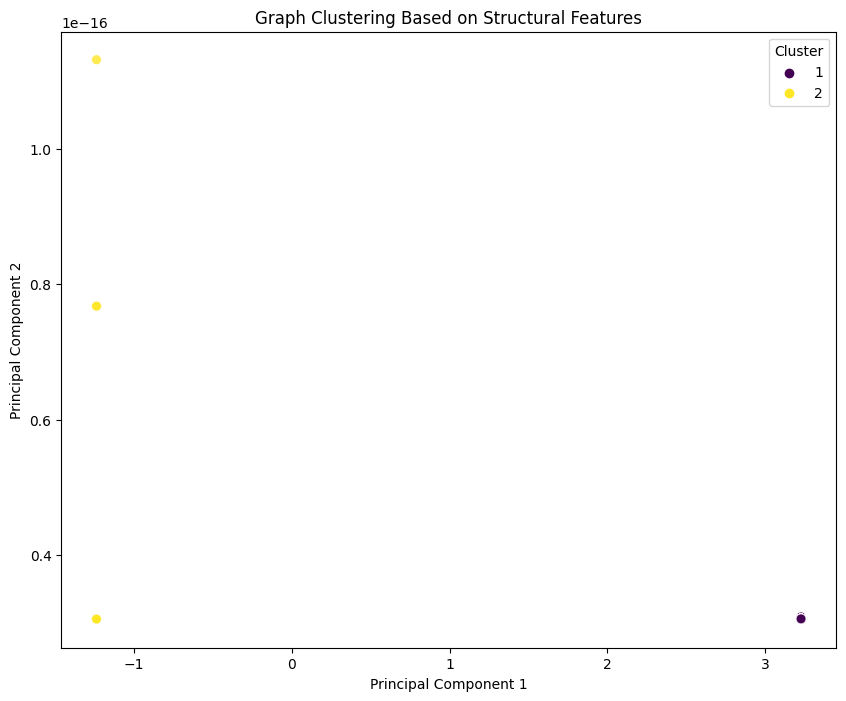

In [ ]:
# Extract features for each graph
import networkx as nx

graph_features = []

for nx_g in nx_graphs:
    # Convert MultiGraph to simple Graph
    if isinstance(nx_g, nx.MultiGraph) or isinstance(nx_g, nx.MultiDiGraph):
        nx_g = nx.Graph(nx_g)

    features = {}
    features['num_nodes'] = nx_g.number_of_nodes()
    features['num_edges'] = nx_g.number_of_edges()
    features['average_degree'] = sum(dict(nx_g.degree()).values()) / nx_g.number_of_nodes()
    features['density'] = nx.density(nx_g)
    features['average_clustering'] = nx.average_clustering(nx_g)
    # Add more features as needed

    graph_features.append(features)

# Convert to DataFrame
import pandas as pd
graph_features_df = pd.DataFrame(graph_features)

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_features = scaler.fit_transform(graph_features_df)
from sklearn.cluster import KMeans

n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

# Add clusters to DataFrame
graph_features_df['cluster'] = clusters

# Reduce dimensionality for visualization
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
reduced_features = pca.fit_transform(scaled_features)

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=reduced_features[:, 0],
    y=reduced_features[:, 1],
    hue=clusters,
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Graph Clustering Based on Structural Features")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title='Cluster')
plt.show()


In [ ]:
#6. Node Embedding Learning Across Multiple Graphs

In [ ]:
!pip install node2vec

  Using cached node2vec-0.4.3-py3-none-any.whl


In [ ]:
from node2vec import Node2Vec

node_embeddings = []

for i, nx_g in enumerate(nx_graphs):
    print(f"Processing graph {i+1}/{len(nx_graphs)}")

    # Ensure the graph is connected and has enough nodes
    if nx_g.number_of_nodes() < 2:
        print(f"Graph {i+1} is too small. Skipping.")
        continue

    if not nx.is_connected(nx_g):
        # Take the largest connected component
        largest_cc = max(nx.connected_components(nx_g), key=len)
        nx_g = nx_g.subgraph(largest_cc).copy()

    try:
        # Create and fit Node2Vec model
        node2vec = Node2Vec(
            nx_g,
            dimensions=32,
            walk_length=10,
            num_walks=50,
            workers=1
        )
        model = node2vec.fit(window=5, min_count=1, batch_words=4)

        embeddings = model.wv
        node_embeddings.append(embeddings)
    except Exception as e:
        print(f"Error processing graph {i+1}: {e}")
        continue

    # Fit model
    model = node2vec.fit(window=10, min_count=1, batch_words=4)

    # Get embeddings as a dictionary {node_id: embedding_vector}
    embeddings = model.wv
    node_embeddings.append(embeddings)

    graph_embeddings = []

for embeddings in node_embeddings:
    # Aggregate node embeddings to create a graph embedding
    # You can take the mean of all node embeddings
    emb_vectors = np.array([embeddings[node_id] for node_id in embeddings.key_to_index])
    graph_emb = np.mean(emb_vectors, axis=0)
    graph_embeddings.append(graph_emb)

graph_embeddings = np.array(graph_embeddings)


Processing graph 1/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.38it/s]


Processing graph 2/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.75it/s]


Processing graph 3/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.39it/s]


Processing graph 4/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.45it/s]


Processing graph 5/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.91it/s]


Processing graph 6/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.25it/s]


Processing graph 7/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.86it/s]


Processing graph 8/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.24it/s]


Processing graph 9/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.88it/s]


Processing graph 10/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.52it/s]


Processing graph 11/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.56it/s]


Processing graph 12/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.27it/s]


Processing graph 13/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.81it/s]


Processing graph 14/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.05it/s]


Processing graph 15/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.62it/s]


Processing graph 16/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.30it/s]


Processing graph 17/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.44it/s]


Processing graph 18/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.11it/s]


Processing graph 19/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.97it/s]


Processing graph 20/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.96it/s]


Processing graph 21/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.87it/s]


Processing graph 22/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.88it/s]


Processing graph 23/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.37it/s]


Processing graph 24/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.66it/s]


Processing graph 25/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.47it/s]


Processing graph 26/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.12it/s]


Processing graph 27/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.31it/s]


Processing graph 28/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.73it/s]


Processing graph 29/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.73it/s]


Processing graph 30/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.84it/s]


Processing graph 31/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.49it/s]


Processing graph 32/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.41it/s]


Processing graph 33/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.89it/s]


Processing graph 34/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.85it/s]


Processing graph 35/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.16it/s]


Processing graph 36/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.51it/s]


Processing graph 37/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.51it/s]


Processing graph 38/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.55it/s]


Processing graph 39/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.21it/s]


Processing graph 40/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.64it/s]


Processing graph 41/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.16it/s]


Processing graph 42/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.62it/s]


Processing graph 43/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.13it/s]


Processing graph 44/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.64it/s]


Processing graph 45/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.20it/s]


Processing graph 46/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.21it/s]


Processing graph 47/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.15it/s]


Processing graph 48/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.19it/s]


Processing graph 49/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.03it/s]


Processing graph 50/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.05it/s]


Processing graph 51/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.36it/s]


Processing graph 52/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.81it/s]


Processing graph 53/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.58it/s]


Processing graph 54/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.32it/s]


Processing graph 55/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.58it/s]


Processing graph 56/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.89it/s]


Processing graph 57/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.33it/s]


Processing graph 58/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.26it/s]


Processing graph 59/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.01it/s]


Processing graph 60/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.26it/s]


Processing graph 61/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.28it/s]


Processing graph 62/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.93it/s]


Processing graph 63/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.21it/s]


Processing graph 64/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.11it/s]


Processing graph 65/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.00it/s]


Processing graph 66/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.42it/s]


Processing graph 67/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.90it/s]


Processing graph 68/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.09it/s]


Processing graph 69/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.33it/s]


Processing graph 70/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.74it/s]


Processing graph 71/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.08it/s]


Processing graph 72/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.32it/s]


Processing graph 73/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.11it/s]


Processing graph 74/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.60it/s]


Processing graph 75/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.81it/s]


Processing graph 76/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.83it/s]


Processing graph 77/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.17it/s]


Processing graph 78/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.89it/s]


Processing graph 79/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.73it/s]


Processing graph 80/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.93it/s]


Processing graph 81/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.30it/s]


Processing graph 82/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.96it/s]


Processing graph 83/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.95it/s]


Processing graph 84/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.73it/s]


Processing graph 85/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.22it/s]


Processing graph 86/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.38it/s]


Processing graph 87/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.00it/s]


Processing graph 88/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.54it/s]


Processing graph 89/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.19it/s]


Processing graph 90/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.82it/s]


Processing graph 91/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.31it/s]


Processing graph 92/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.21it/s]


Processing graph 93/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.17it/s]


Processing graph 94/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.23it/s]


Processing graph 95/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.83it/s]


Processing graph 96/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.53it/s]


Processing graph 97/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.76it/s]


Processing graph 98/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.89it/s]


Processing graph 99/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.70it/s]


Processing graph 100/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.52it/s]


Processing graph 101/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.17it/s]


Processing graph 102/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.58it/s]


Processing graph 103/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.32it/s]


Processing graph 104/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.35it/s]


Processing graph 105/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.10it/s]


Processing graph 106/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.55it/s]


Processing graph 107/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.46it/s]


Processing graph 108/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.53it/s]


Processing graph 109/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.29it/s]


Processing graph 110/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.01it/s]


Processing graph 111/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.57it/s]


Processing graph 112/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.72it/s]


Processing graph 113/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.41it/s]


Processing graph 114/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.12it/s]


Processing graph 115/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.77it/s]


Processing graph 116/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.52it/s]


Processing graph 117/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.66it/s]


Processing graph 118/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.15it/s]


Processing graph 119/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.74it/s]


Processing graph 120/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.72it/s]


Processing graph 121/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.33it/s]


Processing graph 122/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.31it/s]


Processing graph 123/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.79it/s]


Processing graph 124/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.25it/s]


Processing graph 125/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.11it/s]


Processing graph 126/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.95it/s]


Processing graph 127/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.60it/s]


Processing graph 128/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.28it/s]


Processing graph 129/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.95it/s]


Processing graph 130/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.72it/s]


Processing graph 131/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.86it/s]


Processing graph 132/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.26it/s]


Processing graph 133/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.69it/s]


Processing graph 134/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.09it/s]


Processing graph 135/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.68it/s]


Processing graph 136/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.38it/s]


Processing graph 137/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.43it/s]


Processing graph 138/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.02it/s]


Processing graph 139/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.43it/s]


Processing graph 140/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.02it/s]


Processing graph 141/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.35it/s]


Processing graph 142/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.81it/s]


Processing graph 143/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.35it/s]


Processing graph 144/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.18it/s]


Processing graph 145/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.38it/s]


Processing graph 146/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.76it/s]


Processing graph 147/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.52it/s]


Processing graph 148/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.25it/s]


Processing graph 149/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.34it/s]


Processing graph 150/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.76it/s]


Processing graph 151/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.46it/s]


Processing graph 152/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.30it/s]


Processing graph 153/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.64it/s]


Processing graph 154/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.39it/s]


Processing graph 155/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.33it/s]


Processing graph 156/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.22it/s]


Processing graph 157/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.02it/s]


Processing graph 158/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.22it/s]


Processing graph 159/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.01it/s]


Processing graph 160/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.00it/s]


Processing graph 161/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.48it/s]


Processing graph 162/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.13it/s]


Processing graph 163/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.00it/s]


Processing graph 164/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.46it/s]


Processing graph 165/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.14it/s]


Processing graph 166/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.08it/s]


Processing graph 167/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.16it/s]


Processing graph 168/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.03it/s]


Processing graph 169/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.74it/s]


Processing graph 170/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.65it/s]


Processing graph 171/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.69it/s]


Processing graph 172/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.33it/s]


Processing graph 173/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.39it/s]


Processing graph 174/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.18it/s]


Processing graph 175/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.33it/s]


Processing graph 176/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.92it/s]


Processing graph 177/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.82it/s]


Processing graph 178/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.98it/s]


Processing graph 179/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.96it/s]


Processing graph 180/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.72it/s]


Processing graph 181/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.35it/s]


Processing graph 182/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.85it/s]


Processing graph 183/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.39it/s]


Processing graph 184/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.11it/s]


Processing graph 185/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.79it/s]


Processing graph 186/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.99it/s]


Processing graph 187/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.58it/s]


Processing graph 188/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.09it/s]


Processing graph 189/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.22it/s]


Processing graph 190/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.09it/s]


Processing graph 191/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.01it/s]


Processing graph 192/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.02it/s]


Processing graph 193/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.82it/s]


Processing graph 194/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.47it/s]


Processing graph 195/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.42it/s]


Processing graph 196/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.85it/s]


Processing graph 197/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.78it/s]


Processing graph 198/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.47it/s]


Processing graph 199/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.89it/s]


Processing graph 200/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.67it/s]


Processing graph 201/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.36it/s]


Processing graph 202/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.67it/s]


Processing graph 203/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.37it/s]


Processing graph 204/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.62it/s]


Processing graph 205/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.52it/s]


Processing graph 206/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.54it/s]


Processing graph 207/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.83it/s]


Processing graph 208/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.22it/s]


Processing graph 209/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.47it/s]


Processing graph 210/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.12it/s]


Processing graph 211/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.16it/s]


Processing graph 212/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.39it/s]


Processing graph 213/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.16it/s]


Processing graph 214/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.58it/s]


Processing graph 215/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.13it/s]


Processing graph 216/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.49it/s]


Processing graph 217/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.21it/s]


Processing graph 218/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.50it/s]


Processing graph 219/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.86it/s]


Processing graph 220/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.76it/s]


Processing graph 221/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.59it/s]


Processing graph 222/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.08it/s]


Processing graph 223/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.81it/s]


Processing graph 224/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.08it/s]


Processing graph 225/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.07it/s]


Processing graph 226/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.63it/s]


Processing graph 227/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.73it/s]


Processing graph 228/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.44it/s]


Processing graph 229/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.19it/s]


Processing graph 230/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.93it/s]


Processing graph 231/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.88it/s]


Processing graph 232/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.49it/s]


Processing graph 233/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.96it/s]


Processing graph 234/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.74it/s]


Processing graph 235/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.03it/s]


Processing graph 236/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.45it/s]


Processing graph 237/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.83it/s]


Processing graph 238/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.27it/s]


Processing graph 239/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.14it/s]


Processing graph 240/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.12it/s]


Processing graph 241/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.53it/s]


Processing graph 242/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.24it/s]


Processing graph 243/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.55it/s]


Processing graph 244/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.96it/s]


Processing graph 245/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.73it/s]


Processing graph 246/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.81it/s]


Processing graph 247/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.98it/s]


Processing graph 248/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.54it/s]


Processing graph 249/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.23it/s]


Processing graph 250/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.10it/s]


Processing graph 251/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.69it/s]


Processing graph 252/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.48it/s]


Processing graph 253/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.77it/s]


Processing graph 254/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.79it/s]


Processing graph 255/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.65it/s]


Processing graph 256/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.62it/s]


Processing graph 257/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.26it/s]


Processing graph 258/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.87it/s]


Processing graph 259/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.85it/s]


Processing graph 260/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.04it/s]


Processing graph 261/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.83it/s]


Processing graph 262/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.44it/s]


Processing graph 263/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.25it/s]


Processing graph 264/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.43it/s]


Processing graph 265/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.21it/s]


Processing graph 266/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.20it/s]


Processing graph 267/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.33it/s]


Processing graph 268/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.62it/s]


Processing graph 269/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.09it/s]


Processing graph 270/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.78it/s]


Processing graph 271/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.96it/s]


Processing graph 272/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.27it/s]


Processing graph 273/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.34it/s]


Processing graph 274/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.61it/s]


Processing graph 275/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.85it/s]


Processing graph 276/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.67it/s]


Processing graph 277/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.09it/s]


Processing graph 278/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.45it/s]


Processing graph 279/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.47it/s]


Processing graph 280/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.06it/s]


Processing graph 281/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.11it/s]


Processing graph 282/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.28it/s]


Processing graph 283/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.83it/s]


Processing graph 284/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.46it/s]


Processing graph 285/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.89it/s]


Processing graph 286/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.44it/s]


Processing graph 287/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.91it/s]


Processing graph 288/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.68it/s]


Processing graph 289/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.47it/s]


Processing graph 290/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.99it/s]


Processing graph 291/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.13it/s]


Processing graph 292/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.26it/s]


Processing graph 293/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.15it/s]


Processing graph 294/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.47it/s]


Processing graph 295/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.46it/s]


Processing graph 296/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.90it/s]


Processing graph 297/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.45it/s]


Processing graph 298/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.85it/s]


Processing graph 299/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.12it/s]


Processing graph 300/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.30it/s]


Processing graph 301/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.49it/s]


Processing graph 302/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.13it/s]


Processing graph 303/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.69it/s]


Processing graph 304/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 221.83it/s]


Processing graph 305/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.78it/s]


Processing graph 306/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.70it/s]


Processing graph 307/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.62it/s]


Processing graph 308/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.56it/s]


Processing graph 309/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 228.01it/s]


Processing graph 310/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.05it/s]


Processing graph 311/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.20it/s]


Processing graph 312/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.61it/s]


Processing graph 313/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.58it/s]


Processing graph 314/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.81it/s]


Processing graph 315/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.44it/s]


Processing graph 316/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.27it/s]


Processing graph 317/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.52it/s]


Processing graph 318/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.08it/s]


Processing graph 319/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.09it/s]


Processing graph 320/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.51it/s]


Processing graph 321/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.62it/s]


Processing graph 322/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.27it/s]


Processing graph 323/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.61it/s]


Processing graph 324/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.26it/s]


Processing graph 325/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.55it/s]


Processing graph 326/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.13it/s]


Processing graph 327/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.29it/s]


Processing graph 328/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.52it/s]


Processing graph 329/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.31it/s]


Processing graph 330/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.06it/s]


Processing graph 331/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.80it/s]


Processing graph 332/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.00it/s]


Processing graph 333/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.86it/s]


Processing graph 334/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.68it/s]


Processing graph 335/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.50it/s]


Processing graph 336/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.52it/s]


Processing graph 337/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.68it/s]


Processing graph 338/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.26it/s]


Processing graph 339/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.21it/s]


Processing graph 340/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.33it/s]


Processing graph 341/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.72it/s]


Processing graph 342/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.28it/s]


Processing graph 343/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.28it/s]


Processing graph 344/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.73it/s]


Processing graph 345/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.90it/s]


Processing graph 346/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.79it/s]


Processing graph 347/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.49it/s]


Processing graph 348/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.90it/s]


Processing graph 349/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.00it/s]


Processing graph 350/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.05it/s]


Processing graph 351/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.72it/s]


Processing graph 352/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.50it/s]


Processing graph 353/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.12it/s]


Processing graph 354/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.10it/s]


Processing graph 355/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.55it/s]


Processing graph 356/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.42it/s]


Processing graph 357/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.32it/s]


Processing graph 358/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.73it/s]


Processing graph 359/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.64it/s]


Processing graph 360/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.25it/s]


Processing graph 361/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.39it/s]


Processing graph 362/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.71it/s]


Processing graph 363/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.58it/s]


Processing graph 364/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.49it/s]


Processing graph 365/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.49it/s]


Processing graph 366/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.17it/s]


Processing graph 367/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.56it/s]


Processing graph 368/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.94it/s]


Processing graph 369/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.32it/s]


Processing graph 370/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.37it/s]


Processing graph 371/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.16it/s]


Processing graph 372/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.14it/s]


Processing graph 373/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.87it/s]


Processing graph 374/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.18it/s]


Processing graph 375/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.79it/s]


Processing graph 376/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.41it/s]


Processing graph 377/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.08it/s]


Processing graph 378/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.51it/s]


Processing graph 379/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.00it/s]


Processing graph 380/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.26it/s]


Processing graph 381/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.04it/s]


Processing graph 382/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.07it/s]


Processing graph 383/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.08it/s]


Processing graph 384/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.50it/s]


Processing graph 385/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.45it/s]


Processing graph 386/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.04it/s]


Processing graph 387/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.25it/s]


Processing graph 388/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.97it/s]


Processing graph 389/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.22it/s]


Processing graph 390/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.84it/s]


Processing graph 391/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.30it/s]


Processing graph 392/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.72it/s]


Processing graph 393/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.50it/s]


Processing graph 394/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.64it/s]


Processing graph 395/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.04it/s]


Processing graph 396/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.15it/s]


Processing graph 397/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.16it/s]


Processing graph 398/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.71it/s]


Processing graph 399/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.49it/s]


Processing graph 400/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.61it/s]


Processing graph 401/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.89it/s]


Processing graph 402/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.33it/s]


Processing graph 403/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.28it/s]


Processing graph 404/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.49it/s]


Processing graph 405/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.66it/s]


Processing graph 406/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.14it/s]


Processing graph 407/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.05it/s]


Processing graph 408/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.54it/s]


Processing graph 409/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.74it/s]


Processing graph 410/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.40it/s]


Processing graph 411/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.42it/s]


Processing graph 412/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.94it/s]


Processing graph 413/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.71it/s]


Processing graph 414/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.58it/s]


Processing graph 415/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.38it/s]


Processing graph 416/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.51it/s]


Processing graph 417/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.70it/s]


Processing graph 418/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.28it/s]


Processing graph 419/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.40it/s]


Processing graph 420/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.31it/s]


Processing graph 421/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.75it/s]


Processing graph 422/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.19it/s]


Processing graph 423/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.28it/s]


Processing graph 424/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.75it/s]


Processing graph 425/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.33it/s]


Processing graph 426/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.28it/s]


Processing graph 427/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.32it/s]


Processing graph 428/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.56it/s]


Processing graph 429/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.96it/s]


Processing graph 430/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.59it/s]


Processing graph 431/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.71it/s]


Processing graph 432/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.51it/s]


Processing graph 433/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.02it/s]


Processing graph 434/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.42it/s]


Processing graph 435/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.57it/s]


Processing graph 436/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.51it/s]


Processing graph 437/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.54it/s]


Processing graph 438/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.78it/s]


Processing graph 439/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.90it/s]


Processing graph 440/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.52it/s]


Processing graph 441/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.04it/s]


Processing graph 442/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.60it/s]


Processing graph 443/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.47it/s]


Processing graph 444/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.08it/s]


Processing graph 445/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.80it/s]


Processing graph 446/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.38it/s]


Processing graph 447/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.78it/s]


Processing graph 448/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.60it/s]


Processing graph 449/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.92it/s]


Processing graph 450/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.21it/s]


Processing graph 451/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.52it/s]


Processing graph 452/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.43it/s]


Processing graph 453/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.89it/s]


Processing graph 454/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.16it/s]


Processing graph 455/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.93it/s]


Processing graph 456/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.26it/s]


Processing graph 457/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.93it/s]


Processing graph 458/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.22it/s]


Processing graph 459/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.67it/s]


Processing graph 460/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.56it/s]


Processing graph 461/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.31it/s]


Processing graph 462/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.89it/s]


Processing graph 463/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.97it/s]


Processing graph 464/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.87it/s]


Processing graph 465/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.44it/s]


Processing graph 466/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.19it/s]


Processing graph 467/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.18it/s]


Processing graph 468/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.36it/s]


Processing graph 469/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.21it/s]


Processing graph 470/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.67it/s]


Processing graph 471/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.24it/s]


Processing graph 472/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.37it/s]


Processing graph 473/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.48it/s]


Processing graph 474/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.11it/s]


Processing graph 475/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.20it/s]


Processing graph 476/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.27it/s]


Processing graph 477/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.69it/s]


Processing graph 478/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.61it/s]


Processing graph 479/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.26it/s]


Processing graph 480/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.73it/s]


Processing graph 481/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.94it/s]


Processing graph 482/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.95it/s]


Processing graph 483/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.78it/s]


Processing graph 484/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.36it/s]


Processing graph 485/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.60it/s]


Processing graph 486/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.32it/s]


Processing graph 487/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.24it/s]


Processing graph 488/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.21it/s]


Processing graph 489/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.47it/s]


Processing graph 490/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.82it/s]


Processing graph 491/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.20it/s]


Processing graph 492/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.71it/s]


Processing graph 493/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.94it/s]


Processing graph 494/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.89it/s]


Processing graph 495/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.47it/s]


Processing graph 496/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.78it/s]


Processing graph 497/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.35it/s]


Processing graph 498/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.54it/s]


Processing graph 499/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.54it/s]


Processing graph 500/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.34it/s]


Processing graph 501/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.99it/s]


Processing graph 502/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.02it/s]


Processing graph 503/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.00it/s]


Processing graph 504/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.62it/s]


Processing graph 505/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.36it/s]


Processing graph 506/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.61it/s]


Processing graph 507/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.46it/s]


Processing graph 508/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.02it/s]


Processing graph 509/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.50it/s]


Processing graph 510/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.87it/s]


Processing graph 511/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.35it/s]


Processing graph 512/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.69it/s]


Processing graph 513/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.50it/s]


Processing graph 514/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.13it/s]


Processing graph 515/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.20it/s]


Processing graph 516/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.73it/s]


Processing graph 517/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.99it/s]


Processing graph 518/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.24it/s]


Processing graph 519/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.30it/s]


Processing graph 520/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.91it/s]


Processing graph 521/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.46it/s]


Processing graph 522/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.62it/s]


Processing graph 523/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.95it/s]


Processing graph 524/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.42it/s]


Processing graph 525/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.49it/s]


Processing graph 526/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.98it/s]


Processing graph 527/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.88it/s]


Processing graph 528/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.93it/s]


Processing graph 529/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.00it/s]


Processing graph 530/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.63it/s]


Processing graph 531/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.24it/s]


Processing graph 532/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.13it/s]


Processing graph 533/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.58it/s]


Processing graph 534/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.34it/s]


Processing graph 535/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.48it/s]


Processing graph 536/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.85it/s]


Processing graph 537/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.01it/s]


Processing graph 538/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.91it/s]


Processing graph 539/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.08it/s]


Processing graph 540/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.10it/s]


Processing graph 541/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.37it/s]


Processing graph 542/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.77it/s]


Processing graph 543/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.23it/s]


Processing graph 544/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.23it/s]


Processing graph 545/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.12it/s]


Processing graph 546/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.08it/s]


Processing graph 547/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.96it/s]


Processing graph 548/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.00it/s]


Processing graph 549/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.98it/s]


Processing graph 550/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.29it/s]


Processing graph 551/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.13it/s]


Processing graph 552/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.20it/s]


Processing graph 553/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.84it/s]


Processing graph 554/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.33it/s]


Processing graph 555/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.91it/s]


Processing graph 556/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.16it/s]


Processing graph 557/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.71it/s]


Processing graph 558/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.51it/s]


Processing graph 559/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.77it/s]


Processing graph 560/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.61it/s]


Processing graph 561/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.63it/s]


Processing graph 562/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.22it/s]


Processing graph 563/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.90it/s]


Processing graph 564/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.42it/s]


Processing graph 565/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.66it/s]


Processing graph 566/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.69it/s]


Processing graph 567/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.11it/s]


Processing graph 568/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.47it/s]


Processing graph 569/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.27it/s]


Processing graph 570/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.61it/s]


Processing graph 571/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.68it/s]


Processing graph 572/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.29it/s]


Processing graph 573/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.38it/s]


Processing graph 574/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.59it/s]


Processing graph 575/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.63it/s]


Processing graph 576/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.76it/s]


Processing graph 577/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.45it/s]


Processing graph 578/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.40it/s]


Processing graph 579/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.88it/s]


Processing graph 580/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.68it/s]


Processing graph 581/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.41it/s]


Processing graph 582/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.23it/s]


Processing graph 583/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.76it/s]


Processing graph 584/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.69it/s]


Processing graph 585/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.60it/s]


Processing graph 586/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.02it/s]


Processing graph 587/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 54.86it/s]


Processing graph 588/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.65it/s]


Processing graph 589/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.29it/s]


Processing graph 590/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.11it/s]


Processing graph 591/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.99it/s]


Processing graph 592/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.35it/s]


Processing graph 593/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.34it/s]


Processing graph 594/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.21it/s]


Processing graph 595/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.51it/s]


Processing graph 596/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.34it/s]


Processing graph 597/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.58it/s]


Processing graph 598/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.87it/s]


Processing graph 599/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.40it/s]


Processing graph 600/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.56it/s]


Processing graph 601/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.24it/s]


Processing graph 602/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.16it/s]


Processing graph 603/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.16it/s]


Processing graph 604/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.98it/s]


Processing graph 605/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.69it/s]


Processing graph 606/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.88it/s]


Processing graph 607/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.03it/s]


Processing graph 608/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.68it/s]


Processing graph 609/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.63it/s]


Processing graph 610/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.36it/s]


Processing graph 611/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.55it/s]


Processing graph 612/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.46it/s]


Processing graph 613/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.59it/s]


Processing graph 614/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.19it/s]


Processing graph 615/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.67it/s]


Processing graph 616/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.05it/s]


Processing graph 617/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.98it/s]


Processing graph 618/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.29it/s]


Processing graph 619/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.08it/s]


Processing graph 620/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.75it/s]


Processing graph 621/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.57it/s]


Processing graph 622/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.05it/s]


Processing graph 623/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 219.03it/s]


Processing graph 624/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.16it/s]


Processing graph 625/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.33it/s]


Processing graph 626/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.56it/s]


Processing graph 627/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.06it/s]


Processing graph 628/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.47it/s]


Processing graph 629/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.47it/s]


Processing graph 630/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.51it/s]


Processing graph 631/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.50it/s]


Processing graph 632/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.31it/s]


Processing graph 633/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.97it/s]


Processing graph 634/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.74it/s]


Processing graph 635/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.36it/s]


Processing graph 636/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.69it/s]


Processing graph 637/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.29it/s]


Processing graph 638/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.27it/s]


Processing graph 639/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.68it/s]


Processing graph 640/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.37it/s]


Processing graph 641/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.41it/s]


Processing graph 642/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.13it/s]


Processing graph 643/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.14it/s]


Processing graph 644/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.03it/s]


Processing graph 645/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.96it/s]


Processing graph 646/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.02it/s]


Processing graph 647/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.17it/s]


Processing graph 648/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.32it/s]


Processing graph 649/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.73it/s]


Processing graph 650/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.17it/s]


Processing graph 651/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.31it/s]


Processing graph 652/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.12it/s]


Processing graph 653/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.45it/s]


Processing graph 654/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 220.22it/s]


Processing graph 655/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.53it/s]


Processing graph 656/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.25it/s]


Processing graph 657/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.29it/s]


Processing graph 658/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.44it/s]


Processing graph 659/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.62it/s]


Processing graph 660/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.49it/s]


Processing graph 661/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.62it/s]


Processing graph 662/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.27it/s]


Processing graph 663/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.69it/s]


Processing graph 664/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.36it/s]


Processing graph 665/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.72it/s]


Processing graph 666/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.87it/s]


Processing graph 667/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.10it/s]


Processing graph 668/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.48it/s]


Processing graph 669/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.75it/s]


Processing graph 670/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.85it/s]


Processing graph 671/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.98it/s]


Processing graph 672/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.52it/s]


Processing graph 673/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.87it/s]


Processing graph 674/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.51it/s]


Processing graph 675/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.88it/s]


Processing graph 676/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.25it/s]


Processing graph 677/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.16it/s]


Processing graph 678/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.57it/s]


Processing graph 679/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.08it/s]


Processing graph 680/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.97it/s]


Processing graph 681/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.78it/s]


Processing graph 682/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.95it/s]


Processing graph 683/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.26it/s]


Processing graph 684/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.00it/s]


Processing graph 685/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.14it/s]


Processing graph 686/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.98it/s]


Processing graph 687/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.79it/s]


Processing graph 688/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.18it/s]


Processing graph 689/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.93it/s]


Processing graph 690/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.97it/s]


Processing graph 691/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.31it/s]


Processing graph 692/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.82it/s]


Processing graph 693/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.11it/s]


Processing graph 694/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.49it/s]


Processing graph 695/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.56it/s]


Processing graph 696/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.60it/s]


Processing graph 697/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.93it/s]


Processing graph 698/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.01it/s]


Processing graph 699/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.65it/s]


Processing graph 700/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.91it/s]


Processing graph 701/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.12it/s]


Processing graph 702/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 221.43it/s]


Processing graph 703/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.15it/s]


Processing graph 704/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.06it/s]


Processing graph 705/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.23it/s]


Processing graph 706/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.66it/s]


Processing graph 707/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.10it/s]


Processing graph 708/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.93it/s]


Processing graph 709/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.48it/s]


Processing graph 710/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.44it/s]


Processing graph 711/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.12it/s]


Processing graph 712/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.70it/s]


Processing graph 713/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.72it/s]


Processing graph 714/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.42it/s]


Processing graph 715/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 221.36it/s]


Processing graph 716/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.23it/s]


Processing graph 717/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.34it/s]


Processing graph 718/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.98it/s]


Processing graph 719/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.13it/s]


Processing graph 720/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.06it/s]


Processing graph 721/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.63it/s]


Processing graph 722/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.77it/s]


Processing graph 723/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.67it/s]


Processing graph 724/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.31it/s]


Processing graph 725/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 222.58it/s]


Processing graph 726/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.67it/s]


Processing graph 727/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.26it/s]


Processing graph 728/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 87.78it/s]


Processing graph 729/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 103.57it/s]


Processing graph 730/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 98.75it/s]


Processing graph 731/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.76it/s]


Processing graph 732/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.57it/s]


Processing graph 733/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.13it/s]


Processing graph 734/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.24it/s]


Processing graph 735/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.64it/s]


Processing graph 736/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.94it/s]


Processing graph 737/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.79it/s]


Processing graph 738/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.39it/s]


Processing graph 739/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.48it/s]


Processing graph 740/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.10it/s]


Processing graph 741/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.52it/s]


Processing graph 742/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.86it/s]


Processing graph 743/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.76it/s]


Processing graph 744/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.69it/s]


Processing graph 745/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.54it/s]


Processing graph 746/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.80it/s]


Processing graph 747/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.39it/s]


Processing graph 748/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.83it/s]


Processing graph 749/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 222.10it/s]


Processing graph 750/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.56it/s]


Processing graph 751/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.05it/s]


Processing graph 752/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.98it/s]


Processing graph 753/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.33it/s]


Processing graph 754/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.44it/s]


Processing graph 755/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.80it/s]


Processing graph 756/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.50it/s]


Processing graph 757/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.32it/s]


Processing graph 758/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 219.34it/s]


Processing graph 759/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.18it/s]


Processing graph 760/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.26it/s]


Processing graph 761/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.89it/s]


Processing graph 762/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.78it/s]


Processing graph 763/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.35it/s]


Processing graph 764/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.13it/s]


Processing graph 765/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.22it/s]


Processing graph 766/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.44it/s]


Processing graph 767/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.32it/s]


Processing graph 768/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.90it/s]


Processing graph 769/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.71it/s]


Processing graph 770/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.68it/s]


Processing graph 771/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.65it/s]


Processing graph 772/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.14it/s]


Processing graph 773/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.28it/s]


Processing graph 774/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.47it/s]


Processing graph 775/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.35it/s]


Processing graph 776/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.90it/s]


Processing graph 777/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.88it/s]


Processing graph 778/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.33it/s]


Processing graph 779/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.21it/s]


Processing graph 780/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.12it/s]


Processing graph 781/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.81it/s]


Processing graph 782/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.06it/s]


Processing graph 783/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 226.68it/s]


Processing graph 784/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 225.04it/s]


Processing graph 785/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 220.98it/s]


Processing graph 786/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.31it/s]


Processing graph 787/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.72it/s]


Processing graph 788/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.31it/s]


Processing graph 789/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.93it/s]


Processing graph 790/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.97it/s]


Processing graph 791/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.01it/s]


Processing graph 792/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.25it/s]


Processing graph 793/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.54it/s]


Processing graph 794/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.59it/s]


Processing graph 795/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.28it/s]


Processing graph 796/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.54it/s]


Processing graph 797/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.89it/s]


Processing graph 798/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.98it/s]


Processing graph 799/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.21it/s]


Processing graph 800/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.50it/s]


Processing graph 801/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.92it/s]


Processing graph 802/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.97it/s]


Processing graph 803/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 224.56it/s]


Processing graph 804/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.80it/s]


Processing graph 805/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.60it/s]


Processing graph 806/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.21it/s]


Processing graph 807/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.54it/s]


Processing graph 808/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.05it/s]


Processing graph 809/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.51it/s]


Processing graph 810/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.77it/s]


Processing graph 811/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.88it/s]


Processing graph 812/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.63it/s]


Processing graph 813/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.98it/s]


Processing graph 814/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.75it/s]


Processing graph 815/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.62it/s]


Processing graph 816/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.97it/s]


Processing graph 817/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.46it/s]


Processing graph 818/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.57it/s]


Processing graph 819/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.80it/s]


Processing graph 820/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.55it/s]


Processing graph 821/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.04it/s]


Processing graph 822/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.48it/s]


Processing graph 823/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.00it/s]


Processing graph 824/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.42it/s]


Processing graph 825/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.52it/s]


Processing graph 826/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 224.07it/s]


Processing graph 827/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.77it/s]


Processing graph 828/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 220.61it/s]


Processing graph 829/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.75it/s]


Processing graph 830/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.82it/s]


Processing graph 831/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.38it/s]


Processing graph 832/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.61it/s]


Processing graph 833/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.55it/s]


Processing graph 834/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 220.31it/s]


Processing graph 835/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.03it/s]


Processing graph 836/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.79it/s]


Processing graph 837/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.96it/s]


Processing graph 838/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.35it/s]


Processing graph 839/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.76it/s]


Processing graph 840/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.22it/s]


Processing graph 841/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.38it/s]


Processing graph 842/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.93it/s]


Processing graph 843/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.84it/s]


Processing graph 844/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.69it/s]


Processing graph 845/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.41it/s]


Processing graph 846/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.84it/s]


Processing graph 847/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.55it/s]


Processing graph 848/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.88it/s]


Processing graph 849/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.29it/s]


Processing graph 850/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.07it/s]


Processing graph 851/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.54it/s]


Processing graph 852/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.83it/s]


Processing graph 853/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.21it/s]


Processing graph 854/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.55it/s]


Processing graph 855/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.19it/s]


Processing graph 856/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.39it/s]


Processing graph 857/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.53it/s]


Processing graph 858/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.42it/s]


Processing graph 859/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.59it/s]


Processing graph 860/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.87it/s]


Processing graph 861/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.95it/s]


Processing graph 862/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.98it/s]


Processing graph 863/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.54it/s]


Processing graph 864/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.28it/s]


Processing graph 865/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.79it/s]


Processing graph 866/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.85it/s]


Processing graph 867/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.72it/s]


Processing graph 868/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.32it/s]


Processing graph 869/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.69it/s]


Processing graph 870/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.26it/s]


Processing graph 871/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.59it/s]


Processing graph 872/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.64it/s]


Processing graph 873/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.73it/s]


Processing graph 874/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.34it/s]


Processing graph 875/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.09it/s]


Processing graph 876/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.29it/s]


Processing graph 877/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.88it/s]


Processing graph 878/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.15it/s]


Processing graph 879/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.52it/s]


Processing graph 880/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.16it/s]


Processing graph 881/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.22it/s]


Processing graph 882/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.71it/s]


Processing graph 883/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.35it/s]


Processing graph 884/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.72it/s]


Processing graph 885/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.03it/s]


Processing graph 886/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.47it/s]


Processing graph 887/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.66it/s]


Processing graph 888/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.91it/s]


Processing graph 889/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.57it/s]


Processing graph 890/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.66it/s]


Processing graph 891/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.17it/s]


Processing graph 892/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.16it/s]


Processing graph 893/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.41it/s]


Processing graph 894/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.55it/s]


Processing graph 895/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.37it/s]


Processing graph 896/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.49it/s]


Processing graph 897/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.67it/s]


Processing graph 898/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.56it/s]


Processing graph 899/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.15it/s]


Processing graph 900/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.94it/s]


Processing graph 901/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.04it/s]


Processing graph 902/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.17it/s]


Processing graph 903/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.36it/s]


Processing graph 904/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.84it/s]


Processing graph 905/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.71it/s]


Processing graph 906/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.89it/s]


Processing graph 907/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.69it/s]


Processing graph 908/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.29it/s]


Processing graph 909/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.66it/s]


Processing graph 910/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.50it/s]


Processing graph 911/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.78it/s]


Processing graph 912/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.71it/s]


Processing graph 913/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.98it/s]


Processing graph 914/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.95it/s]


Processing graph 915/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.21it/s]


Processing graph 916/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.37it/s]


Processing graph 917/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.85it/s]


Processing graph 918/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.14it/s]


Processing graph 919/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.72it/s]


Processing graph 920/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.46it/s]


Processing graph 921/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.31it/s]


Processing graph 922/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.99it/s]


Processing graph 923/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.51it/s]


Processing graph 924/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.35it/s]


Processing graph 925/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.66it/s]


Processing graph 926/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.13it/s]


Processing graph 927/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.63it/s]


Processing graph 928/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.44it/s]


Processing graph 929/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.56it/s]


Processing graph 930/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.84it/s]


Processing graph 931/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.13it/s]


Processing graph 932/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.09it/s]


Processing graph 933/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.10it/s]


Processing graph 934/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.73it/s]


Processing graph 935/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.58it/s]


Processing graph 936/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.78it/s]


Processing graph 937/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.69it/s]


Processing graph 938/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.39it/s]


Processing graph 939/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.01it/s]


Processing graph 940/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.02it/s]


Processing graph 941/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.76it/s]


Processing graph 942/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 106.22it/s]


Processing graph 943/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.99it/s]


Processing graph 944/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.22it/s]


Processing graph 945/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.30it/s]


Processing graph 946/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.00it/s]


Processing graph 947/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.81it/s]


Processing graph 948/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.54it/s]


Processing graph 949/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.25it/s]


Processing graph 950/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.47it/s]


Processing graph 951/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.92it/s]


Processing graph 952/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.66it/s]


Processing graph 953/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.64it/s]


Processing graph 954/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.68it/s]


Processing graph 955/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.02it/s]


Processing graph 956/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.82it/s]


Processing graph 957/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.77it/s]


Processing graph 958/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.31it/s]


Processing graph 959/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.10it/s]


Processing graph 960/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.35it/s]


Processing graph 961/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.94it/s]


Processing graph 962/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.31it/s]


Processing graph 963/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.42it/s]


Processing graph 964/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.81it/s]


Processing graph 965/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.28it/s]


Processing graph 966/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.22it/s]


Processing graph 967/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.99it/s]


Processing graph 968/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.28it/s]


Processing graph 969/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.82it/s]


Processing graph 970/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.89it/s]


Processing graph 971/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.65it/s]


Processing graph 972/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.77it/s]


Processing graph 973/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.73it/s]


Processing graph 974/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.75it/s]


Processing graph 975/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.45it/s]


Processing graph 976/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.08it/s]


Processing graph 977/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.14it/s]


Processing graph 978/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.07it/s]


Processing graph 979/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.52it/s]


Processing graph 980/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.22it/s]


Processing graph 981/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.86it/s]


Processing graph 982/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.78it/s]


Processing graph 983/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.42it/s]


Processing graph 984/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.29it/s]


Processing graph 985/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.15it/s]


Processing graph 986/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.61it/s]


Processing graph 987/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.52it/s]


Processing graph 988/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.12it/s]


Processing graph 989/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.66it/s]


Processing graph 990/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.27it/s]


Processing graph 991/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.54it/s]


Processing graph 992/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.83it/s]


Processing graph 993/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.12it/s]


Processing graph 994/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.52it/s]


Processing graph 995/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.24it/s]


Processing graph 996/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.29it/s]


Processing graph 997/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.19it/s]


Processing graph 998/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.34it/s]


Processing graph 999/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.50it/s]


Processing graph 1000/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.61it/s]


Processing graph 1001/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.45it/s]


Processing graph 1002/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.47it/s]


Processing graph 1003/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.40it/s]


Processing graph 1004/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.22it/s]


Processing graph 1005/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.53it/s]


Processing graph 1006/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.53it/s]


Processing graph 1007/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.10it/s]


Processing graph 1008/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.87it/s]


Processing graph 1009/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.06it/s]


Processing graph 1010/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.66it/s]


Processing graph 1011/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.66it/s]


Processing graph 1012/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.84it/s]


Processing graph 1013/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.79it/s]


Processing graph 1014/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.31it/s]


Processing graph 1015/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.25it/s]


Processing graph 1016/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.28it/s]


Processing graph 1017/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.39it/s]


Processing graph 1018/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.69it/s]


Processing graph 1019/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.23it/s]


Processing graph 1020/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.22it/s]


Processing graph 1021/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.80it/s]


Processing graph 1022/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.63it/s]


Processing graph 1023/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.96it/s]


Processing graph 1024/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.92it/s]


Processing graph 1025/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.69it/s]


Processing graph 1026/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.91it/s]


Processing graph 1027/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.86it/s]


Processing graph 1028/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.30it/s]


Processing graph 1029/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.43it/s]


Processing graph 1030/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.31it/s]


Processing graph 1031/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.81it/s]


Processing graph 1032/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.22it/s]


Processing graph 1033/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.13it/s]


Processing graph 1034/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.10it/s]


Processing graph 1035/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.72it/s]


Processing graph 1036/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.83it/s]


Processing graph 1037/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.30it/s]


Processing graph 1038/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.42it/s]


Processing graph 1039/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.71it/s]


Processing graph 1040/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.03it/s]


Processing graph 1041/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.23it/s]


Processing graph 1042/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.41it/s]


Processing graph 1043/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.44it/s]


Processing graph 1044/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.17it/s]


Processing graph 1045/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.42it/s]


Processing graph 1046/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.94it/s]


Processing graph 1047/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.92it/s]


Processing graph 1048/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.25it/s]


Processing graph 1049/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.34it/s]


Processing graph 1050/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.86it/s]


Processing graph 1051/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.63it/s]


Processing graph 1052/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.70it/s]


Processing graph 1053/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.88it/s]


Processing graph 1054/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.35it/s]


Processing graph 1055/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.95it/s]


Processing graph 1056/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.06it/s]


Processing graph 1057/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.25it/s]


Processing graph 1058/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.35it/s]


Processing graph 1059/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.64it/s]


Processing graph 1060/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.82it/s]


Processing graph 1061/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.69it/s]


Processing graph 1062/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.39it/s]


Processing graph 1063/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.45it/s]


Processing graph 1064/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.21it/s]


Processing graph 1065/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.87it/s]


Processing graph 1066/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.26it/s]


Processing graph 1067/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.44it/s]


Processing graph 1068/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.48it/s]


Processing graph 1069/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.79it/s]


Processing graph 1070/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.21it/s]


Processing graph 1071/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.90it/s]


Processing graph 1072/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.22it/s]


Processing graph 1073/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.74it/s]


Processing graph 1074/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.86it/s]


Processing graph 1075/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.85it/s]


Processing graph 1076/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.63it/s]


Processing graph 1077/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.02it/s]


Processing graph 1078/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.99it/s]


Processing graph 1079/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.24it/s]


Processing graph 1080/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.35it/s]


Processing graph 1081/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.17it/s]


Processing graph 1082/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.12it/s]


Processing graph 1083/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.52it/s]


Processing graph 1084/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.40it/s]


Processing graph 1085/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.93it/s]


Processing graph 1086/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.34it/s]


Processing graph 1087/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.97it/s]


Processing graph 1088/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.31it/s]


Processing graph 1089/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.17it/s]


Processing graph 1090/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.41it/s]


Processing graph 1091/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.20it/s]


Processing graph 1092/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.68it/s]


Processing graph 1093/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.56it/s]


Processing graph 1094/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.30it/s]


Processing graph 1095/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.47it/s]


Processing graph 1096/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.08it/s]


Processing graph 1097/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.63it/s]


Processing graph 1098/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.41it/s]


Processing graph 1099/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.48it/s]


Processing graph 1100/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.62it/s]


Processing graph 1101/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.69it/s]


Processing graph 1102/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.39it/s]


Processing graph 1103/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.44it/s]


Processing graph 1104/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.49it/s]


Processing graph 1105/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.81it/s]


Processing graph 1106/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.43it/s]


Processing graph 1107/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.28it/s]


Processing graph 1108/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.61it/s]


Processing graph 1109/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.66it/s]


Processing graph 1110/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.03it/s]


Processing graph 1111/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.44it/s]


Processing graph 1112/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.72it/s]


Processing graph 1113/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.00it/s]


Processing graph 1114/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.75it/s]


Processing graph 1115/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.82it/s]


Processing graph 1116/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.47it/s]


Processing graph 1117/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.47it/s]


Processing graph 1118/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.64it/s]


Processing graph 1119/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.92it/s]


Processing graph 1120/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.95it/s]


Processing graph 1121/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.21it/s]


Processing graph 1122/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.80it/s]


Processing graph 1123/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.54it/s]


Processing graph 1124/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.87it/s]


Processing graph 1125/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.01it/s]


Processing graph 1126/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.84it/s]


Processing graph 1127/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.26it/s]


Processing graph 1128/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.34it/s]


Processing graph 1129/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.66it/s]


Processing graph 1130/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.20it/s]


Processing graph 1131/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.23it/s]


Processing graph 1132/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.64it/s]


Processing graph 1133/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.89it/s]


Processing graph 1134/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.82it/s]


Processing graph 1135/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.38it/s]


Processing graph 1136/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.92it/s]


Processing graph 1137/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.75it/s]


Processing graph 1138/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.46it/s]


Processing graph 1139/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.19it/s]


Processing graph 1140/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.46it/s]


Processing graph 1141/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.29it/s]


Processing graph 1142/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.65it/s]


Processing graph 1143/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.19it/s]


Processing graph 1144/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.60it/s]


Processing graph 1145/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.13it/s]


Processing graph 1146/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.21it/s]


Processing graph 1147/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.28it/s]


Processing graph 1148/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.11it/s]


Processing graph 1149/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.27it/s]


Processing graph 1150/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.36it/s]


Processing graph 1151/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.35it/s]


Processing graph 1152/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.92it/s]


Processing graph 1153/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.97it/s]


Processing graph 1154/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.65it/s]


Processing graph 1155/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.95it/s]


Processing graph 1156/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.27it/s]


Processing graph 1157/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.43it/s]


Processing graph 1158/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.77it/s]


Processing graph 1159/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.69it/s]


Processing graph 1160/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.37it/s]


Processing graph 1161/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.74it/s]


Processing graph 1162/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.79it/s]


Processing graph 1163/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.07it/s]


Processing graph 1164/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.14it/s]


Processing graph 1165/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.11it/s]


Processing graph 1166/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.46it/s]


Processing graph 1167/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.57it/s]


Processing graph 1168/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.66it/s]


Processing graph 1169/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.30it/s]


Processing graph 1170/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.89it/s]


Processing graph 1171/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.75it/s]


Processing graph 1172/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.13it/s]


Processing graph 1173/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.51it/s]


Processing graph 1174/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.12it/s]


Processing graph 1175/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.40it/s]


Processing graph 1176/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.30it/s]


Processing graph 1177/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.83it/s]


Processing graph 1178/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.80it/s]


Processing graph 1179/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.35it/s]


Processing graph 1180/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.72it/s]


Processing graph 1181/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.66it/s]


Processing graph 1182/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.36it/s]


Processing graph 1183/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.06it/s]


Processing graph 1184/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.80it/s]


Processing graph 1185/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.88it/s]


Processing graph 1186/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.38it/s]


Processing graph 1187/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.94it/s]


Processing graph 1188/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.42it/s]


Processing graph 1189/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 104.05it/s]


Processing graph 1190/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.87it/s]


Processing graph 1191/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.75it/s]


Processing graph 1192/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.40it/s]


Processing graph 1193/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.18it/s]


Processing graph 1194/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.80it/s]


Processing graph 1195/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.02it/s]


Processing graph 1196/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.07it/s]


Processing graph 1197/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.94it/s]


Processing graph 1198/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.61it/s]


Processing graph 1199/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.58it/s]


Processing graph 1200/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.10it/s]


Processing graph 1201/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.85it/s]


Processing graph 1202/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.03it/s]


Processing graph 1203/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.21it/s]


Processing graph 1204/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.67it/s]


Processing graph 1205/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.65it/s]


Processing graph 1206/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.94it/s]


Processing graph 1207/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.00it/s]


Processing graph 1208/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.02it/s]


Processing graph 1209/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.50it/s]


Processing graph 1210/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.69it/s]


Processing graph 1211/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.87it/s]


Processing graph 1212/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.58it/s]


Processing graph 1213/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.46it/s]


Processing graph 1214/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.34it/s]


Processing graph 1215/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.57it/s]


Processing graph 1216/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.65it/s]


Processing graph 1217/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.23it/s]


Processing graph 1218/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.77it/s]


Processing graph 1219/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.78it/s]


Processing graph 1220/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.51it/s]


Processing graph 1221/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.62it/s]


Processing graph 1222/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.42it/s]


Processing graph 1223/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.17it/s]


Processing graph 1224/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.83it/s]


Processing graph 1225/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.63it/s]


Processing graph 1226/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.90it/s]


Processing graph 1227/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.11it/s]


Processing graph 1228/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.23it/s]


Processing graph 1229/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.68it/s]


Processing graph 1230/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.80it/s]


Processing graph 1231/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.83it/s]


Processing graph 1232/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.32it/s]


Processing graph 1233/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.82it/s]


Processing graph 1234/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.13it/s]


Processing graph 1235/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.09it/s]


Processing graph 1236/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.91it/s]


Processing graph 1237/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.54it/s]


Processing graph 1238/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.54it/s]


Processing graph 1239/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.60it/s]


Processing graph 1240/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.59it/s]


Processing graph 1241/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.90it/s]


Processing graph 1242/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.16it/s]


Processing graph 1243/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.80it/s]


Processing graph 1244/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.06it/s]


Processing graph 1245/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.45it/s]


Processing graph 1246/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.37it/s]


Processing graph 1247/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.77it/s]


Processing graph 1248/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.06it/s]


Processing graph 1249/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.89it/s]


Processing graph 1250/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.72it/s]


Processing graph 1251/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.05it/s]


Processing graph 1252/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.52it/s]


Processing graph 1253/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.18it/s]


Processing graph 1254/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.23it/s]


Processing graph 1255/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.05it/s]


Processing graph 1256/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.64it/s]


Processing graph 1257/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.65it/s]


Processing graph 1258/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.42it/s]


Processing graph 1259/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.68it/s]


Processing graph 1260/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.84it/s]


Processing graph 1261/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.67it/s]


Processing graph 1262/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.19it/s]


Processing graph 1263/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.86it/s]


Processing graph 1264/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.31it/s]


Processing graph 1265/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.05it/s]


Processing graph 1266/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.11it/s]


Processing graph 1267/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.70it/s]


Processing graph 1268/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.00it/s]


Processing graph 1269/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.05it/s]


Processing graph 1270/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.47it/s]


Processing graph 1271/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.31it/s]


Processing graph 1272/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.98it/s]


Processing graph 1273/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.12it/s]


Processing graph 1274/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.52it/s]


Processing graph 1275/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.56it/s]


Processing graph 1276/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.35it/s]


Processing graph 1277/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.52it/s]


Processing graph 1278/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.86it/s]


Processing graph 1279/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.58it/s]


Processing graph 1280/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.53it/s]


Processing graph 1281/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.50it/s]


Processing graph 1282/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.10it/s]


Processing graph 1283/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.75it/s]


Processing graph 1284/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.09it/s]


Processing graph 1285/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.86it/s]


Processing graph 1286/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.99it/s]


Processing graph 1287/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.56it/s]


Processing graph 1288/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.30it/s]


Processing graph 1289/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.01it/s]


Processing graph 1290/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.99it/s]


Processing graph 1291/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.56it/s]


Processing graph 1292/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.78it/s]


Processing graph 1293/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.77it/s]


Processing graph 1294/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.29it/s]


Processing graph 1295/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.61it/s]


Processing graph 1296/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.53it/s]


Processing graph 1297/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.36it/s]


Processing graph 1298/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.92it/s]


Processing graph 1299/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.56it/s]


Processing graph 1300/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.11it/s]


Processing graph 1301/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.80it/s]


Processing graph 1302/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.55it/s]


Processing graph 1303/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.49it/s]


Processing graph 1304/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.84it/s]


Processing graph 1305/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.85it/s]


Processing graph 1306/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.54it/s]


Processing graph 1307/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:01<00:00, 47.12it/s]


Processing graph 1308/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.35it/s]


Processing graph 1309/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.39it/s]


Processing graph 1310/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.59it/s]


Processing graph 1311/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.66it/s]


Processing graph 1312/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.31it/s]


Processing graph 1313/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.75it/s]


Processing graph 1314/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.97it/s]


Processing graph 1315/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.09it/s]


Processing graph 1316/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.51it/s]


Processing graph 1317/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.05it/s]


Processing graph 1318/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.49it/s]


Processing graph 1319/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.05it/s]


Processing graph 1320/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.05it/s]


Processing graph 1321/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.09it/s]


Processing graph 1322/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.10it/s]


Processing graph 1323/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.64it/s]


Processing graph 1324/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.87it/s]


Processing graph 1325/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.37it/s]


Processing graph 1326/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.21it/s]


Processing graph 1327/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.17it/s]


Processing graph 1328/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.59it/s]


Processing graph 1329/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.76it/s]


Processing graph 1330/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.30it/s]


Processing graph 1331/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.03it/s]


Processing graph 1332/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.86it/s]


Processing graph 1333/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.31it/s]


Processing graph 1334/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.38it/s]


Processing graph 1335/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.79it/s]


Processing graph 1336/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.26it/s]


Processing graph 1337/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.70it/s]


Processing graph 1338/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.08it/s]


Processing graph 1339/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.35it/s]


Processing graph 1340/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.75it/s]


Processing graph 1341/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.14it/s]


Processing graph 1342/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.42it/s]


Processing graph 1343/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.77it/s]


Processing graph 1344/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.43it/s]


Processing graph 1345/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.75it/s]


Processing graph 1346/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.72it/s]


Processing graph 1347/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.88it/s]


Processing graph 1348/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.92it/s]


Processing graph 1349/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.66it/s]


Processing graph 1350/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.33it/s]


Processing graph 1351/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.74it/s]


Processing graph 1352/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 99.99it/s]


Processing graph 1353/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.41it/s]


Processing graph 1354/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.73it/s]


Processing graph 1355/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.46it/s]


Processing graph 1356/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.06it/s]


Processing graph 1357/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.34it/s]


Processing graph 1358/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.86it/s]


Processing graph 1359/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.96it/s]


Processing graph 1360/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.01it/s]


Processing graph 1361/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.16it/s]


Processing graph 1362/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.77it/s]


Processing graph 1363/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.42it/s]


Processing graph 1364/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.31it/s]


Processing graph 1365/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.54it/s]


Processing graph 1366/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.65it/s]


Processing graph 1367/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.43it/s]


Processing graph 1368/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.76it/s]


Processing graph 1369/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.97it/s]


Processing graph 1370/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.60it/s]


Processing graph 1371/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.18it/s]


Processing graph 1372/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.53it/s]


Processing graph 1373/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.31it/s]


Processing graph 1374/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.29it/s]


Processing graph 1375/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.01it/s]


Processing graph 1376/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.62it/s]


Processing graph 1377/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.56it/s]


Processing graph 1378/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.63it/s]


Processing graph 1379/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.06it/s]


Processing graph 1380/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.77it/s]


Processing graph 1381/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.49it/s]


Processing graph 1382/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.78it/s]


Processing graph 1383/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.27it/s]


Processing graph 1384/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.73it/s]


Processing graph 1385/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.02it/s]


Processing graph 1386/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.42it/s]


Processing graph 1387/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.72it/s]


Processing graph 1388/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.36it/s]


Processing graph 1389/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.08it/s]


Processing graph 1390/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.11it/s]


Processing graph 1391/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.45it/s]


Processing graph 1392/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.26it/s]


Processing graph 1393/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.24it/s]


Processing graph 1394/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.32it/s]


Processing graph 1395/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.20it/s]


Processing graph 1396/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.45it/s]


Processing graph 1397/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.70it/s]


Processing graph 1398/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.24it/s]


Processing graph 1399/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.14it/s]


Processing graph 1400/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.46it/s]


Processing graph 1401/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.50it/s]


Processing graph 1402/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.81it/s]


Processing graph 1403/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.64it/s]


Processing graph 1404/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.40it/s]


Processing graph 1405/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.22it/s]


Processing graph 1406/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.91it/s]


Processing graph 1407/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.71it/s]


Processing graph 1408/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.40it/s]


Processing graph 1409/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.07it/s]


Processing graph 1410/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.45it/s]


Processing graph 1411/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.45it/s]


Processing graph 1412/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.08it/s]


Processing graph 1413/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.12it/s]


Processing graph 1414/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.94it/s]


Processing graph 1415/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.45it/s]


Processing graph 1416/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.67it/s]


Processing graph 1417/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.92it/s]


Processing graph 1418/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.28it/s]


Processing graph 1419/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.57it/s]


Processing graph 1420/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.82it/s]


Processing graph 1421/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.37it/s]


Processing graph 1422/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.73it/s]


Processing graph 1423/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.72it/s]


Processing graph 1424/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.07it/s]


Processing graph 1425/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.37it/s]


Processing graph 1426/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.57it/s]


Processing graph 1427/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.84it/s]


Processing graph 1428/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.21it/s]


Processing graph 1429/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.58it/s]


Processing graph 1430/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.64it/s]


Processing graph 1431/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.33it/s]


Processing graph 1432/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.35it/s]


Processing graph 1433/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.36it/s]


Processing graph 1434/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.34it/s]


Processing graph 1435/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.06it/s]


Processing graph 1436/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.45it/s]


Processing graph 1437/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.26it/s]


Processing graph 1438/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.69it/s]


Processing graph 1439/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.88it/s]


Processing graph 1440/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.56it/s]


Processing graph 1441/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.45it/s]


Processing graph 1442/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.11it/s]


Processing graph 1443/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.54it/s]


Processing graph 1444/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.69it/s]


Processing graph 1445/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.38it/s]


Processing graph 1446/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.26it/s]


Processing graph 1447/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.50it/s]


Processing graph 1448/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.56it/s]


Processing graph 1449/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.20it/s]


Processing graph 1450/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.61it/s]


Processing graph 1451/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.77it/s]


Processing graph 1452/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.94it/s]


Processing graph 1453/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.77it/s]


Processing graph 1454/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.59it/s]


Processing graph 1455/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.93it/s]


Processing graph 1456/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.38it/s]


Processing graph 1457/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.98it/s]


Processing graph 1458/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.47it/s]


Processing graph 1459/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.01it/s]


Processing graph 1460/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.06it/s]


Processing graph 1461/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.54it/s]


Processing graph 1462/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.70it/s]


Processing graph 1463/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.27it/s]


Processing graph 1464/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.02it/s]


Processing graph 1465/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.39it/s]


Processing graph 1466/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.46it/s]


Processing graph 1467/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.72it/s]


Processing graph 1468/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.10it/s]


Processing graph 1469/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.41it/s]


Processing graph 1470/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.32it/s]


Processing graph 1471/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.54it/s]


Processing graph 1472/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 227.50it/s]


Processing graph 1473/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.28it/s]


Processing graph 1474/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.92it/s]


Processing graph 1475/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.22it/s]


Processing graph 1476/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.82it/s]


Processing graph 1477/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.90it/s]


Processing graph 1478/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.17it/s]


Processing graph 1479/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.52it/s]


Processing graph 1480/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.18it/s]


Processing graph 1481/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.43it/s]


Processing graph 1482/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.77it/s]


Processing graph 1483/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.51it/s]


Processing graph 1484/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.09it/s]


Processing graph 1485/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.85it/s]


Processing graph 1486/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.97it/s]


Processing graph 1487/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.60it/s]


Processing graph 1488/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.51it/s]


Processing graph 1489/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.91it/s]


Processing graph 1490/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.34it/s]


Processing graph 1491/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.80it/s]


Processing graph 1492/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.67it/s]


Processing graph 1493/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.13it/s]


Processing graph 1494/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.93it/s]


Processing graph 1495/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.05it/s]


Processing graph 1496/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.37it/s]


Processing graph 1497/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.29it/s]


Processing graph 1498/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.23it/s]


Processing graph 1499/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.88it/s]


Processing graph 1500/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.42it/s]


Processing graph 1501/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.68it/s]


Processing graph 1502/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.85it/s]


Processing graph 1503/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.11it/s]


Processing graph 1504/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.36it/s]


Processing graph 1505/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.99it/s]


Processing graph 1506/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.43it/s]


Processing graph 1507/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.84it/s]


Processing graph 1508/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.67it/s]


Processing graph 1509/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.76it/s]


Processing graph 1510/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.20it/s]


Processing graph 1511/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.13it/s]


Processing graph 1512/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.57it/s]


Processing graph 1513/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.24it/s]


Processing graph 1514/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.56it/s]


Processing graph 1515/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.71it/s]


Processing graph 1516/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.32it/s]


Processing graph 1517/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.43it/s]


Processing graph 1518/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.13it/s]


Processing graph 1519/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.11it/s]


Processing graph 1520/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.49it/s]


Processing graph 1521/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.51it/s]


Processing graph 1522/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.67it/s]


Processing graph 1523/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.96it/s]


Processing graph 1524/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.54it/s]


Processing graph 1525/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.47it/s]


Processing graph 1526/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.88it/s]


Processing graph 1527/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.88it/s]


Processing graph 1528/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.04it/s]


Processing graph 1529/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.35it/s]


Processing graph 1530/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.53it/s]


Processing graph 1531/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.45it/s]


Processing graph 1532/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.43it/s]


Processing graph 1533/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.87it/s]


Processing graph 1534/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.32it/s]


Processing graph 1535/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.53it/s]


Processing graph 1536/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.43it/s]


Processing graph 1537/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.37it/s]


Processing graph 1538/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.21it/s]


Processing graph 1539/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.74it/s]


Processing graph 1540/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.95it/s]


Processing graph 1541/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.60it/s]


Processing graph 1542/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.81it/s]


Processing graph 1543/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.41it/s]


Processing graph 1544/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.65it/s]


Processing graph 1545/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.07it/s]


Processing graph 1546/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.13it/s]


Processing graph 1547/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.37it/s]


Processing graph 1548/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.92it/s]


Processing graph 1549/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.67it/s]


Processing graph 1550/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.92it/s]


Processing graph 1551/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.07it/s]


Processing graph 1552/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.65it/s]


Processing graph 1553/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.56it/s]


Processing graph 1554/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.49it/s]


Processing graph 1555/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.24it/s]


Processing graph 1556/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.14it/s]


Processing graph 1557/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.30it/s]


Processing graph 1558/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.96it/s]


Processing graph 1559/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.38it/s]


Processing graph 1560/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.88it/s]


Processing graph 1561/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.99it/s]


Processing graph 1562/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.70it/s]


Processing graph 1563/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.91it/s]


Processing graph 1564/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.70it/s]


Processing graph 1565/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.55it/s]


Processing graph 1566/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.69it/s]


Processing graph 1567/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.34it/s]


Processing graph 1568/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.70it/s]


Processing graph 1569/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.33it/s]


Processing graph 1570/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.93it/s]


Processing graph 1571/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.06it/s]


Processing graph 1572/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.00it/s]


Processing graph 1573/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.77it/s]


Processing graph 1574/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.56it/s]


Processing graph 1575/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.76it/s]


Processing graph 1576/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.74it/s]


Processing graph 1577/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.40it/s]


Processing graph 1578/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.17it/s]


Processing graph 1579/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.67it/s]


Processing graph 1580/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.91it/s]


Processing graph 1581/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.29it/s]


Processing graph 1582/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.29it/s]


Processing graph 1583/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.96it/s]


Processing graph 1584/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.41it/s]


Processing graph 1585/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.58it/s]


Processing graph 1586/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.61it/s]


Processing graph 1587/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.09it/s]


Processing graph 1588/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.83it/s]


Processing graph 1589/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.79it/s]


Processing graph 1590/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.62it/s]


Processing graph 1591/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.56it/s]


Processing graph 1592/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.17it/s]


Processing graph 1593/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.26it/s]


Processing graph 1594/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.37it/s]


Processing graph 1595/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.04it/s]


Processing graph 1596/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.42it/s]


Processing graph 1597/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.18it/s]


Processing graph 1598/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.27it/s]


Processing graph 1599/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.23it/s]


Processing graph 1600/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.22it/s]


Processing graph 1601/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.90it/s]


Processing graph 1602/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.01it/s]


Processing graph 1603/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.09it/s]


Processing graph 1604/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.39it/s]


Processing graph 1605/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.82it/s]


Processing graph 1606/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.54it/s]


Processing graph 1607/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.55it/s]


Processing graph 1608/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.96it/s]


Processing graph 1609/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.73it/s]


Processing graph 1610/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.94it/s]


Processing graph 1611/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.09it/s]


Processing graph 1612/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.98it/s]


Processing graph 1613/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.76it/s]


Processing graph 1614/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.78it/s]


Processing graph 1615/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.77it/s]


Processing graph 1616/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.22it/s]


Processing graph 1617/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.53it/s]


Processing graph 1618/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.85it/s]


Processing graph 1619/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.73it/s]


Processing graph 1620/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.09it/s]


Processing graph 1621/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.99it/s]


Processing graph 1622/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.32it/s]


Processing graph 1623/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.30it/s]


Processing graph 1624/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.99it/s]


Processing graph 1625/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.74it/s]


Processing graph 1626/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.88it/s]


Processing graph 1627/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.33it/s]


Processing graph 1628/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.37it/s]


Processing graph 1629/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.80it/s]


Processing graph 1630/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.90it/s]


Processing graph 1631/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.45it/s]


Processing graph 1632/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.70it/s]


Processing graph 1633/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.57it/s]


Processing graph 1634/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.41it/s]


Processing graph 1635/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.29it/s]


Processing graph 1636/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.75it/s]


Processing graph 1637/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.60it/s]


Processing graph 1638/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.42it/s]


Processing graph 1639/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.70it/s]


Processing graph 1640/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.16it/s]


Processing graph 1641/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.77it/s]


Processing graph 1642/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.61it/s]


Processing graph 1643/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 220.04it/s]


Processing graph 1644/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.54it/s]


Processing graph 1645/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.09it/s]


Processing graph 1646/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.34it/s]


Processing graph 1647/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.42it/s]


Processing graph 1648/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.00it/s]


Processing graph 1649/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.53it/s]


Processing graph 1650/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.28it/s]


Processing graph 1651/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.13it/s]


Processing graph 1652/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.68it/s]


Processing graph 1653/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.57it/s]


Processing graph 1654/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.16it/s]


Processing graph 1655/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.57it/s]


Processing graph 1656/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.62it/s]


Processing graph 1657/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.24it/s]


Processing graph 1658/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.32it/s]


Processing graph 1659/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.61it/s]


Processing graph 1660/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.65it/s]


Processing graph 1661/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.35it/s]


Processing graph 1662/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.56it/s]


Processing graph 1663/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.98it/s]


Processing graph 1664/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.42it/s]


Processing graph 1665/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.23it/s]


Processing graph 1666/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.04it/s]


Processing graph 1667/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.30it/s]


Processing graph 1668/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.35it/s]


Processing graph 1669/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.78it/s]


Processing graph 1670/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.77it/s]


Processing graph 1671/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.07it/s]


Processing graph 1672/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.35it/s]


Processing graph 1673/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.87it/s]


Processing graph 1674/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.27it/s]


Processing graph 1675/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.40it/s]


Processing graph 1676/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.28it/s]


Processing graph 1677/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.80it/s]


Processing graph 1678/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.56it/s]


Processing graph 1679/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.92it/s]


Processing graph 1680/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.05it/s]


Processing graph 1681/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.24it/s]


Processing graph 1682/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.63it/s]


Processing graph 1683/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.67it/s]


Processing graph 1684/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.93it/s]


Processing graph 1685/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.59it/s]


Processing graph 1686/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.17it/s]


Processing graph 1687/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.48it/s]


Processing graph 1688/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.88it/s]


Processing graph 1689/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.00it/s]


Processing graph 1690/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.13it/s]


Processing graph 1691/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.90it/s]


Processing graph 1692/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.15it/s]


Processing graph 1693/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.80it/s]


Processing graph 1694/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.74it/s]


Processing graph 1695/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.12it/s]


Processing graph 1696/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.63it/s]


Processing graph 1697/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.04it/s]


Processing graph 1698/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.97it/s]


Processing graph 1699/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.60it/s]


Processing graph 1700/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.69it/s]


Processing graph 1701/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.08it/s]


Processing graph 1702/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.65it/s]


Processing graph 1703/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.58it/s]


Processing graph 1704/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.11it/s]


Processing graph 1705/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.86it/s]


Processing graph 1706/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.09it/s]


Processing graph 1707/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.93it/s]


Processing graph 1708/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.53it/s]


Processing graph 1709/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.97it/s]


Processing graph 1710/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.78it/s]


Processing graph 1711/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.85it/s]


Processing graph 1712/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.98it/s]


Processing graph 1713/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.72it/s]


Processing graph 1714/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.93it/s]


Processing graph 1715/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.48it/s]


Processing graph 1716/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.52it/s]


Processing graph 1717/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.58it/s]


Processing graph 1718/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.74it/s]


Processing graph 1719/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.04it/s]


Processing graph 1720/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.64it/s]


Processing graph 1721/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.73it/s]


Processing graph 1722/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.12it/s]


Processing graph 1723/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.92it/s]


Processing graph 1724/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.34it/s]


Processing graph 1725/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.65it/s]


Processing graph 1726/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.36it/s]


Processing graph 1727/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.47it/s]


Processing graph 1728/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.43it/s]


Processing graph 1729/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.92it/s]


Processing graph 1730/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.28it/s]


Processing graph 1731/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.25it/s]


Processing graph 1732/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.11it/s]


Processing graph 1733/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.20it/s]


Processing graph 1734/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.65it/s]


Processing graph 1735/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.48it/s]


Processing graph 1736/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.35it/s]


Processing graph 1737/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.39it/s]


Processing graph 1738/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.86it/s]


Processing graph 1739/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.06it/s]


Processing graph 1740/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.14it/s]


Processing graph 1741/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.34it/s]


Processing graph 1742/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.58it/s]


Processing graph 1743/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.90it/s]


Processing graph 1744/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.42it/s]


Processing graph 1745/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.27it/s]


Processing graph 1746/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.56it/s]


Processing graph 1747/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.74it/s]


Processing graph 1748/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.73it/s]


Processing graph 1749/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.04it/s]


Processing graph 1750/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.47it/s]


Processing graph 1751/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.94it/s]


Processing graph 1752/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.38it/s]


Processing graph 1753/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.96it/s]


Processing graph 1754/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.12it/s]


Processing graph 1755/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.81it/s]


Processing graph 1756/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.00it/s]


Processing graph 1757/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.71it/s]


Processing graph 1758/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.66it/s]


Processing graph 1759/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.87it/s]


Processing graph 1760/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.64it/s]


Processing graph 1761/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.18it/s]


Processing graph 1762/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.25it/s]


Processing graph 1763/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.37it/s]


Processing graph 1764/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.70it/s]


Processing graph 1765/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.38it/s]


Processing graph 1766/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.48it/s]


Processing graph 1767/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.84it/s]


Processing graph 1768/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.47it/s]


Processing graph 1769/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.39it/s]


Processing graph 1770/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.26it/s]


Processing graph 1771/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.02it/s]


Processing graph 1772/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.93it/s]


Processing graph 1773/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.98it/s]


Processing graph 1774/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.01it/s]


Processing graph 1775/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.79it/s]


Processing graph 1776/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.70it/s]


Processing graph 1777/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.52it/s]


Processing graph 1778/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.73it/s]


Processing graph 1779/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.21it/s]


Processing graph 1780/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.73it/s]


Processing graph 1781/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.21it/s]


Processing graph 1782/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.89it/s]


Processing graph 1783/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.23it/s]


Processing graph 1784/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.76it/s]


Processing graph 1785/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.48it/s]


Processing graph 1786/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.28it/s]


Processing graph 1787/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.24it/s]


Processing graph 1788/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.80it/s]


Processing graph 1789/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.96it/s]


Processing graph 1790/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.35it/s]


Processing graph 1791/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.73it/s]


Processing graph 1792/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.67it/s]


Processing graph 1793/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.26it/s]


Processing graph 1794/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.28it/s]


Processing graph 1795/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.71it/s]


Processing graph 1796/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.45it/s]


Processing graph 1797/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.52it/s]


Processing graph 1798/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.53it/s]


Processing graph 1799/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.14it/s]


Processing graph 1800/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.03it/s]


Processing graph 1801/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.82it/s]


Processing graph 1802/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.26it/s]


Processing graph 1803/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.64it/s]


Processing graph 1804/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.57it/s]


Processing graph 1805/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.80it/s]


Processing graph 1806/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.79it/s]


Processing graph 1807/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.41it/s]


Processing graph 1808/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.92it/s]


Processing graph 1809/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.49it/s]


Processing graph 1810/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.40it/s]


Processing graph 1811/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.52it/s]


Processing graph 1812/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.49it/s]


Processing graph 1813/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.41it/s]


Processing graph 1814/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.81it/s]


Processing graph 1815/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.29it/s]


Processing graph 1816/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.83it/s]


Processing graph 1817/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.09it/s]


Processing graph 1818/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.43it/s]


Processing graph 1819/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.14it/s]


Processing graph 1820/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.11it/s]


Processing graph 1821/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.83it/s]


Processing graph 1822/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.82it/s]


Processing graph 1823/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.58it/s]


Processing graph 1824/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.34it/s]


Processing graph 1825/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.60it/s]


Processing graph 1826/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.97it/s]


Processing graph 1827/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.04it/s]


Processing graph 1828/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.50it/s]


Processing graph 1829/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.14it/s]


Processing graph 1830/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.65it/s]


Processing graph 1831/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.01it/s]


Processing graph 1832/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.66it/s]


Processing graph 1833/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.16it/s]


Processing graph 1834/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.61it/s]


Processing graph 1835/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.76it/s]


Processing graph 1836/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.51it/s]


Processing graph 1837/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.51it/s]


Processing graph 1838/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.20it/s]


Processing graph 1839/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.61it/s]


Processing graph 1840/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.65it/s]


Processing graph 1841/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.87it/s]


Processing graph 1842/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.85it/s]


Processing graph 1843/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.81it/s]


Processing graph 1844/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.79it/s]


Processing graph 1845/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.70it/s]


Processing graph 1846/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.39it/s]


Processing graph 1847/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.08it/s]


Processing graph 1848/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.01it/s]


Processing graph 1849/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.71it/s]


Processing graph 1850/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.46it/s]


Processing graph 1851/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.45it/s]


Processing graph 1852/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.38it/s]


Processing graph 1853/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.73it/s]


Processing graph 1854/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.26it/s]


Processing graph 1855/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.87it/s]


Processing graph 1856/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.10it/s]


Processing graph 1857/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.85it/s]


Processing graph 1858/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.99it/s]


Processing graph 1859/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.16it/s]


Processing graph 1860/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.41it/s]


Processing graph 1861/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.35it/s]


Processing graph 1862/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.01it/s]


Processing graph 1863/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.65it/s]


Processing graph 1864/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.96it/s]


Processing graph 1865/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.72it/s]


Processing graph 1866/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.31it/s]


Processing graph 1867/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.57it/s]


Processing graph 1868/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.76it/s]


Processing graph 1869/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.65it/s]


Processing graph 1870/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.23it/s]


Processing graph 1871/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.68it/s]


Processing graph 1872/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.04it/s]


Processing graph 1873/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.64it/s]


Processing graph 1874/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.65it/s]


Processing graph 1875/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.29it/s]


Processing graph 1876/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.32it/s]


Processing graph 1877/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.54it/s]


Processing graph 1878/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.67it/s]


Processing graph 1879/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.24it/s]


Processing graph 1880/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.33it/s]


Processing graph 1881/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.75it/s]


Processing graph 1882/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.09it/s]


Processing graph 1883/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.45it/s]


Processing graph 1884/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.80it/s]


Processing graph 1885/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.47it/s]


Processing graph 1886/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.82it/s]


Processing graph 1887/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.29it/s]


Processing graph 1888/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.93it/s]


Processing graph 1889/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.22it/s]


Processing graph 1890/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.09it/s]


Processing graph 1891/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.40it/s]


Processing graph 1892/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.77it/s]


Processing graph 1893/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.78it/s]


Processing graph 1894/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.12it/s]


Processing graph 1895/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.98it/s]


Processing graph 1896/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.75it/s]


Processing graph 1897/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.77it/s]


Processing graph 1898/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.54it/s]


Processing graph 1899/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.78it/s]


Processing graph 1900/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.04it/s]


Processing graph 1901/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.23it/s]


Processing graph 1902/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.46it/s]


Processing graph 1903/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.66it/s]


Processing graph 1904/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.18it/s]


Processing graph 1905/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.18it/s]


Processing graph 1906/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.37it/s]


Processing graph 1907/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.23it/s]


Processing graph 1908/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.63it/s]


Processing graph 1909/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.92it/s]


Processing graph 1910/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.00it/s]


Processing graph 1911/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.37it/s]


Processing graph 1912/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.49it/s]


Processing graph 1913/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.81it/s]


Processing graph 1914/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.58it/s]


Processing graph 1915/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.80it/s]


Processing graph 1916/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.36it/s]


Processing graph 1917/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.00it/s]


Processing graph 1918/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.71it/s]


Processing graph 1919/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.65it/s]


Processing graph 1920/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.46it/s]


Processing graph 1921/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.12it/s]


Processing graph 1922/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.87it/s]


Processing graph 1923/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.47it/s]


Processing graph 1924/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.84it/s]


Processing graph 1925/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.99it/s]


Processing graph 1926/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.97it/s]


Processing graph 1927/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.49it/s]


Processing graph 1928/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.85it/s]


Processing graph 1929/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.54it/s]


Processing graph 1930/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.46it/s]


Processing graph 1931/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.41it/s]


Processing graph 1932/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.11it/s]


Processing graph 1933/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.31it/s]


Processing graph 1934/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.62it/s]


Processing graph 1935/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.27it/s]


Processing graph 1936/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.13it/s]


Processing graph 1937/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.38it/s]


Processing graph 1938/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.21it/s]


Processing graph 1939/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.26it/s]


Processing graph 1940/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.69it/s]


Processing graph 1941/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.94it/s]


Processing graph 1942/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.61it/s]


Processing graph 1943/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.69it/s]


Processing graph 1944/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.79it/s]


Processing graph 1945/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.69it/s]


Processing graph 1946/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.69it/s]


Processing graph 1947/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.22it/s]


Processing graph 1948/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.20it/s]


Processing graph 1949/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.85it/s]


Processing graph 1950/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 220.36it/s]


Processing graph 1951/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.18it/s]


Processing graph 1952/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.54it/s]


Processing graph 1953/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.20it/s]


Processing graph 1954/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.89it/s]


Processing graph 1955/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.40it/s]


Processing graph 1956/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.43it/s]


Processing graph 1957/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.85it/s]


Processing graph 1958/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.41it/s]


Processing graph 1959/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.63it/s]


Processing graph 1960/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.29it/s]


Processing graph 1961/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.79it/s]


Processing graph 1962/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.48it/s]


Processing graph 1963/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.83it/s]


Processing graph 1964/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.70it/s]


Processing graph 1965/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.34it/s]


Processing graph 1966/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.87it/s]


Processing graph 1967/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.95it/s]


Processing graph 1968/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.19it/s]


Processing graph 1969/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.17it/s]


Processing graph 1970/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.20it/s]


Processing graph 1971/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.85it/s]


Processing graph 1972/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.94it/s]


Processing graph 1973/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.58it/s]


Processing graph 1974/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.03it/s]


Processing graph 1975/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.34it/s]


Processing graph 1976/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.28it/s]


Processing graph 1977/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.35it/s]


Processing graph 1978/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.71it/s]


Processing graph 1979/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.86it/s]


Processing graph 1980/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.23it/s]


Processing graph 1981/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.43it/s]


Processing graph 1982/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.70it/s]


Processing graph 1983/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.93it/s]


Processing graph 1984/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.90it/s]


Processing graph 1985/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.15it/s]


Processing graph 1986/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.92it/s]


Processing graph 1987/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.24it/s]


Processing graph 1988/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.29it/s]


Processing graph 1989/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.87it/s]


Processing graph 1990/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.62it/s]


Processing graph 1991/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.89it/s]


Processing graph 1992/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.75it/s]


Processing graph 1993/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.57it/s]


Processing graph 1994/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.71it/s]


Processing graph 1995/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.79it/s]


Processing graph 1996/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.23it/s]


Processing graph 1997/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.52it/s]


Processing graph 1998/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.98it/s]


Processing graph 1999/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.74it/s]


Processing graph 2000/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.94it/s]


Processing graph 2001/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.52it/s]


Processing graph 2002/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.59it/s]


Processing graph 2003/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.08it/s]


Processing graph 2004/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.46it/s]


Processing graph 2005/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.32it/s]


Processing graph 2006/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.11it/s]


Processing graph 2007/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.50it/s]


Processing graph 2008/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.14it/s]


Processing graph 2009/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.73it/s]


Processing graph 2010/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.72it/s]


Processing graph 2011/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.95it/s]


Processing graph 2012/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.53it/s]


Processing graph 2013/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.87it/s]


Processing graph 2014/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.51it/s]


Processing graph 2015/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.18it/s]


Processing graph 2016/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.10it/s]


Processing graph 2017/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.30it/s]


Processing graph 2018/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.26it/s]


Processing graph 2019/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.83it/s]


Processing graph 2020/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.25it/s]


Processing graph 2021/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.49it/s]


Processing graph 2022/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.37it/s]


Processing graph 2023/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.74it/s]


Processing graph 2024/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.17it/s]


Processing graph 2025/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.41it/s]


Processing graph 2026/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.87it/s]


Processing graph 2027/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.23it/s]


Processing graph 2028/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.90it/s]


Processing graph 2029/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.06it/s]


Processing graph 2030/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.66it/s]


Processing graph 2031/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.58it/s]


Processing graph 2032/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.11it/s]


Processing graph 2033/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.61it/s]


Processing graph 2034/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.34it/s]


Processing graph 2035/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.69it/s]


Processing graph 2036/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.85it/s]


Processing graph 2037/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.92it/s]


Processing graph 2038/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.10it/s]


Processing graph 2039/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.31it/s]


Processing graph 2040/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.66it/s]


Processing graph 2041/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.36it/s]


Processing graph 2042/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.09it/s]


Processing graph 2043/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.02it/s]


Processing graph 2044/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.15it/s]


Processing graph 2045/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.15it/s]


Processing graph 2046/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.71it/s]


Processing graph 2047/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.81it/s]


Processing graph 2048/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.94it/s]


Processing graph 2049/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.54it/s]


Processing graph 2050/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.19it/s]


Processing graph 2051/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.42it/s]


Processing graph 2052/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.56it/s]


Processing graph 2053/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.34it/s]


Processing graph 2054/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.81it/s]


Processing graph 2055/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.73it/s]


Processing graph 2056/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.36it/s]


Processing graph 2057/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.64it/s]


Processing graph 2058/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.97it/s]


Processing graph 2059/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.80it/s]


Processing graph 2060/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.82it/s]


Processing graph 2061/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.13it/s]


Processing graph 2062/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.38it/s]


Processing graph 2063/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.95it/s]


Processing graph 2064/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.66it/s]


Processing graph 2065/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.41it/s]


Processing graph 2066/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.68it/s]


Processing graph 2067/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.11it/s]


Processing graph 2068/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.50it/s]


Processing graph 2069/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.57it/s]


Processing graph 2070/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.25it/s]


Processing graph 2071/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.84it/s]


Processing graph 2072/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.23it/s]


Processing graph 2073/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.51it/s]


Processing graph 2074/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.92it/s]


Processing graph 2075/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.38it/s]


Processing graph 2076/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.02it/s]


Processing graph 2077/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.33it/s]


Processing graph 2078/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.15it/s]


Processing graph 2079/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.13it/s]


Processing graph 2080/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.35it/s]


Processing graph 2081/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.23it/s]


Processing graph 2082/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.41it/s]


Processing graph 2083/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.39it/s]


Processing graph 2084/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.18it/s]


Processing graph 2085/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.06it/s]


Processing graph 2086/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.87it/s]


Processing graph 2087/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.42it/s]


Processing graph 2088/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.87it/s]


Processing graph 2089/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.31it/s]


Processing graph 2090/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.89it/s]


Processing graph 2091/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.74it/s]


Processing graph 2092/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.86it/s]


Processing graph 2093/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.30it/s]


Processing graph 2094/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.44it/s]


Processing graph 2095/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.06it/s]


Processing graph 2096/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.39it/s]


Processing graph 2097/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.69it/s]


Processing graph 2098/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.51it/s]


Processing graph 2099/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.07it/s]


Processing graph 2100/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.07it/s]


Processing graph 2101/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.25it/s]


Processing graph 2102/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.00it/s]


Processing graph 2103/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.49it/s]


Processing graph 2104/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.51it/s]


Processing graph 2105/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.17it/s]


Processing graph 2106/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.91it/s]


Processing graph 2107/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 59.12it/s]


Processing graph 2108/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.83it/s]


Processing graph 2109/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.34it/s]


Processing graph 2110/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.20it/s]


Processing graph 2111/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.47it/s]


Processing graph 2112/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.14it/s]


Processing graph 2113/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.90it/s]


Processing graph 2114/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.42it/s]


Processing graph 2115/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.38it/s]


Processing graph 2116/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.83it/s]


Processing graph 2117/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.15it/s]


Processing graph 2118/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.69it/s]


Processing graph 2119/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.68it/s]


Processing graph 2120/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.32it/s]


Processing graph 2121/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.07it/s]


Processing graph 2122/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.89it/s]


Processing graph 2123/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.72it/s]


Processing graph 2124/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.92it/s]


Processing graph 2125/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.96it/s]


Processing graph 2126/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.25it/s]


Processing graph 2127/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.61it/s]


Processing graph 2128/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.38it/s]


Processing graph 2129/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.35it/s]


Processing graph 2130/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.14it/s]


Processing graph 2131/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.06it/s]


Processing graph 2132/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.55it/s]


Processing graph 2133/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.47it/s]


Processing graph 2134/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.05it/s]


Processing graph 2135/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.77it/s]


Processing graph 2136/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.38it/s]


Processing graph 2137/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.50it/s]


Processing graph 2138/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.96it/s]


Processing graph 2139/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.00it/s]


Processing graph 2140/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.99it/s]


Processing graph 2141/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.46it/s]


Processing graph 2142/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.55it/s]


Processing graph 2143/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.79it/s]


Processing graph 2144/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.79it/s]


Processing graph 2145/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.41it/s]


Processing graph 2146/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.19it/s]


Processing graph 2147/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.71it/s]


Processing graph 2148/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.38it/s]


Processing graph 2149/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.57it/s]


Processing graph 2150/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.09it/s]


Processing graph 2151/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.68it/s]


Processing graph 2152/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.34it/s]


Processing graph 2153/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.02it/s]


Processing graph 2154/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.14it/s]


Processing graph 2155/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.46it/s]


Processing graph 2156/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.72it/s]


Processing graph 2157/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.83it/s]


Processing graph 2158/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.90it/s]


Processing graph 2159/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.49it/s]


Processing graph 2160/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.61it/s]


Processing graph 2161/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.60it/s]


Processing graph 2162/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.52it/s]


Processing graph 2163/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.48it/s]


Processing graph 2164/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.02it/s]


Processing graph 2165/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.74it/s]


Processing graph 2166/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.34it/s]


Processing graph 2167/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.73it/s]


Processing graph 2168/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.08it/s]


Processing graph 2169/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.16it/s]


Processing graph 2170/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.50it/s]


Processing graph 2171/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.69it/s]


Processing graph 2172/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.65it/s]


Processing graph 2173/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.60it/s]


Processing graph 2174/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.73it/s]


Processing graph 2175/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.71it/s]


Processing graph 2176/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.22it/s]


Processing graph 2177/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.67it/s]


Processing graph 2178/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.59it/s]


Processing graph 2179/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.14it/s]


Processing graph 2180/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.37it/s]


Processing graph 2181/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.97it/s]


Processing graph 2182/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.15it/s]


Processing graph 2183/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.84it/s]


Processing graph 2184/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.13it/s]


Processing graph 2185/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.92it/s]


Processing graph 2186/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.51it/s]


Processing graph 2187/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.49it/s]


Processing graph 2188/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.50it/s]


Processing graph 2189/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.98it/s]


Processing graph 2190/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.34it/s]


Processing graph 2191/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.65it/s]


Processing graph 2192/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.41it/s]


Processing graph 2193/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.95it/s]


Processing graph 2194/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.13it/s]


Processing graph 2195/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.82it/s]


Processing graph 2196/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.53it/s]


Processing graph 2197/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.66it/s]


Processing graph 2198/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.03it/s]


Processing graph 2199/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.61it/s]


Processing graph 2200/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.79it/s]


Processing graph 2201/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.31it/s]


Processing graph 2202/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.41it/s]


Processing graph 2203/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.36it/s]


Processing graph 2204/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.70it/s]


Processing graph 2205/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.55it/s]


Processing graph 2206/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.33it/s]


Processing graph 2207/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.82it/s]


Processing graph 2208/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.75it/s]


Processing graph 2209/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.66it/s]


Processing graph 2210/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.27it/s]


Processing graph 2211/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.51it/s]


Processing graph 2212/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.57it/s]


Processing graph 2213/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.81it/s]


Processing graph 2214/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.64it/s]


Processing graph 2215/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.97it/s]


Processing graph 2216/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.27it/s]


Processing graph 2217/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.97it/s]


Processing graph 2218/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.34it/s]


Processing graph 2219/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.49it/s]


Processing graph 2220/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.07it/s]


Processing graph 2221/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.03it/s]


Processing graph 2222/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.17it/s]


Processing graph 2223/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.48it/s]


Processing graph 2224/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.32it/s]


Processing graph 2225/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.11it/s]


Processing graph 2226/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.96it/s]


Processing graph 2227/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.23it/s]


Processing graph 2228/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.63it/s]


Processing graph 2229/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.34it/s]


Processing graph 2230/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.45it/s]


Processing graph 2231/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.66it/s]


Processing graph 2232/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.76it/s]


Processing graph 2233/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.25it/s]


Processing graph 2234/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.67it/s]


Processing graph 2235/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.35it/s]


Processing graph 2236/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.04it/s]


Processing graph 2237/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.72it/s]


Processing graph 2238/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.77it/s]


Processing graph 2239/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.89it/s]


Processing graph 2240/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.61it/s]


Processing graph 2241/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.54it/s]


Processing graph 2242/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.57it/s]


Processing graph 2243/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.38it/s]


Processing graph 2244/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.89it/s]


Processing graph 2245/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.80it/s]


Processing graph 2246/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.64it/s]


Processing graph 2247/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.22it/s]


Processing graph 2248/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.19it/s]


Processing graph 2249/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.29it/s]


Processing graph 2250/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.44it/s]


Processing graph 2251/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.27it/s]


Processing graph 2252/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.76it/s]


Processing graph 2253/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.19it/s]


Processing graph 2254/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.20it/s]


Processing graph 2255/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.75it/s]


Processing graph 2256/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.29it/s]


Processing graph 2257/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.47it/s]


Processing graph 2258/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.49it/s]


Processing graph 2259/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.50it/s]


Processing graph 2260/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.59it/s]


Processing graph 2261/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.32it/s]


Processing graph 2262/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.53it/s]


Processing graph 2263/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.86it/s]


Processing graph 2264/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.19it/s]


Processing graph 2265/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.45it/s]


Processing graph 2266/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.08it/s]


Processing graph 2267/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.65it/s]


Processing graph 2268/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.45it/s]


Processing graph 2269/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.05it/s]


Processing graph 2270/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.88it/s]


Processing graph 2271/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.36it/s]


Processing graph 2272/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.75it/s]


Processing graph 2273/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.86it/s]


Processing graph 2274/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.50it/s]


Processing graph 2275/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.85it/s]


Processing graph 2276/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.01it/s]


Processing graph 2277/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.38it/s]


Processing graph 2278/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.19it/s]


Processing graph 2279/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.28it/s]


Processing graph 2280/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.30it/s]


Processing graph 2281/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.37it/s]


Processing graph 2282/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.86it/s]


Processing graph 2283/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.13it/s]


Processing graph 2284/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.02it/s]


Processing graph 2285/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.73it/s]


Processing graph 2286/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.85it/s]


Processing graph 2287/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.70it/s]


Processing graph 2288/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.38it/s]


Processing graph 2289/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.49it/s]


Processing graph 2290/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.51it/s]


Processing graph 2291/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.27it/s]


Processing graph 2292/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.20it/s]


Processing graph 2293/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.31it/s]


Processing graph 2294/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.84it/s]


Processing graph 2295/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.45it/s]


Processing graph 2296/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.26it/s]


Processing graph 2297/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.16it/s]


Processing graph 2298/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.27it/s]


Processing graph 2299/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.28it/s]


Processing graph 2300/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.16it/s]


Processing graph 2301/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.75it/s]


Processing graph 2302/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.53it/s]


Processing graph 2303/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.32it/s]


Processing graph 2304/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.80it/s]


Processing graph 2305/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.39it/s]


Processing graph 2306/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.59it/s]


Processing graph 2307/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.41it/s]


Processing graph 2308/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.43it/s]


Processing graph 2309/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.88it/s]


Processing graph 2310/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.09it/s]


Processing graph 2311/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.26it/s]


Processing graph 2312/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.88it/s]


Processing graph 2313/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.35it/s]


Processing graph 2314/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.91it/s]


Processing graph 2315/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.74it/s]


Processing graph 2316/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.13it/s]


Processing graph 2317/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.52it/s]


Processing graph 2318/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.10it/s]


Processing graph 2319/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.84it/s]


Processing graph 2320/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.22it/s]


Processing graph 2321/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.64it/s]


Processing graph 2322/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.63it/s]


Processing graph 2323/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.95it/s]


Processing graph 2324/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.72it/s]


Processing graph 2325/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.23it/s]


Processing graph 2326/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.31it/s]


Processing graph 2327/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.00it/s]


Processing graph 2328/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.90it/s]


Processing graph 2329/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.05it/s]


Processing graph 2330/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.37it/s]


Processing graph 2331/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.92it/s]


Processing graph 2332/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.06it/s]


Processing graph 2333/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.80it/s]


Processing graph 2334/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.56it/s]


Processing graph 2335/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.33it/s]


Processing graph 2336/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.91it/s]


Processing graph 2337/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.45it/s]


Processing graph 2338/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.96it/s]


Processing graph 2339/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.73it/s]


Processing graph 2340/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.36it/s]


Processing graph 2341/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.03it/s]


Processing graph 2342/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.99it/s]


Processing graph 2343/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.33it/s]


Processing graph 2344/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.71it/s]


Processing graph 2345/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 100.11it/s]


Processing graph 2346/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.57it/s]


Processing graph 2347/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.38it/s]


Processing graph 2348/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 85.92it/s]


Processing graph 2349/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 79.14it/s]


Processing graph 2350/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.44it/s]


Processing graph 2351/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.49it/s]


Processing graph 2352/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.39it/s]


Processing graph 2353/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.71it/s]


Processing graph 2354/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.70it/s]


Processing graph 2355/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.70it/s]


Processing graph 2356/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.76it/s]


Processing graph 2357/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.70it/s]


Processing graph 2358/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.25it/s]


Processing graph 2359/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.41it/s]


Processing graph 2360/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.98it/s]


Processing graph 2361/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 83.44it/s]


Processing graph 2362/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.51it/s]


Processing graph 2363/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.68it/s]


Processing graph 2364/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.97it/s]


Processing graph 2365/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.41it/s]


Processing graph 2366/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.09it/s]


Processing graph 2367/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.29it/s]


Processing graph 2368/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.04it/s]


Processing graph 2369/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.97it/s]


Processing graph 2370/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.97it/s]


Processing graph 2371/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.61it/s]


Processing graph 2372/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.33it/s]


Processing graph 2373/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.46it/s]


Processing graph 2374/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.86it/s]


Processing graph 2375/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.80it/s]


Processing graph 2376/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.41it/s]


Processing graph 2377/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.86it/s]


Processing graph 2378/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.26it/s]


Processing graph 2379/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.94it/s]


Processing graph 2380/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.43it/s]


Processing graph 2381/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.59it/s]


Processing graph 2382/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.88it/s]


Processing graph 2383/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.59it/s]


Processing graph 2384/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 83.25it/s]


Processing graph 2385/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.62it/s]


Processing graph 2386/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.49it/s]


Processing graph 2387/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.42it/s]


Processing graph 2388/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.71it/s]


Processing graph 2389/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.10it/s]


Processing graph 2390/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.50it/s]


Processing graph 2391/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.48it/s]


Processing graph 2392/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.59it/s]


Processing graph 2393/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.34it/s]


Processing graph 2394/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.82it/s]


Processing graph 2395/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.42it/s]


Processing graph 2396/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.24it/s]


Processing graph 2397/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.54it/s]


Processing graph 2398/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.25it/s]


Processing graph 2399/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.99it/s]


Processing graph 2400/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.42it/s]


Processing graph 2401/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.18it/s]


Processing graph 2402/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.48it/s]


Processing graph 2403/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.41it/s]


Processing graph 2404/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.97it/s]


Processing graph 2405/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.29it/s]


Processing graph 2406/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.26it/s]


Processing graph 2407/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.54it/s]


Processing graph 2408/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.28it/s]


Processing graph 2409/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.89it/s]


Processing graph 2410/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.26it/s]


Processing graph 2411/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.90it/s]


Processing graph 2412/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.19it/s]


Processing graph 2413/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.66it/s]


Processing graph 2414/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.62it/s]


Processing graph 2415/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.66it/s]


Processing graph 2416/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 100.21it/s]


Processing graph 2417/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.54it/s]


Processing graph 2418/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.29it/s]


Processing graph 2419/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.74it/s]


Processing graph 2420/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.22it/s]


Processing graph 2421/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.98it/s]


Processing graph 2422/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.64it/s]


Processing graph 2423/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.90it/s]


Processing graph 2424/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.80it/s]


Processing graph 2425/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.77it/s]


Processing graph 2426/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.31it/s]


Processing graph 2427/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.48it/s]


Processing graph 2428/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.89it/s]


Processing graph 2429/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.36it/s]


Processing graph 2430/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 78.31it/s]


Processing graph 2431/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.48it/s]


Processing graph 2432/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.14it/s]


Processing graph 2433/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.73it/s]


Processing graph 2434/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.22it/s]


Processing graph 2435/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.08it/s]


Processing graph 2436/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.31it/s]


Processing graph 2437/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.82it/s]


Processing graph 2438/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.06it/s]


Processing graph 2439/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 93.20it/s]


Processing graph 2440/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.54it/s]


Processing graph 2441/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.32it/s]


Processing graph 2442/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.52it/s]


Processing graph 2443/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.79it/s]


Processing graph 2444/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.19it/s]


Processing graph 2445/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.83it/s]


Processing graph 2446/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.21it/s]


Processing graph 2447/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.12it/s]


Processing graph 2448/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.08it/s]


Processing graph 2449/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.24it/s]


Processing graph 2450/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.18it/s]


Processing graph 2451/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.71it/s]


Processing graph 2452/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.42it/s]


Processing graph 2453/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.48it/s]


Processing graph 2454/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.98it/s]


Processing graph 2455/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.06it/s]


Processing graph 2456/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.89it/s]


Processing graph 2457/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.98it/s]


Processing graph 2458/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.28it/s]


Processing graph 2459/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.07it/s]


Processing graph 2460/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.84it/s]


Processing graph 2461/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.03it/s]


Processing graph 2462/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.75it/s]


Processing graph 2463/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.04it/s]


Processing graph 2464/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.20it/s]


Processing graph 2465/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.34it/s]


Processing graph 2466/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.89it/s]


Processing graph 2467/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.60it/s]


Processing graph 2468/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.74it/s]


Processing graph 2469/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.41it/s]


Processing graph 2470/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.29it/s]


Processing graph 2471/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.25it/s]


Processing graph 2472/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.07it/s]


Processing graph 2473/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.53it/s]


Processing graph 2474/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.42it/s]


Processing graph 2475/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.83it/s]


Processing graph 2476/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.11it/s]


Processing graph 2477/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.89it/s]


Processing graph 2478/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.25it/s]


Processing graph 2479/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.58it/s]


Processing graph 2480/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.52it/s]


Processing graph 2481/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.50it/s]


Processing graph 2482/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.79it/s]


Processing graph 2483/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.44it/s]


Processing graph 2484/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.49it/s]


Processing graph 2485/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.00it/s]


Processing graph 2486/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.57it/s]


Processing graph 2487/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.67it/s]


Processing graph 2488/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.47it/s]


Processing graph 2489/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.17it/s]


Processing graph 2490/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.90it/s]


Processing graph 2491/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.58it/s]


Processing graph 2492/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.79it/s]


Processing graph 2493/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.63it/s]


Processing graph 2494/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.69it/s]


Processing graph 2495/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.14it/s]


Processing graph 2496/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.85it/s]


Processing graph 2497/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.94it/s]


Processing graph 2498/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.33it/s]


Processing graph 2499/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.35it/s]


Processing graph 2500/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.69it/s]


Processing graph 2501/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.25it/s]


Processing graph 2502/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.22it/s]


Processing graph 2503/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.18it/s]


Processing graph 2504/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.87it/s]


Processing graph 2505/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.23it/s]


Processing graph 2506/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.76it/s]


Processing graph 2507/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.90it/s]


Processing graph 2508/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.31it/s]


Processing graph 2509/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.82it/s]


Processing graph 2510/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.27it/s]


Processing graph 2511/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.19it/s]


Processing graph 2512/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.77it/s]


Processing graph 2513/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.78it/s]


Processing graph 2514/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.98it/s]


Processing graph 2515/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.12it/s]


Processing graph 2516/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.26it/s]


Processing graph 2517/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.54it/s]


Processing graph 2518/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.00it/s]


Processing graph 2519/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.80it/s]


Processing graph 2520/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.90it/s]


Processing graph 2521/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.14it/s]


Processing graph 2522/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.99it/s]


Processing graph 2523/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.90it/s]


Processing graph 2524/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.31it/s]


Processing graph 2525/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.79it/s]


Processing graph 2526/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.55it/s]


Processing graph 2527/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.93it/s]


Processing graph 2528/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.00it/s]


Processing graph 2529/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.50it/s]


Processing graph 2530/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.21it/s]


Processing graph 2531/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.21it/s]


Processing graph 2532/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.69it/s]


Processing graph 2533/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.07it/s]


Processing graph 2534/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.49it/s]


Processing graph 2535/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.64it/s]


Processing graph 2536/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.12it/s]


Processing graph 2537/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.98it/s]


Processing graph 2538/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.26it/s]


Processing graph 2539/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.63it/s]


Processing graph 2540/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.82it/s]


Processing graph 2541/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.96it/s]


Processing graph 2542/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.35it/s]


Processing graph 2543/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.52it/s]


Processing graph 2544/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.75it/s]


Processing graph 2545/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.35it/s]


Processing graph 2546/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.18it/s]


Processing graph 2547/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.59it/s]


Processing graph 2548/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.39it/s]


Processing graph 2549/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.90it/s]


Processing graph 2550/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.22it/s]


Processing graph 2551/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.88it/s]


Processing graph 2552/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.79it/s]


Processing graph 2553/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.43it/s]


Processing graph 2554/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.05it/s]


Processing graph 2555/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.65it/s]


Processing graph 2556/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.78it/s]


Processing graph 2557/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.69it/s]


Processing graph 2558/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.19it/s]


Processing graph 2559/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.57it/s]


Processing graph 2560/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.23it/s]


Processing graph 2561/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.33it/s]


Processing graph 2562/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.00it/s]


Processing graph 2563/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.90it/s]


Processing graph 2564/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.44it/s]


Processing graph 2565/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.69it/s]


Processing graph 2566/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.78it/s]


Processing graph 2567/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.07it/s]


Processing graph 2568/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.09it/s]


Processing graph 2569/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.18it/s]


Processing graph 2570/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.25it/s]


Processing graph 2571/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.99it/s]


Processing graph 2572/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.34it/s]


Processing graph 2573/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.99it/s]


Processing graph 2574/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.93it/s]


Processing graph 2575/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.69it/s]


Processing graph 2576/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.83it/s]


Processing graph 2577/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.32it/s]


Processing graph 2578/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.73it/s]


Processing graph 2579/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.47it/s]


Processing graph 2580/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.01it/s]


Processing graph 2581/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.10it/s]


Processing graph 2582/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.48it/s]


Processing graph 2583/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.77it/s]


Processing graph 2584/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.94it/s]


Processing graph 2585/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.09it/s]


Processing graph 2586/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.63it/s]


Processing graph 2587/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.72it/s]


Processing graph 2588/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.05it/s]


Processing graph 2589/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.45it/s]


Processing graph 2590/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.38it/s]


Processing graph 2591/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.88it/s]


Processing graph 2592/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.29it/s]


Processing graph 2593/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.42it/s]


Processing graph 2594/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.12it/s]


Processing graph 2595/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.53it/s]


Processing graph 2596/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.57it/s]


Processing graph 2597/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.02it/s]


Processing graph 2598/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.37it/s]


Processing graph 2599/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.56it/s]


Processing graph 2600/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.24it/s]


Processing graph 2601/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.95it/s]


Processing graph 2602/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.00it/s]


Processing graph 2603/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.63it/s]


Processing graph 2604/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.20it/s]


Processing graph 2605/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.21it/s]


Processing graph 2606/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.52it/s]


Processing graph 2607/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.59it/s]


Processing graph 2608/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.09it/s]


Processing graph 2609/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.96it/s]


Processing graph 2610/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.58it/s]


Processing graph 2611/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.81it/s]


Processing graph 2612/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.26it/s]


Processing graph 2613/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.95it/s]


Processing graph 2614/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.46it/s]


Processing graph 2615/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.64it/s]


Processing graph 2616/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.46it/s]


Processing graph 2617/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.77it/s]


Processing graph 2618/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.98it/s]


Processing graph 2619/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.67it/s]


Processing graph 2620/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.68it/s]


Processing graph 2621/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.15it/s]


Processing graph 2622/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.10it/s]


Processing graph 2623/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.21it/s]


Processing graph 2624/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.09it/s]


Processing graph 2625/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.47it/s]


Processing graph 2626/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.81it/s]


Processing graph 2627/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.78it/s]


Processing graph 2628/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.15it/s]


Processing graph 2629/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.07it/s]


Processing graph 2630/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.37it/s]


Processing graph 2631/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.79it/s]


Processing graph 2632/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.32it/s]


Processing graph 2633/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.36it/s]


Processing graph 2634/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.20it/s]


Processing graph 2635/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.79it/s]


Processing graph 2636/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.36it/s]


Processing graph 2637/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.34it/s]


Processing graph 2638/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.12it/s]


Processing graph 2639/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.91it/s]


Processing graph 2640/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.52it/s]


Processing graph 2641/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.98it/s]


Processing graph 2642/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.31it/s]


Processing graph 2643/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.28it/s]


Processing graph 2644/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.80it/s]


Processing graph 2645/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.87it/s]


Processing graph 2646/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.67it/s]


Processing graph 2647/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.86it/s]


Processing graph 2648/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.30it/s]


Processing graph 2649/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.95it/s]


Processing graph 2650/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.88it/s]


Processing graph 2651/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.75it/s]


Processing graph 2652/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.83it/s]


Processing graph 2653/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.60it/s]


Processing graph 2654/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.78it/s]


Processing graph 2655/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.36it/s]


Processing graph 2656/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.84it/s]


Processing graph 2657/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.69it/s]


Processing graph 2658/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.30it/s]


Processing graph 2659/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.71it/s]


Processing graph 2660/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.76it/s]


Processing graph 2661/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.64it/s]


Processing graph 2662/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.76it/s]


Processing graph 2663/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.82it/s]


Processing graph 2664/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.57it/s]


Processing graph 2665/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.75it/s]


Processing graph 2666/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.00it/s]


Processing graph 2667/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.37it/s]


Processing graph 2668/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.68it/s]


Processing graph 2669/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.70it/s]


Processing graph 2670/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.57it/s]


Processing graph 2671/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.01it/s]


Processing graph 2672/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.36it/s]


Processing graph 2673/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.54it/s]


Processing graph 2674/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.22it/s]


Processing graph 2675/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.35it/s]


Processing graph 2676/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.38it/s]


Processing graph 2677/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.03it/s]


Processing graph 2678/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.06it/s]


Processing graph 2679/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.92it/s]


Processing graph 2680/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.41it/s]


Processing graph 2681/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.58it/s]


Processing graph 2682/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.21it/s]


Processing graph 2683/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.19it/s]


Processing graph 2684/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.07it/s]


Processing graph 2685/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.73it/s]


Processing graph 2686/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.72it/s]


Processing graph 2687/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.73it/s]


Processing graph 2688/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.12it/s]


Processing graph 2689/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.41it/s]


Processing graph 2690/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.87it/s]


Processing graph 2691/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.03it/s]


Processing graph 2692/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.96it/s]


Processing graph 2693/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.10it/s]


Processing graph 2694/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.36it/s]


Processing graph 2695/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.60it/s]


Processing graph 2696/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.51it/s]


Processing graph 2697/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.89it/s]


Processing graph 2698/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.06it/s]


Processing graph 2699/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.22it/s]


Processing graph 2700/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.85it/s]


Processing graph 2701/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.26it/s]


Processing graph 2702/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.39it/s]


Processing graph 2703/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.39it/s]


Processing graph 2704/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.58it/s]


Processing graph 2705/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.67it/s]


Processing graph 2706/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.61it/s]


Processing graph 2707/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.08it/s]


Processing graph 2708/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.61it/s]


Processing graph 2709/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.06it/s]


Processing graph 2710/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.64it/s]


Processing graph 2711/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.32it/s]


Processing graph 2712/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.87it/s]


Processing graph 2713/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.01it/s]


Processing graph 2714/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.14it/s]


Processing graph 2715/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.10it/s]


Processing graph 2716/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.99it/s]


Processing graph 2717/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.88it/s]


Processing graph 2718/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.82it/s]


Processing graph 2719/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.45it/s]


Processing graph 2720/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.89it/s]


Processing graph 2721/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.70it/s]


Processing graph 2722/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.59it/s]


Processing graph 2723/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.71it/s]


Processing graph 2724/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.48it/s]


Processing graph 2725/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.28it/s]


Processing graph 2726/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.83it/s]


Processing graph 2727/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.62it/s]


Processing graph 2728/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.50it/s]


Processing graph 2729/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.41it/s]


Processing graph 2730/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.40it/s]


Processing graph 2731/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.25it/s]


Processing graph 2732/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.03it/s]


Processing graph 2733/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.21it/s]


Processing graph 2734/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.11it/s]


Processing graph 2735/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.20it/s]


Processing graph 2736/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.39it/s]


Processing graph 2737/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.59it/s]


Processing graph 2738/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.60it/s]


Processing graph 2739/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.60it/s]


Processing graph 2740/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.73it/s]


Processing graph 2741/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.67it/s]


Processing graph 2742/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.96it/s]


Processing graph 2743/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.06it/s]


Processing graph 2744/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.39it/s]


Processing graph 2745/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.72it/s]


Processing graph 2746/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.89it/s]


Processing graph 2747/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.50it/s]


Processing graph 2748/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.26it/s]


Processing graph 2749/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.80it/s]


Processing graph 2750/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.09it/s]


Processing graph 2751/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.23it/s]


Processing graph 2752/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.65it/s]


Processing graph 2753/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.66it/s]


Processing graph 2754/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.65it/s]


Processing graph 2755/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.23it/s]


Processing graph 2756/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.53it/s]


Processing graph 2757/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.10it/s]


Processing graph 2758/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.04it/s]


Processing graph 2759/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.43it/s]


Processing graph 2760/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.98it/s]


Processing graph 2761/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.06it/s]


Processing graph 2762/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.04it/s]


Processing graph 2763/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.49it/s]


Processing graph 2764/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.31it/s]


Processing graph 2765/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.55it/s]


Processing graph 2766/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.50it/s]


Processing graph 2767/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.98it/s]


Processing graph 2768/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.99it/s]


Processing graph 2769/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.39it/s]


Processing graph 2770/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.95it/s]


Processing graph 2771/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.79it/s]


Processing graph 2772/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.14it/s]


Processing graph 2773/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.85it/s]


Processing graph 2774/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.49it/s]


Processing graph 2775/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.20it/s]


Processing graph 2776/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.05it/s]


Processing graph 2777/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.61it/s]


Processing graph 2778/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.65it/s]


Processing graph 2779/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.63it/s]


Processing graph 2780/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.49it/s]


Processing graph 2781/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.02it/s]


Processing graph 2782/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.67it/s]


Processing graph 2783/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.75it/s]


Processing graph 2784/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.77it/s]


Processing graph 2785/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.29it/s]


Processing graph 2786/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.53it/s]


Processing graph 2787/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.34it/s]


Processing graph 2788/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.49it/s]


Processing graph 2789/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.45it/s]


Processing graph 2790/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.05it/s]


Processing graph 2791/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.98it/s]


Processing graph 2792/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.76it/s]


Processing graph 2793/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.22it/s]


Processing graph 2794/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.96it/s]


Processing graph 2795/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.78it/s]


Processing graph 2796/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.15it/s]


Processing graph 2797/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.81it/s]


Processing graph 2798/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.11it/s]


Processing graph 2799/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.40it/s]


Processing graph 2800/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.49it/s]


Processing graph 2801/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.71it/s]


Processing graph 2802/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.79it/s]


Processing graph 2803/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.14it/s]


Processing graph 2804/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.70it/s]


Processing graph 2805/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.46it/s]


Processing graph 2806/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.83it/s]


Processing graph 2807/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.74it/s]


Processing graph 2808/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.66it/s]


Processing graph 2809/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.78it/s]


Processing graph 2810/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.70it/s]


Processing graph 2811/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.56it/s]


Processing graph 2812/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.97it/s]


Processing graph 2813/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.30it/s]


Processing graph 2814/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.45it/s]


Processing graph 2815/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.44it/s]


Processing graph 2816/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.96it/s]


Processing graph 2817/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.82it/s]


Processing graph 2818/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.13it/s]


Processing graph 2819/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.97it/s]


Processing graph 2820/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.14it/s]


Processing graph 2821/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.23it/s]


Processing graph 2822/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.52it/s]


Processing graph 2823/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.39it/s]


Processing graph 2824/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.02it/s]


Processing graph 2825/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.76it/s]


Processing graph 2826/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.60it/s]


Processing graph 2827/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.26it/s]


Processing graph 2828/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.05it/s]


Processing graph 2829/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.58it/s]


Processing graph 2830/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.20it/s]


Processing graph 2831/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.62it/s]


Processing graph 2832/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.27it/s]


Processing graph 2833/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.82it/s]


Processing graph 2834/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.64it/s]


Processing graph 2835/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.05it/s]


Processing graph 2836/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.88it/s]


Processing graph 2837/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.52it/s]


Processing graph 2838/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.35it/s]


Processing graph 2839/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.96it/s]


Processing graph 2840/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.71it/s]


Processing graph 2841/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.10it/s]


Processing graph 2842/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.28it/s]


Processing graph 2843/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.56it/s]


Processing graph 2844/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.25it/s]


Processing graph 2845/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.16it/s]


Processing graph 2846/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.25it/s]


Processing graph 2847/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.05it/s]


Processing graph 2848/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.35it/s]


Processing graph 2849/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.37it/s]


Processing graph 2850/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.57it/s]


Processing graph 2851/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.39it/s]


Processing graph 2852/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.70it/s]


Processing graph 2853/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.51it/s]


Processing graph 2854/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.78it/s]


Processing graph 2855/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.11it/s]


Processing graph 2856/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.20it/s]


Processing graph 2857/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.11it/s]


Processing graph 2858/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.99it/s]


Processing graph 2859/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.81it/s]


Processing graph 2860/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.59it/s]


Processing graph 2861/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.96it/s]


Processing graph 2862/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.21it/s]


Processing graph 2863/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.54it/s]


Processing graph 2864/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.54it/s]


Processing graph 2865/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.45it/s]


Processing graph 2866/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.98it/s]


Processing graph 2867/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.13it/s]


Processing graph 2868/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.10it/s]


Processing graph 2869/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.77it/s]


Processing graph 2870/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.43it/s]


Processing graph 2871/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.29it/s]


Processing graph 2872/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.35it/s]


Processing graph 2873/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.40it/s]


Processing graph 2874/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.55it/s]


Processing graph 2875/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.44it/s]


Processing graph 2876/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.09it/s]


Processing graph 2877/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.83it/s]


Processing graph 2878/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.50it/s]


Processing graph 2879/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.49it/s]


Processing graph 2880/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.46it/s]


Processing graph 2881/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.07it/s]


Processing graph 2882/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.02it/s]


Processing graph 2883/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.60it/s]


Processing graph 2884/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.99it/s]


Processing graph 2885/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.59it/s]


Processing graph 2886/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.04it/s]


Processing graph 2887/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.03it/s]


Processing graph 2888/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.66it/s]


Processing graph 2889/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.91it/s]


Processing graph 2890/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.64it/s]


Processing graph 2891/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.06it/s]


Processing graph 2892/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.87it/s]


Processing graph 2893/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.71it/s]


Processing graph 2894/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.34it/s]


Processing graph 2895/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.76it/s]


Processing graph 2896/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.03it/s]


Processing graph 2897/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.84it/s]


Processing graph 2898/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.65it/s]


Processing graph 2899/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.60it/s]


Processing graph 2900/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.21it/s]


Processing graph 2901/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.85it/s]


Processing graph 2902/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.79it/s]


Processing graph 2903/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.76it/s]


Processing graph 2904/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.13it/s]


Processing graph 2905/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.78it/s]


Processing graph 2906/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.59it/s]


Processing graph 2907/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.87it/s]


Processing graph 2908/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.13it/s]


Processing graph 2909/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.05it/s]


Processing graph 2910/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.20it/s]


Processing graph 2911/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.46it/s]


Processing graph 2912/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.62it/s]


Processing graph 2913/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.18it/s]


Processing graph 2914/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.16it/s]


Processing graph 2915/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.53it/s]


Processing graph 2916/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.87it/s]


Processing graph 2917/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.12it/s]


Processing graph 2918/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.68it/s]


Processing graph 2919/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.68it/s]


Processing graph 2920/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.12it/s]


Processing graph 2921/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.46it/s]


Processing graph 2922/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.62it/s]


Processing graph 2923/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.62it/s]


Processing graph 2924/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.32it/s]


Processing graph 2925/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.90it/s]


Processing graph 2926/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.88it/s]


Processing graph 2927/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.63it/s]


Processing graph 2928/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.49it/s]


Processing graph 2929/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.43it/s]


Processing graph 2930/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.38it/s]


Processing graph 2931/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.02it/s]


Processing graph 2932/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.11it/s]


Processing graph 2933/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.85it/s]


Processing graph 2934/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.87it/s]


Processing graph 2935/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.86it/s]


Processing graph 2936/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.72it/s]


Processing graph 2937/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.65it/s]


Processing graph 2938/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.99it/s]


Processing graph 2939/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.85it/s]


Processing graph 2940/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.62it/s]


Processing graph 2941/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.13it/s]


Processing graph 2942/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.37it/s]


Processing graph 2943/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.24it/s]


Processing graph 2944/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.82it/s]


Processing graph 2945/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.77it/s]


Processing graph 2946/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.43it/s]


Processing graph 2947/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.73it/s]


Processing graph 2948/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.57it/s]


Processing graph 2949/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.09it/s]


Processing graph 2950/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.61it/s]


Processing graph 2951/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.34it/s]


Processing graph 2952/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.39it/s]


Processing graph 2953/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.21it/s]


Processing graph 2954/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.81it/s]


Processing graph 2955/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.31it/s]


Processing graph 2956/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 99.97it/s]


Processing graph 2957/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.34it/s]


Processing graph 2958/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.64it/s]


Processing graph 2959/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.42it/s]


Processing graph 2960/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.45it/s]


Processing graph 2961/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.21it/s]


Processing graph 2962/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.06it/s]


Processing graph 2963/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.50it/s]


Processing graph 2964/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.87it/s]


Processing graph 2965/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.65it/s]


Processing graph 2966/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.97it/s]


Processing graph 2967/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.01it/s]


Processing graph 2968/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.02it/s]


Processing graph 2969/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.00it/s]


Processing graph 2970/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.45it/s]


Processing graph 2971/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.15it/s]


Processing graph 2972/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.69it/s]


Processing graph 2973/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.97it/s]


Processing graph 2974/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.98it/s]


Processing graph 2975/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.68it/s]


Processing graph 2976/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.36it/s]


Processing graph 2977/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.58it/s]


Processing graph 2978/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 57.85it/s]


Processing graph 2979/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.91it/s]


Processing graph 2980/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.23it/s]


Processing graph 2981/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.49it/s]


Processing graph 2982/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.05it/s]


Processing graph 2983/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.50it/s]


Processing graph 2984/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.07it/s]


Processing graph 2985/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.44it/s]


Processing graph 2986/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.51it/s]


Processing graph 2987/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.40it/s]


Processing graph 2988/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.80it/s]


Processing graph 2989/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.73it/s]


Processing graph 2990/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.54it/s]


Processing graph 2991/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.08it/s]


Processing graph 2992/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.31it/s]


Processing graph 2993/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.12it/s]


Processing graph 2994/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.18it/s]


Processing graph 2995/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.35it/s]


Processing graph 2996/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.29it/s]


Processing graph 2997/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.02it/s]


Processing graph 2998/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.32it/s]


Processing graph 2999/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.85it/s]


Processing graph 3000/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.03it/s]


Processing graph 3001/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.37it/s]


Processing graph 3002/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.64it/s]


Processing graph 3003/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.68it/s]


Processing graph 3004/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.29it/s]


Processing graph 3005/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.45it/s]


Processing graph 3006/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.52it/s]


Processing graph 3007/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.39it/s]


Processing graph 3008/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.88it/s]


Processing graph 3009/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.43it/s]


Processing graph 3010/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.49it/s]


Processing graph 3011/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.69it/s]


Processing graph 3012/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.73it/s]


Processing graph 3013/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.56it/s]


Processing graph 3014/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.76it/s]


Processing graph 3015/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.57it/s]


Processing graph 3016/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.94it/s]


Processing graph 3017/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.09it/s]


Processing graph 3018/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.02it/s]


Processing graph 3019/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.87it/s]


Processing graph 3020/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.43it/s]


Processing graph 3021/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.00it/s]


Processing graph 3022/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.08it/s]


Processing graph 3023/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.99it/s]


Processing graph 3024/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.56it/s]


Processing graph 3025/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.51it/s]


Processing graph 3026/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.52it/s]


Processing graph 3027/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.79it/s]


Processing graph 3028/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.70it/s]


Processing graph 3029/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.48it/s]


Processing graph 3030/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.47it/s]


Processing graph 3031/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.39it/s]


Processing graph 3032/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.78it/s]


Processing graph 3033/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.71it/s]


Processing graph 3034/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.45it/s]


Processing graph 3035/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.72it/s]


Processing graph 3036/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.94it/s]


Processing graph 3037/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.24it/s]


Processing graph 3038/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.55it/s]


Processing graph 3039/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.54it/s]


Processing graph 3040/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.70it/s]


Processing graph 3041/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.98it/s]


Processing graph 3042/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.25it/s]


Processing graph 3043/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.53it/s]


Processing graph 3044/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.84it/s]


Processing graph 3045/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.86it/s]


Processing graph 3046/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.77it/s]


Processing graph 3047/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.75it/s]


Processing graph 3048/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.74it/s]


Processing graph 3049/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.34it/s]


Processing graph 3050/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.92it/s]


Processing graph 3051/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.42it/s]


Processing graph 3052/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.44it/s]


Processing graph 3053/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.85it/s]


Processing graph 3054/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.99it/s]


Processing graph 3055/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.62it/s]


Processing graph 3056/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.61it/s]


Processing graph 3057/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.62it/s]


Processing graph 3058/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.34it/s]


Processing graph 3059/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.12it/s]


Processing graph 3060/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.02it/s]


Processing graph 3061/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.09it/s]


Processing graph 3062/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.32it/s]


Processing graph 3063/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.30it/s]


Processing graph 3064/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.50it/s]


Processing graph 3065/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.60it/s]


Processing graph 3066/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.00it/s]


Processing graph 3067/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.08it/s]


Processing graph 3068/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.61it/s]


Processing graph 3069/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.20it/s]


Processing graph 3070/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.43it/s]


Processing graph 3071/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.47it/s]


Processing graph 3072/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.29it/s]


Processing graph 3073/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.80it/s]


Processing graph 3074/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.34it/s]


Processing graph 3075/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.66it/s]


Processing graph 3076/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.96it/s]


Processing graph 3077/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.06it/s]


Processing graph 3078/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.31it/s]


Processing graph 3079/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.13it/s]


Processing graph 3080/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.89it/s]


Processing graph 3081/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.79it/s]


Processing graph 3082/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.51it/s]


Processing graph 3083/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.30it/s]


Processing graph 3084/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.08it/s]


Processing graph 3085/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.26it/s]


Processing graph 3086/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.96it/s]


Processing graph 3087/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.16it/s]


Processing graph 3088/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.70it/s]


Processing graph 3089/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.53it/s]


Processing graph 3090/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.98it/s]


Processing graph 3091/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.42it/s]


Processing graph 3092/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.30it/s]


Processing graph 3093/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.22it/s]


Processing graph 3094/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.11it/s]


Processing graph 3095/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.26it/s]


Processing graph 3096/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.48it/s]


Processing graph 3097/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.04it/s]


Processing graph 3098/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.94it/s]


Processing graph 3099/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.50it/s]


Processing graph 3100/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.50it/s]


Processing graph 3101/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.40it/s]


Processing graph 3102/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.42it/s]


Processing graph 3103/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.05it/s]


Processing graph 3104/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.52it/s]


Processing graph 3105/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.86it/s]


Processing graph 3106/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.29it/s]


Processing graph 3107/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.58it/s]


Processing graph 3108/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.32it/s]


Processing graph 3109/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.09it/s]


Processing graph 3110/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.81it/s]


Processing graph 3111/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.88it/s]


Processing graph 3112/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.55it/s]


Processing graph 3113/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.61it/s]


Processing graph 3114/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.90it/s]


Processing graph 3115/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.65it/s]


Processing graph 3116/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.94it/s]


Processing graph 3117/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.93it/s]


Processing graph 3118/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.96it/s]


Processing graph 3119/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.15it/s]


Processing graph 3120/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.13it/s]


Processing graph 3121/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.58it/s]


Processing graph 3122/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.84it/s]


Processing graph 3123/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.74it/s]


Processing graph 3124/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.31it/s]


Processing graph 3125/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.26it/s]


Processing graph 3126/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.70it/s]


Processing graph 3127/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.34it/s]


Processing graph 3128/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.18it/s]


Processing graph 3129/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.40it/s]


Processing graph 3130/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.36it/s]


Processing graph 3131/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.78it/s]


Processing graph 3132/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.66it/s]


Processing graph 3133/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.22it/s]


Processing graph 3134/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.94it/s]


Processing graph 3135/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.70it/s]


Processing graph 3136/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.88it/s]


Processing graph 3137/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.13it/s]


Processing graph 3138/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.71it/s]


Processing graph 3139/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.62it/s]


Processing graph 3140/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.91it/s]


Processing graph 3141/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.14it/s]


Processing graph 3142/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.58it/s]


Processing graph 3143/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.99it/s]


Processing graph 3144/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.95it/s]


Processing graph 3145/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.77it/s]


Processing graph 3146/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.31it/s]


Processing graph 3147/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.94it/s]


Processing graph 3148/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.65it/s]


Processing graph 3149/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.90it/s]


Processing graph 3150/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.19it/s]


Processing graph 3151/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.67it/s]


Processing graph 3152/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.55it/s]


Processing graph 3153/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.41it/s]


Processing graph 3154/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.93it/s]


Processing graph 3155/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.26it/s]


Processing graph 3156/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.33it/s]


Processing graph 3157/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.91it/s]


Processing graph 3158/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.54it/s]


Processing graph 3159/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.57it/s]


Processing graph 3160/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.30it/s]


Processing graph 3161/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.70it/s]


Processing graph 3162/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.61it/s]


Processing graph 3163/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.69it/s]


Processing graph 3164/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.44it/s]


Processing graph 3165/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.11it/s]


Processing graph 3166/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.80it/s]


Processing graph 3167/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.21it/s]


Processing graph 3168/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.01it/s]


Processing graph 3169/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.42it/s]


Processing graph 3170/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.58it/s]


Processing graph 3171/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.67it/s]


Processing graph 3172/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.20it/s]


Processing graph 3173/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.33it/s]


Processing graph 3174/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.95it/s]


Processing graph 3175/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.69it/s]


Processing graph 3176/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.50it/s]


Processing graph 3177/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.86it/s]


Processing graph 3178/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.54it/s]


Processing graph 3179/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.70it/s]


Processing graph 3180/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.72it/s]


Processing graph 3181/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.48it/s]


Processing graph 3182/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.42it/s]


Processing graph 3183/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.65it/s]


Processing graph 3184/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.20it/s]


Processing graph 3185/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.86it/s]


Processing graph 3186/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.05it/s]


Processing graph 3187/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.28it/s]


Processing graph 3188/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.63it/s]


Processing graph 3189/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.77it/s]


Processing graph 3190/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.42it/s]


Processing graph 3191/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.89it/s]


Processing graph 3192/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.05it/s]


Processing graph 3193/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.01it/s]


Processing graph 3194/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.23it/s]


Processing graph 3195/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.55it/s]


Processing graph 3196/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.52it/s]


Processing graph 3197/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.00it/s]


Processing graph 3198/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.66it/s]


Processing graph 3199/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.21it/s]


Processing graph 3200/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.76it/s]


Processing graph 3201/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.95it/s]


Processing graph 3202/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.92it/s]


Processing graph 3203/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.82it/s]


Processing graph 3204/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.44it/s]


Processing graph 3205/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.43it/s]


Processing graph 3206/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.41it/s]


Processing graph 3207/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.24it/s]


Processing graph 3208/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.58it/s]


Processing graph 3209/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.14it/s]


Processing graph 3210/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.94it/s]


Processing graph 3211/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.74it/s]


Processing graph 3212/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.30it/s]


Processing graph 3213/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.47it/s]


Processing graph 3214/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.00it/s]


Processing graph 3215/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.31it/s]


Processing graph 3216/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.57it/s]


Processing graph 3217/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.40it/s]


Processing graph 3218/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.15it/s]


Processing graph 3219/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.85it/s]


Processing graph 3220/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.44it/s]


Processing graph 3221/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.90it/s]


Processing graph 3222/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.69it/s]


Processing graph 3223/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.98it/s]


Processing graph 3224/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.48it/s]


Processing graph 3225/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.28it/s]


Processing graph 3226/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.96it/s]


Processing graph 3227/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.22it/s]


Processing graph 3228/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.89it/s]


Processing graph 3229/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.92it/s]


Processing graph 3230/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.33it/s]


Processing graph 3231/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.53it/s]


Processing graph 3232/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.47it/s]


Processing graph 3233/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.81it/s]


Processing graph 3234/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.53it/s]


Processing graph 3235/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.05it/s]


Processing graph 3236/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.90it/s]


Processing graph 3237/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.62it/s]


Processing graph 3238/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.34it/s]


Processing graph 3239/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.38it/s]


Processing graph 3240/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.87it/s]


Processing graph 3241/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.48it/s]


Processing graph 3242/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.13it/s]


Processing graph 3243/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.92it/s]


Processing graph 3244/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.07it/s]


Processing graph 3245/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.01it/s]


Processing graph 3246/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.53it/s]


Processing graph 3247/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.96it/s]


Processing graph 3248/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.85it/s]


Processing graph 3249/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.38it/s]


Processing graph 3250/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.44it/s]


Processing graph 3251/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.90it/s]


Processing graph 3252/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.14it/s]


Processing graph 3253/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.02it/s]


Processing graph 3254/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.17it/s]


Processing graph 3255/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.15it/s]


Processing graph 3256/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.30it/s]


Processing graph 3257/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.47it/s]


Processing graph 3258/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.10it/s]


Processing graph 3259/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.31it/s]


Processing graph 3260/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.69it/s]


Processing graph 3261/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.36it/s]


Processing graph 3262/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.41it/s]


Processing graph 3263/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.69it/s]


Processing graph 3264/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.65it/s]


Processing graph 3265/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.03it/s]


Processing graph 3266/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.31it/s]


Processing graph 3267/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.91it/s]


Processing graph 3268/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.02it/s]


Processing graph 3269/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.33it/s]


Processing graph 3270/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.80it/s]


Processing graph 3271/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.91it/s]


Processing graph 3272/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.71it/s]


Processing graph 3273/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.29it/s]


Processing graph 3274/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.41it/s]


Processing graph 3275/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.41it/s]


Processing graph 3276/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.56it/s]


Processing graph 3277/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.39it/s]


Processing graph 3278/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.93it/s]


Processing graph 3279/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.58it/s]


Processing graph 3280/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.35it/s]


Processing graph 3281/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.31it/s]


Processing graph 3282/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.80it/s]


Processing graph 3283/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.86it/s]


Processing graph 3284/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.77it/s]


Processing graph 3285/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.60it/s]


Processing graph 3286/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.81it/s]


Processing graph 3287/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.48it/s]


Processing graph 3288/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.51it/s]


Processing graph 3289/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.04it/s]


Processing graph 3290/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.16it/s]


Processing graph 3291/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.24it/s]


Processing graph 3292/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.54it/s]


Processing graph 3293/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.13it/s]


Processing graph 3294/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.20it/s]


Processing graph 3295/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.18it/s]


Processing graph 3296/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.65it/s]


Processing graph 3297/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.79it/s]


Processing graph 3298/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.73it/s]


Processing graph 3299/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.25it/s]


Processing graph 3300/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.41it/s]


Processing graph 3301/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.11it/s]


Processing graph 3302/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.57it/s]


Processing graph 3303/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.57it/s]


Processing graph 3304/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.37it/s]


Processing graph 3305/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.31it/s]


Processing graph 3306/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.24it/s]


Processing graph 3307/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.07it/s]


Processing graph 3308/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.75it/s]


Processing graph 3309/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.25it/s]


Processing graph 3310/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.29it/s]


Processing graph 3311/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.84it/s]


Processing graph 3312/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.35it/s]


Processing graph 3313/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.05it/s]


Processing graph 3314/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.26it/s]


Processing graph 3315/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.58it/s]


Processing graph 3316/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.46it/s]


Processing graph 3317/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.26it/s]


Processing graph 3318/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.54it/s]


Processing graph 3319/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.12it/s]


Processing graph 3320/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.26it/s]


Processing graph 3321/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.93it/s]


Processing graph 3322/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.50it/s]


Processing graph 3323/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.36it/s]


Processing graph 3324/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.56it/s]


Processing graph 3325/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.94it/s]


Processing graph 3326/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.52it/s]


Processing graph 3327/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.46it/s]


Processing graph 3328/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.11it/s]


Processing graph 3329/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.55it/s]


Processing graph 3330/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.67it/s]


Processing graph 3331/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.41it/s]


Processing graph 3332/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.19it/s]


Processing graph 3333/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.76it/s]


Processing graph 3334/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.65it/s]


Processing graph 3335/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.24it/s]


Processing graph 3336/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.07it/s]


Processing graph 3337/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.12it/s]


Processing graph 3338/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.88it/s]


Processing graph 3339/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.79it/s]


Processing graph 3340/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.03it/s]


Processing graph 3341/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.98it/s]


Processing graph 3342/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.41it/s]


Processing graph 3343/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.96it/s]


Processing graph 3344/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.60it/s]


Processing graph 3345/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.13it/s]


Processing graph 3346/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.01it/s]


Processing graph 3347/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.25it/s]


Processing graph 3348/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.96it/s]


Processing graph 3349/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.72it/s]


Processing graph 3350/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.17it/s]


Processing graph 3351/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.24it/s]


Processing graph 3352/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.95it/s]


Processing graph 3353/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.30it/s]


Processing graph 3354/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.69it/s]


Processing graph 3355/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.93it/s]


Processing graph 3356/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.84it/s]


Processing graph 3357/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.46it/s]


Processing graph 3358/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.25it/s]


Processing graph 3359/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.78it/s]


Processing graph 3360/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.41it/s]


Processing graph 3361/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.91it/s]


Processing graph 3362/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.53it/s]


Processing graph 3363/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.41it/s]


Processing graph 3364/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.37it/s]


Processing graph 3365/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.91it/s]


Processing graph 3366/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.79it/s]


Processing graph 3367/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.24it/s]


Processing graph 3368/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.63it/s]


Processing graph 3369/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.81it/s]


Processing graph 3370/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.54it/s]


Processing graph 3371/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.25it/s]


Processing graph 3372/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.90it/s]


Processing graph 3373/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.88it/s]


Processing graph 3374/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.90it/s]


Processing graph 3375/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.35it/s]


Processing graph 3376/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.42it/s]


Processing graph 3377/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.65it/s]


Processing graph 3378/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.43it/s]


Processing graph 3379/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.62it/s]


Processing graph 3380/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.54it/s]


Processing graph 3381/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.17it/s]


Processing graph 3382/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.05it/s]


Processing graph 3383/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.67it/s]


Processing graph 3384/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.01it/s]


Processing graph 3385/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.24it/s]


Processing graph 3386/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.50it/s]


Processing graph 3387/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.89it/s]


Processing graph 3388/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.10it/s]


Processing graph 3389/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.36it/s]


Processing graph 3390/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.17it/s]


Processing graph 3391/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.15it/s]


Processing graph 3392/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.59it/s]


Processing graph 3393/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.68it/s]


Processing graph 3394/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.24it/s]


Processing graph 3395/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.50it/s]


Processing graph 3396/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.79it/s]


Processing graph 3397/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.61it/s]


Processing graph 3398/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.30it/s]


Processing graph 3399/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.64it/s]


Processing graph 3400/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.05it/s]


Processing graph 3401/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.42it/s]


Processing graph 3402/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.34it/s]


Processing graph 3403/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.34it/s]


Processing graph 3404/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 104.30it/s]


Processing graph 3405/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.29it/s]


Processing graph 3406/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.64it/s]


Processing graph 3407/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.58it/s]


Processing graph 3408/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.12it/s]


Processing graph 3409/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.17it/s]


Processing graph 3410/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.43it/s]


Processing graph 3411/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.46it/s]


Processing graph 3412/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.70it/s]


Processing graph 3413/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.67it/s]


Processing graph 3414/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.05it/s]


Processing graph 3415/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.05it/s]


Processing graph 3416/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.97it/s]


Processing graph 3417/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.13it/s]


Processing graph 3418/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.77it/s]


Processing graph 3419/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.81it/s]


Processing graph 3420/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.90it/s]


Processing graph 3421/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.46it/s]


Processing graph 3422/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.36it/s]


Processing graph 3423/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.17it/s]


Processing graph 3424/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.01it/s]


Processing graph 3425/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.14it/s]


Processing graph 3426/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.29it/s]


Processing graph 3427/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.57it/s]


Processing graph 3428/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.15it/s]


Processing graph 3429/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.82it/s]


Processing graph 3430/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.14it/s]


Processing graph 3431/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.47it/s]


Processing graph 3432/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.98it/s]


Processing graph 3433/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.95it/s]


Processing graph 3434/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.23it/s]


Processing graph 3435/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.37it/s]


Processing graph 3436/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.33it/s]


Processing graph 3437/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.01it/s]


Processing graph 3438/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.89it/s]


Processing graph 3439/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.77it/s]


Processing graph 3440/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.28it/s]


Processing graph 3441/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.16it/s]


Processing graph 3442/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.58it/s]


Processing graph 3443/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.83it/s]


Processing graph 3444/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.83it/s]


Processing graph 3445/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.62it/s]


Processing graph 3446/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.48it/s]


Processing graph 3447/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.41it/s]


Processing graph 3448/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.69it/s]


Processing graph 3449/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.81it/s]


Processing graph 3450/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.61it/s]


Processing graph 3451/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.58it/s]


Processing graph 3452/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.33it/s]


Processing graph 3453/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.33it/s]


Processing graph 3454/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.55it/s]


Processing graph 3455/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.01it/s]


Processing graph 3456/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.96it/s]


Processing graph 3457/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.94it/s]


Processing graph 3458/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.18it/s]


Processing graph 3459/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.99it/s]


Processing graph 3460/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.15it/s]


Processing graph 3461/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.26it/s]


Processing graph 3462/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.61it/s]


Processing graph 3463/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.99it/s]


Processing graph 3464/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.44it/s]


Processing graph 3465/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.11it/s]


Processing graph 3466/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.22it/s]


Processing graph 3467/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.19it/s]


Processing graph 3468/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.46it/s]


Processing graph 3469/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.98it/s]


Processing graph 3470/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.03it/s]


Processing graph 3471/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.14it/s]


Processing graph 3472/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.33it/s]


Processing graph 3473/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.25it/s]


Processing graph 3474/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.35it/s]


Processing graph 3475/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.31it/s]


Processing graph 3476/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.50it/s]


Processing graph 3477/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.05it/s]


Processing graph 3478/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.50it/s]


Processing graph 3479/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.06it/s]


Processing graph 3480/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.95it/s]


Processing graph 3481/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.56it/s]


Processing graph 3482/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.04it/s]


Processing graph 3483/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.91it/s]


Processing graph 3484/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.10it/s]


Processing graph 3485/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.48it/s]


Processing graph 3486/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.14it/s]


Processing graph 3487/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.23it/s]


Processing graph 3488/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.40it/s]


Processing graph 3489/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.19it/s]


Processing graph 3490/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.44it/s]


Processing graph 3491/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.48it/s]


Processing graph 3492/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.25it/s]


Processing graph 3493/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.31it/s]


Processing graph 3494/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.67it/s]


Processing graph 3495/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.41it/s]


Processing graph 3496/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.24it/s]


Processing graph 3497/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.71it/s]


Processing graph 3498/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.95it/s]


Processing graph 3499/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.51it/s]


Processing graph 3500/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.50it/s]


Processing graph 3501/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.25it/s]


Processing graph 3502/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.07it/s]


Processing graph 3503/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.80it/s]


Processing graph 3504/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.92it/s]


Processing graph 3505/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.65it/s]


Processing graph 3506/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.86it/s]


Processing graph 3507/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.26it/s]


Processing graph 3508/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.38it/s]


Processing graph 3509/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.23it/s]


Processing graph 3510/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.45it/s]


Processing graph 3511/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.83it/s]


Processing graph 3512/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.59it/s]


Processing graph 3513/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.45it/s]


Processing graph 3514/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.96it/s]


Processing graph 3515/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.02it/s]


Processing graph 3516/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.64it/s]


Processing graph 3517/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.75it/s]


Processing graph 3518/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.53it/s]


Processing graph 3519/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.03it/s]


Processing graph 3520/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.10it/s]


Processing graph 3521/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.96it/s]


Processing graph 3522/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.31it/s]


Processing graph 3523/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.81it/s]


Processing graph 3524/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.69it/s]


Processing graph 3525/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.81it/s]


Processing graph 3526/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.87it/s]


Processing graph 3527/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.44it/s]


Processing graph 3528/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.49it/s]


Processing graph 3529/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.48it/s]


Processing graph 3530/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.48it/s]


Processing graph 3531/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.31it/s]


Processing graph 3532/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.94it/s]


Processing graph 3533/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.48it/s]


Processing graph 3534/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.03it/s]


Processing graph 3535/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.19it/s]


Processing graph 3536/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.67it/s]


Processing graph 3537/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.64it/s]


Processing graph 3538/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.62it/s]


Processing graph 3539/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.73it/s]


Processing graph 3540/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.33it/s]


Processing graph 3541/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.49it/s]


Processing graph 3542/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.74it/s]


Processing graph 3543/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.05it/s]


Processing graph 3544/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.46it/s]


Processing graph 3545/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.15it/s]


Processing graph 3546/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.52it/s]


Processing graph 3547/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.18it/s]


Processing graph 3548/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.61it/s]


Processing graph 3549/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.03it/s]


Processing graph 3550/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.83it/s]


Processing graph 3551/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.65it/s]


Processing graph 3552/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.96it/s]


Processing graph 3553/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.95it/s]


Processing graph 3554/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.95it/s]


Processing graph 3555/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.27it/s]


Processing graph 3556/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.92it/s]


Processing graph 3557/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.93it/s]


Processing graph 3558/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.94it/s]


Processing graph 3559/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.79it/s]


Processing graph 3560/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.20it/s]


Processing graph 3561/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.68it/s]


Processing graph 3562/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.64it/s]


Processing graph 3563/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.81it/s]


Processing graph 3564/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.97it/s]


Processing graph 3565/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.33it/s]


Processing graph 3566/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.53it/s]


Processing graph 3567/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.01it/s]


Processing graph 3568/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.36it/s]


Processing graph 3569/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.32it/s]


Processing graph 3570/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.15it/s]


Processing graph 3571/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.06it/s]


Processing graph 3572/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.58it/s]


Processing graph 3573/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.30it/s]


Processing graph 3574/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.22it/s]


Processing graph 3575/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.12it/s]


Processing graph 3576/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.93it/s]


Processing graph 3577/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.73it/s]


Processing graph 3578/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.93it/s]


Processing graph 3579/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.13it/s]


Processing graph 3580/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.61it/s]


Processing graph 3581/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.09it/s]


Processing graph 3582/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.24it/s]


Processing graph 3583/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.47it/s]


Processing graph 3584/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.46it/s]


Processing graph 3585/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.91it/s]


Processing graph 3586/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.84it/s]


Processing graph 3587/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.58it/s]


Processing graph 3588/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.95it/s]


Processing graph 3589/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.83it/s]


Processing graph 3590/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.14it/s]


Processing graph 3591/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.55it/s]


Processing graph 3592/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.90it/s]


Processing graph 3593/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.46it/s]


Processing graph 3594/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.06it/s]


Processing graph 3595/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.29it/s]


Processing graph 3596/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.44it/s]


Processing graph 3597/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.43it/s]


Processing graph 3598/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.04it/s]


Processing graph 3599/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.01it/s]


Processing graph 3600/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.30it/s]


Processing graph 3601/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.80it/s]


Processing graph 3602/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.95it/s]


Processing graph 3603/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.23it/s]


Processing graph 3604/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.70it/s]


Processing graph 3605/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.58it/s]


Processing graph 3606/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.97it/s]


Processing graph 3607/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.75it/s]


Processing graph 3608/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.59it/s]


Processing graph 3609/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.70it/s]


Processing graph 3610/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.27it/s]


Processing graph 3611/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.33it/s]


Processing graph 3612/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.62it/s]


Processing graph 3613/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.72it/s]


Processing graph 3614/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.58it/s]


Processing graph 3615/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.85it/s]


Processing graph 3616/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.45it/s]


Processing graph 3617/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.06it/s]


Processing graph 3618/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.18it/s]


Processing graph 3619/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.06it/s]


Processing graph 3620/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.12it/s]


Processing graph 3621/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.75it/s]


Processing graph 3622/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.74it/s]


Processing graph 3623/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.90it/s]


Processing graph 3624/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.92it/s]


Processing graph 3625/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.15it/s]


Processing graph 3626/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.39it/s]


Processing graph 3627/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.88it/s]


Processing graph 3628/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.29it/s]


Processing graph 3629/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.99it/s]


Processing graph 3630/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.92it/s]


Processing graph 3631/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.03it/s]


Processing graph 3632/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.19it/s]


Processing graph 3633/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.99it/s]


Processing graph 3634/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.04it/s]


Processing graph 3635/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.38it/s]


Processing graph 3636/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.87it/s]


Processing graph 3637/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.09it/s]


Processing graph 3638/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.24it/s]


Processing graph 3639/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.73it/s]


Processing graph 3640/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.83it/s]


Processing graph 3641/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.62it/s]


Processing graph 3642/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.53it/s]


Processing graph 3643/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.67it/s]


Processing graph 3644/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.42it/s]


Processing graph 3645/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.92it/s]


Processing graph 3646/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.56it/s]


Processing graph 3647/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.25it/s]


Processing graph 3648/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.60it/s]


Processing graph 3649/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.36it/s]


Processing graph 3650/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.77it/s]


Processing graph 3651/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.08it/s]


Processing graph 3652/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.92it/s]


Processing graph 3653/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.13it/s]


Processing graph 3654/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.99it/s]


Processing graph 3655/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.66it/s]


Processing graph 3656/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.86it/s]


Processing graph 3657/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.87it/s]


Processing graph 3658/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.86it/s]


Processing graph 3659/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.80it/s]


Processing graph 3660/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.59it/s]


Processing graph 3661/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.04it/s]


Processing graph 3662/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.01it/s]


Processing graph 3663/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.58it/s]


Processing graph 3664/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.32it/s]


Processing graph 3665/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.22it/s]


Processing graph 3666/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.15it/s]


Processing graph 3667/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.34it/s]


Processing graph 3668/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.65it/s]


Processing graph 3669/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.66it/s]


Processing graph 3670/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.45it/s]


Processing graph 3671/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.70it/s]


Processing graph 3672/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.16it/s]


Processing graph 3673/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.62it/s]


Processing graph 3674/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.43it/s]


Processing graph 3675/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.49it/s]


Processing graph 3676/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.48it/s]


Processing graph 3677/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.49it/s]


Processing graph 3678/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.80it/s]


Processing graph 3679/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.29it/s]


Processing graph 3680/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.67it/s]


Processing graph 3681/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.94it/s]


Processing graph 3682/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.37it/s]


Processing graph 3683/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.48it/s]


Processing graph 3684/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.39it/s]


Processing graph 3685/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.01it/s]


Processing graph 3686/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.79it/s]


Processing graph 3687/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.68it/s]


Processing graph 3688/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.39it/s]


Processing graph 3689/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.14it/s]


Processing graph 3690/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.48it/s]


Processing graph 3691/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.36it/s]


Processing graph 3692/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.50it/s]


Processing graph 3693/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.83it/s]


Processing graph 3694/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.10it/s]


Processing graph 3695/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.09it/s]


Processing graph 3696/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.57it/s]


Processing graph 3697/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.99it/s]


Processing graph 3698/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.10it/s]


Processing graph 3699/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.35it/s]


Processing graph 3700/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.33it/s]


Processing graph 3701/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.97it/s]


Processing graph 3702/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.29it/s]


Processing graph 3703/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.41it/s]


Processing graph 3704/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.19it/s]


Processing graph 3705/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.04it/s]


Processing graph 3706/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.11it/s]


Processing graph 3707/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.35it/s]


Processing graph 3708/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.52it/s]


Processing graph 3709/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.67it/s]


Processing graph 3710/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.02it/s]


Processing graph 3711/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.08it/s]


Processing graph 3712/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.08it/s]


Processing graph 3713/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.05it/s]


Processing graph 3714/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.36it/s]


Processing graph 3715/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.84it/s]


Processing graph 3716/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.26it/s]


Processing graph 3717/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.65it/s]


Processing graph 3718/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.04it/s]


Processing graph 3719/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.59it/s]


Processing graph 3720/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.48it/s]


Processing graph 3721/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.79it/s]


Processing graph 3722/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.30it/s]


Processing graph 3723/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.57it/s]


Processing graph 3724/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.74it/s]


Processing graph 3725/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.50it/s]


Processing graph 3726/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.20it/s]


Processing graph 3727/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.40it/s]


Processing graph 3728/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.19it/s]


Processing graph 3729/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.24it/s]


Processing graph 3730/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.14it/s]


Processing graph 3731/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.18it/s]


Processing graph 3732/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.93it/s]


Processing graph 3733/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.41it/s]


Processing graph 3734/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.95it/s]


Processing graph 3735/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.41it/s]


Processing graph 3736/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.90it/s]


Processing graph 3737/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.38it/s]


Processing graph 3738/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.48it/s]


Processing graph 3739/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.47it/s]


Processing graph 3740/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.07it/s]


Processing graph 3741/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.39it/s]


Processing graph 3742/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.65it/s]


Processing graph 3743/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.94it/s]


Processing graph 3744/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.08it/s]


Processing graph 3745/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.88it/s]


Processing graph 3746/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.52it/s]


Processing graph 3747/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.74it/s]


Processing graph 3748/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.07it/s]


Processing graph 3749/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.50it/s]


Processing graph 3750/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.16it/s]


Processing graph 3751/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.28it/s]


Processing graph 3752/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.75it/s]


Processing graph 3753/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.14it/s]


Processing graph 3754/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.33it/s]


Processing graph 3755/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.87it/s]


Processing graph 3756/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.81it/s]


Processing graph 3757/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.98it/s]


Processing graph 3758/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.85it/s]


Processing graph 3759/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.71it/s]


Processing graph 3760/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.80it/s]


Processing graph 3761/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.24it/s]


Processing graph 3762/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.29it/s]


Processing graph 3763/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.12it/s]


Processing graph 3764/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.83it/s]


Processing graph 3765/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.94it/s]


Processing graph 3766/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.90it/s]


Processing graph 3767/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.26it/s]


Processing graph 3768/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.81it/s]


Processing graph 3769/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.11it/s]


Processing graph 3770/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.34it/s]


Processing graph 3771/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.86it/s]


Processing graph 3772/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.04it/s]


Processing graph 3773/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.02it/s]


Processing graph 3774/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.12it/s]


Processing graph 3775/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.15it/s]


Processing graph 3776/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.60it/s]


Processing graph 3777/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.66it/s]


Processing graph 3778/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.47it/s]


Processing graph 3779/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.47it/s]


Processing graph 3780/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.94it/s]


Processing graph 3781/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.49it/s]


Processing graph 3782/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.33it/s]


Processing graph 3783/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.93it/s]


Processing graph 3784/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.78it/s]


Processing graph 3785/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.96it/s]


Processing graph 3786/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.07it/s]


Processing graph 3787/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.89it/s]


Processing graph 3788/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.69it/s]


Processing graph 3789/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.90it/s]


Processing graph 3790/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.05it/s]


Processing graph 3791/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.26it/s]


Processing graph 3792/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.53it/s]


Processing graph 3793/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.84it/s]


Processing graph 3794/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.83it/s]


Processing graph 3795/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.76it/s]


Processing graph 3796/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.94it/s]


Processing graph 3797/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.72it/s]


Processing graph 3798/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.02it/s]


Processing graph 3799/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.41it/s]


Processing graph 3800/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.12it/s]


Processing graph 3801/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.98it/s]


Processing graph 3802/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.86it/s]


Processing graph 3803/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.09it/s]


Processing graph 3804/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.55it/s]


Processing graph 3805/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.60it/s]


Processing graph 3806/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.48it/s]


Processing graph 3807/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.88it/s]


Processing graph 3808/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 219.97it/s]


Processing graph 3809/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.39it/s]


Processing graph 3810/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.66it/s]


Processing graph 3811/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.42it/s]


Processing graph 3812/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.51it/s]


Processing graph 3813/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.39it/s]


Processing graph 3814/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.55it/s]


Processing graph 3815/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.44it/s]


Processing graph 3816/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.49it/s]


Processing graph 3817/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.15it/s]


Processing graph 3818/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.85it/s]


Processing graph 3819/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.54it/s]


Processing graph 3820/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.40it/s]


Processing graph 3821/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.82it/s]


Processing graph 3822/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.79it/s]


Processing graph 3823/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.22it/s]


Processing graph 3824/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.95it/s]


Processing graph 3825/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.35it/s]


Processing graph 3826/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.15it/s]


Processing graph 3827/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.50it/s]


Processing graph 3828/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.89it/s]


Processing graph 3829/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.16it/s]


Processing graph 3830/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.52it/s]


Processing graph 3831/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.47it/s]


Processing graph 3832/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.38it/s]


Processing graph 3833/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.72it/s]


Processing graph 3834/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.97it/s]


Processing graph 3835/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.28it/s]


Processing graph 3836/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.20it/s]


Processing graph 3837/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.23it/s]


Processing graph 3838/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.67it/s]


Processing graph 3839/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.81it/s]


Processing graph 3840/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.48it/s]


Processing graph 3841/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.61it/s]


Processing graph 3842/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.04it/s]


Processing graph 3843/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.15it/s]


Processing graph 3844/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.86it/s]


Processing graph 3845/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.96it/s]


Processing graph 3846/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.41it/s]


Processing graph 3847/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.04it/s]


Processing graph 3848/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.07it/s]


Processing graph 3849/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.57it/s]


Processing graph 3850/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.09it/s]


Processing graph 3851/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.99it/s]


Processing graph 3852/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.88it/s]


Processing graph 3853/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.16it/s]


Processing graph 3854/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.87it/s]


Processing graph 3855/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.94it/s]


Processing graph 3856/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.73it/s]


Processing graph 3857/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.23it/s]


Processing graph 3858/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.26it/s]


Processing graph 3859/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.30it/s]


Processing graph 3860/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.54it/s]


Processing graph 3861/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.99it/s]


Processing graph 3862/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.64it/s]


Processing graph 3863/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.91it/s]


Processing graph 3864/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.54it/s]


Processing graph 3865/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.20it/s]


Processing graph 3866/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.54it/s]


Processing graph 3867/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.37it/s]


Processing graph 3868/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.83it/s]


Processing graph 3869/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.49it/s]


Processing graph 3870/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.64it/s]


Processing graph 3871/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.59it/s]


Processing graph 3872/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.40it/s]


Processing graph 3873/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.82it/s]


Processing graph 3874/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.80it/s]


Processing graph 3875/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.34it/s]


Processing graph 3876/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.31it/s]


Processing graph 3877/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 54.57it/s]


Processing graph 3878/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.48it/s]


Processing graph 3879/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.92it/s]


Processing graph 3880/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.32it/s]


Processing graph 3881/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.18it/s]


Processing graph 3882/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.22it/s]


Processing graph 3883/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.34it/s]


Processing graph 3884/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.43it/s]


Processing graph 3885/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.22it/s]


Processing graph 3886/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.85it/s]


Processing graph 3887/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.84it/s]


Processing graph 3888/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.96it/s]


Processing graph 3889/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.60it/s]


Processing graph 3890/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.64it/s]


Processing graph 3891/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.30it/s]


Processing graph 3892/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.22it/s]


Processing graph 3893/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.43it/s]


Processing graph 3894/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.71it/s]


Processing graph 3895/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.28it/s]


Processing graph 3896/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.34it/s]


Processing graph 3897/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.09it/s]


Processing graph 3898/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.93it/s]


Processing graph 3899/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.82it/s]


Processing graph 3900/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.59it/s]


Processing graph 3901/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.41it/s]


Processing graph 3902/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.27it/s]


Processing graph 3903/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.02it/s]


Processing graph 3904/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.01it/s]


Processing graph 3905/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.65it/s]


Processing graph 3906/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.74it/s]


Processing graph 3907/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.17it/s]


Processing graph 3908/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.14it/s]


Processing graph 3909/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.83it/s]


Processing graph 3910/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.53it/s]


Processing graph 3911/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.35it/s]


Processing graph 3912/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.75it/s]


Processing graph 3913/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.13it/s]


Processing graph 3914/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.25it/s]


Processing graph 3915/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.48it/s]


Processing graph 3916/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.80it/s]


Processing graph 3917/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.81it/s]


Processing graph 3918/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.46it/s]


Processing graph 3919/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.51it/s]


Processing graph 3920/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.47it/s]


Processing graph 3921/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.02it/s]


Processing graph 3922/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.28it/s]


Processing graph 3923/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.40it/s]


Processing graph 3924/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.45it/s]


Processing graph 3925/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.53it/s]


Processing graph 3926/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.64it/s]


Processing graph 3927/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.79it/s]


Processing graph 3928/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.27it/s]


Processing graph 3929/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.72it/s]


Processing graph 3930/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.91it/s]


Processing graph 3931/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.34it/s]


Processing graph 3932/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.67it/s]


Processing graph 3933/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.50it/s]


Processing graph 3934/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.33it/s]


Processing graph 3935/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.51it/s]


Processing graph 3936/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.05it/s]


Processing graph 3937/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.16it/s]


Processing graph 3938/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.71it/s]


Processing graph 3939/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.84it/s]


Processing graph 3940/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.10it/s]


Processing graph 3941/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.43it/s]


Processing graph 3942/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.67it/s]


Processing graph 3943/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.80it/s]


Processing graph 3944/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.24it/s]


Processing graph 3945/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.47it/s]


Processing graph 3946/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.75it/s]


Processing graph 3947/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.79it/s]


Processing graph 3948/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.53it/s]


Processing graph 3949/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.05it/s]


Processing graph 3950/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.80it/s]


Processing graph 3951/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.39it/s]


Processing graph 3952/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.34it/s]


Processing graph 3953/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.14it/s]


Processing graph 3954/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.96it/s]


Processing graph 3955/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.54it/s]


Processing graph 3956/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.97it/s]


Processing graph 3957/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.17it/s]


Processing graph 3958/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.46it/s]


Processing graph 3959/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.68it/s]


Processing graph 3960/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.60it/s]


Processing graph 3961/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.11it/s]


Processing graph 3962/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.91it/s]


Processing graph 3963/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.70it/s]


Processing graph 3964/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.67it/s]


Processing graph 3965/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.77it/s]


Processing graph 3966/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.83it/s]


Processing graph 3967/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.66it/s]


Processing graph 3968/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.17it/s]


Processing graph 3969/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.54it/s]


Processing graph 3970/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.49it/s]


Processing graph 3971/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.49it/s]


Processing graph 3972/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.53it/s]


Processing graph 3973/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.29it/s]


Processing graph 3974/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.66it/s]


Processing graph 3975/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.65it/s]


Processing graph 3976/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.58it/s]


Processing graph 3977/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.16it/s]


Processing graph 3978/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.61it/s]


Processing graph 3979/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.87it/s]


Processing graph 3980/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.89it/s]


Processing graph 3981/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.56it/s]


Processing graph 3982/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.94it/s]


Processing graph 3983/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.45it/s]


Processing graph 3984/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.49it/s]


Processing graph 3985/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.53it/s]


Processing graph 3986/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.61it/s]


Processing graph 3987/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.26it/s]


Processing graph 3988/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.39it/s]


Processing graph 3989/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.75it/s]


Processing graph 3990/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.97it/s]


Processing graph 3991/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.12it/s]


Processing graph 3992/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.33it/s]


Processing graph 3993/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.04it/s]


Processing graph 3994/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.73it/s]


Processing graph 3995/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.37it/s]


Processing graph 3996/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.86it/s]


Processing graph 3997/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.84it/s]


Processing graph 3998/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.42it/s]


Processing graph 3999/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.86it/s]


Processing graph 4000/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.64it/s]


Processing graph 4001/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.21it/s]


Processing graph 4002/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.39it/s]


Processing graph 4003/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.27it/s]


Processing graph 4004/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.96it/s]


Processing graph 4005/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.95it/s]


Processing graph 4006/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.11it/s]


Processing graph 4007/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.66it/s]


Processing graph 4008/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.60it/s]


Processing graph 4009/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.98it/s]


Processing graph 4010/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.77it/s]


Processing graph 4011/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.65it/s]


Processing graph 4012/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.78it/s]


Processing graph 4013/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.12it/s]


Processing graph 4014/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.46it/s]


Processing graph 4015/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.55it/s]


Processing graph 4016/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.81it/s]


Processing graph 4017/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.69it/s]


Processing graph 4018/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.81it/s]


Processing graph 4019/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.86it/s]


Processing graph 4020/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.21it/s]


Processing graph 4021/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.98it/s]


Processing graph 4022/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 83.16it/s]


Processing graph 4023/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.18it/s]


Processing graph 4024/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.76it/s]


Processing graph 4025/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.94it/s]


Processing graph 4026/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.41it/s]


Processing graph 4027/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.50it/s]


Processing graph 4028/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.67it/s]


Processing graph 4029/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.38it/s]


Processing graph 4030/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.13it/s]


Processing graph 4031/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.48it/s]


Processing graph 4032/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.30it/s]


Processing graph 4033/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.64it/s]


Processing graph 4034/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.72it/s]


Processing graph 4035/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.33it/s]


Processing graph 4036/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.40it/s]


Processing graph 4037/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.22it/s]


Processing graph 4038/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.09it/s]


Processing graph 4039/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.16it/s]


Processing graph 4040/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.71it/s]


Processing graph 4041/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.68it/s]


Processing graph 4042/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.01it/s]


Processing graph 4043/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.97it/s]


Processing graph 4044/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.05it/s]


Processing graph 4045/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.36it/s]


Processing graph 4046/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.30it/s]


Processing graph 4047/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.48it/s]


Processing graph 4048/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.74it/s]


Processing graph 4049/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.31it/s]


Processing graph 4050/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.83it/s]


Processing graph 4051/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.52it/s]


Processing graph 4052/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.58it/s]


Processing graph 4053/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.46it/s]


Processing graph 4054/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.93it/s]


Processing graph 4055/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.28it/s]


Processing graph 4056/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.48it/s]


Processing graph 4057/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.69it/s]


Processing graph 4058/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.63it/s]


Processing graph 4059/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.66it/s]


Processing graph 4060/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.24it/s]


Processing graph 4061/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.32it/s]


Processing graph 4062/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.20it/s]


Processing graph 4063/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.12it/s]


Processing graph 4064/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.59it/s]


Processing graph 4065/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.95it/s]


Processing graph 4066/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.32it/s]


Processing graph 4067/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.15it/s]


Processing graph 4068/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.61it/s]


Processing graph 4069/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.52it/s]


Processing graph 4070/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.52it/s]


Processing graph 4071/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.60it/s]


Processing graph 4072/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.63it/s]


Processing graph 4073/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.08it/s]


Processing graph 4074/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.00it/s]


Processing graph 4075/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.07it/s]


Processing graph 4076/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.84it/s]


Processing graph 4077/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.55it/s]


Processing graph 4078/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.59it/s]


Processing graph 4079/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.95it/s]


Processing graph 4080/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.79it/s]


Processing graph 4081/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.51it/s]


Processing graph 4082/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.77it/s]


Processing graph 4083/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.13it/s]


Processing graph 4084/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.99it/s]


Processing graph 4085/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.60it/s]


Processing graph 4086/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.89it/s]


Processing graph 4087/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.33it/s]


Processing graph 4088/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.29it/s]


Processing graph 4089/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 222.69it/s]


Processing graph 4090/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.75it/s]


Processing graph 4091/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.49it/s]


Processing graph 4092/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.51it/s]


Processing graph 4093/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.78it/s]


Processing graph 4094/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.10it/s]


Processing graph 4095/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.85it/s]


Processing graph 4096/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.11it/s]


Processing graph 4097/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.66it/s]


Processing graph 4098/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.43it/s]


Processing graph 4099/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.39it/s]


Processing graph 4100/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.77it/s]


Processing graph 4101/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.67it/s]


Processing graph 4102/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.18it/s]


Processing graph 4103/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.62it/s]


Processing graph 4104/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.94it/s]


Processing graph 4105/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.35it/s]


Processing graph 4106/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.58it/s]


Processing graph 4107/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.72it/s]


Processing graph 4108/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.68it/s]


Processing graph 4109/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.86it/s]


Processing graph 4110/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.16it/s]


Processing graph 4111/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.23it/s]


Processing graph 4112/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.90it/s]


Processing graph 4113/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.16it/s]


Processing graph 4114/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.83it/s]


Processing graph 4115/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.52it/s]


Processing graph 4116/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.65it/s]


Processing graph 4117/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.24it/s]


Processing graph 4118/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.05it/s]


Processing graph 4119/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.41it/s]


Processing graph 4120/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.25it/s]


Processing graph 4121/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.95it/s]


Processing graph 4122/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.64it/s]


Processing graph 4123/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.02it/s]


Processing graph 4124/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.20it/s]


Processing graph 4125/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.98it/s]


Processing graph 4126/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.32it/s]


Processing graph 4127/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.98it/s]


Processing graph 4128/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.72it/s]


Processing graph 4129/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.45it/s]


Processing graph 4130/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.03it/s]


Processing graph 4131/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.52it/s]


Processing graph 4132/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.75it/s]


Processing graph 4133/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.41it/s]


Processing graph 4134/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.95it/s]


Processing graph 4135/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.29it/s]


Processing graph 4136/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.26it/s]


Processing graph 4137/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.16it/s]


Processing graph 4138/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.06it/s]


Processing graph 4139/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.02it/s]


Processing graph 4140/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.37it/s]


Processing graph 4141/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.60it/s]


Processing graph 4142/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.30it/s]


Processing graph 4143/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.68it/s]


Processing graph 4144/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.15it/s]


Processing graph 4145/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.98it/s]


Processing graph 4146/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.85it/s]


Processing graph 4147/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.42it/s]


Processing graph 4148/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.31it/s]


Processing graph 4149/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.49it/s]


Processing graph 4150/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.73it/s]


Processing graph 4151/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.89it/s]


Processing graph 4152/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.77it/s]


Processing graph 4153/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.49it/s]


Processing graph 4154/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.15it/s]


Processing graph 4155/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.99it/s]


Processing graph 4156/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.83it/s]


Processing graph 4157/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.23it/s]


Processing graph 4158/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.23it/s]


Processing graph 4159/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.12it/s]


Processing graph 4160/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.36it/s]


Processing graph 4161/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.51it/s]


Processing graph 4162/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.76it/s]


Processing graph 4163/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.28it/s]


Processing graph 4164/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.05it/s]


Processing graph 4165/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.49it/s]


Processing graph 4166/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.90it/s]


Processing graph 4167/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.67it/s]


Processing graph 4168/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.58it/s]


Processing graph 4169/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.70it/s]


Processing graph 4170/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.05it/s]


Processing graph 4171/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.93it/s]


Processing graph 4172/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.96it/s]


Processing graph 4173/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.45it/s]


Processing graph 4174/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.32it/s]


Processing graph 4175/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.30it/s]


Processing graph 4176/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.81it/s]


Processing graph 4177/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.44it/s]


Processing graph 4178/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.63it/s]


Processing graph 4179/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.05it/s]


Processing graph 4180/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.77it/s]


Processing graph 4181/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.60it/s]


Processing graph 4182/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.79it/s]


Processing graph 4183/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.43it/s]


Processing graph 4184/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.64it/s]


Processing graph 4185/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.12it/s]


Processing graph 4186/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.59it/s]


Processing graph 4187/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.57it/s]


Processing graph 4188/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.97it/s]


Processing graph 4189/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.43it/s]


Processing graph 4190/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.18it/s]


Processing graph 4191/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.36it/s]


Processing graph 4192/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.18it/s]


Processing graph 4193/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.44it/s]


Processing graph 4194/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.23it/s]


Processing graph 4195/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.31it/s]


Processing graph 4196/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.49it/s]


Processing graph 4197/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.83it/s]


Processing graph 4198/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.91it/s]


Processing graph 4199/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.44it/s]


Processing graph 4200/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.14it/s]


Processing graph 4201/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.75it/s]


Processing graph 4202/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.13it/s]


Processing graph 4203/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.32it/s]


Processing graph 4204/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.51it/s]


Processing graph 4205/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.71it/s]


Processing graph 4206/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.70it/s]


Processing graph 4207/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.96it/s]


Processing graph 4208/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.35it/s]


Processing graph 4209/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.18it/s]


Processing graph 4210/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.69it/s]


Processing graph 4211/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.42it/s]


Processing graph 4212/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.63it/s]


Processing graph 4213/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.79it/s]


Processing graph 4214/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.29it/s]


Processing graph 4215/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.84it/s]


Processing graph 4216/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.09it/s]


Processing graph 4217/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.67it/s]


Processing graph 4218/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.18it/s]


Processing graph 4219/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.07it/s]


Processing graph 4220/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.42it/s]


Processing graph 4221/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.46it/s]


Processing graph 4222/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.96it/s]


Processing graph 4223/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.35it/s]


Processing graph 4224/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.27it/s]


Processing graph 4225/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.50it/s]


Processing graph 4226/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.36it/s]


Processing graph 4227/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.18it/s]


Processing graph 4228/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 100.00it/s]


Processing graph 4229/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.19it/s]


Processing graph 4230/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.50it/s]


Processing graph 4231/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.85it/s]


Processing graph 4232/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.90it/s]


Processing graph 4233/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.68it/s]


Processing graph 4234/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.53it/s]


Processing graph 4235/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.42it/s]


Processing graph 4236/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.41it/s]


Processing graph 4237/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.05it/s]


Processing graph 4238/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.80it/s]


Processing graph 4239/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.64it/s]


Processing graph 4240/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.14it/s]


Processing graph 4241/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.35it/s]


Processing graph 4242/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.00it/s]


Processing graph 4243/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.18it/s]


Processing graph 4244/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.97it/s]


Processing graph 4245/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.96it/s]


Processing graph 4246/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.93it/s]


Processing graph 4247/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.86it/s]


Processing graph 4248/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.75it/s]


Processing graph 4249/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.85it/s]


Processing graph 4250/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.37it/s]


Processing graph 4251/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.11it/s]


Processing graph 4252/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.52it/s]


Processing graph 4253/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.66it/s]


Processing graph 4254/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.74it/s]


Processing graph 4255/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.44it/s]


Processing graph 4256/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.50it/s]


Processing graph 4257/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.09it/s]


Processing graph 4258/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.03it/s]


Processing graph 4259/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.90it/s]


Processing graph 4260/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.72it/s]


Processing graph 4261/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.21it/s]


Processing graph 4262/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.63it/s]


Processing graph 4263/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.39it/s]


Processing graph 4264/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.24it/s]


Processing graph 4265/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.09it/s]


Processing graph 4266/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.44it/s]


Processing graph 4267/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.12it/s]


Processing graph 4268/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.73it/s]


Processing graph 4269/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.98it/s]


Processing graph 4270/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.74it/s]


Processing graph 4271/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.10it/s]


Processing graph 4272/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.68it/s]


Processing graph 4273/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.25it/s]


Processing graph 4274/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.69it/s]


Processing graph 4275/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.16it/s]


Processing graph 4276/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.86it/s]


Processing graph 4277/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.29it/s]


Processing graph 4278/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.73it/s]


Processing graph 4279/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.20it/s]


Processing graph 4280/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.74it/s]


Processing graph 4281/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.18it/s]


Processing graph 4282/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.93it/s]


Processing graph 4283/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.53it/s]


Processing graph 4284/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.16it/s]


Processing graph 4285/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.13it/s]


Processing graph 4286/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.68it/s]


Processing graph 4287/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.15it/s]


Processing graph 4288/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.09it/s]


Processing graph 4289/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.31it/s]


Processing graph 4290/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.00it/s]


Processing graph 4291/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.50it/s]


Processing graph 4292/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.41it/s]


Processing graph 4293/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.83it/s]


Processing graph 4294/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.70it/s]


Processing graph 4295/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.98it/s]


Processing graph 4296/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.64it/s]


Processing graph 4297/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.54it/s]


Processing graph 4298/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.38it/s]


Processing graph 4299/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.25it/s]


Processing graph 4300/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.02it/s]


Processing graph 4301/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.15it/s]


Processing graph 4302/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.79it/s]


Processing graph 4303/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.64it/s]


Processing graph 4304/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.65it/s]


Processing graph 4305/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.50it/s]


Processing graph 4306/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.65it/s]


Processing graph 4307/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.08it/s]


Processing graph 4308/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.49it/s]


Processing graph 4309/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.94it/s]


Processing graph 4310/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.37it/s]


Processing graph 4311/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.35it/s]


Processing graph 4312/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.45it/s]


Processing graph 4313/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.48it/s]


Processing graph 4314/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.97it/s]


Processing graph 4315/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.23it/s]


Processing graph 4316/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.83it/s]


Processing graph 4317/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.13it/s]


Processing graph 4318/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.47it/s]


Processing graph 4319/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.47it/s]


Processing graph 4320/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.48it/s]


Processing graph 4321/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.32it/s]


Processing graph 4322/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.93it/s]


Processing graph 4323/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.71it/s]


Processing graph 4324/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.42it/s]


Processing graph 4325/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.45it/s]


Processing graph 4326/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.85it/s]


Processing graph 4327/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.16it/s]


Processing graph 4328/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.17it/s]


Processing graph 4329/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.33it/s]


Processing graph 4330/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.23it/s]


Processing graph 4331/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.79it/s]


Processing graph 4332/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.48it/s]


Processing graph 4333/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.01it/s]


Processing graph 4334/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.94it/s]


Processing graph 4335/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.42it/s]


Processing graph 4336/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.86it/s]


Processing graph 4337/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 93.23it/s]


Processing graph 4338/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.79it/s]


Processing graph 4339/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.11it/s]


Processing graph 4340/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.71it/s]


Processing graph 4341/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.33it/s]


Processing graph 4342/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.52it/s]


Processing graph 4343/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.52it/s]


Processing graph 4344/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.78it/s]


Processing graph 4345/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.89it/s]


Processing graph 4346/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.65it/s]


Processing graph 4347/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.12it/s]


Processing graph 4348/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.25it/s]


Processing graph 4349/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.05it/s]


Processing graph 4350/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.33it/s]


Processing graph 4351/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.26it/s]


Processing graph 4352/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.83it/s]


Processing graph 4353/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.76it/s]


Processing graph 4354/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.31it/s]


Processing graph 4355/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.27it/s]


Processing graph 4356/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.88it/s]


Processing graph 4357/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.13it/s]


Processing graph 4358/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.57it/s]


Processing graph 4359/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.21it/s]


Processing graph 4360/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.17it/s]


Processing graph 4361/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.70it/s]


Processing graph 4362/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.52it/s]


Processing graph 4363/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.88it/s]


Processing graph 4364/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.21it/s]


Processing graph 4365/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.32it/s]


Processing graph 4366/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.05it/s]


Processing graph 4367/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.54it/s]


Processing graph 4368/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.17it/s]


Processing graph 4369/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.14it/s]


Processing graph 4370/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.27it/s]


Processing graph 4371/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.75it/s]


Processing graph 4372/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.69it/s]


Processing graph 4373/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.32it/s]


Processing graph 4374/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.19it/s]


Processing graph 4375/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.33it/s]


Processing graph 4376/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.60it/s]


Processing graph 4377/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.80it/s]


Processing graph 4378/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.22it/s]


Processing graph 4379/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.53it/s]


Processing graph 4380/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.69it/s]


Processing graph 4381/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.74it/s]


Processing graph 4382/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.70it/s]


Processing graph 4383/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.31it/s]


Processing graph 4384/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.83it/s]


Processing graph 4385/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.63it/s]


Processing graph 4386/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.74it/s]


Processing graph 4387/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.83it/s]


Processing graph 4388/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.66it/s]


Processing graph 4389/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.00it/s]


Processing graph 4390/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.19it/s]


Processing graph 4391/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.52it/s]


Processing graph 4392/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.57it/s]


Processing graph 4393/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.87it/s]


Processing graph 4394/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.03it/s]


Processing graph 4395/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.62it/s]


Processing graph 4396/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.26it/s]


Processing graph 4397/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.37it/s]


Processing graph 4398/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.60it/s]


Processing graph 4399/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.97it/s]


Processing graph 4400/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.13it/s]


Processing graph 4401/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.59it/s]


Processing graph 4402/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.22it/s]


Processing graph 4403/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.71it/s]


Processing graph 4404/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.18it/s]


Processing graph 4405/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.04it/s]


Processing graph 4406/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.62it/s]


Processing graph 4407/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.46it/s]


Processing graph 4408/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.23it/s]


Processing graph 4409/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.09it/s]


Processing graph 4410/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.18it/s]


Processing graph 4411/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.60it/s]


Processing graph 4412/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.46it/s]


Processing graph 4413/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.88it/s]


Processing graph 4414/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.63it/s]


Processing graph 4415/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.80it/s]


Processing graph 4416/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.93it/s]


Processing graph 4417/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.52it/s]


Processing graph 4418/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.41it/s]


Processing graph 4419/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.16it/s]


Processing graph 4420/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.28it/s]


Processing graph 4421/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.33it/s]


Processing graph 4422/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.56it/s]


Processing graph 4423/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.23it/s]


Processing graph 4424/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.45it/s]


Processing graph 4425/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.90it/s]


Processing graph 4426/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.77it/s]


Processing graph 4427/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.24it/s]


Processing graph 4428/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.58it/s]


Processing graph 4429/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.77it/s]


Processing graph 4430/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.57it/s]


Processing graph 4431/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.21it/s]


Processing graph 4432/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.09it/s]


Processing graph 4433/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.76it/s]


Processing graph 4434/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.16it/s]


Processing graph 4435/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.52it/s]


Processing graph 4436/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.49it/s]


Processing graph 4437/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.34it/s]


Processing graph 4438/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.16it/s]


Processing graph 4439/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.74it/s]


Processing graph 4440/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.55it/s]


Processing graph 4441/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.65it/s]


Processing graph 4442/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.58it/s]


Processing graph 4443/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.84it/s]


Processing graph 4444/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.44it/s]


Processing graph 4445/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.39it/s]


Processing graph 4446/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.24it/s]


Processing graph 4447/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.83it/s]


Processing graph 4448/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.31it/s]


Processing graph 4449/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.53it/s]


Processing graph 4450/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.41it/s]


Processing graph 4451/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.18it/s]


Processing graph 4452/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.89it/s]


Processing graph 4453/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.50it/s]


Processing graph 4454/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.17it/s]


Processing graph 4455/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.15it/s]


Processing graph 4456/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.56it/s]


Processing graph 4457/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.79it/s]


Processing graph 4458/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.06it/s]


Processing graph 4459/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.48it/s]


Processing graph 4460/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.51it/s]


Processing graph 4461/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.24it/s]


Processing graph 4462/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.77it/s]


Processing graph 4463/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.99it/s]


Processing graph 4464/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.21it/s]


Processing graph 4465/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.89it/s]


Processing graph 4466/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.55it/s]


Processing graph 4467/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.02it/s]


Processing graph 4468/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.06it/s]


Processing graph 4469/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.88it/s]


Processing graph 4470/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.53it/s]


Processing graph 4471/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.10it/s]


Processing graph 4472/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.02it/s]


Processing graph 4473/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.47it/s]


Processing graph 4474/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.58it/s]


Processing graph 4475/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.39it/s]


Processing graph 4476/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.04it/s]


Processing graph 4477/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.36it/s]


Processing graph 4478/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.52it/s]


Processing graph 4479/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.49it/s]


Processing graph 4480/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.70it/s]


Processing graph 4481/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.44it/s]


Processing graph 4482/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.93it/s]


Processing graph 4483/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.17it/s]


Processing graph 4484/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.22it/s]


Processing graph 4485/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.50it/s]


Processing graph 4486/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.85it/s]


Processing graph 4487/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.64it/s]


Processing graph 4488/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.03it/s]


Processing graph 4489/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 104.42it/s]


Processing graph 4490/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 97.88it/s]


Processing graph 4491/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.54it/s]


Processing graph 4492/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.02it/s]


Processing graph 4493/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.07it/s]


Processing graph 4494/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.66it/s]


Processing graph 4495/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.88it/s]


Processing graph 4496/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.79it/s]


Processing graph 4497/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.27it/s]


Processing graph 4498/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.11it/s]


Processing graph 4499/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.95it/s]


Processing graph 4500/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.34it/s]


Processing graph 4501/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.03it/s]


Processing graph 4502/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.05it/s]


Processing graph 4503/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.00it/s]


Processing graph 4504/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.79it/s]


Processing graph 4505/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.11it/s]


Processing graph 4506/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.68it/s]


Processing graph 4507/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.79it/s]


Processing graph 4508/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.06it/s]


Processing graph 4509/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.95it/s]


Processing graph 4510/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.08it/s]


Processing graph 4511/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.74it/s]


Processing graph 4512/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.46it/s]


Processing graph 4513/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.64it/s]


Processing graph 4514/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.97it/s]


Processing graph 4515/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.26it/s]


Processing graph 4516/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.41it/s]


Processing graph 4517/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.16it/s]


Processing graph 4518/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.42it/s]


Processing graph 4519/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.24it/s]


Processing graph 4520/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.58it/s]


Processing graph 4521/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.24it/s]


Processing graph 4522/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.61it/s]


Processing graph 4523/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.05it/s]


Processing graph 4524/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.24it/s]


Processing graph 4525/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.91it/s]


Processing graph 4526/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.35it/s]


Processing graph 4527/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.80it/s]


Processing graph 4528/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.47it/s]


Processing graph 4529/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.50it/s]


Processing graph 4530/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.85it/s]


Processing graph 4531/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.85it/s]


Processing graph 4532/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.74it/s]


Processing graph 4533/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.25it/s]


Processing graph 4534/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.57it/s]


Processing graph 4535/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.06it/s]


Processing graph 4536/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.71it/s]


Processing graph 4537/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.56it/s]


Processing graph 4538/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.95it/s]


Processing graph 4539/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.25it/s]


Processing graph 4540/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.55it/s]


Processing graph 4541/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.66it/s]


Processing graph 4542/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.51it/s]


Processing graph 4543/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.63it/s]


Processing graph 4544/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.76it/s]


Processing graph 4545/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.69it/s]


Processing graph 4546/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.43it/s]


Processing graph 4547/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.11it/s]


Processing graph 4548/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.64it/s]


Processing graph 4549/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.52it/s]


Processing graph 4550/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.27it/s]


Processing graph 4551/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.90it/s]


Processing graph 4552/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.44it/s]


Processing graph 4553/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.97it/s]


Processing graph 4554/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.32it/s]


Processing graph 4555/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.08it/s]


Processing graph 4556/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.64it/s]


Processing graph 4557/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.76it/s]


Processing graph 4558/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.75it/s]


Processing graph 4559/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.74it/s]


Processing graph 4560/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.04it/s]


Processing graph 4561/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.57it/s]


Processing graph 4562/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.00it/s]


Processing graph 4563/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.52it/s]


Processing graph 4564/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.09it/s]


Processing graph 4565/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.26it/s]


Processing graph 4566/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.90it/s]


Processing graph 4567/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.11it/s]


Processing graph 4568/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.34it/s]


Processing graph 4569/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.30it/s]


Processing graph 4570/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.80it/s]


Processing graph 4571/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.75it/s]


Processing graph 4572/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.93it/s]


Processing graph 4573/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.32it/s]


Processing graph 4574/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.54it/s]


Processing graph 4575/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.57it/s]


Processing graph 4576/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.46it/s]


Processing graph 4577/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.06it/s]


Processing graph 4578/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.71it/s]


Processing graph 4579/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.01it/s]


Processing graph 4580/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.35it/s]


Processing graph 4581/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.41it/s]


Processing graph 4582/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.38it/s]


Processing graph 4583/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.70it/s]


Processing graph 4584/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.69it/s]


Processing graph 4585/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.27it/s]


Processing graph 4586/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.14it/s]


Processing graph 4587/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.81it/s]


Processing graph 4588/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.61it/s]


Processing graph 4589/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.20it/s]


Processing graph 4590/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.29it/s]


Processing graph 4591/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.27it/s]


Processing graph 4592/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.12it/s]


Processing graph 4593/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.66it/s]


Processing graph 4594/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.54it/s]


Processing graph 4595/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.51it/s]


Processing graph 4596/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.95it/s]


Processing graph 4597/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.44it/s]


Processing graph 4598/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.03it/s]


Processing graph 4599/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.90it/s]


Processing graph 4600/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.00it/s]


Processing graph 4601/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.03it/s]


Processing graph 4602/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.89it/s]


Processing graph 4603/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.96it/s]


Processing graph 4604/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.52it/s]


Processing graph 4605/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.09it/s]


Processing graph 4606/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.91it/s]


Processing graph 4607/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.02it/s]


Processing graph 4608/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.40it/s]


Processing graph 4609/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.96it/s]


Processing graph 4610/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.44it/s]


Processing graph 4611/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.05it/s]


Processing graph 4612/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.14it/s]


Processing graph 4613/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.12it/s]


Processing graph 4614/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.70it/s]


Processing graph 4615/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.33it/s]


Processing graph 4616/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.32it/s]


Processing graph 4617/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.85it/s]


Processing graph 4618/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.77it/s]


Processing graph 4619/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.72it/s]


Processing graph 4620/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.24it/s]


Processing graph 4621/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.82it/s]


Processing graph 4622/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.97it/s]


Processing graph 4623/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.43it/s]


Processing graph 4624/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.75it/s]


Processing graph 4625/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.80it/s]


Processing graph 4626/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.73it/s]


Processing graph 4627/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.99it/s]


Processing graph 4628/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.96it/s]


Processing graph 4629/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.57it/s]


Processing graph 4630/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.32it/s]


Processing graph 4631/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.14it/s]


Processing graph 4632/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.34it/s]


Processing graph 4633/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.65it/s]


Processing graph 4634/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.49it/s]


Processing graph 4635/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.69it/s]


Processing graph 4636/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.84it/s]


Processing graph 4637/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.83it/s]


Processing graph 4638/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.01it/s]


Processing graph 4639/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.29it/s]


Processing graph 4640/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.92it/s]


Processing graph 4641/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.35it/s]


Processing graph 4642/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.80it/s]


Processing graph 4643/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.60it/s]


Processing graph 4644/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.48it/s]


Processing graph 4645/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.31it/s]


Processing graph 4646/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.89it/s]


Processing graph 4647/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.35it/s]


Processing graph 4648/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.23it/s]


Processing graph 4649/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.57it/s]


Processing graph 4650/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.25it/s]


Processing graph 4651/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.16it/s]


Processing graph 4652/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.28it/s]


Processing graph 4653/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.02it/s]


Processing graph 4654/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.29it/s]


Processing graph 4655/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.79it/s]


Processing graph 4656/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.47it/s]


Processing graph 4657/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.10it/s]


Processing graph 4658/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.19it/s]


Processing graph 4659/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.16it/s]


Processing graph 4660/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.11it/s]


Processing graph 4661/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.30it/s]


Processing graph 4662/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.07it/s]


Processing graph 4663/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.75it/s]


Processing graph 4664/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.83it/s]


Processing graph 4665/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.03it/s]


Processing graph 4666/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.51it/s]


Processing graph 4667/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.13it/s]


Processing graph 4668/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.39it/s]


Processing graph 4669/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.21it/s]


Processing graph 4670/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.33it/s]


Processing graph 4671/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.59it/s]


Processing graph 4672/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.19it/s]


Processing graph 4673/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.70it/s]


Processing graph 4674/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.82it/s]


Processing graph 4675/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.74it/s]


Processing graph 4676/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.38it/s]


Processing graph 4677/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.75it/s]


Processing graph 4678/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.12it/s]


Processing graph 4679/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.61it/s]


Processing graph 4680/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.48it/s]


Processing graph 4681/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.61it/s]


Processing graph 4682/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.52it/s]


Processing graph 4683/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.76it/s]


Processing graph 4684/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.69it/s]


Processing graph 4685/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.02it/s]


Processing graph 4686/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.45it/s]


Processing graph 4687/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.27it/s]


Processing graph 4688/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.83it/s]


Processing graph 4689/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.67it/s]


Processing graph 4690/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.26it/s]


Processing graph 4691/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.03it/s]


Processing graph 4692/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.61it/s]


Processing graph 4693/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.79it/s]


Processing graph 4694/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.87it/s]


Processing graph 4695/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.62it/s]


Processing graph 4696/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.15it/s]


Processing graph 4697/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.74it/s]


Processing graph 4698/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.38it/s]


Processing graph 4699/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.93it/s]


Processing graph 4700/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.51it/s]


Processing graph 4701/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.02it/s]


Processing graph 4702/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.11it/s]


Processing graph 4703/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.82it/s]


Processing graph 4704/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.31it/s]


Processing graph 4705/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.81it/s]


Processing graph 4706/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.04it/s]


Processing graph 4707/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.80it/s]


Processing graph 4708/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.40it/s]


Processing graph 4709/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.59it/s]


Processing graph 4710/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.06it/s]


Processing graph 4711/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.18it/s]


Processing graph 4712/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.39it/s]


Processing graph 4713/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.28it/s]


Processing graph 4714/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.40it/s]


Processing graph 4715/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.65it/s]


Processing graph 4716/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.29it/s]


Processing graph 4717/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.60it/s]


Processing graph 4718/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.38it/s]


Processing graph 4719/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.71it/s]


Processing graph 4720/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.88it/s]


Processing graph 4721/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.95it/s]


Processing graph 4722/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.80it/s]


Processing graph 4723/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.23it/s]


Processing graph 4724/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.09it/s]


Processing graph 4725/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.86it/s]


Processing graph 4726/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.70it/s]


Processing graph 4727/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.79it/s]


Processing graph 4728/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.46it/s]


Processing graph 4729/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.43it/s]


Processing graph 4730/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.05it/s]


Processing graph 4731/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.71it/s]


Processing graph 4732/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.17it/s]


Processing graph 4733/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.36it/s]


Processing graph 4734/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.22it/s]


Processing graph 4735/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.33it/s]


Processing graph 4736/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.01it/s]


Processing graph 4737/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.94it/s]


Processing graph 4738/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.20it/s]


Processing graph 4739/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.02it/s]


Processing graph 4740/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.24it/s]


Processing graph 4741/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.97it/s]


Processing graph 4742/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.93it/s]


Processing graph 4743/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.36it/s]


Processing graph 4744/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.29it/s]


Processing graph 4745/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.45it/s]


Processing graph 4746/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.47it/s]


Processing graph 4747/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.37it/s]


Processing graph 4748/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.04it/s]


Processing graph 4749/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.83it/s]


Processing graph 4750/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.95it/s]


Processing graph 4751/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.33it/s]


Processing graph 4752/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.36it/s]


Processing graph 4753/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.88it/s]


Processing graph 4754/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.46it/s]


Processing graph 4755/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.65it/s]


Processing graph 4756/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.28it/s]


Processing graph 4757/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.12it/s]


Processing graph 4758/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.99it/s]


Processing graph 4759/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.27it/s]


Processing graph 4760/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.33it/s]


Processing graph 4761/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.38it/s]


Processing graph 4762/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.98it/s]


Processing graph 4763/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.57it/s]


Processing graph 4764/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.41it/s]


Processing graph 4765/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.46it/s]


Processing graph 4766/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.24it/s]


Processing graph 4767/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 52.40it/s]


Processing graph 4768/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.30it/s]


Processing graph 4769/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.43it/s]


Processing graph 4770/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.45it/s]


Processing graph 4771/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.43it/s]


Processing graph 4772/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.24it/s]


Processing graph 4773/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.74it/s]


Processing graph 4774/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.00it/s]


Processing graph 4775/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.19it/s]


Processing graph 4776/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.23it/s]


Processing graph 4777/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.97it/s]


Processing graph 4778/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.49it/s]


Processing graph 4779/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.55it/s]


Processing graph 4780/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.48it/s]


Processing graph 4781/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.12it/s]


Processing graph 4782/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.25it/s]


Processing graph 4783/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.43it/s]


Processing graph 4784/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.80it/s]


Processing graph 4785/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.27it/s]


Processing graph 4786/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.76it/s]


Processing graph 4787/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.82it/s]


Processing graph 4788/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.70it/s]


Processing graph 4789/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.65it/s]


Processing graph 4790/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.37it/s]


Processing graph 4791/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.84it/s]


Processing graph 4792/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.10it/s]


Processing graph 4793/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.58it/s]


Processing graph 4794/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.76it/s]


Processing graph 4795/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.47it/s]


Processing graph 4796/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.20it/s]


Processing graph 4797/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.88it/s]


Processing graph 4798/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.70it/s]


Processing graph 4799/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.80it/s]


Processing graph 4800/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.74it/s]


Processing graph 4801/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.28it/s]


Processing graph 4802/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.21it/s]


Processing graph 4803/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.67it/s]


Processing graph 4804/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.70it/s]


Processing graph 4805/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.89it/s]


Processing graph 4806/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.69it/s]


Processing graph 4807/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.58it/s]


Processing graph 4808/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.30it/s]


Processing graph 4809/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.55it/s]


Processing graph 4810/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.50it/s]


Processing graph 4811/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.90it/s]


Processing graph 4812/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.91it/s]


Processing graph 4813/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.55it/s]


Processing graph 4814/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.36it/s]


Processing graph 4815/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.72it/s]


Processing graph 4816/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.45it/s]


Processing graph 4817/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.94it/s]


Processing graph 4818/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.43it/s]


Processing graph 4819/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.15it/s]


Processing graph 4820/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.08it/s]


Processing graph 4821/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.18it/s]


Processing graph 4822/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.13it/s]


Processing graph 4823/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.85it/s]


Processing graph 4824/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.73it/s]


Processing graph 4825/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.98it/s]


Processing graph 4826/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.54it/s]


Processing graph 4827/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.41it/s]


Processing graph 4828/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.26it/s]


Processing graph 4829/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.07it/s]


Processing graph 4830/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.22it/s]


Processing graph 4831/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 226.33it/s]


Processing graph 4832/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.11it/s]


Processing graph 4833/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.68it/s]


Processing graph 4834/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.04it/s]


Processing graph 4835/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.23it/s]


Processing graph 4836/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.66it/s]


Processing graph 4837/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.46it/s]


Processing graph 4838/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.60it/s]


Processing graph 4839/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.42it/s]


Processing graph 4840/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.45it/s]


Processing graph 4841/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.61it/s]


Processing graph 4842/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.05it/s]


Processing graph 4843/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.56it/s]


Processing graph 4844/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.10it/s]


Processing graph 4845/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.56it/s]


Processing graph 4846/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.09it/s]


Processing graph 4847/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.72it/s]


Processing graph 4848/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.13it/s]


Processing graph 4849/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.98it/s]


Processing graph 4850/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.23it/s]


Processing graph 4851/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.98it/s]


Processing graph 4852/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.28it/s]


Processing graph 4853/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.42it/s]


Processing graph 4854/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.99it/s]


Processing graph 4855/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.55it/s]


Processing graph 4856/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.87it/s]


Processing graph 4857/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.33it/s]


Processing graph 4858/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.51it/s]


Processing graph 4859/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.99it/s]


Processing graph 4860/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.29it/s]


Processing graph 4861/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.21it/s]


Processing graph 4862/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.06it/s]


Processing graph 4863/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.55it/s]


Processing graph 4864/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.20it/s]


Processing graph 4865/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.60it/s]


Processing graph 4866/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.49it/s]


Processing graph 4867/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.88it/s]


Processing graph 4868/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.22it/s]


Processing graph 4869/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.19it/s]


Processing graph 4870/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.43it/s]


Processing graph 4871/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.90it/s]


Processing graph 4872/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.84it/s]


Processing graph 4873/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.33it/s]


Processing graph 4874/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.91it/s]


Processing graph 4875/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.85it/s]


Processing graph 4876/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.96it/s]


Processing graph 4877/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.98it/s]


Processing graph 4878/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.94it/s]


Processing graph 4879/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.00it/s]


Processing graph 4880/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.89it/s]


Processing graph 4881/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.04it/s]


Processing graph 4882/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.94it/s]


Processing graph 4883/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.06it/s]


Processing graph 4884/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.44it/s]


Processing graph 4885/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.17it/s]


Processing graph 4886/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.54it/s]


Processing graph 4887/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.32it/s]


Processing graph 4888/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.74it/s]


Processing graph 4889/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.71it/s]


Processing graph 4890/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.23it/s]


Processing graph 4891/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.14it/s]


Processing graph 4892/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.16it/s]


Processing graph 4893/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.17it/s]


Processing graph 4894/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.58it/s]


Processing graph 4895/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.16it/s]


Processing graph 4896/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.24it/s]


Processing graph 4897/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.81it/s]


Processing graph 4898/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.15it/s]


Processing graph 4899/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.00it/s]


Processing graph 4900/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.05it/s]


Processing graph 4901/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.81it/s]


Processing graph 4902/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.95it/s]


Processing graph 4903/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.82it/s]


Processing graph 4904/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.28it/s]


Processing graph 4905/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.25it/s]


Processing graph 4906/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.35it/s]


Processing graph 4907/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.96it/s]


Processing graph 4908/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.37it/s]


Processing graph 4909/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.55it/s]


Processing graph 4910/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.47it/s]


Processing graph 4911/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.60it/s]


Processing graph 4912/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.44it/s]


Processing graph 4913/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.64it/s]


Processing graph 4914/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.64it/s]


Processing graph 4915/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.91it/s]


Processing graph 4916/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.06it/s]


Processing graph 4917/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.31it/s]


Processing graph 4918/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.56it/s]


Processing graph 4919/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.37it/s]


Processing graph 4920/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.28it/s]


Processing graph 4921/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.42it/s]


Processing graph 4922/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.09it/s]


Processing graph 4923/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.93it/s]


Processing graph 4924/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.41it/s]


Processing graph 4925/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.13it/s]


Processing graph 4926/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.40it/s]


Processing graph 4927/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.30it/s]


Processing graph 4928/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.34it/s]


Processing graph 4929/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.99it/s]


Processing graph 4930/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.61it/s]


Processing graph 4931/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.92it/s]


Processing graph 4932/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.24it/s]


Processing graph 4933/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.17it/s]


Processing graph 4934/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.38it/s]


Processing graph 4935/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.21it/s]


Processing graph 4936/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.21it/s]


Processing graph 4937/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.82it/s]


Processing graph 4938/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.26it/s]


Processing graph 4939/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.02it/s]


Processing graph 4940/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.85it/s]


Processing graph 4941/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.00it/s]


Processing graph 4942/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.12it/s]


Processing graph 4943/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.50it/s]


Processing graph 4944/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.57it/s]


Processing graph 4945/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.83it/s]


Processing graph 4946/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.02it/s]


Processing graph 4947/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.00it/s]


Processing graph 4948/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.22it/s]


Processing graph 4949/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.64it/s]


Processing graph 4950/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.83it/s]


Processing graph 4951/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.95it/s]


Processing graph 4952/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.60it/s]


Processing graph 4953/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.36it/s]


Processing graph 4954/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.12it/s]


Processing graph 4955/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.82it/s]


Processing graph 4956/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.72it/s]


Processing graph 4957/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.46it/s]


Processing graph 4958/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.74it/s]


Processing graph 4959/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.43it/s]


Processing graph 4960/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.70it/s]


Processing graph 4961/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.68it/s]


Processing graph 4962/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.34it/s]


Processing graph 4963/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.28it/s]


Processing graph 4964/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.14it/s]


Processing graph 4965/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.22it/s]


Processing graph 4966/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.22it/s]


Processing graph 4967/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.45it/s]


Processing graph 4968/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.86it/s]


Processing graph 4969/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.83it/s]


Processing graph 4970/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.78it/s]


Processing graph 4971/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.63it/s]


Processing graph 4972/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.11it/s]


Processing graph 4973/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.76it/s]


Processing graph 4974/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.77it/s]


Processing graph 4975/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.21it/s]


Processing graph 4976/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.74it/s]


Processing graph 4977/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.33it/s]


Processing graph 4978/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.68it/s]


Processing graph 4979/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.95it/s]


Processing graph 4980/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.67it/s]


Processing graph 4981/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.83it/s]


Processing graph 4982/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.27it/s]


Processing graph 4983/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.16it/s]


Processing graph 4984/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.19it/s]


Processing graph 4985/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.07it/s]


Processing graph 4986/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.58it/s]


Processing graph 4987/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.62it/s]


Processing graph 4988/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.20it/s]


Processing graph 4989/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.85it/s]


Processing graph 4990/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.82it/s]


Processing graph 4991/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.70it/s]


Processing graph 4992/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.86it/s]


Processing graph 4993/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.97it/s]


Processing graph 4994/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.16it/s]


Processing graph 4995/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.09it/s]


Processing graph 4996/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.30it/s]


Processing graph 4997/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.88it/s]


Processing graph 4998/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.32it/s]


Processing graph 4999/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.14it/s]


Processing graph 5000/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.53it/s]


Processing graph 5001/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.08it/s]


Processing graph 5002/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.00it/s]


Processing graph 5003/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.04it/s]


Processing graph 5004/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.08it/s]


Processing graph 5005/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.57it/s]


Processing graph 5006/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.12it/s]


Processing graph 5007/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.75it/s]


Processing graph 5008/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.61it/s]


Processing graph 5009/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.91it/s]


Processing graph 5010/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.95it/s]


Processing graph 5011/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.00it/s]


Processing graph 5012/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.92it/s]


Processing graph 5013/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.77it/s]


Processing graph 5014/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.94it/s]


Processing graph 5015/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.94it/s]


Processing graph 5016/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.11it/s]


Processing graph 5017/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.71it/s]


Processing graph 5018/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.70it/s]


Processing graph 5019/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.37it/s]


Processing graph 5020/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.86it/s]


Processing graph 5021/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.94it/s]


Processing graph 5022/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.42it/s]


Processing graph 5023/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.46it/s]


Processing graph 5024/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.74it/s]


Processing graph 5025/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.47it/s]


Processing graph 5026/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.22it/s]


Processing graph 5027/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.76it/s]


Processing graph 5028/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.26it/s]


Processing graph 5029/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.18it/s]


Processing graph 5030/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.46it/s]


Processing graph 5031/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.81it/s]


Processing graph 5032/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.31it/s]


Processing graph 5033/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.01it/s]


Processing graph 5034/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.35it/s]


Processing graph 5035/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.73it/s]


Processing graph 5036/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.03it/s]


Processing graph 5037/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.18it/s]


Processing graph 5038/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.10it/s]


Processing graph 5039/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.84it/s]


Processing graph 5040/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.98it/s]


Processing graph 5041/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.40it/s]


Processing graph 5042/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.77it/s]


Processing graph 5043/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.56it/s]


Processing graph 5044/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.58it/s]


Processing graph 5045/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.64it/s]


Processing graph 5046/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.86it/s]


Processing graph 5047/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.05it/s]


Processing graph 5048/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.32it/s]


Processing graph 5049/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.64it/s]


Processing graph 5050/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.00it/s]


Processing graph 5051/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.97it/s]


Processing graph 5052/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.81it/s]


Processing graph 5053/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.18it/s]


Processing graph 5054/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.77it/s]


Processing graph 5055/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.09it/s]


Processing graph 5056/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.31it/s]


Processing graph 5057/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.11it/s]


Processing graph 5058/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.67it/s]


Processing graph 5059/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.60it/s]


Processing graph 5060/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.96it/s]


Processing graph 5061/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.11it/s]


Processing graph 5062/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.98it/s]


Processing graph 5063/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.09it/s]


Processing graph 5064/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.31it/s]


Processing graph 5065/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.57it/s]


Processing graph 5066/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.16it/s]


Processing graph 5067/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.28it/s]


Processing graph 5068/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.79it/s]


Processing graph 5069/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.49it/s]


Processing graph 5070/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.95it/s]


Processing graph 5071/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 88.48it/s]


Processing graph 5072/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 97.37it/s]


Processing graph 5073/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.26it/s]


Processing graph 5074/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.53it/s]


Processing graph 5075/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.94it/s]


Processing graph 5076/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.06it/s]


Processing graph 5077/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.73it/s]


Processing graph 5078/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.67it/s]


Processing graph 5079/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.03it/s]


Processing graph 5080/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.61it/s]


Processing graph 5081/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.55it/s]


Processing graph 5082/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.26it/s]


Processing graph 5083/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.53it/s]


Processing graph 5084/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.97it/s]


Processing graph 5085/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.76it/s]


Processing graph 5086/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.19it/s]


Processing graph 5087/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.82it/s]


Processing graph 5088/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.25it/s]


Processing graph 5089/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.09it/s]


Processing graph 5090/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.96it/s]


Processing graph 5091/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.32it/s]


Processing graph 5092/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.80it/s]


Processing graph 5093/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.55it/s]


Processing graph 5094/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.67it/s]


Processing graph 5095/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.06it/s]


Processing graph 5096/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.93it/s]


Processing graph 5097/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.26it/s]


Processing graph 5098/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.77it/s]


Processing graph 5099/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.79it/s]


Processing graph 5100/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.03it/s]


Processing graph 5101/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.34it/s]


Processing graph 5102/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.85it/s]


Processing graph 5103/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.17it/s]


Processing graph 5104/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.59it/s]


Processing graph 5105/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.26it/s]


Processing graph 5106/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.88it/s]


Processing graph 5107/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.08it/s]


Processing graph 5108/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.25it/s]


Processing graph 5109/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.78it/s]


Processing graph 5110/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.34it/s]


Processing graph 5111/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.52it/s]


Processing graph 5112/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.34it/s]


Processing graph 5113/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.34it/s]


Processing graph 5114/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.53it/s]


Processing graph 5115/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.26it/s]


Processing graph 5116/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.17it/s]


Processing graph 5117/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.91it/s]


Processing graph 5118/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.44it/s]


Processing graph 5119/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.97it/s]


Processing graph 5120/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.67it/s]


Processing graph 5121/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.75it/s]


Processing graph 5122/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.94it/s]


Processing graph 5123/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.29it/s]


Processing graph 5124/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.60it/s]


Processing graph 5125/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.79it/s]


Processing graph 5126/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.93it/s]


Processing graph 5127/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.83it/s]


Processing graph 5128/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.72it/s]


Processing graph 5129/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.24it/s]


Processing graph 5130/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.02it/s]


Processing graph 5131/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.76it/s]


Processing graph 5132/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.56it/s]


Processing graph 5133/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.22it/s]


Processing graph 5134/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.56it/s]


Processing graph 5135/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.93it/s]


Processing graph 5136/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.34it/s]


Processing graph 5137/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.52it/s]


Processing graph 5138/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.50it/s]


Processing graph 5139/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.59it/s]


Processing graph 5140/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.17it/s]


Processing graph 5141/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.68it/s]


Processing graph 5142/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.15it/s]


Processing graph 5143/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.09it/s]


Processing graph 5144/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.48it/s]


Processing graph 5145/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.99it/s]


Processing graph 5146/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.54it/s]


Processing graph 5147/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.46it/s]


Processing graph 5148/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.50it/s]


Processing graph 5149/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.67it/s]


Processing graph 5150/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.60it/s]


Processing graph 5151/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.67it/s]


Processing graph 5152/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.78it/s]


Processing graph 5153/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.62it/s]


Processing graph 5154/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.30it/s]


Processing graph 5155/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.96it/s]


Processing graph 5156/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.40it/s]


Processing graph 5157/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.13it/s]


Processing graph 5158/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.32it/s]


Processing graph 5159/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.30it/s]


Processing graph 5160/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.91it/s]


Processing graph 5161/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.46it/s]


Processing graph 5162/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.26it/s]


Processing graph 5163/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.45it/s]


Processing graph 5164/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.46it/s]


Processing graph 5165/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.43it/s]


Processing graph 5166/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.73it/s]


Processing graph 5167/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.04it/s]


Processing graph 5168/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.66it/s]


Processing graph 5169/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.79it/s]


Processing graph 5170/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.40it/s]


Processing graph 5171/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.56it/s]


Processing graph 5172/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.00it/s]


Processing graph 5173/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.75it/s]


Processing graph 5174/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.91it/s]


Processing graph 5175/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.58it/s]


Processing graph 5176/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.19it/s]


Processing graph 5177/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.95it/s]


Processing graph 5178/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.84it/s]


Processing graph 5179/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.84it/s]


Processing graph 5180/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.89it/s]


Processing graph 5181/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.65it/s]


Processing graph 5182/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.89it/s]


Processing graph 5183/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.92it/s]


Processing graph 5184/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.76it/s]


Processing graph 5185/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.54it/s]


Processing graph 5186/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.62it/s]


Processing graph 5187/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.63it/s]


Processing graph 5188/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.47it/s]


Processing graph 5189/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.43it/s]


Processing graph 5190/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.06it/s]


Processing graph 5191/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.71it/s]


Processing graph 5192/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.78it/s]


Processing graph 5193/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.54it/s]


Processing graph 5194/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.14it/s]


Processing graph 5195/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.72it/s]


Processing graph 5196/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.68it/s]


Processing graph 5197/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.08it/s]


Processing graph 5198/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.07it/s]


Processing graph 5199/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.71it/s]


Processing graph 5200/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.83it/s]


Processing graph 5201/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.82it/s]


Processing graph 5202/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.46it/s]


Processing graph 5203/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.19it/s]


Processing graph 5204/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.28it/s]


Processing graph 5205/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.60it/s]


Processing graph 5206/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.60it/s]


Processing graph 5207/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.17it/s]


Processing graph 5208/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.20it/s]


Processing graph 5209/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.74it/s]


Processing graph 5210/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.81it/s]


Processing graph 5211/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.15it/s]


Processing graph 5212/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.91it/s]


Processing graph 5213/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.29it/s]


Processing graph 5214/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.94it/s]


Processing graph 5215/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.08it/s]


Processing graph 5216/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.09it/s]


Processing graph 5217/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.50it/s]


Processing graph 5218/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.63it/s]


Processing graph 5219/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.36it/s]


Processing graph 5220/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.78it/s]


Processing graph 5221/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.61it/s]


Processing graph 5222/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.81it/s]


Processing graph 5223/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.74it/s]


Processing graph 5224/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.04it/s]


Processing graph 5225/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.39it/s]


Processing graph 5226/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.88it/s]


Processing graph 5227/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.57it/s]


Processing graph 5228/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.80it/s]


Processing graph 5229/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.67it/s]


Processing graph 5230/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.11it/s]


Processing graph 5231/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.93it/s]


Processing graph 5232/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.94it/s]


Processing graph 5233/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.32it/s]


Processing graph 5234/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.65it/s]


Processing graph 5235/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.46it/s]


Processing graph 5236/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.17it/s]


Processing graph 5237/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.92it/s]


Processing graph 5238/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.12it/s]


Processing graph 5239/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.02it/s]


Processing graph 5240/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.60it/s]


Processing graph 5241/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.77it/s]


Processing graph 5242/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.13it/s]


Processing graph 5243/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.20it/s]


Processing graph 5244/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.56it/s]


Processing graph 5245/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.49it/s]


Processing graph 5246/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.30it/s]


Processing graph 5247/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.17it/s]


Processing graph 5248/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.09it/s]


Processing graph 5249/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.18it/s]


Processing graph 5250/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.63it/s]


Processing graph 5251/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.38it/s]


Processing graph 5252/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.92it/s]


Processing graph 5253/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.61it/s]


Processing graph 5254/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.99it/s]


Processing graph 5255/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.15it/s]


Processing graph 5256/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.93it/s]


Processing graph 5257/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.40it/s]


Processing graph 5258/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.73it/s]


Processing graph 5259/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.53it/s]


Processing graph 5260/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.83it/s]


Processing graph 5261/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.18it/s]


Processing graph 5262/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.15it/s]


Processing graph 5263/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.15it/s]


Processing graph 5264/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.38it/s]


Processing graph 5265/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.69it/s]


Processing graph 5266/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.46it/s]


Processing graph 5267/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.93it/s]


Processing graph 5268/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.08it/s]


Processing graph 5269/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.60it/s]


Processing graph 5270/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.08it/s]


Processing graph 5271/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.10it/s]


Processing graph 5272/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.17it/s]


Processing graph 5273/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.24it/s]


Processing graph 5274/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.22it/s]


Processing graph 5275/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.98it/s]


Processing graph 5276/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.16it/s]


Processing graph 5277/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.70it/s]


Processing graph 5278/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.09it/s]


Processing graph 5279/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.10it/s]


Processing graph 5280/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.85it/s]


Processing graph 5281/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.95it/s]


Processing graph 5282/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.53it/s]


Processing graph 5283/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.50it/s]


Processing graph 5284/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.88it/s]


Processing graph 5285/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.08it/s]


Processing graph 5286/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.23it/s]


Processing graph 5287/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.06it/s]


Processing graph 5288/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.25it/s]


Processing graph 5289/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.31it/s]


Processing graph 5290/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.42it/s]


Processing graph 5291/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.00it/s]


Processing graph 5292/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.14it/s]


Processing graph 5293/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.93it/s]


Processing graph 5294/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.42it/s]


Processing graph 5295/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.84it/s]


Processing graph 5296/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.29it/s]


Processing graph 5297/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.78it/s]


Processing graph 5298/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.15it/s]


Processing graph 5299/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.88it/s]


Processing graph 5300/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.30it/s]


Processing graph 5301/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.34it/s]


Processing graph 5302/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.50it/s]


Processing graph 5303/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.38it/s]


Processing graph 5304/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.09it/s]


Processing graph 5305/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.20it/s]


Processing graph 5306/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.74it/s]


Processing graph 5307/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.51it/s]


Processing graph 5308/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.81it/s]


Processing graph 5309/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.22it/s]


Processing graph 5310/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.49it/s]


Processing graph 5311/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.80it/s]


Processing graph 5312/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.06it/s]


Processing graph 5313/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.12it/s]


Processing graph 5314/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.10it/s]


Processing graph 5315/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.87it/s]


Processing graph 5316/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.57it/s]


Processing graph 5317/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.42it/s]


Processing graph 5318/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.51it/s]


Processing graph 5319/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.62it/s]


Processing graph 5320/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.19it/s]


Processing graph 5321/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.07it/s]


Processing graph 5322/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.83it/s]


Processing graph 5323/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.98it/s]


Processing graph 5324/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.36it/s]


Processing graph 5325/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.74it/s]


Processing graph 5326/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.90it/s]


Processing graph 5327/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.92it/s]


Processing graph 5328/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.36it/s]


Processing graph 5329/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.37it/s]


Processing graph 5330/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.78it/s]


Processing graph 5331/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.68it/s]


Processing graph 5332/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.35it/s]


Processing graph 5333/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.40it/s]


Processing graph 5334/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.79it/s]


Processing graph 5335/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.31it/s]


Processing graph 5336/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.87it/s]


Processing graph 5337/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.02it/s]


Processing graph 5338/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.50it/s]


Processing graph 5339/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.34it/s]


Processing graph 5340/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.48it/s]


Processing graph 5341/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.96it/s]


Processing graph 5342/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.21it/s]


Processing graph 5343/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.64it/s]


Processing graph 5344/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.53it/s]


Processing graph 5345/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.31it/s]


Processing graph 5346/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.14it/s]


Processing graph 5347/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.82it/s]


Processing graph 5348/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.43it/s]


Processing graph 5349/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.95it/s]


Processing graph 5350/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.80it/s]


Processing graph 5351/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.73it/s]


Processing graph 5352/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.34it/s]


Processing graph 5353/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 222.54it/s]


Processing graph 5354/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.12it/s]


Processing graph 5355/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.67it/s]


Processing graph 5356/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.34it/s]


Processing graph 5357/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.10it/s]


Processing graph 5358/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.79it/s]


Processing graph 5359/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.62it/s]


Processing graph 5360/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.13it/s]


Processing graph 5361/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.76it/s]


Processing graph 5362/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.09it/s]


Processing graph 5363/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.41it/s]


Processing graph 5364/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.95it/s]


Processing graph 5365/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.02it/s]


Processing graph 5366/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.30it/s]


Processing graph 5367/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.77it/s]


Processing graph 5368/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.49it/s]


Processing graph 5369/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.86it/s]


Processing graph 5370/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.25it/s]


Processing graph 5371/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.46it/s]


Processing graph 5372/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.63it/s]


Processing graph 5373/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.78it/s]


Processing graph 5374/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.07it/s]


Processing graph 5375/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.49it/s]


Processing graph 5376/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.82it/s]


Processing graph 5377/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.11it/s]


Processing graph 5378/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.61it/s]


Processing graph 5379/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.54it/s]


Processing graph 5380/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.22it/s]


Processing graph 5381/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.54it/s]


Processing graph 5382/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.25it/s]


Processing graph 5383/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.33it/s]


Processing graph 5384/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.95it/s]


Processing graph 5385/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.67it/s]


Processing graph 5386/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.25it/s]


Processing graph 5387/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.98it/s]


Processing graph 5388/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.31it/s]


Processing graph 5389/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.48it/s]


Processing graph 5390/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.31it/s]


Processing graph 5391/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.26it/s]


Processing graph 5392/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.57it/s]


Processing graph 5393/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.15it/s]


Processing graph 5394/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.01it/s]


Processing graph 5395/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.75it/s]


Processing graph 5396/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.61it/s]


Processing graph 5397/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.09it/s]


Processing graph 5398/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.65it/s]


Processing graph 5399/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 93.06it/s]


Processing graph 5400/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.26it/s]


Processing graph 5401/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.83it/s]


Processing graph 5402/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.93it/s]


Processing graph 5403/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 95.34it/s]


Processing graph 5404/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.63it/s]


Processing graph 5405/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.62it/s]


Processing graph 5406/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 97.72it/s]


Processing graph 5407/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.81it/s]


Processing graph 5408/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 94.92it/s]


Processing graph 5409/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.21it/s]


Processing graph 5410/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.90it/s]


Processing graph 5411/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.31it/s]


Processing graph 5412/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.50it/s]


Processing graph 5413/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.16it/s]


Processing graph 5414/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.88it/s]


Processing graph 5415/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.03it/s]


Processing graph 5416/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.34it/s]


Processing graph 5417/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.14it/s]


Processing graph 5418/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.76it/s]


Processing graph 5419/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.70it/s]


Processing graph 5420/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.65it/s]


Processing graph 5421/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.54it/s]


Processing graph 5422/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.63it/s]


Processing graph 5423/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.90it/s]


Processing graph 5424/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.97it/s]


Processing graph 5425/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.30it/s]


Processing graph 5426/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.64it/s]


Processing graph 5427/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.79it/s]


Processing graph 5428/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.26it/s]


Processing graph 5429/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.02it/s]


Processing graph 5430/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.36it/s]


Processing graph 5431/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.79it/s]


Processing graph 5432/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.04it/s]


Processing graph 5433/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.36it/s]


Processing graph 5434/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.18it/s]


Processing graph 5435/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.70it/s]


Processing graph 5436/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.85it/s]


Processing graph 5437/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.82it/s]


Processing graph 5438/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.91it/s]


Processing graph 5439/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.04it/s]


Processing graph 5440/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.56it/s]


Processing graph 5441/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.20it/s]


Processing graph 5442/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.57it/s]


Processing graph 5443/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.58it/s]


Processing graph 5444/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.06it/s]


Processing graph 5445/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.12it/s]


Processing graph 5446/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.90it/s]


Processing graph 5447/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.89it/s]


Processing graph 5448/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.75it/s]


Processing graph 5449/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.20it/s]


Processing graph 5450/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.71it/s]


Processing graph 5451/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.59it/s]


Processing graph 5452/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.82it/s]


Processing graph 5453/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.88it/s]


Processing graph 5454/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.97it/s]


Processing graph 5455/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.56it/s]


Processing graph 5456/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.90it/s]


Processing graph 5457/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.04it/s]


Processing graph 5458/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.13it/s]


Processing graph 5459/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.76it/s]


Processing graph 5460/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.43it/s]


Processing graph 5461/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.85it/s]


Processing graph 5462/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.96it/s]


Processing graph 5463/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.34it/s]


Processing graph 5464/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.72it/s]


Processing graph 5465/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.28it/s]


Processing graph 5466/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.24it/s]


Processing graph 5467/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.23it/s]


Processing graph 5468/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.23it/s]


Processing graph 5469/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 95.52it/s]


Processing graph 5470/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.87it/s]


Processing graph 5471/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.04it/s]


Processing graph 5472/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.65it/s]


Processing graph 5473/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.60it/s]


Processing graph 5474/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.78it/s]


Processing graph 5475/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.41it/s]


Processing graph 5476/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.85it/s]


Processing graph 5477/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.69it/s]


Processing graph 5478/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.58it/s]


Processing graph 5479/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.64it/s]


Processing graph 5480/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.51it/s]


Processing graph 5481/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.08it/s]


Processing graph 5482/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.54it/s]


Processing graph 5483/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.21it/s]


Processing graph 5484/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.93it/s]


Processing graph 5485/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 100.34it/s]


Processing graph 5486/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.14it/s]


Processing graph 5487/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.26it/s]


Processing graph 5488/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.40it/s]


Processing graph 5489/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.44it/s]


Processing graph 5490/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.35it/s]


Processing graph 5491/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.23it/s]


Processing graph 5492/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.90it/s]


Processing graph 5493/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.37it/s]


Processing graph 5494/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.85it/s]


Processing graph 5495/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.35it/s]


Processing graph 5496/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 106.18it/s]


Processing graph 5497/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.20it/s]


Processing graph 5498/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.18it/s]


Processing graph 5499/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.70it/s]


Processing graph 5500/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.31it/s]


Processing graph 5501/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.24it/s]


Processing graph 5502/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.43it/s]


Processing graph 5503/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.12it/s]


Processing graph 5504/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.05it/s]


Processing graph 5505/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.08it/s]


Processing graph 5506/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.23it/s]


Processing graph 5507/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.00it/s]


Processing graph 5508/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.79it/s]


Processing graph 5509/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.57it/s]


Processing graph 5510/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.73it/s]


Processing graph 5511/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.74it/s]


Processing graph 5512/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.09it/s]


Processing graph 5513/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.10it/s]


Processing graph 5514/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.80it/s]


Processing graph 5515/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.26it/s]


Processing graph 5516/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.99it/s]


Processing graph 5517/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.44it/s]


Processing graph 5518/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.72it/s]


Processing graph 5519/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.67it/s]


Processing graph 5520/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.30it/s]


Processing graph 5521/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.84it/s]


Processing graph 5522/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.35it/s]


Processing graph 5523/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.70it/s]


Processing graph 5524/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.43it/s]


Processing graph 5525/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.00it/s]


Processing graph 5526/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.08it/s]


Processing graph 5527/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.25it/s]


Processing graph 5528/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.05it/s]


Processing graph 5529/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.53it/s]


Processing graph 5530/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.17it/s]


Processing graph 5531/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.82it/s]


Processing graph 5532/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.12it/s]


Processing graph 5533/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.58it/s]


Processing graph 5534/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.48it/s]


Processing graph 5535/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.58it/s]


Processing graph 5536/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.94it/s]


Processing graph 5537/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.67it/s]


Processing graph 5538/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.33it/s]


Processing graph 5539/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.40it/s]


Processing graph 5540/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.95it/s]


Processing graph 5541/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.08it/s]


Processing graph 5542/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.89it/s]


Processing graph 5543/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.40it/s]


Processing graph 5544/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.72it/s]


Processing graph 5545/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.80it/s]


Processing graph 5546/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.78it/s]


Processing graph 5547/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.65it/s]


Processing graph 5548/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.90it/s]


Processing graph 5549/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.23it/s]


Processing graph 5550/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.40it/s]


Processing graph 5551/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.09it/s]


Processing graph 5552/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.55it/s]


Processing graph 5553/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.21it/s]


Processing graph 5554/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.79it/s]


Processing graph 5555/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.02it/s]


Processing graph 5556/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.93it/s]


Processing graph 5557/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.83it/s]


Processing graph 5558/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.20it/s]


Processing graph 5559/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.99it/s]


Processing graph 5560/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.83it/s]


Processing graph 5561/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.24it/s]


Processing graph 5562/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.37it/s]


Processing graph 5563/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.31it/s]


Processing graph 5564/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.43it/s]


Processing graph 5565/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.89it/s]


Processing graph 5566/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.30it/s]


Processing graph 5567/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.90it/s]


Processing graph 5568/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.41it/s]


Processing graph 5569/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.66it/s]


Processing graph 5570/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.75it/s]


Processing graph 5571/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.73it/s]


Processing graph 5572/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.83it/s]


Processing graph 5573/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.93it/s]


Processing graph 5574/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.14it/s]


Processing graph 5575/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.46it/s]


Processing graph 5576/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.30it/s]


Processing graph 5577/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.90it/s]


Processing graph 5578/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.68it/s]


Processing graph 5579/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.99it/s]


Processing graph 5580/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.67it/s]


Processing graph 5581/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.97it/s]


Processing graph 5582/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.50it/s]


Processing graph 5583/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.06it/s]


Processing graph 5584/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.10it/s]


Processing graph 5585/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.42it/s]


Processing graph 5586/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.99it/s]


Processing graph 5587/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.49it/s]


Processing graph 5588/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.33it/s]


Processing graph 5589/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.66it/s]


Processing graph 5590/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.60it/s]


Processing graph 5591/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.65it/s]


Processing graph 5592/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.54it/s]


Processing graph 5593/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.81it/s]


Processing graph 5594/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.81it/s]


Processing graph 5595/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.26it/s]


Processing graph 5596/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.50it/s]


Processing graph 5597/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.22it/s]


Processing graph 5598/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.04it/s]


Processing graph 5599/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.82it/s]


Processing graph 5600/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.36it/s]


Processing graph 5601/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.14it/s]


Processing graph 5602/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.01it/s]


Processing graph 5603/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.87it/s]


Processing graph 5604/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.65it/s]


Processing graph 5605/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.34it/s]


Processing graph 5606/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.84it/s]


Processing graph 5607/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.55it/s]


Processing graph 5608/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.68it/s]


Processing graph 5609/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.81it/s]


Processing graph 5610/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.64it/s]


Processing graph 5611/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.20it/s]


Processing graph 5612/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.21it/s]


Processing graph 5613/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.57it/s]


Processing graph 5614/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.71it/s]


Processing graph 5615/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.19it/s]


Processing graph 5616/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.56it/s]


Processing graph 5617/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.91it/s]


Processing graph 5618/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.57it/s]


Processing graph 5619/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.53it/s]


Processing graph 5620/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.82it/s]


Processing graph 5621/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.11it/s]


Processing graph 5622/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.79it/s]


Processing graph 5623/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.49it/s]


Processing graph 5624/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.54it/s]


Processing graph 5625/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.68it/s]


Processing graph 5626/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.51it/s]


Processing graph 5627/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.84it/s]


Processing graph 5628/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.08it/s]


Processing graph 5629/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.57it/s]


Processing graph 5630/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.90it/s]


Processing graph 5631/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.67it/s]


Processing graph 5632/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.14it/s]


Processing graph 5633/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.27it/s]


Processing graph 5634/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.20it/s]


Processing graph 5635/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.48it/s]


Processing graph 5636/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.51it/s]


Processing graph 5637/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.85it/s]


Processing graph 5638/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.68it/s]


Processing graph 5639/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.54it/s]


Processing graph 5640/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.45it/s]


Processing graph 5641/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.05it/s]


Processing graph 5642/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.21it/s]


Processing graph 5643/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.98it/s]


Processing graph 5644/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.86it/s]


Processing graph 5645/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 93.36it/s]


Processing graph 5646/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.67it/s]


Processing graph 5647/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.19it/s]


Processing graph 5648/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.08it/s]


Processing graph 5649/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.14it/s]


Processing graph 5650/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.30it/s]


Processing graph 5651/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.55it/s]


Processing graph 5652/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.06it/s]


Processing graph 5653/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.02it/s]


Processing graph 5654/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.60it/s]


Processing graph 5655/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.62it/s]


Processing graph 5656/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.61it/s]


Processing graph 5657/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.79it/s]


Processing graph 5658/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.10it/s]


Processing graph 5659/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.98it/s]


Processing graph 5660/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.08it/s]


Processing graph 5661/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.07it/s]


Processing graph 5662/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.38it/s]


Processing graph 5663/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.38it/s]


Processing graph 5664/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.42it/s]


Processing graph 5665/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.81it/s]


Processing graph 5666/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.41it/s]


Processing graph 5667/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.70it/s]


Processing graph 5668/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.95it/s]


Processing graph 5669/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.42it/s]


Processing graph 5670/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 103.04it/s]


Processing graph 5671/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.63it/s]


Processing graph 5672/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.94it/s]


Processing graph 5673/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.00it/s]


Processing graph 5674/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.54it/s]


Processing graph 5675/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.99it/s]


Processing graph 5676/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.39it/s]


Processing graph 5677/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.87it/s]


Processing graph 5678/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.64it/s]


Processing graph 5679/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.84it/s]


Processing graph 5680/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 106.85it/s]


Processing graph 5681/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.92it/s]


Processing graph 5682/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.94it/s]


Processing graph 5683/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.88it/s]


Processing graph 5684/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.88it/s]


Processing graph 5685/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.05it/s]


Processing graph 5686/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.72it/s]


Processing graph 5687/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.29it/s]


Processing graph 5688/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.66it/s]


Processing graph 5689/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.66it/s]


Processing graph 5690/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 100.56it/s]


Processing graph 5691/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.23it/s]


Processing graph 5692/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 106.04it/s]


Processing graph 5693/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.58it/s]


Processing graph 5694/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.46it/s]


Processing graph 5695/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.88it/s]


Processing graph 5696/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.14it/s]


Processing graph 5697/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.46it/s]


Processing graph 5698/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.61it/s]


Processing graph 5699/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.06it/s]


Processing graph 5700/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.67it/s]


Processing graph 5701/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.23it/s]


Processing graph 5702/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.52it/s]


Processing graph 5703/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.57it/s]


Processing graph 5704/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.21it/s]


Processing graph 5705/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.51it/s]


Processing graph 5706/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.61it/s]


Processing graph 5707/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.82it/s]


Processing graph 5708/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.83it/s]


Processing graph 5709/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.26it/s]


Processing graph 5710/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.05it/s]


Processing graph 5711/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.12it/s]


Processing graph 5712/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.87it/s]


Processing graph 5713/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.75it/s]


Processing graph 5714/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.84it/s]


Processing graph 5715/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.26it/s]


Processing graph 5716/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.00it/s]


Processing graph 5717/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 73.75it/s]


Processing graph 5718/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 96.77it/s]


Processing graph 5719/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 103.58it/s]


Processing graph 5720/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.86it/s]


Processing graph 5721/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.54it/s]


Processing graph 5722/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.83it/s]


Processing graph 5723/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.21it/s]


Processing graph 5724/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.23it/s]


Processing graph 5725/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.41it/s]


Processing graph 5726/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.24it/s]


Processing graph 5727/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 79.22it/s]


Processing graph 5728/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.32it/s]


Processing graph 5729/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.31it/s]


Processing graph 5730/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.31it/s]


Processing graph 5731/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.61it/s]


Processing graph 5732/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.22it/s]


Processing graph 5733/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 99.80it/s]


Processing graph 5734/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.17it/s]


Processing graph 5735/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.57it/s]


Processing graph 5736/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.60it/s]


Processing graph 5737/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.06it/s]


Processing graph 5738/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.72it/s]


Processing graph 5739/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.09it/s]


Processing graph 5740/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.20it/s]


Processing graph 5741/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.80it/s]


Processing graph 5742/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.53it/s]


Processing graph 5743/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.45it/s]


Processing graph 5744/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.93it/s]


Processing graph 5745/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.94it/s]


Processing graph 5746/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.30it/s]


Processing graph 5747/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.97it/s]


Processing graph 5748/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.13it/s]


Processing graph 5749/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.53it/s]


Processing graph 5750/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.13it/s]


Processing graph 5751/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.32it/s]


Processing graph 5752/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.09it/s]


Processing graph 5753/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.21it/s]


Processing graph 5754/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.00it/s]


Processing graph 5755/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.21it/s]


Processing graph 5756/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.85it/s]


Processing graph 5757/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.46it/s]


Processing graph 5758/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.82it/s]


Processing graph 5759/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.01it/s]


Processing graph 5760/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.52it/s]


Processing graph 5761/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.16it/s]


Processing graph 5762/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.66it/s]


Processing graph 5763/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.11it/s]


Processing graph 5764/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.86it/s]


Processing graph 5765/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.38it/s]


Processing graph 5766/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.17it/s]


Processing graph 5767/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.37it/s]


Processing graph 5768/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.47it/s]


Processing graph 5769/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.45it/s]


Processing graph 5770/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.43it/s]


Processing graph 5771/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.03it/s]


Processing graph 5772/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.27it/s]


Processing graph 5773/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.96it/s]


Processing graph 5774/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.69it/s]


Processing graph 5775/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.64it/s]


Processing graph 5776/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.53it/s]


Processing graph 5777/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.02it/s]


Processing graph 5778/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.61it/s]


Processing graph 5779/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.88it/s]


Processing graph 5780/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.75it/s]


Processing graph 5781/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.12it/s]


Processing graph 5782/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.94it/s]


Processing graph 5783/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.65it/s]


Processing graph 5784/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.48it/s]


Processing graph 5785/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.02it/s]


Processing graph 5786/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.99it/s]


Processing graph 5787/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.33it/s]


Processing graph 5788/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.84it/s]


Processing graph 5789/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.69it/s]


Processing graph 5790/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.17it/s]


Processing graph 5791/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.34it/s]


Processing graph 5792/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.39it/s]


Processing graph 5793/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.87it/s]


Processing graph 5794/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.20it/s]


Processing graph 5795/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.50it/s]


Processing graph 5796/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 87.39it/s]


Processing graph 5797/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.24it/s]


Processing graph 5798/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.95it/s]


Processing graph 5799/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.21it/s]


Processing graph 5800/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.09it/s]


Processing graph 5801/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.74it/s]


Processing graph 5802/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.95it/s]


Processing graph 5803/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.63it/s]


Processing graph 5804/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 92.69it/s]


Processing graph 5805/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.52it/s]


Processing graph 5806/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.91it/s]


Processing graph 5807/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:02<00:00, 18.75it/s]


Processing graph 5808/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.20it/s]


Processing graph 5809/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.25it/s]


Processing graph 5810/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.85it/s]


Processing graph 5811/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.02it/s]


Processing graph 5812/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.12it/s]


Processing graph 5813/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.92it/s]


Processing graph 5814/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.76it/s]


Processing graph 5815/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.54it/s]


Processing graph 5816/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.12it/s]


Processing graph 5817/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.96it/s]


Processing graph 5818/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.23it/s]


Processing graph 5819/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.63it/s]


Processing graph 5820/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.81it/s]


Processing graph 5821/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.50it/s]


Processing graph 5822/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.86it/s]


Processing graph 5823/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.27it/s]


Processing graph 5824/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.36it/s]


Processing graph 5825/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.22it/s]


Processing graph 5826/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.39it/s]


Processing graph 5827/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.25it/s]


Processing graph 5828/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.10it/s]


Processing graph 5829/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.92it/s]


Processing graph 5830/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.13it/s]


Processing graph 5831/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.01it/s]


Processing graph 5832/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.71it/s]


Processing graph 5833/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.79it/s]


Processing graph 5834/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 84.79it/s]


Processing graph 5835/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.25it/s]


Processing graph 5836/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.25it/s]


Processing graph 5837/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.12it/s]


Processing graph 5838/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.37it/s]


Processing graph 5839/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.89it/s]


Processing graph 5840/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.18it/s]


Processing graph 5841/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.06it/s]


Processing graph 5842/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.11it/s]


Processing graph 5843/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.31it/s]


Processing graph 5844/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.29it/s]


Processing graph 5845/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.64it/s]


Processing graph 5846/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.64it/s]


Processing graph 5847/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.64it/s]


Processing graph 5848/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.21it/s]


Processing graph 5849/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.32it/s]


Processing graph 5850/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.07it/s]


Processing graph 5851/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.46it/s]


Processing graph 5852/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.73it/s]


Processing graph 5853/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.38it/s]


Processing graph 5854/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.13it/s]


Processing graph 5855/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.58it/s]


Processing graph 5856/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.48it/s]


Processing graph 5857/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.71it/s]


Processing graph 5858/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.05it/s]


Processing graph 5859/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.34it/s]


Processing graph 5860/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.47it/s]


Processing graph 5861/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.03it/s]


Processing graph 5862/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.96it/s]


Processing graph 5863/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.36it/s]


Processing graph 5864/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 91.66it/s]


Processing graph 5865/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.66it/s]


Processing graph 5866/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.24it/s]


Processing graph 5867/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.46it/s]


Processing graph 5868/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.60it/s]


Processing graph 5869/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.10it/s]


Processing graph 5870/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.35it/s]


Processing graph 5871/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.25it/s]


Processing graph 5872/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.38it/s]


Processing graph 5873/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.05it/s]


Processing graph 5874/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.19it/s]


Processing graph 5875/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.84it/s]


Processing graph 5876/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.93it/s]


Processing graph 5877/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.24it/s]


Processing graph 5878/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.38it/s]


Processing graph 5879/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.58it/s]


Processing graph 5880/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.63it/s]


Processing graph 5881/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.13it/s]


Processing graph 5882/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.13it/s]


Processing graph 5883/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.78it/s]


Processing graph 5884/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.89it/s]


Processing graph 5885/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.27it/s]


Processing graph 5886/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.41it/s]


Processing graph 5887/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 99.07it/s]


Processing graph 5888/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.48it/s]


Processing graph 5889/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.33it/s]


Processing graph 5890/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.16it/s]


Processing graph 5891/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.32it/s]


Processing graph 5892/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.09it/s]


Processing graph 5893/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.22it/s]


Processing graph 5894/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.06it/s]


Processing graph 5895/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.92it/s]


Processing graph 5896/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.73it/s]


Processing graph 5897/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.78it/s]


Processing graph 5898/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.01it/s]


Processing graph 5899/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.98it/s]


Processing graph 5900/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.39it/s]


Processing graph 5901/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 59.91it/s]


Processing graph 5902/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 95.70it/s]


Processing graph 5903/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.21it/s]


Processing graph 5904/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.85it/s]


Processing graph 5905/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.70it/s]


Processing graph 5906/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.80it/s]


Processing graph 5907/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.89it/s]


Processing graph 5908/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.86it/s]


Processing graph 5909/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.35it/s]


Processing graph 5910/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.79it/s]


Processing graph 5911/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.66it/s]


Processing graph 5912/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 99.75it/s]


Processing graph 5913/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.66it/s]


Processing graph 5914/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.53it/s]


Processing graph 5915/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.34it/s]


Processing graph 5916/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.20it/s]


Processing graph 5917/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.17it/s]


Processing graph 5918/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.86it/s]


Processing graph 5919/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.24it/s]


Processing graph 5920/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.23it/s]


Processing graph 5921/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.40it/s]


Processing graph 5922/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.69it/s]


Processing graph 5923/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.24it/s]


Processing graph 5924/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.51it/s]


Processing graph 5925/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.67it/s]


Processing graph 5926/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.79it/s]


Processing graph 5927/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.71it/s]


Processing graph 5928/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.18it/s]


Processing graph 5929/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.18it/s]


Processing graph 5930/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.43it/s]


Processing graph 5931/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.99it/s]


Processing graph 5932/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.10it/s]


Processing graph 5933/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.58it/s]


Processing graph 5934/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 86.67it/s]


Processing graph 5935/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.81it/s]


Processing graph 5936/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.57it/s]


Processing graph 5937/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.15it/s]


Processing graph 5938/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.42it/s]


Processing graph 5939/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.01it/s]


Processing graph 5940/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.28it/s]


Processing graph 5941/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.62it/s]


Processing graph 5942/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.13it/s]


Processing graph 5943/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.05it/s]


Processing graph 5944/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.57it/s]


Processing graph 5945/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.63it/s]


Processing graph 5946/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.89it/s]


Processing graph 5947/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.90it/s]


Processing graph 5948/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.45it/s]


Processing graph 5949/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.53it/s]


Processing graph 5950/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 89.48it/s]


Processing graph 5951/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.46it/s]


Processing graph 5952/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.09it/s]


Processing graph 5953/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.73it/s]


Processing graph 5954/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.29it/s]


Processing graph 5955/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.31it/s]


Processing graph 5956/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.58it/s]


Processing graph 5957/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.45it/s]


Processing graph 5958/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 56.96it/s]


Processing graph 5959/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.11it/s]


Processing graph 5960/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 74.20it/s]


Processing graph 5961/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 75.78it/s]


Processing graph 5962/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 87.73it/s]


Processing graph 5963/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.01it/s]


Processing graph 5964/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.94it/s]


Processing graph 5965/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.61it/s]


Processing graph 5966/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.83it/s]


Processing graph 5967/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.16it/s]


Processing graph 5968/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.20it/s]


Processing graph 5969/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.15it/s]


Processing graph 5970/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.04it/s]


Processing graph 5971/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.15it/s]


Processing graph 5972/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.11it/s]


Processing graph 5973/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.20it/s]


Processing graph 5974/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.18it/s]


Processing graph 5975/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.23it/s]


Processing graph 5976/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.75it/s]


Processing graph 5977/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.14it/s]


Processing graph 5978/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.33it/s]


Processing graph 5979/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.72it/s]


Processing graph 5980/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.87it/s]


Processing graph 5981/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.27it/s]


Processing graph 5982/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 91.22it/s]


Processing graph 5983/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.87it/s]


Processing graph 5984/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.00it/s]


Processing graph 5985/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.07it/s]


Processing graph 5986/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.98it/s]


Processing graph 5987/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 94.86it/s]


Processing graph 5988/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 69.60it/s]


Processing graph 5989/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.14it/s]


Processing graph 5990/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.64it/s]


Processing graph 5991/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.05it/s]


Processing graph 5992/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 104.22it/s]


Processing graph 5993/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.46it/s]


Processing graph 5994/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.93it/s]


Processing graph 5995/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.25it/s]


Processing graph 5996/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.65it/s]


Processing graph 5997/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.35it/s]


Processing graph 5998/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.21it/s]


Processing graph 5999/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.11it/s]


Processing graph 6000/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.93it/s]


Processing graph 6001/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.21it/s]


Processing graph 6002/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.26it/s]


Processing graph 6003/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 90.43it/s]


Processing graph 6004/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 92.31it/s]


Processing graph 6005/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.90it/s]


Processing graph 6006/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.70it/s]


Processing graph 6007/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.42it/s]


Processing graph 6008/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.88it/s]


Processing graph 6009/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.40it/s]


Processing graph 6010/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.41it/s]


Processing graph 6011/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 96.94it/s]


Processing graph 6012/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 65.05it/s]


Processing graph 6013/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 86.64it/s]


Processing graph 6014/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.07it/s]


Processing graph 6015/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 94.81it/s]


Processing graph 6016/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 69.14it/s]


Processing graph 6017/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 89.79it/s]


Processing graph 6018/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.46it/s]


Processing graph 6019/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.88it/s]


Processing graph 6020/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.82it/s]


Processing graph 6021/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.12it/s]


Processing graph 6022/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.54it/s]


Processing graph 6023/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.46it/s]


Processing graph 6024/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.48it/s]


Processing graph 6025/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.41it/s]


Processing graph 6026/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.76it/s]


Processing graph 6027/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.09it/s]


Processing graph 6028/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.96it/s]


Processing graph 6029/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.72it/s]


Processing graph 6030/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.10it/s]


Processing graph 6031/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.81it/s]


Processing graph 6032/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.15it/s]


Processing graph 6033/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.32it/s]


Processing graph 6034/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.37it/s]


Processing graph 6035/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.81it/s]


Processing graph 6036/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.87it/s]


Processing graph 6037/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.44it/s]


Processing graph 6038/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.42it/s]


Processing graph 6039/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.08it/s]


Processing graph 6040/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.41it/s]


Processing graph 6041/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.99it/s]


Processing graph 6042/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.67it/s]


Processing graph 6043/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.16it/s]


Processing graph 6044/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 103.75it/s]


Processing graph 6045/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 87.23it/s]


Processing graph 6046/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.25it/s]


Processing graph 6047/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.49it/s]


Processing graph 6048/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 85.64it/s]


Processing graph 6049/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 98.24it/s]


Processing graph 6050/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.12it/s]


Processing graph 6051/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 94.00it/s]


Processing graph 6052/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.34it/s]


Processing graph 6053/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.11it/s]


Processing graph 6054/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.66it/s]


Processing graph 6055/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 80.33it/s]


Processing graph 6056/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.22it/s]


Processing graph 6057/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 94.75it/s]


Processing graph 6058/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.55it/s]


Processing graph 6059/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.79it/s]


Processing graph 6060/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.24it/s]


Processing graph 6061/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 93.95it/s]


Processing graph 6062/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 92.64it/s]


Processing graph 6063/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.95it/s]


Processing graph 6064/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.85it/s]


Processing graph 6065/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 103.15it/s]


Processing graph 6066/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.94it/s]


Processing graph 6067/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.89it/s]


Processing graph 6068/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.49it/s]


Processing graph 6069/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.09it/s]


Processing graph 6070/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.52it/s]


Processing graph 6071/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.41it/s]


Processing graph 6072/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.78it/s]


Processing graph 6073/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.29it/s]


Processing graph 6074/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.17it/s]


Processing graph 6075/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.44it/s]


Processing graph 6076/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.85it/s]


Processing graph 6077/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.85it/s]


Processing graph 6078/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.35it/s]


Processing graph 6079/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.99it/s]


Processing graph 6080/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.04it/s]


Processing graph 6081/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.46it/s]


Processing graph 6082/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.61it/s]


Processing graph 6083/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.15it/s]


Processing graph 6084/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.77it/s]


Processing graph 6085/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.62it/s]


Processing graph 6086/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.78it/s]


Processing graph 6087/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.77it/s]


Processing graph 6088/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.18it/s]


Processing graph 6089/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.12it/s]


Processing graph 6090/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.20it/s]


Processing graph 6091/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.79it/s]


Processing graph 6092/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.16it/s]


Processing graph 6093/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.25it/s]


Processing graph 6094/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.74it/s]


Processing graph 6095/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.04it/s]


Processing graph 6096/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.27it/s]


Processing graph 6097/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.46it/s]


Processing graph 6098/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.43it/s]


Processing graph 6099/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.53it/s]


Processing graph 6100/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.10it/s]


Processing graph 6101/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.85it/s]


Processing graph 6102/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.23it/s]


Processing graph 6103/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.97it/s]


Processing graph 6104/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.60it/s]


Processing graph 6105/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.74it/s]


Processing graph 6106/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.27it/s]


Processing graph 6107/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.48it/s]


Processing graph 6108/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.47it/s]


Processing graph 6109/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.43it/s]


Processing graph 6110/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.16it/s]


Processing graph 6111/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.54it/s]


Processing graph 6112/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.66it/s]


Processing graph 6113/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.20it/s]


Processing graph 6114/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.08it/s]


Processing graph 6115/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.09it/s]


Processing graph 6116/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.56it/s]


Processing graph 6117/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.31it/s]


Processing graph 6118/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.26it/s]


Processing graph 6119/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.37it/s]


Processing graph 6120/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.39it/s]


Processing graph 6121/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.21it/s]


Processing graph 6122/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.14it/s]


Processing graph 6123/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.47it/s]


Processing graph 6124/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.33it/s]


Processing graph 6125/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.01it/s]


Processing graph 6126/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.87it/s]


Processing graph 6127/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.18it/s]


Processing graph 6128/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.90it/s]


Processing graph 6129/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.31it/s]


Processing graph 6130/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.16it/s]


Processing graph 6131/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.45it/s]


Processing graph 6132/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.29it/s]


Processing graph 6133/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.47it/s]


Processing graph 6134/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.78it/s]


Processing graph 6135/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.38it/s]


Processing graph 6136/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.72it/s]


Processing graph 6137/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.88it/s]


Processing graph 6138/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.32it/s]


Processing graph 6139/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.98it/s]


Processing graph 6140/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.95it/s]


Processing graph 6141/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.16it/s]


Processing graph 6142/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.97it/s]


Processing graph 6143/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.43it/s]


Processing graph 6144/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.01it/s]


Processing graph 6145/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.48it/s]


Processing graph 6146/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.37it/s]


Processing graph 6147/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.34it/s]


Processing graph 6148/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.00it/s]


Processing graph 6149/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.66it/s]


Processing graph 6150/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.49it/s]


Processing graph 6151/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.53it/s]


Processing graph 6152/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.35it/s]


Processing graph 6153/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.06it/s]


Processing graph 6154/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.31it/s]


Processing graph 6155/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.54it/s]


Processing graph 6156/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.45it/s]


Processing graph 6157/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.50it/s]


Processing graph 6158/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.80it/s]


Processing graph 6159/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.47it/s]


Processing graph 6160/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.97it/s]


Processing graph 6161/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.44it/s]


Processing graph 6162/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.38it/s]


Processing graph 6163/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.88it/s]


Processing graph 6164/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.18it/s]


Processing graph 6165/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.60it/s]


Processing graph 6166/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.81it/s]


Processing graph 6167/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.05it/s]


Processing graph 6168/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.31it/s]


Processing graph 6169/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.48it/s]


Processing graph 6170/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.63it/s]


Processing graph 6171/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.06it/s]


Processing graph 6172/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.01it/s]


Processing graph 6173/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.98it/s]


Processing graph 6174/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.07it/s]


Processing graph 6175/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.05it/s]


Processing graph 6176/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.90it/s]


Processing graph 6177/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.95it/s]


Processing graph 6178/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.03it/s]


Processing graph 6179/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.30it/s]


Processing graph 6180/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.24it/s]


Processing graph 6181/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.47it/s]


Processing graph 6182/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.54it/s]


Processing graph 6183/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.06it/s]


Processing graph 6184/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.70it/s]


Processing graph 6185/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.01it/s]


Processing graph 6186/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.45it/s]


Processing graph 6187/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.45it/s]


Processing graph 6188/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.78it/s]


Processing graph 6189/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.04it/s]


Processing graph 6190/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.17it/s]


Processing graph 6191/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.61it/s]


Processing graph 6192/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.67it/s]


Processing graph 6193/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.05it/s]


Processing graph 6194/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.00it/s]


Processing graph 6195/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.34it/s]


Processing graph 6196/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.61it/s]


Processing graph 6197/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.59it/s]


Processing graph 6198/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.68it/s]


Processing graph 6199/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.04it/s]


Processing graph 6200/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.21it/s]


Processing graph 6201/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.43it/s]


Processing graph 6202/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.39it/s]


Processing graph 6203/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.69it/s]


Processing graph 6204/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.91it/s]


Processing graph 6205/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.03it/s]


Processing graph 6206/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.44it/s]


Processing graph 6207/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.30it/s]


Processing graph 6208/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.73it/s]


Processing graph 6209/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.43it/s]


Processing graph 6210/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.41it/s]


Processing graph 6211/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.65it/s]


Processing graph 6212/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.68it/s]


Processing graph 6213/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.20it/s]


Processing graph 6214/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.58it/s]


Processing graph 6215/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.18it/s]


Processing graph 6216/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.86it/s]


Processing graph 6217/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.78it/s]


Processing graph 6218/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.19it/s]


Processing graph 6219/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.66it/s]


Processing graph 6220/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.44it/s]


Processing graph 6221/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.99it/s]


Processing graph 6222/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.46it/s]


Processing graph 6223/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.82it/s]


Processing graph 6224/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.63it/s]


Processing graph 6225/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.94it/s]


Processing graph 6226/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.09it/s]


Processing graph 6227/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.66it/s]


Processing graph 6228/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.34it/s]


Processing graph 6229/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.67it/s]


Processing graph 6230/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.89it/s]


Processing graph 6231/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.31it/s]


Processing graph 6232/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.17it/s]


Processing graph 6233/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.26it/s]


Processing graph 6234/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.17it/s]


Processing graph 6235/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.44it/s]


Processing graph 6236/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.50it/s]


Processing graph 6237/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.49it/s]


Processing graph 6238/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.45it/s]


Processing graph 6239/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.84it/s]


Processing graph 6240/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.25it/s]


Processing graph 6241/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.47it/s]


Processing graph 6242/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.41it/s]


Processing graph 6243/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.24it/s]


Processing graph 6244/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.90it/s]


Processing graph 6245/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.53it/s]


Processing graph 6246/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.50it/s]


Processing graph 6247/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.17it/s]


Processing graph 6248/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.32it/s]


Processing graph 6249/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.13it/s]


Processing graph 6250/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.03it/s]


Processing graph 6251/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.97it/s]


Processing graph 6252/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.00it/s]


Processing graph 6253/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.59it/s]


Processing graph 6254/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.07it/s]


Processing graph 6255/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.12it/s]


Processing graph 6256/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.88it/s]


Processing graph 6257/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.46it/s]


Processing graph 6258/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.01it/s]


Processing graph 6259/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.16it/s]


Processing graph 6260/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.75it/s]


Processing graph 6261/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.26it/s]


Processing graph 6262/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.22it/s]


Processing graph 6263/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.28it/s]


Processing graph 6264/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.06it/s]


Processing graph 6265/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.96it/s]


Processing graph 6266/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.28it/s]


Processing graph 6267/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.94it/s]


Processing graph 6268/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.58it/s]


Processing graph 6269/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.30it/s]


Processing graph 6270/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.02it/s]


Processing graph 6271/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.36it/s]


Processing graph 6272/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.56it/s]


Processing graph 6273/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.59it/s]


Processing graph 6274/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.33it/s]


Processing graph 6275/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.43it/s]


Processing graph 6276/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.95it/s]


Processing graph 6277/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.81it/s]


Processing graph 6278/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.09it/s]


Processing graph 6279/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.42it/s]


Processing graph 6280/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.09it/s]


Processing graph 6281/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.99it/s]


Processing graph 6282/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.70it/s]


Processing graph 6283/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.90it/s]


Processing graph 6284/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.35it/s]


Processing graph 6285/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.65it/s]


Processing graph 6286/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.33it/s]


Processing graph 6287/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.30it/s]


Processing graph 6288/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.23it/s]


Processing graph 6289/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.30it/s]


Processing graph 6290/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.49it/s]


Processing graph 6291/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.08it/s]


Processing graph 6292/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.84it/s]


Processing graph 6293/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.29it/s]


Processing graph 6294/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.01it/s]


Processing graph 6295/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.14it/s]


Processing graph 6296/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.57it/s]


Processing graph 6297/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.45it/s]


Processing graph 6298/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.84it/s]


Processing graph 6299/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.29it/s]


Processing graph 6300/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.28it/s]


Processing graph 6301/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.64it/s]


Processing graph 6302/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.86it/s]


Processing graph 6303/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.64it/s]


Processing graph 6304/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.04it/s]


Processing graph 6305/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.58it/s]


Processing graph 6306/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.43it/s]


Processing graph 6307/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.58it/s]


Processing graph 6308/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.44it/s]


Processing graph 6309/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.84it/s]


Processing graph 6310/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.76it/s]


Processing graph 6311/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.25it/s]


Processing graph 6312/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.51it/s]


Processing graph 6313/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.78it/s]


Processing graph 6314/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.16it/s]


Processing graph 6315/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.73it/s]


Processing graph 6316/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.01it/s]


Processing graph 6317/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.61it/s]


Processing graph 6318/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.43it/s]


Processing graph 6319/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.16it/s]


Processing graph 6320/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.56it/s]


Processing graph 6321/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.04it/s]


Processing graph 6322/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.23it/s]


Processing graph 6323/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.14it/s]


Processing graph 6324/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.13it/s]


Processing graph 6325/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.07it/s]


Processing graph 6326/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.45it/s]


Processing graph 6327/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.90it/s]


Processing graph 6328/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.78it/s]


Processing graph 6329/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.89it/s]


Processing graph 6330/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.80it/s]


Processing graph 6331/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.86it/s]


Processing graph 6332/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.78it/s]


Processing graph 6333/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.71it/s]


Processing graph 6334/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.17it/s]


Processing graph 6335/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.25it/s]


Processing graph 6336/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.40it/s]


Processing graph 6337/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.73it/s]


Processing graph 6338/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.46it/s]


Processing graph 6339/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.58it/s]


Processing graph 6340/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.61it/s]


Processing graph 6341/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.09it/s]


Processing graph 6342/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.00it/s]


Processing graph 6343/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.42it/s]


Processing graph 6344/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.25it/s]


Processing graph 6345/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.24it/s]


Processing graph 6346/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.42it/s]


Processing graph 6347/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.01it/s]


Processing graph 6348/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.45it/s]


Processing graph 6349/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.33it/s]


Processing graph 6350/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.55it/s]


Processing graph 6351/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.26it/s]


Processing graph 6352/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.99it/s]


Processing graph 6353/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.37it/s]


Processing graph 6354/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.63it/s]


Processing graph 6355/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.45it/s]


Processing graph 6356/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.74it/s]


Processing graph 6357/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.41it/s]


Processing graph 6358/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.59it/s]


Processing graph 6359/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.21it/s]


Processing graph 6360/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.61it/s]


Processing graph 6361/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.66it/s]


Processing graph 6362/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.29it/s]


Processing graph 6363/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.78it/s]


Processing graph 6364/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.91it/s]


Processing graph 6365/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.62it/s]


Processing graph 6366/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.10it/s]


Processing graph 6367/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.73it/s]


Processing graph 6368/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.13it/s]


Processing graph 6369/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.34it/s]


Processing graph 6370/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.73it/s]


Processing graph 6371/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 104.26it/s]


Processing graph 6372/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.48it/s]


Processing graph 6373/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.67it/s]


Processing graph 6374/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.43it/s]


Processing graph 6375/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.99it/s]


Processing graph 6376/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.04it/s]


Processing graph 6377/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.75it/s]


Processing graph 6378/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.31it/s]


Processing graph 6379/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.45it/s]


Processing graph 6380/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.19it/s]


Processing graph 6381/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.81it/s]


Processing graph 6382/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.55it/s]


Processing graph 6383/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.83it/s]


Processing graph 6384/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.54it/s]


Processing graph 6385/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.57it/s]


Processing graph 6386/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.27it/s]


Processing graph 6387/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.17it/s]


Processing graph 6388/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.93it/s]


Processing graph 6389/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.22it/s]


Processing graph 6390/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.39it/s]


Processing graph 6391/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.18it/s]


Processing graph 6392/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.69it/s]


Processing graph 6393/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.93it/s]


Processing graph 6394/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.93it/s]


Processing graph 6395/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.65it/s]


Processing graph 6396/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.56it/s]


Processing graph 6397/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.66it/s]


Processing graph 6398/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.52it/s]


Processing graph 6399/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.44it/s]


Processing graph 6400/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.28it/s]


Processing graph 6401/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.44it/s]


Processing graph 6402/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.41it/s]


Processing graph 6403/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.13it/s]


Processing graph 6404/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.90it/s]


Processing graph 6405/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.74it/s]


Processing graph 6406/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.05it/s]


Processing graph 6407/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.24it/s]


Processing graph 6408/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.13it/s]


Processing graph 6409/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.83it/s]


Processing graph 6410/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.06it/s]


Processing graph 6411/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.33it/s]


Processing graph 6412/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.94it/s]


Processing graph 6413/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.16it/s]


Processing graph 6414/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.17it/s]


Processing graph 6415/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.17it/s]


Processing graph 6416/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.89it/s]


Processing graph 6417/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.28it/s]


Processing graph 6418/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.43it/s]


Processing graph 6419/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.12it/s]


Processing graph 6420/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.30it/s]


Processing graph 6421/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.64it/s]


Processing graph 6422/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.25it/s]


Processing graph 6423/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.80it/s]


Processing graph 6424/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.85it/s]


Processing graph 6425/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.25it/s]


Processing graph 6426/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.65it/s]


Processing graph 6427/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.92it/s]


Processing graph 6428/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.24it/s]


Processing graph 6429/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.58it/s]


Processing graph 6430/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.91it/s]


Processing graph 6431/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.51it/s]


Processing graph 6432/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.64it/s]


Processing graph 6433/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.69it/s]


Processing graph 6434/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.45it/s]


Processing graph 6435/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.88it/s]


Processing graph 6436/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.80it/s]


Processing graph 6437/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.54it/s]


Processing graph 6438/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.79it/s]


Processing graph 6439/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.59it/s]


Processing graph 6440/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.74it/s]


Processing graph 6441/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.31it/s]


Processing graph 6442/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.66it/s]


Processing graph 6443/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.13it/s]


Processing graph 6444/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.40it/s]


Processing graph 6445/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.66it/s]


Processing graph 6446/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.39it/s]


Processing graph 6447/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.90it/s]


Processing graph 6448/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.39it/s]


Processing graph 6449/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.72it/s]


Processing graph 6450/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.56it/s]


Processing graph 6451/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.91it/s]


Processing graph 6452/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.03it/s]


Processing graph 6453/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.16it/s]


Processing graph 6454/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.57it/s]


Processing graph 6455/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.20it/s]


Processing graph 6456/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.88it/s]


Processing graph 6457/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.20it/s]


Processing graph 6458/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.50it/s]


Processing graph 6459/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.45it/s]


Processing graph 6460/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.35it/s]


Processing graph 6461/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.02it/s]


Processing graph 6462/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.41it/s]


Processing graph 6463/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.10it/s]


Processing graph 6464/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.34it/s]


Processing graph 6465/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.68it/s]


Processing graph 6466/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.78it/s]


Processing graph 6467/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.66it/s]


Processing graph 6468/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.31it/s]


Processing graph 6469/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.87it/s]


Processing graph 6470/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.17it/s]


Processing graph 6471/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.13it/s]


Processing graph 6472/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.01it/s]


Processing graph 6473/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.26it/s]


Processing graph 6474/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.47it/s]


Processing graph 6475/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.69it/s]


Processing graph 6476/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.69it/s]


Processing graph 6477/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.52it/s]


Processing graph 6478/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.98it/s]


Processing graph 6479/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.84it/s]


Processing graph 6480/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.72it/s]


Processing graph 6481/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.23it/s]


Processing graph 6482/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.02it/s]


Processing graph 6483/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.94it/s]


Processing graph 6484/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.50it/s]


Processing graph 6485/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.04it/s]


Processing graph 6486/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.43it/s]


Processing graph 6487/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.48it/s]


Processing graph 6488/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.82it/s]


Processing graph 6489/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.51it/s]


Processing graph 6490/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.35it/s]


Processing graph 6491/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.19it/s]


Processing graph 6492/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.16it/s]


Processing graph 6493/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.44it/s]


Processing graph 6494/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.35it/s]


Processing graph 6495/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.50it/s]


Processing graph 6496/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.36it/s]


Processing graph 6497/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.44it/s]


Processing graph 6498/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.52it/s]


Processing graph 6499/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.24it/s]


Processing graph 6500/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.92it/s]


Processing graph 6501/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.45it/s]


Processing graph 6502/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.91it/s]


Processing graph 6503/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.17it/s]


Processing graph 6504/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.50it/s]


Processing graph 6505/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.44it/s]


Processing graph 6506/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.89it/s]


Processing graph 6507/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.12it/s]


Processing graph 6508/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.43it/s]


Processing graph 6509/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.03it/s]


Processing graph 6510/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.50it/s]


Processing graph 6511/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.37it/s]


Processing graph 6512/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.27it/s]


Processing graph 6513/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.20it/s]


Processing graph 6514/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.18it/s]


Processing graph 6515/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.89it/s]


Processing graph 6516/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.70it/s]


Processing graph 6517/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.45it/s]


Processing graph 6518/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.50it/s]


Processing graph 6519/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.56it/s]


Processing graph 6520/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.63it/s]


Processing graph 6521/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.19it/s]


Processing graph 6522/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.52it/s]


Processing graph 6523/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.80it/s]


Processing graph 6524/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.21it/s]


Processing graph 6525/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.65it/s]


Processing graph 6526/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.86it/s]


Processing graph 6527/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.15it/s]


Processing graph 6528/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.46it/s]


Processing graph 6529/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.69it/s]


Processing graph 6530/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.90it/s]


Processing graph 6531/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.91it/s]


Processing graph 6532/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.04it/s]


Processing graph 6533/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.84it/s]


Processing graph 6534/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.13it/s]


Processing graph 6535/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.94it/s]


Processing graph 6536/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.71it/s]


Processing graph 6537/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.93it/s]


Processing graph 6538/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.65it/s]


Processing graph 6539/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.44it/s]


Processing graph 6540/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.95it/s]


Processing graph 6541/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.10it/s]


Processing graph 6542/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.15it/s]


Processing graph 6543/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.31it/s]


Processing graph 6544/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.76it/s]


Processing graph 6545/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.55it/s]


Processing graph 6546/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.09it/s]


Processing graph 6547/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.60it/s]


Processing graph 6548/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.24it/s]


Processing graph 6549/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.56it/s]


Processing graph 6550/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.93it/s]


Processing graph 6551/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.48it/s]


Processing graph 6552/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.13it/s]


Processing graph 6553/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.21it/s]


Processing graph 6554/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.76it/s]


Processing graph 6555/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.66it/s]


Processing graph 6556/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.75it/s]


Processing graph 6557/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.50it/s]


Processing graph 6558/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.67it/s]


Processing graph 6559/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.90it/s]


Processing graph 6560/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.81it/s]


Processing graph 6561/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.86it/s]


Processing graph 6562/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.96it/s]


Processing graph 6563/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.59it/s]


Processing graph 6564/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.80it/s]


Processing graph 6565/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.47it/s]


Processing graph 6566/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.93it/s]


Processing graph 6567/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.68it/s]


Processing graph 6568/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:01<00:00, 32.76it/s]


Processing graph 6569/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 64.00it/s]


Processing graph 6570/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 87.24it/s]


Processing graph 6571/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 62.58it/s]


Processing graph 6572/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 64.66it/s]


Processing graph 6573/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.17it/s]


Processing graph 6574/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.16it/s]


Processing graph 6575/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.22it/s]


Processing graph 6576/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.96it/s]


Processing graph 6577/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.20it/s]


Processing graph 6578/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.75it/s]


Processing graph 6579/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.35it/s]


Processing graph 6580/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.60it/s]


Processing graph 6581/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.31it/s]


Processing graph 6582/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.78it/s]


Processing graph 6583/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.50it/s]


Processing graph 6584/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.75it/s]


Processing graph 6585/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.03it/s]


Processing graph 6586/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.72it/s]


Processing graph 6587/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.27it/s]


Processing graph 6588/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.95it/s]


Processing graph 6589/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.07it/s]


Processing graph 6590/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.71it/s]


Processing graph 6591/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.74it/s]


Processing graph 6592/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.99it/s]


Processing graph 6593/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.49it/s]


Processing graph 6594/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.91it/s]


Processing graph 6595/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.24it/s]


Processing graph 6596/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.43it/s]


Processing graph 6597/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.66it/s]


Processing graph 6598/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.44it/s]


Processing graph 6599/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.13it/s]


Processing graph 6600/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.91it/s]


Processing graph 6601/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.76it/s]


Processing graph 6602/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.04it/s]


Processing graph 6603/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.96it/s]


Processing graph 6604/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.51it/s]


Processing graph 6605/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.53it/s]


Processing graph 6606/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.87it/s]


Processing graph 6607/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.34it/s]


Processing graph 6608/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.00it/s]


Processing graph 6609/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.07it/s]


Processing graph 6610/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.17it/s]


Processing graph 6611/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.78it/s]


Processing graph 6612/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.13it/s]


Processing graph 6613/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.06it/s]


Processing graph 6614/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.88it/s]


Processing graph 6615/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.36it/s]


Processing graph 6616/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.37it/s]


Processing graph 6617/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.32it/s]


Processing graph 6618/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.75it/s]


Processing graph 6619/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.28it/s]


Processing graph 6620/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.63it/s]


Processing graph 6621/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.50it/s]


Processing graph 6622/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.04it/s]


Processing graph 6623/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.36it/s]


Processing graph 6624/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.02it/s]


Processing graph 6625/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.88it/s]


Processing graph 6626/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.57it/s]


Processing graph 6627/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.36it/s]


Processing graph 6628/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.16it/s]


Processing graph 6629/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.44it/s]


Processing graph 6630/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.92it/s]


Processing graph 6631/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.79it/s]


Processing graph 6632/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.53it/s]


Processing graph 6633/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.62it/s]


Processing graph 6634/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.39it/s]


Processing graph 6635/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.05it/s]


Processing graph 6636/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.41it/s]


Processing graph 6637/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.41it/s]


Processing graph 6638/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.65it/s]


Processing graph 6639/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.59it/s]


Processing graph 6640/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.05it/s]


Processing graph 6641/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.28it/s]


Processing graph 6642/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.05it/s]


Processing graph 6643/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.50it/s]


Processing graph 6644/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.61it/s]


Processing graph 6645/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.91it/s]


Processing graph 6646/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.42it/s]


Processing graph 6647/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.37it/s]


Processing graph 6648/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.19it/s]


Processing graph 6649/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.11it/s]


Processing graph 6650/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.48it/s]


Processing graph 6651/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.54it/s]


Processing graph 6652/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.80it/s]


Processing graph 6653/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.55it/s]


Processing graph 6654/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.83it/s]


Processing graph 6655/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.35it/s]


Processing graph 6656/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.47it/s]


Processing graph 6657/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.04it/s]


Processing graph 6658/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.27it/s]


Processing graph 6659/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.50it/s]


Processing graph 6660/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.53it/s]


Processing graph 6661/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.15it/s]


Processing graph 6662/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.87it/s]


Processing graph 6663/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.47it/s]


Processing graph 6664/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.71it/s]


Processing graph 6665/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.16it/s]


Processing graph 6666/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.43it/s]


Processing graph 6667/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.90it/s]


Processing graph 6668/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.23it/s]


Processing graph 6669/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.81it/s]


Processing graph 6670/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.28it/s]


Processing graph 6671/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.93it/s]


Processing graph 6672/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.02it/s]


Processing graph 6673/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.63it/s]


Processing graph 6674/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.13it/s]


Processing graph 6675/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.70it/s]


Processing graph 6676/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.35it/s]


Processing graph 6677/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.60it/s]


Processing graph 6678/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.94it/s]


Processing graph 6679/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.51it/s]


Processing graph 6680/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.95it/s]


Processing graph 6681/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.83it/s]


Processing graph 6682/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.25it/s]


Processing graph 6683/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.83it/s]


Processing graph 6684/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.78it/s]


Processing graph 6685/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.19it/s]


Processing graph 6686/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.28it/s]


Processing graph 6687/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.67it/s]


Processing graph 6688/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.53it/s]


Processing graph 6689/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.83it/s]


Processing graph 6690/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.25it/s]


Processing graph 6691/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.81it/s]


Processing graph 6692/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.40it/s]


Processing graph 6693/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.42it/s]


Processing graph 6694/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.15it/s]


Processing graph 6695/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.54it/s]


Processing graph 6696/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.48it/s]


Processing graph 6697/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.35it/s]


Processing graph 6698/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.41it/s]


Processing graph 6699/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.13it/s]


Processing graph 6700/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.83it/s]


Processing graph 6701/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.00it/s]


Processing graph 6702/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.21it/s]


Processing graph 6703/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.15it/s]


Processing graph 6704/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.84it/s]


Processing graph 6705/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.68it/s]


Processing graph 6706/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.96it/s]


Processing graph 6707/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.08it/s]


Processing graph 6708/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.40it/s]


Processing graph 6709/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.67it/s]


Processing graph 6710/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.43it/s]


Processing graph 6711/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.87it/s]


Processing graph 6712/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.99it/s]


Processing graph 6713/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.65it/s]


Processing graph 6714/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.40it/s]


Processing graph 6715/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.32it/s]


Processing graph 6716/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.12it/s]


Processing graph 6717/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.73it/s]


Processing graph 6718/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.25it/s]


Processing graph 6719/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.36it/s]


Processing graph 6720/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.54it/s]


Processing graph 6721/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.95it/s]


Processing graph 6722/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.78it/s]


Processing graph 6723/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.01it/s]


Processing graph 6724/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.18it/s]


Processing graph 6725/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.31it/s]


Processing graph 6726/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.60it/s]


Processing graph 6727/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.72it/s]


Processing graph 6728/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.23it/s]


Processing graph 6729/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.52it/s]


Processing graph 6730/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.82it/s]


Processing graph 6731/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.64it/s]


Processing graph 6732/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.32it/s]


Processing graph 6733/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.00it/s]


Processing graph 6734/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.26it/s]


Processing graph 6735/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.08it/s]


Processing graph 6736/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.73it/s]


Processing graph 6737/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.72it/s]


Processing graph 6738/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.16it/s]


Processing graph 6739/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.29it/s]


Processing graph 6740/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.02it/s]


Processing graph 6741/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.26it/s]


Processing graph 6742/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.45it/s]


Processing graph 6743/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.28it/s]


Processing graph 6744/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.02it/s]


Processing graph 6745/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.78it/s]


Processing graph 6746/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.33it/s]


Processing graph 6747/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.05it/s]


Processing graph 6748/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.19it/s]


Processing graph 6749/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.79it/s]


Processing graph 6750/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.23it/s]


Processing graph 6751/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.89it/s]


Processing graph 6752/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.01it/s]


Processing graph 6753/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.26it/s]


Processing graph 6754/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.68it/s]


Processing graph 6755/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.47it/s]


Processing graph 6756/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.39it/s]


Processing graph 6757/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.91it/s]


Processing graph 6758/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.70it/s]


Processing graph 6759/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.74it/s]


Processing graph 6760/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.13it/s]


Processing graph 6761/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.59it/s]


Processing graph 6762/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.00it/s]


Processing graph 6763/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.73it/s]


Processing graph 6764/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.29it/s]


Processing graph 6765/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.66it/s]


Processing graph 6766/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.22it/s]


Processing graph 6767/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.22it/s]


Processing graph 6768/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.85it/s]


Processing graph 6769/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.15it/s]


Processing graph 6770/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.05it/s]


Processing graph 6771/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.01it/s]


Processing graph 6772/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.48it/s]


Processing graph 6773/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.79it/s]


Processing graph 6774/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.60it/s]


Processing graph 6775/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.45it/s]


Processing graph 6776/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.70it/s]


Processing graph 6777/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.91it/s]


Processing graph 6778/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.64it/s]


Processing graph 6779/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.73it/s]


Processing graph 6780/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.07it/s]


Processing graph 6781/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.85it/s]


Processing graph 6782/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.41it/s]


Processing graph 6783/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.14it/s]


Processing graph 6784/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.46it/s]


Processing graph 6785/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.72it/s]


Processing graph 6786/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.88it/s]


Processing graph 6787/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.11it/s]


Processing graph 6788/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.09it/s]


Processing graph 6789/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.41it/s]


Processing graph 6790/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.46it/s]


Processing graph 6791/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.40it/s]


Processing graph 6792/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.70it/s]


Processing graph 6793/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.78it/s]


Processing graph 6794/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.89it/s]


Processing graph 6795/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.39it/s]


Processing graph 6796/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.86it/s]


Processing graph 6797/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.99it/s]


Processing graph 6798/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.38it/s]


Processing graph 6799/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.80it/s]


Processing graph 6800/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.14it/s]


Processing graph 6801/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.13it/s]


Processing graph 6802/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.61it/s]


Processing graph 6803/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.50it/s]


Processing graph 6804/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.05it/s]


Processing graph 6805/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.93it/s]


Processing graph 6806/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.75it/s]


Processing graph 6807/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.79it/s]


Processing graph 6808/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.53it/s]


Processing graph 6809/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.20it/s]


Processing graph 6810/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.91it/s]


Processing graph 6811/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.83it/s]


Processing graph 6812/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.23it/s]


Processing graph 6813/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.33it/s]


Processing graph 6814/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.36it/s]


Processing graph 6815/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.31it/s]


Processing graph 6816/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.92it/s]


Processing graph 6817/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.52it/s]


Processing graph 6818/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.66it/s]


Processing graph 6819/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.25it/s]


Processing graph 6820/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.52it/s]


Processing graph 6821/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.70it/s]


Processing graph 6822/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.38it/s]


Processing graph 6823/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.07it/s]


Processing graph 6824/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.89it/s]


Processing graph 6825/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.17it/s]


Processing graph 6826/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.52it/s]


Processing graph 6827/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.68it/s]


Processing graph 6828/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.61it/s]


Processing graph 6829/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.02it/s]


Processing graph 6830/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.77it/s]


Processing graph 6831/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.53it/s]


Processing graph 6832/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.67it/s]


Processing graph 6833/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.80it/s]


Processing graph 6834/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.86it/s]


Processing graph 6835/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.51it/s]


Processing graph 6836/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.94it/s]


Processing graph 6837/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.26it/s]


Processing graph 6838/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.59it/s]


Processing graph 6839/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.85it/s]


Processing graph 6840/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.59it/s]


Processing graph 6841/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.96it/s]


Processing graph 6842/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.07it/s]


Processing graph 6843/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.07it/s]


Processing graph 6844/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.00it/s]


Processing graph 6845/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.17it/s]


Processing graph 6846/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.05it/s]


Processing graph 6847/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.15it/s]


Processing graph 6848/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.28it/s]


Processing graph 6849/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.93it/s]


Processing graph 6850/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.67it/s]


Processing graph 6851/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.05it/s]


Processing graph 6852/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.15it/s]


Processing graph 6853/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.00it/s]


Processing graph 6854/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.11it/s]


Processing graph 6855/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.64it/s]


Processing graph 6856/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.01it/s]


Processing graph 6857/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.51it/s]


Processing graph 6858/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.23it/s]


Processing graph 6859/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.24it/s]


Processing graph 6860/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.75it/s]


Processing graph 6861/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.67it/s]


Processing graph 6862/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.15it/s]


Processing graph 6863/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.57it/s]


Processing graph 6864/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.46it/s]


Processing graph 6865/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.50it/s]


Processing graph 6866/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.44it/s]


Processing graph 6867/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.50it/s]


Processing graph 6868/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.34it/s]


Processing graph 6869/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.85it/s]


Processing graph 6870/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.92it/s]


Processing graph 6871/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.81it/s]


Processing graph 6872/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.76it/s]


Processing graph 6873/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.70it/s]


Processing graph 6874/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.99it/s]


Processing graph 6875/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.44it/s]


Processing graph 6876/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.35it/s]


Processing graph 6877/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.15it/s]


Processing graph 6878/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.97it/s]


Processing graph 6879/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.41it/s]


Processing graph 6880/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.66it/s]


Processing graph 6881/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.19it/s]


Processing graph 6882/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.52it/s]


Processing graph 6883/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.56it/s]


Processing graph 6884/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.66it/s]


Processing graph 6885/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.53it/s]


Processing graph 6886/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.95it/s]


Processing graph 6887/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.51it/s]


Processing graph 6888/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.97it/s]


Processing graph 6889/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.58it/s]


Processing graph 6890/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.19it/s]


Processing graph 6891/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.89it/s]


Processing graph 6892/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.35it/s]


Processing graph 6893/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.97it/s]


Processing graph 6894/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.48it/s]


Processing graph 6895/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.01it/s]


Processing graph 6896/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.06it/s]


Processing graph 6897/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.93it/s]


Processing graph 6898/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.10it/s]


Processing graph 6899/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.66it/s]


Processing graph 6900/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.05it/s]


Processing graph 6901/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.25it/s]


Processing graph 6902/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.36it/s]


Processing graph 6903/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.58it/s]


Processing graph 6904/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.15it/s]


Processing graph 6905/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.59it/s]


Processing graph 6906/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.85it/s]


Processing graph 6907/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.33it/s]


Processing graph 6908/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.16it/s]


Processing graph 6909/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.87it/s]


Processing graph 6910/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.13it/s]


Processing graph 6911/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.30it/s]


Processing graph 6912/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.31it/s]


Processing graph 6913/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.21it/s]


Processing graph 6914/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.91it/s]


Processing graph 6915/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.70it/s]


Processing graph 6916/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.61it/s]


Processing graph 6917/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.93it/s]


Processing graph 6918/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.63it/s]


Processing graph 6919/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.27it/s]


Processing graph 6920/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.08it/s]


Processing graph 6921/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.42it/s]


Processing graph 6922/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.18it/s]


Processing graph 6923/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 221.68it/s]


Processing graph 6924/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.87it/s]


Processing graph 6925/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.98it/s]


Processing graph 6926/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.82it/s]


Processing graph 6927/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.10it/s]


Processing graph 6928/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.81it/s]


Processing graph 6929/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.18it/s]


Processing graph 6930/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.11it/s]


Processing graph 6931/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.26it/s]


Processing graph 6932/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.11it/s]


Processing graph 6933/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.80it/s]


Processing graph 6934/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.34it/s]


Processing graph 6935/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.29it/s]


Processing graph 6936/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.78it/s]


Processing graph 6937/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.27it/s]


Processing graph 6938/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.58it/s]


Processing graph 6939/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.27it/s]


Processing graph 6940/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:01<00:00, 40.70it/s]


Processing graph 6941/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.19it/s]


Processing graph 6942/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.63it/s]


Processing graph 6943/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.59it/s]


Processing graph 6944/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.83it/s]


Processing graph 6945/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.35it/s]


Processing graph 6946/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.90it/s]


Processing graph 6947/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.37it/s]


Processing graph 6948/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.07it/s]


Processing graph 6949/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.03it/s]


Processing graph 6950/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.56it/s]


Processing graph 6951/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.35it/s]


Processing graph 6952/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.92it/s]


Processing graph 6953/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.46it/s]


Processing graph 6954/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.86it/s]


Processing graph 6955/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.59it/s]


Processing graph 6956/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.53it/s]


Processing graph 6957/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.02it/s]


Processing graph 6958/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.26it/s]


Processing graph 6959/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.33it/s]


Processing graph 6960/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.07it/s]


Processing graph 6961/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.69it/s]


Processing graph 6962/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.10it/s]


Processing graph 6963/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.18it/s]


Processing graph 6964/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.79it/s]


Processing graph 6965/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.51it/s]


Processing graph 6966/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.91it/s]


Processing graph 6967/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.28it/s]


Processing graph 6968/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.68it/s]


Processing graph 6969/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.19it/s]


Processing graph 6970/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.62it/s]


Processing graph 6971/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.35it/s]


Processing graph 6972/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.54it/s]


Processing graph 6973/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.13it/s]


Processing graph 6974/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.25it/s]


Processing graph 6975/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.19it/s]


Processing graph 6976/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.60it/s]


Processing graph 6977/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.41it/s]


Processing graph 6978/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.19it/s]


Processing graph 6979/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.79it/s]


Processing graph 6980/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.60it/s]


Processing graph 6981/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.95it/s]


Processing graph 6982/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.87it/s]


Processing graph 6983/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.76it/s]


Processing graph 6984/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.50it/s]


Processing graph 6985/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.42it/s]


Processing graph 6986/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.01it/s]


Processing graph 6987/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.88it/s]


Processing graph 6988/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.09it/s]


Processing graph 6989/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.29it/s]


Processing graph 6990/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.59it/s]


Processing graph 6991/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.79it/s]


Processing graph 6992/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.19it/s]


Processing graph 6993/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.23it/s]


Processing graph 6994/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.05it/s]


Processing graph 6995/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.25it/s]


Processing graph 6996/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.50it/s]


Processing graph 6997/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.10it/s]


Processing graph 6998/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.73it/s]


Processing graph 6999/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.02it/s]


Processing graph 7000/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.98it/s]


Processing graph 7001/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.74it/s]


Processing graph 7002/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.97it/s]


Processing graph 7003/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.86it/s]


Processing graph 7004/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.73it/s]


Processing graph 7005/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.32it/s]


Processing graph 7006/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.69it/s]


Processing graph 7007/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.20it/s]


Processing graph 7008/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.51it/s]


Processing graph 7009/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.83it/s]


Processing graph 7010/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.70it/s]


Processing graph 7011/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.90it/s]


Processing graph 7012/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.82it/s]


Processing graph 7013/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.64it/s]


Processing graph 7014/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.73it/s]


Processing graph 7015/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.31it/s]


Processing graph 7016/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.27it/s]


Processing graph 7017/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.49it/s]


Processing graph 7018/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.27it/s]


Processing graph 7019/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.56it/s]


Processing graph 7020/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.65it/s]


Processing graph 7021/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.27it/s]


Processing graph 7022/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.59it/s]


Processing graph 7023/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.74it/s]


Processing graph 7024/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.87it/s]


Processing graph 7025/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.38it/s]


Processing graph 7026/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.31it/s]


Processing graph 7027/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.37it/s]


Processing graph 7028/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.87it/s]


Processing graph 7029/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.16it/s]


Processing graph 7030/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.83it/s]


Processing graph 7031/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.69it/s]


Processing graph 7032/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.04it/s]


Processing graph 7033/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.36it/s]


Processing graph 7034/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.87it/s]


Processing graph 7035/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.16it/s]


Processing graph 7036/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.09it/s]


Processing graph 7037/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.18it/s]


Processing graph 7038/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.64it/s]


Processing graph 7039/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.81it/s]


Processing graph 7040/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.03it/s]


Processing graph 7041/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.44it/s]


Processing graph 7042/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.86it/s]


Processing graph 7043/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.02it/s]


Processing graph 7044/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.91it/s]


Processing graph 7045/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.36it/s]


Processing graph 7046/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.20it/s]


Processing graph 7047/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.47it/s]


Processing graph 7048/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.25it/s]


Processing graph 7049/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.24it/s]


Processing graph 7050/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.33it/s]


Processing graph 7051/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.23it/s]


Processing graph 7052/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.91it/s]


Processing graph 7053/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.81it/s]


Processing graph 7054/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.43it/s]


Processing graph 7055/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.75it/s]


Processing graph 7056/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.42it/s]


Processing graph 7057/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.37it/s]


Processing graph 7058/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.14it/s]


Processing graph 7059/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.97it/s]


Processing graph 7060/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.47it/s]


Processing graph 7061/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.32it/s]


Processing graph 7062/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.41it/s]


Processing graph 7063/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.01it/s]


Processing graph 7064/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.74it/s]


Processing graph 7065/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.53it/s]


Processing graph 7066/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.42it/s]


Processing graph 7067/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.60it/s]


Processing graph 7068/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.80it/s]


Processing graph 7069/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.66it/s]


Processing graph 7070/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.20it/s]


Processing graph 7071/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.77it/s]


Processing graph 7072/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.23it/s]


Processing graph 7073/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.39it/s]


Processing graph 7074/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.00it/s]


Processing graph 7075/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.45it/s]


Processing graph 7076/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.21it/s]


Processing graph 7077/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.99it/s]


Processing graph 7078/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.54it/s]


Processing graph 7079/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.53it/s]


Processing graph 7080/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.93it/s]


Processing graph 7081/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.26it/s]


Processing graph 7082/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.10it/s]


Processing graph 7083/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.94it/s]


Processing graph 7084/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.53it/s]


Processing graph 7085/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.25it/s]


Processing graph 7086/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.88it/s]


Processing graph 7087/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.83it/s]


Processing graph 7088/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.46it/s]


Processing graph 7089/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.04it/s]


Processing graph 7090/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.65it/s]


Processing graph 7091/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.67it/s]


Processing graph 7092/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.52it/s]


Processing graph 7093/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.68it/s]


Processing graph 7094/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.20it/s]


Processing graph 7095/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.58it/s]


Processing graph 7096/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.37it/s]


Processing graph 7097/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.65it/s]


Processing graph 7098/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.50it/s]


Processing graph 7099/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.32it/s]


Processing graph 7100/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.01it/s]


Processing graph 7101/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.84it/s]


Processing graph 7102/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.90it/s]


Processing graph 7103/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.70it/s]


Processing graph 7104/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.73it/s]


Processing graph 7105/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.89it/s]


Processing graph 7106/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.74it/s]


Processing graph 7107/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.16it/s]


Processing graph 7108/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.41it/s]


Processing graph 7109/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.42it/s]


Processing graph 7110/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.32it/s]


Processing graph 7111/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.47it/s]


Processing graph 7112/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.32it/s]


Processing graph 7113/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.89it/s]


Processing graph 7114/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.19it/s]


Processing graph 7115/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.16it/s]


Processing graph 7116/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.76it/s]


Processing graph 7117/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.23it/s]


Processing graph 7118/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.98it/s]


Processing graph 7119/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.69it/s]


Processing graph 7120/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.22it/s]


Processing graph 7121/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.81it/s]


Processing graph 7122/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.39it/s]


Processing graph 7123/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.30it/s]


Processing graph 7124/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.06it/s]


Processing graph 7125/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.08it/s]


Processing graph 7126/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.69it/s]


Processing graph 7127/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.18it/s]


Processing graph 7128/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.32it/s]


Processing graph 7129/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.54it/s]


Processing graph 7130/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.12it/s]


Processing graph 7131/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.84it/s]


Processing graph 7132/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.74it/s]


Processing graph 7133/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.97it/s]


Processing graph 7134/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.99it/s]


Processing graph 7135/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.60it/s]


Processing graph 7136/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.15it/s]


Processing graph 7137/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.25it/s]


Processing graph 7138/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.73it/s]


Processing graph 7139/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.29it/s]


Processing graph 7140/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.70it/s]


Processing graph 7141/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.64it/s]


Processing graph 7142/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.68it/s]


Processing graph 7143/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.71it/s]


Processing graph 7144/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.09it/s]


Processing graph 7145/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 83.81it/s]


Processing graph 7146/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.14it/s]


Processing graph 7147/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.13it/s]


Processing graph 7148/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.29it/s]


Processing graph 7149/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 109.96it/s]


Processing graph 7150/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.74it/s]


Processing graph 7151/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.99it/s]


Processing graph 7152/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.40it/s]


Processing graph 7153/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.38it/s]


Processing graph 7154/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.83it/s]


Processing graph 7155/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.54it/s]


Processing graph 7156/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.99it/s]


Processing graph 7157/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.14it/s]


Processing graph 7158/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.75it/s]


Processing graph 7159/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.13it/s]


Processing graph 7160/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.49it/s]


Processing graph 7161/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.45it/s]


Processing graph 7162/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.62it/s]


Processing graph 7163/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.82it/s]


Processing graph 7164/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.76it/s]


Processing graph 7165/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.49it/s]


Processing graph 7166/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.81it/s]


Processing graph 7167/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.16it/s]


Processing graph 7168/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.10it/s]


Processing graph 7169/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.59it/s]


Processing graph 7170/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.98it/s]


Processing graph 7171/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.92it/s]


Processing graph 7172/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.40it/s]


Processing graph 7173/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.15it/s]


Processing graph 7174/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.58it/s]


Processing graph 7175/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.89it/s]


Processing graph 7176/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.61it/s]


Processing graph 7177/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.32it/s]


Processing graph 7178/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.19it/s]


Processing graph 7179/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.91it/s]


Processing graph 7180/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.79it/s]


Processing graph 7181/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.52it/s]


Processing graph 7182/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.44it/s]


Processing graph 7183/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.37it/s]


Processing graph 7184/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.98it/s]


Processing graph 7185/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.96it/s]


Processing graph 7186/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.06it/s]


Processing graph 7187/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.64it/s]


Processing graph 7188/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.61it/s]


Processing graph 7189/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.23it/s]


Processing graph 7190/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.50it/s]


Processing graph 7191/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.11it/s]


Processing graph 7192/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.80it/s]


Processing graph 7193/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.52it/s]


Processing graph 7194/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.30it/s]


Processing graph 7195/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.14it/s]


Processing graph 7196/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.26it/s]


Processing graph 7197/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.54it/s]


Processing graph 7198/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.47it/s]


Processing graph 7199/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 223.22it/s]


Processing graph 7200/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.15it/s]


Processing graph 7201/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.08it/s]


Processing graph 7202/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.96it/s]


Processing graph 7203/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.42it/s]


Processing graph 7204/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.93it/s]


Processing graph 7205/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.81it/s]


Processing graph 7206/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.99it/s]


Processing graph 7207/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.66it/s]


Processing graph 7208/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.56it/s]


Processing graph 7209/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 220.43it/s]


Processing graph 7210/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.16it/s]


Processing graph 7211/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.34it/s]


Processing graph 7212/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.70it/s]


Processing graph 7213/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.02it/s]


Processing graph 7214/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.49it/s]


Processing graph 7215/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.25it/s]


Processing graph 7216/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.46it/s]


Processing graph 7217/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.85it/s]


Processing graph 7218/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.93it/s]


Processing graph 7219/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.99it/s]


Processing graph 7220/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.42it/s]


Processing graph 7221/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.67it/s]


Processing graph 7222/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.30it/s]


Processing graph 7223/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.67it/s]


Processing graph 7224/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.09it/s]


Processing graph 7225/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.99it/s]


Processing graph 7226/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.04it/s]


Processing graph 7227/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.88it/s]


Processing graph 7228/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.87it/s]


Processing graph 7229/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.45it/s]


Processing graph 7230/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.53it/s]


Processing graph 7231/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.71it/s]


Processing graph 7232/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.77it/s]


Processing graph 7233/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.13it/s]


Processing graph 7234/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.48it/s]


Processing graph 7235/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.42it/s]


Processing graph 7236/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.93it/s]


Processing graph 7237/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.93it/s]


Processing graph 7238/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.38it/s]


Processing graph 7239/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.59it/s]


Processing graph 7240/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.73it/s]


Processing graph 7241/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.60it/s]


Processing graph 7242/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.69it/s]


Processing graph 7243/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.47it/s]


Processing graph 7244/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.20it/s]


Processing graph 7245/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.02it/s]


Processing graph 7246/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.00it/s]


Processing graph 7247/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.65it/s]


Processing graph 7248/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.56it/s]


Processing graph 7249/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.71it/s]


Processing graph 7250/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.39it/s]


Processing graph 7251/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.14it/s]


Processing graph 7252/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.17it/s]


Processing graph 7253/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.50it/s]


Processing graph 7254/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.10it/s]


Processing graph 7255/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.78it/s]


Processing graph 7256/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.05it/s]


Processing graph 7257/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.55it/s]


Processing graph 7258/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.65it/s]


Processing graph 7259/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.78it/s]


Processing graph 7260/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.02it/s]


Processing graph 7261/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.61it/s]


Processing graph 7262/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.30it/s]


Processing graph 7263/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.25it/s]


Processing graph 7264/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.38it/s]


Processing graph 7265/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.71it/s]


Processing graph 7266/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.60it/s]


Processing graph 7267/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.95it/s]


Processing graph 7268/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.03it/s]


Processing graph 7269/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.77it/s]


Processing graph 7270/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.51it/s]


Processing graph 7271/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.04it/s]


Processing graph 7272/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.02it/s]


Processing graph 7273/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.27it/s]


Processing graph 7274/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.56it/s]


Processing graph 7275/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.28it/s]


Processing graph 7276/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.85it/s]


Processing graph 7277/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.37it/s]


Processing graph 7278/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.97it/s]


Processing graph 7279/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.37it/s]


Processing graph 7280/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.57it/s]


Processing graph 7281/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.77it/s]


Processing graph 7282/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.56it/s]


Processing graph 7283/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.35it/s]


Processing graph 7284/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.69it/s]


Processing graph 7285/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.07it/s]


Processing graph 7286/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.62it/s]


Processing graph 7287/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.03it/s]


Processing graph 7288/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.65it/s]


Processing graph 7289/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.75it/s]


Processing graph 7290/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.07it/s]


Processing graph 7291/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.19it/s]


Processing graph 7292/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.36it/s]


Processing graph 7293/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.02it/s]


Processing graph 7294/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.17it/s]


Processing graph 7295/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.95it/s]


Processing graph 7296/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.38it/s]


Processing graph 7297/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.17it/s]


Processing graph 7298/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.69it/s]


Processing graph 7299/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.11it/s]


Processing graph 7300/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.81it/s]


Processing graph 7301/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.11it/s]


Processing graph 7302/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.85it/s]


Processing graph 7303/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.49it/s]


Processing graph 7304/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.47it/s]


Processing graph 7305/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.00it/s]


Processing graph 7306/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.93it/s]


Processing graph 7307/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.02it/s]


Processing graph 7308/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.51it/s]


Processing graph 7309/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.67it/s]


Processing graph 7310/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.56it/s]


Processing graph 7311/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.69it/s]


Processing graph 7312/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.04it/s]


Processing graph 7313/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.26it/s]


Processing graph 7314/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.85it/s]


Processing graph 7315/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.10it/s]


Processing graph 7316/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.63it/s]


Processing graph 7317/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.70it/s]


Processing graph 7318/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.46it/s]


Processing graph 7319/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.46it/s]


Processing graph 7320/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.58it/s]


Processing graph 7321/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.63it/s]


Processing graph 7322/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.81it/s]


Processing graph 7323/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.42it/s]


Processing graph 7324/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.52it/s]


Processing graph 7325/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.23it/s]


Processing graph 7326/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.41it/s]


Processing graph 7327/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.48it/s]


Processing graph 7328/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.28it/s]


Processing graph 7329/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.76it/s]


Processing graph 7330/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.32it/s]


Processing graph 7331/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.39it/s]


Processing graph 7332/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.50it/s]


Processing graph 7333/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.49it/s]


Processing graph 7334/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.05it/s]


Processing graph 7335/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.51it/s]


Processing graph 7336/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.64it/s]


Processing graph 7337/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.82it/s]


Processing graph 7338/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.05it/s]


Processing graph 7339/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 229.23it/s]


Processing graph 7340/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.84it/s]


Processing graph 7341/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.78it/s]


Processing graph 7342/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.93it/s]


Processing graph 7343/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.11it/s]


Processing graph 7344/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.62it/s]


Processing graph 7345/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.02it/s]


Processing graph 7346/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.40it/s]


Processing graph 7347/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.65it/s]


Processing graph 7348/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.00it/s]


Processing graph 7349/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.03it/s]


Processing graph 7350/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.42it/s]


Processing graph 7351/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.95it/s]


Processing graph 7352/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.73it/s]


Processing graph 7353/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.18it/s]


Processing graph 7354/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.09it/s]


Processing graph 7355/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.22it/s]


Processing graph 7356/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.24it/s]


Processing graph 7357/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.70it/s]


Processing graph 7358/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.77it/s]


Processing graph 7359/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.61it/s]


Processing graph 7360/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.31it/s]


Processing graph 7361/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.33it/s]


Processing graph 7362/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.90it/s]


Processing graph 7363/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.29it/s]


Processing graph 7364/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.91it/s]


Processing graph 7365/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.46it/s]


Processing graph 7366/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.17it/s]


Processing graph 7367/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.68it/s]


Processing graph 7368/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.32it/s]


Processing graph 7369/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.20it/s]


Processing graph 7370/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.40it/s]


Processing graph 7371/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.32it/s]


Processing graph 7372/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.46it/s]


Processing graph 7373/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.35it/s]


Processing graph 7374/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.94it/s]


Processing graph 7375/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.49it/s]


Processing graph 7376/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.37it/s]


Processing graph 7377/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.76it/s]


Processing graph 7378/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.51it/s]


Processing graph 7379/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.37it/s]


Processing graph 7380/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.99it/s]


Processing graph 7381/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.41it/s]


Processing graph 7382/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.87it/s]


Processing graph 7383/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.85it/s]


Processing graph 7384/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.10it/s]


Processing graph 7385/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.37it/s]


Processing graph 7386/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.49it/s]


Processing graph 7387/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.10it/s]


Processing graph 7388/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.34it/s]


Processing graph 7389/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.43it/s]


Processing graph 7390/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.68it/s]


Processing graph 7391/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.28it/s]


Processing graph 7392/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.74it/s]


Processing graph 7393/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.55it/s]


Processing graph 7394/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.96it/s]


Processing graph 7395/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.13it/s]


Processing graph 7396/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.58it/s]


Processing graph 7397/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.25it/s]


Processing graph 7398/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.40it/s]


Processing graph 7399/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.79it/s]


Processing graph 7400/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.92it/s]


Processing graph 7401/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.39it/s]


Processing graph 7402/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.86it/s]


Processing graph 7403/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.42it/s]


Processing graph 7404/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.89it/s]


Processing graph 7405/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.80it/s]


Processing graph 7406/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.63it/s]


Processing graph 7407/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.65it/s]


Processing graph 7408/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.10it/s]


Processing graph 7409/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.60it/s]


Processing graph 7410/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.31it/s]


Processing graph 7411/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.76it/s]


Processing graph 7412/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.86it/s]


Processing graph 7413/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.79it/s]


Processing graph 7414/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.02it/s]


Processing graph 7415/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.16it/s]


Processing graph 7416/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.11it/s]


Processing graph 7417/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.88it/s]


Processing graph 7418/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.73it/s]


Processing graph 7419/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.55it/s]


Processing graph 7420/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.37it/s]


Processing graph 7421/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.14it/s]


Processing graph 7422/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 222.12it/s]


Processing graph 7423/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.18it/s]


Processing graph 7424/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.91it/s]


Processing graph 7425/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.87it/s]


Processing graph 7426/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.91it/s]


Processing graph 7427/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.31it/s]


Processing graph 7428/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.07it/s]


Processing graph 7429/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.07it/s]


Processing graph 7430/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.22it/s]


Processing graph 7431/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.21it/s]


Processing graph 7432/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.33it/s]


Processing graph 7433/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.17it/s]


Processing graph 7434/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.89it/s]


Processing graph 7435/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.74it/s]


Processing graph 7436/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.76it/s]


Processing graph 7437/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.06it/s]


Processing graph 7438/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.48it/s]


Processing graph 7439/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.51it/s]


Processing graph 7440/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.22it/s]


Processing graph 7441/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.22it/s]


Processing graph 7442/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.55it/s]


Processing graph 7443/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.66it/s]


Processing graph 7444/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.58it/s]


Processing graph 7445/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.47it/s]


Processing graph 7446/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.65it/s]


Processing graph 7447/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.43it/s]


Processing graph 7448/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.59it/s]


Processing graph 7449/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.38it/s]


Processing graph 7450/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 84.22it/s]


Processing graph 7451/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.99it/s]


Processing graph 7452/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.79it/s]


Processing graph 7453/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.22it/s]


Processing graph 7454/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.85it/s]


Processing graph 7455/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.42it/s]


Processing graph 7456/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.06it/s]


Processing graph 7457/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.43it/s]


Processing graph 7458/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.98it/s]


Processing graph 7459/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.52it/s]


Processing graph 7460/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.74it/s]


Processing graph 7461/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.28it/s]


Processing graph 7462/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.18it/s]


Processing graph 7463/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 230.43it/s]


Processing graph 7464/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.43it/s]


Processing graph 7465/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.68it/s]


Processing graph 7466/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.23it/s]


Processing graph 7467/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.48it/s]


Processing graph 7468/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.61it/s]


Processing graph 7469/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.73it/s]


Processing graph 7470/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.09it/s]


Processing graph 7471/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.08it/s]


Processing graph 7472/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.88it/s]


Processing graph 7473/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.95it/s]


Processing graph 7474/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 69.85it/s]


Processing graph 7475/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.18it/s]


Processing graph 7476/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.80it/s]


Processing graph 7477/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.34it/s]


Processing graph 7478/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.39it/s]


Processing graph 7479/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.92it/s]


Processing graph 7480/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.83it/s]


Processing graph 7481/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.25it/s]


Processing graph 7482/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.59it/s]


Processing graph 7483/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.04it/s]


Processing graph 7484/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.92it/s]


Processing graph 7485/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.22it/s]


Processing graph 7486/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.24it/s]


Processing graph 7487/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.25it/s]


Processing graph 7488/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.60it/s]


Processing graph 7489/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.38it/s]


Processing graph 7490/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.77it/s]


Processing graph 7491/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.21it/s]


Processing graph 7492/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.62it/s]


Processing graph 7493/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.95it/s]


Processing graph 7494/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.03it/s]


Processing graph 7495/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.80it/s]


Processing graph 7496/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.77it/s]


Processing graph 7497/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.34it/s]


Processing graph 7498/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.01it/s]


Processing graph 7499/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.26it/s]


Processing graph 7500/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.35it/s]


Processing graph 7501/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.02it/s]


Processing graph 7502/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.46it/s]


Processing graph 7503/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.91it/s]


Processing graph 7504/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.46it/s]


Processing graph 7505/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.88it/s]


Processing graph 7506/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.07it/s]


Processing graph 7507/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 219.28it/s]


Processing graph 7508/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.41it/s]


Processing graph 7509/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.94it/s]


Processing graph 7510/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 222.60it/s]


Processing graph 7511/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.23it/s]


Processing graph 7512/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.95it/s]


Processing graph 7513/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.54it/s]


Processing graph 7514/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.68it/s]


Processing graph 7515/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.33it/s]


Processing graph 7516/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.21it/s]


Processing graph 7517/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.35it/s]


Processing graph 7518/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 225.67it/s]


Processing graph 7519/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.27it/s]


Processing graph 7520/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.93it/s]


Processing graph 7521/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.66it/s]


Processing graph 7522/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.58it/s]


Processing graph 7523/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.85it/s]


Processing graph 7524/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.55it/s]


Processing graph 7525/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.64it/s]


Processing graph 7526/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.36it/s]


Processing graph 7527/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.78it/s]


Processing graph 7528/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.95it/s]


Processing graph 7529/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.41it/s]


Processing graph 7530/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.55it/s]


Processing graph 7531/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.48it/s]


Processing graph 7532/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.87it/s]


Processing graph 7533/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 96.59it/s]


Processing graph 7534/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.40it/s]


Processing graph 7535/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.43it/s]


Processing graph 7536/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.99it/s]


Processing graph 7537/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.71it/s]


Processing graph 7538/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.14it/s]


Processing graph 7539/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.56it/s]


Processing graph 7540/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.88it/s]


Processing graph 7541/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.57it/s]


Processing graph 7542/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.21it/s]


Processing graph 7543/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.60it/s]


Processing graph 7544/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.29it/s]


Processing graph 7545/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.99it/s]


Processing graph 7546/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.33it/s]


Processing graph 7547/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.42it/s]


Processing graph 7548/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.78it/s]


Processing graph 7549/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.00it/s]


Processing graph 7550/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.24it/s]


Processing graph 7551/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.65it/s]


Processing graph 7552/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.44it/s]


Processing graph 7553/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.09it/s]


Processing graph 7554/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.33it/s]


Processing graph 7555/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.38it/s]


Processing graph 7556/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.62it/s]


Processing graph 7557/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.75it/s]


Processing graph 7558/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.03it/s]


Processing graph 7559/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.51it/s]


Processing graph 7560/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.85it/s]


Processing graph 7561/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.52it/s]


Processing graph 7562/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.14it/s]


Processing graph 7563/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.59it/s]


Processing graph 7564/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.87it/s]


Processing graph 7565/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.37it/s]


Processing graph 7566/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.46it/s]


Processing graph 7567/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.41it/s]


Processing graph 7568/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.97it/s]


Processing graph 7569/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.49it/s]


Processing graph 7570/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.15it/s]


Processing graph 7571/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.70it/s]


Processing graph 7572/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 219.68it/s]


Processing graph 7573/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.45it/s]


Processing graph 7574/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.46it/s]


Processing graph 7575/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 220.13it/s]


Processing graph 7576/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.55it/s]


Processing graph 7577/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.94it/s]


Processing graph 7578/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.43it/s]


Processing graph 7579/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.37it/s]


Processing graph 7580/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.84it/s]


Processing graph 7581/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.14it/s]


Processing graph 7582/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.74it/s]


Processing graph 7583/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.09it/s]


Processing graph 7584/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.17it/s]


Processing graph 7585/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.36it/s]


Processing graph 7586/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.67it/s]


Processing graph 7587/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.88it/s]


Processing graph 7588/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.58it/s]


Processing graph 7589/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.07it/s]


Processing graph 7590/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.79it/s]


Processing graph 7591/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.55it/s]


Processing graph 7592/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.99it/s]


Processing graph 7593/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.95it/s]


Processing graph 7594/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.95it/s]


Processing graph 7595/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.20it/s]


Processing graph 7596/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.90it/s]


Processing graph 7597/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.81it/s]


Processing graph 7598/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.03it/s]


Processing graph 7599/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 225.10it/s]


Processing graph 7600/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.46it/s]


Processing graph 7601/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.44it/s]


Processing graph 7602/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.41it/s]


Processing graph 7603/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.23it/s]


Processing graph 7604/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.49it/s]


Processing graph 7605/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.89it/s]


Processing graph 7606/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.64it/s]


Processing graph 7607/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.14it/s]


Processing graph 7608/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.71it/s]


Processing graph 7609/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.77it/s]


Processing graph 7610/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.22it/s]


Processing graph 7611/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.32it/s]


Processing graph 7612/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.97it/s]


Processing graph 7613/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.82it/s]


Processing graph 7614/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.58it/s]


Processing graph 7615/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.65it/s]


Processing graph 7616/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.27it/s]


Processing graph 7617/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.09it/s]


Processing graph 7618/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.70it/s]


Processing graph 7619/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.14it/s]


Processing graph 7620/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.97it/s]


Processing graph 7621/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.40it/s]


Processing graph 7622/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.51it/s]


Processing graph 7623/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.05it/s]


Processing graph 7624/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.76it/s]


Processing graph 7625/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.37it/s]


Processing graph 7626/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.75it/s]


Processing graph 7627/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.26it/s]


Processing graph 7628/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 221.47it/s]


Processing graph 7629/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.38it/s]


Processing graph 7630/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.25it/s]


Processing graph 7631/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.43it/s]


Processing graph 7632/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.99it/s]


Processing graph 7633/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.40it/s]


Processing graph 7634/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.91it/s]


Processing graph 7635/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.14it/s]


Processing graph 7636/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.41it/s]


Processing graph 7637/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.46it/s]


Processing graph 7638/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.34it/s]


Processing graph 7639/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.41it/s]


Processing graph 7640/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.37it/s]


Processing graph 7641/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.96it/s]


Processing graph 7642/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.22it/s]


Processing graph 7643/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.78it/s]


Processing graph 7644/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.01it/s]


Processing graph 7645/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.42it/s]


Processing graph 7646/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.56it/s]


Processing graph 7647/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.46it/s]


Processing graph 7648/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.79it/s]


Processing graph 7649/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.97it/s]


Processing graph 7650/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.59it/s]


Processing graph 7651/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.91it/s]


Processing graph 7652/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.52it/s]


Processing graph 7653/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.20it/s]


Processing graph 7654/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.94it/s]


Processing graph 7655/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.00it/s]


Processing graph 7656/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.24it/s]


Processing graph 7657/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.70it/s]


Processing graph 7658/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.47it/s]


Processing graph 7659/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.15it/s]


Processing graph 7660/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 221.29it/s]


Processing graph 7661/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.72it/s]


Processing graph 7662/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.04it/s]


Processing graph 7663/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.96it/s]


Processing graph 7664/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.84it/s]


Processing graph 7665/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.62it/s]


Processing graph 7666/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.12it/s]


Processing graph 7667/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.99it/s]


Processing graph 7668/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.06it/s]


Processing graph 7669/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.62it/s]


Processing graph 7670/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.39it/s]


Processing graph 7671/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.07it/s]


Processing graph 7672/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.40it/s]


Processing graph 7673/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.66it/s]


Processing graph 7674/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.60it/s]


Processing graph 7675/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.47it/s]


Processing graph 7676/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.95it/s]


Processing graph 7677/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.02it/s]


Processing graph 7678/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.45it/s]


Processing graph 7679/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.62it/s]


Processing graph 7680/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.66it/s]


Processing graph 7681/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.01it/s]


Processing graph 7682/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.29it/s]


Processing graph 7683/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.40it/s]


Processing graph 7684/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.94it/s]


Processing graph 7685/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.31it/s]


Processing graph 7686/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.91it/s]


Processing graph 7687/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.42it/s]


Processing graph 7688/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.42it/s]


Processing graph 7689/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.17it/s]


Processing graph 7690/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.50it/s]


Processing graph 7691/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.08it/s]


Processing graph 7692/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.46it/s]


Processing graph 7693/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.00it/s]


Processing graph 7694/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.19it/s]


Processing graph 7695/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.50it/s]


Processing graph 7696/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.08it/s]


Processing graph 7697/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.90it/s]


Processing graph 7698/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.43it/s]


Processing graph 7699/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.48it/s]


Processing graph 7700/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.57it/s]


Processing graph 7701/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.33it/s]


Processing graph 7702/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.16it/s]


Processing graph 7703/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.95it/s]


Processing graph 7704/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.87it/s]


Processing graph 7705/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.32it/s]


Processing graph 7706/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.74it/s]


Processing graph 7707/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.51it/s]


Processing graph 7708/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.94it/s]


Processing graph 7709/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.91it/s]


Processing graph 7710/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.88it/s]


Processing graph 7711/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.53it/s]


Processing graph 7712/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.35it/s]


Processing graph 7713/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.17it/s]


Processing graph 7714/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.44it/s]


Processing graph 7715/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.25it/s]


Processing graph 7716/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.77it/s]


Processing graph 7717/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.20it/s]


Processing graph 7718/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.12it/s]


Processing graph 7719/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.89it/s]


Processing graph 7720/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.43it/s]


Processing graph 7721/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.09it/s]


Processing graph 7722/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.58it/s]


Processing graph 7723/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.17it/s]


Processing graph 7724/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.21it/s]


Processing graph 7725/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.69it/s]


Processing graph 7726/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.23it/s]


Processing graph 7727/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.60it/s]


Processing graph 7728/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.85it/s]


Processing graph 7729/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.03it/s]


Processing graph 7730/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.50it/s]


Processing graph 7731/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.95it/s]


Processing graph 7732/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.27it/s]


Processing graph 7733/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.63it/s]


Processing graph 7734/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.84it/s]


Processing graph 7735/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.85it/s]


Processing graph 7736/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.66it/s]


Processing graph 7737/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.80it/s]


Processing graph 7738/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.85it/s]


Processing graph 7739/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 217.14it/s]


Processing graph 7740/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.73it/s]


Processing graph 7741/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 225.75it/s]


Processing graph 7742/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.39it/s]


Processing graph 7743/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.88it/s]


Processing graph 7744/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.06it/s]


Processing graph 7745/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.26it/s]


Processing graph 7746/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.42it/s]


Processing graph 7747/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.34it/s]


Processing graph 7748/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.04it/s]


Processing graph 7749/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.27it/s]


Processing graph 7750/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.83it/s]


Processing graph 7751/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.92it/s]


Processing graph 7752/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 103.49it/s]


Processing graph 7753/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.28it/s]


Processing graph 7754/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.79it/s]


Processing graph 7755/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.27it/s]


Processing graph 7756/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.79it/s]


Processing graph 7757/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.99it/s]


Processing graph 7758/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.96it/s]


Processing graph 7759/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.62it/s]


Processing graph 7760/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.59it/s]


Processing graph 7761/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.12it/s]


Processing graph 7762/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.97it/s]


Processing graph 7763/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.22it/s]


Processing graph 7764/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.27it/s]


Processing graph 7765/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.02it/s]


Processing graph 7766/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.51it/s]


Processing graph 7767/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.32it/s]


Processing graph 7768/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.29it/s]


Processing graph 7769/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.13it/s]


Processing graph 7770/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.25it/s]


Processing graph 7771/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.11it/s]


Processing graph 7772/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.57it/s]


Processing graph 7773/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.16it/s]


Processing graph 7774/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.02it/s]


Processing graph 7775/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.78it/s]


Processing graph 7776/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.08it/s]


Processing graph 7777/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.73it/s]


Processing graph 7778/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.36it/s]


Processing graph 7779/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.63it/s]


Processing graph 7780/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.01it/s]


Processing graph 7781/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.21it/s]


Processing graph 7782/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.25it/s]


Processing graph 7783/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.10it/s]


Processing graph 7784/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.33it/s]


Processing graph 7785/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.11it/s]


Processing graph 7786/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.63it/s]


Processing graph 7787/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.43it/s]


Processing graph 7788/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.66it/s]


Processing graph 7789/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.73it/s]


Processing graph 7790/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.75it/s]


Processing graph 7791/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.45it/s]


Processing graph 7792/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.68it/s]


Processing graph 7793/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.97it/s]


Processing graph 7794/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.43it/s]


Processing graph 7795/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.63it/s]


Processing graph 7796/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.64it/s]


Processing graph 7797/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.95it/s]


Processing graph 7798/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.97it/s]


Processing graph 7799/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.06it/s]


Processing graph 7800/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.86it/s]


Processing graph 7801/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.53it/s]


Processing graph 7802/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.95it/s]


Processing graph 7803/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.30it/s]


Processing graph 7804/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.20it/s]


Processing graph 7805/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.54it/s]


Processing graph 7806/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.08it/s]


Processing graph 7807/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.91it/s]


Processing graph 7808/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.43it/s]


Processing graph 7809/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.52it/s]


Processing graph 7810/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.53it/s]


Processing graph 7811/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.54it/s]


Processing graph 7812/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.28it/s]


Processing graph 7813/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.99it/s]


Processing graph 7814/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.04it/s]


Processing graph 7815/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.95it/s]


Processing graph 7816/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.25it/s]


Processing graph 7817/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.78it/s]


Processing graph 7818/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.92it/s]


Processing graph 7819/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.15it/s]


Processing graph 7820/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.92it/s]


Processing graph 7821/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.03it/s]


Processing graph 7822/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.44it/s]


Processing graph 7823/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.98it/s]


Processing graph 7824/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.43it/s]


Processing graph 7825/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.93it/s]


Processing graph 7826/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.62it/s]


Processing graph 7827/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.15it/s]


Processing graph 7828/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.76it/s]


Processing graph 7829/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.50it/s]


Processing graph 7830/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.91it/s]


Processing graph 7831/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.59it/s]


Processing graph 7832/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.77it/s]


Processing graph 7833/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.22it/s]


Processing graph 7834/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.69it/s]


Processing graph 7835/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.62it/s]


Processing graph 7836/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 222.11it/s]


Processing graph 7837/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.03it/s]


Processing graph 7838/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.41it/s]


Processing graph 7839/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.27it/s]


Processing graph 7840/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.59it/s]


Processing graph 7841/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.38it/s]


Processing graph 7842/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.40it/s]


Processing graph 7843/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.41it/s]


Processing graph 7844/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.51it/s]


Processing graph 7845/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.13it/s]


Processing graph 7846/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.90it/s]


Processing graph 7847/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.24it/s]


Processing graph 7848/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.56it/s]


Processing graph 7849/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.77it/s]


Processing graph 7850/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.40it/s]


Processing graph 7851/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.13it/s]


Processing graph 7852/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.94it/s]


Processing graph 7853/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.77it/s]


Processing graph 7854/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.67it/s]


Processing graph 7855/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.33it/s]


Processing graph 7856/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.31it/s]


Processing graph 7857/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.67it/s]


Processing graph 7858/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.05it/s]


Processing graph 7859/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.15it/s]


Processing graph 7860/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.71it/s]


Processing graph 7861/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.00it/s]


Processing graph 7862/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.82it/s]


Processing graph 7863/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.10it/s]


Processing graph 7864/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.80it/s]


Processing graph 7865/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.58it/s]


Processing graph 7866/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.88it/s]


Processing graph 7867/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.43it/s]


Processing graph 7868/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.23it/s]


Processing graph 7869/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.75it/s]


Processing graph 7870/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.88it/s]


Processing graph 7871/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.02it/s]


Processing graph 7872/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.36it/s]


Processing graph 7873/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.52it/s]


Processing graph 7874/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.40it/s]


Processing graph 7875/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.21it/s]


Processing graph 7876/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.90it/s]


Processing graph 7877/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.17it/s]


Processing graph 7878/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.07it/s]


Processing graph 7879/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.42it/s]


Processing graph 7880/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 221.86it/s]


Processing graph 7881/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.78it/s]


Processing graph 7882/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.58it/s]


Processing graph 7883/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.00it/s]


Processing graph 7884/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.90it/s]


Processing graph 7885/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.59it/s]


Processing graph 7886/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.87it/s]


Processing graph 7887/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.79it/s]


Processing graph 7888/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.75it/s]


Processing graph 7889/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.74it/s]


Processing graph 7890/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.73it/s]


Processing graph 7891/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.67it/s]


Processing graph 7892/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.36it/s]


Processing graph 7893/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.24it/s]


Processing graph 7894/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.58it/s]


Processing graph 7895/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.81it/s]


Processing graph 7896/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.62it/s]


Processing graph 7897/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.49it/s]


Processing graph 7898/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.43it/s]


Processing graph 7899/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.93it/s]


Processing graph 7900/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.81it/s]


Processing graph 7901/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.08it/s]


Processing graph 7902/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.37it/s]


Processing graph 7903/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.58it/s]


Processing graph 7904/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.57it/s]


Processing graph 7905/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.47it/s]


Processing graph 7906/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.67it/s]


Processing graph 7907/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.64it/s]


Processing graph 7908/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.87it/s]


Processing graph 7909/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.31it/s]


Processing graph 7910/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.02it/s]


Processing graph 7911/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.24it/s]


Processing graph 7912/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.62it/s]


Processing graph 7913/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.97it/s]


Processing graph 7914/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.52it/s]


Processing graph 7915/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.39it/s]


Processing graph 7916/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.86it/s]


Processing graph 7917/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.19it/s]


Processing graph 7918/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.62it/s]


Processing graph 7919/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.07it/s]


Processing graph 7920/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.73it/s]


Processing graph 7921/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.41it/s]


Processing graph 7922/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.75it/s]


Processing graph 7923/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.67it/s]


Processing graph 7924/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.06it/s]


Processing graph 7925/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.79it/s]


Processing graph 7926/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.09it/s]


Processing graph 7927/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.48it/s]


Processing graph 7928/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.12it/s]


Processing graph 7929/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.36it/s]


Processing graph 7930/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.37it/s]


Processing graph 7931/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.06it/s]


Processing graph 7932/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.67it/s]


Processing graph 7933/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.12it/s]


Processing graph 7934/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.84it/s]


Processing graph 7935/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.98it/s]


Processing graph 7936/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.96it/s]


Processing graph 7937/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.93it/s]


Processing graph 7938/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.75it/s]


Processing graph 7939/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.63it/s]


Processing graph 7940/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.44it/s]


Processing graph 7941/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.03it/s]


Processing graph 7942/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 219.59it/s]


Processing graph 7943/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.65it/s]


Processing graph 7944/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.22it/s]


Processing graph 7945/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.68it/s]


Processing graph 7946/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.80it/s]


Processing graph 7947/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.85it/s]


Processing graph 7948/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 218.59it/s]


Processing graph 7949/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.15it/s]


Processing graph 7950/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.63it/s]


Processing graph 7951/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.96it/s]


Processing graph 7952/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.64it/s]


Processing graph 7953/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.65it/s]


Processing graph 7954/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.58it/s]


Processing graph 7955/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.89it/s]


Processing graph 7956/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.47it/s]


Processing graph 7957/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.68it/s]


Processing graph 7958/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.59it/s]


Processing graph 7959/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.83it/s]


Processing graph 7960/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.02it/s]


Processing graph 7961/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.27it/s]


Processing graph 7962/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.47it/s]


Processing graph 7963/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.50it/s]


Processing graph 7964/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.87it/s]


Processing graph 7965/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.83it/s]


Processing graph 7966/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.53it/s]


Processing graph 7967/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.98it/s]


Processing graph 7968/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.10it/s]


Processing graph 7969/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.38it/s]


Processing graph 7970/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.04it/s]


Processing graph 7971/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.33it/s]


Processing graph 7972/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.41it/s]


Processing graph 7973/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 214.66it/s]


Processing graph 7974/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.21it/s]


Processing graph 7975/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.65it/s]


Processing graph 7976/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.53it/s]


Processing graph 7977/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.96it/s]


Processing graph 7978/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.60it/s]


Processing graph 7979/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.45it/s]


Processing graph 7980/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.82it/s]


Processing graph 7981/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.08it/s]


Processing graph 7982/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.20it/s]


Processing graph 7983/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.98it/s]


Processing graph 7984/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.70it/s]


Processing graph 7985/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.52it/s]


Processing graph 7986/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.74it/s]


Processing graph 7987/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.86it/s]


Processing graph 7988/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.69it/s]


Processing graph 7989/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.90it/s]


Processing graph 7990/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.46it/s]


Processing graph 7991/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.60it/s]


Processing graph 7992/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.47it/s]


Processing graph 7993/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.25it/s]


Processing graph 7994/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.60it/s]


Processing graph 7995/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.50it/s]


Processing graph 7996/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.07it/s]


Processing graph 7997/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.87it/s]


Processing graph 7998/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.43it/s]


Processing graph 7999/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.19it/s]


Processing graph 8000/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.05it/s]


Processing graph 8001/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.67it/s]


Processing graph 8002/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.63it/s]


Processing graph 8003/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.37it/s]


Processing graph 8004/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.36it/s]


Processing graph 8005/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.03it/s]


Processing graph 8006/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.15it/s]


Processing graph 8007/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.86it/s]


Processing graph 8008/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.94it/s]


Processing graph 8009/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.42it/s]


Processing graph 8010/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.90it/s]


Processing graph 8011/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.89it/s]


Processing graph 8012/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.18it/s]


Processing graph 8013/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.19it/s]


Processing graph 8014/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.01it/s]


Processing graph 8015/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.42it/s]


Processing graph 8016/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.22it/s]


Processing graph 8017/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.19it/s]


Processing graph 8018/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.82it/s]


Processing graph 8019/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.59it/s]


Processing graph 8020/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 237.09it/s]


Processing graph 8021/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.19it/s]


Processing graph 8022/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.08it/s]


Processing graph 8023/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.36it/s]


Processing graph 8024/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.92it/s]


Processing graph 8025/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.91it/s]


Processing graph 8026/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.39it/s]


Processing graph 8027/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.53it/s]


Processing graph 8028/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.47it/s]


Processing graph 8029/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.09it/s]


Processing graph 8030/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.45it/s]


Processing graph 8031/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 207.45it/s]


Processing graph 8032/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.07it/s]


Processing graph 8033/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.16it/s]


Processing graph 8034/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.46it/s]


Processing graph 8035/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.91it/s]


Processing graph 8036/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.08it/s]


Processing graph 8037/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.10it/s]


Processing graph 8038/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 106.48it/s]


Processing graph 8039/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.99it/s]


Processing graph 8040/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.65it/s]


Processing graph 8041/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.82it/s]


Processing graph 8042/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.19it/s]


Processing graph 8043/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.41it/s]


Processing graph 8044/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.46it/s]


Processing graph 8045/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.36it/s]


Processing graph 8046/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.91it/s]


Processing graph 8047/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.25it/s]


Processing graph 8048/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.47it/s]


Processing graph 8049/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.77it/s]


Processing graph 8050/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.18it/s]


Processing graph 8051/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.47it/s]


Processing graph 8052/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.49it/s]


Processing graph 8053/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.03it/s]


Processing graph 8054/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.25it/s]


Processing graph 8055/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.70it/s]


Processing graph 8056/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.82it/s]


Processing graph 8057/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.04it/s]


Processing graph 8058/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.61it/s]


Processing graph 8059/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.41it/s]


Processing graph 8060/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.01it/s]


Processing graph 8061/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.80it/s]


Processing graph 8062/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.54it/s]


Processing graph 8063/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.67it/s]


Processing graph 8064/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.22it/s]


Processing graph 8065/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.52it/s]


Processing graph 8066/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.61it/s]


Processing graph 8067/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.64it/s]


Processing graph 8068/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.62it/s]


Processing graph 8069/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.09it/s]


Processing graph 8070/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.40it/s]


Processing graph 8071/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.04it/s]


Processing graph 8072/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.34it/s]


Processing graph 8073/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.81it/s]


Processing graph 8074/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.50it/s]


Processing graph 8075/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.67it/s]


Processing graph 8076/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 215.45it/s]


Processing graph 8077/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.11it/s]


Processing graph 8078/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.07it/s]


Processing graph 8079/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.57it/s]


Processing graph 8080/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.41it/s]


Processing graph 8081/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.55it/s]


Processing graph 8082/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.75it/s]


Processing graph 8083/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.19it/s]


Processing graph 8084/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.59it/s]


Processing graph 8085/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.49it/s]


Processing graph 8086/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 223.12it/s]


Processing graph 8087/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.33it/s]


Processing graph 8088/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 223.36it/s]


Processing graph 8089/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.60it/s]


Processing graph 8090/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.18it/s]


Processing graph 8091/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.69it/s]


Processing graph 8092/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.38it/s]


Processing graph 8093/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.42it/s]


Processing graph 8094/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.98it/s]


Processing graph 8095/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.92it/s]


Processing graph 8096/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.45it/s]


Processing graph 8097/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.15it/s]


Processing graph 8098/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.59it/s]


Processing graph 8099/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.11it/s]


Processing graph 8100/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.16it/s]


Processing graph 8101/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.44it/s]


Processing graph 8102/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.80it/s]


Processing graph 8103/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.42it/s]


Processing graph 8104/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.14it/s]


Processing graph 8105/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.96it/s]


Processing graph 8106/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.35it/s]


Processing graph 8107/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.77it/s]


Processing graph 8108/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.62it/s]


Processing graph 8109/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.23it/s]


Processing graph 8110/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.96it/s]


Processing graph 8111/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.45it/s]


Processing graph 8112/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.13it/s]


Processing graph 8113/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.08it/s]


Processing graph 8114/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.96it/s]


Processing graph 8115/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.22it/s]


Processing graph 8116/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 212.15it/s]


Processing graph 8117/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.13it/s]


Processing graph 8118/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.34it/s]


Processing graph 8119/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.85it/s]


Processing graph 8120/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.59it/s]


Processing graph 8121/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.30it/s]


Processing graph 8122/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.98it/s]


Processing graph 8123/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.44it/s]


Processing graph 8124/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 95.75it/s]


Processing graph 8125/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.95it/s]


Processing graph 8126/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.86it/s]


Processing graph 8127/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.74it/s]


Processing graph 8128/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.12it/s]


Processing graph 8129/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.47it/s]


Processing graph 8130/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.48it/s]


Processing graph 8131/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.82it/s]


Processing graph 8132/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.03it/s]


Processing graph 8133/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.39it/s]


Processing graph 8134/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.39it/s]


Processing graph 8135/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.88it/s]


Processing graph 8136/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.80it/s]


Processing graph 8137/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.31it/s]


Processing graph 8138/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.31it/s]


Processing graph 8139/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.35it/s]


Processing graph 8140/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.46it/s]


Processing graph 8141/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.84it/s]


Processing graph 8142/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.69it/s]


Processing graph 8143/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 205.45it/s]


Processing graph 8144/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.90it/s]


Processing graph 8145/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 206.44it/s]


Processing graph 8146/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.06it/s]


Processing graph 8147/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.54it/s]


Processing graph 8148/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 193.36it/s]


Processing graph 8149/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 211.30it/s]


Processing graph 8150/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.88it/s]


Processing graph 8151/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.56it/s]


Processing graph 8152/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.49it/s]


Processing graph 8153/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.89it/s]


Processing graph 8154/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.44it/s]


Processing graph 8155/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.81it/s]


Processing graph 8156/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.82it/s]


Processing graph 8157/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.45it/s]


Processing graph 8158/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.38it/s]


Processing graph 8159/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.65it/s]


Processing graph 8160/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 222.91it/s]


Processing graph 8161/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.55it/s]


Processing graph 8162/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 202.38it/s]


Processing graph 8163/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.84it/s]


Processing graph 8164/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 219.73it/s]


Processing graph 8165/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.12it/s]


Processing graph 8166/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.89it/s]


Processing graph 8167/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.72it/s]


Processing graph 8168/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.00it/s]


Processing graph 8169/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 213.67it/s]


Processing graph 8170/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.53it/s]


Processing graph 8171/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 216.79it/s]


Processing graph 8172/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.94it/s]


Processing graph 8173/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.71it/s]


Processing graph 8174/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.49it/s]


Processing graph 8175/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 220.23it/s]


Processing graph 8176/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.19it/s]


Processing graph 8177/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.16it/s]


Processing graph 8178/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 209.10it/s]


Processing graph 8179/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.23it/s]


Processing graph 8180/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.75it/s]


Processing graph 8181/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.98it/s]


Processing graph 8182/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.74it/s]


Processing graph 8183/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.44it/s]


Processing graph 8184/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.54it/s]


Processing graph 8185/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.90it/s]


Processing graph 8186/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.14it/s]


Processing graph 8187/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.97it/s]


Processing graph 8188/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.28it/s]


Processing graph 8189/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.33it/s]


Processing graph 8190/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.36it/s]


Processing graph 8191/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.16it/s]


Processing graph 8192/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.77it/s]


Processing graph 8193/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.13it/s]


Processing graph 8194/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 97.10it/s]


Processing graph 8195/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.64it/s]


Processing graph 8196/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.55it/s]


Processing graph 8197/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.36it/s]


Processing graph 8198/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.17it/s]


Processing graph 8199/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.87it/s]


Processing graph 8200/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.77it/s]


Processing graph 8201/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.23it/s]


Processing graph 8202/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.45it/s]


Processing graph 8203/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.84it/s]


Processing graph 8204/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:01<00:00, 26.97it/s]


Processing graph 8205/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.07it/s]


Processing graph 8206/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.28it/s]


Processing graph 8207/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.92it/s]


Processing graph 8208/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.99it/s]


Processing graph 8209/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.42it/s]


Processing graph 8210/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.47it/s]


Processing graph 8211/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.11it/s]


Processing graph 8212/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.70it/s]


Processing graph 8213/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.05it/s]


Processing graph 8214/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.70it/s]


Processing graph 8215/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.86it/s]


Processing graph 8216/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.99it/s]


Processing graph 8217/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.66it/s]


Processing graph 8218/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.23it/s]


Processing graph 8219/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.01it/s]


Processing graph 8220/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.77it/s]


Processing graph 8221/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.85it/s]


Processing graph 8222/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.56it/s]


Processing graph 8223/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.82it/s]


Processing graph 8224/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.13it/s]


Processing graph 8225/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.14it/s]


Processing graph 8226/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.04it/s]


Processing graph 8227/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.26it/s]


Processing graph 8228/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.42it/s]


Processing graph 8229/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.73it/s]


Processing graph 8230/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.29it/s]


Processing graph 8231/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.71it/s]


Processing graph 8232/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.44it/s]


Processing graph 8233/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.70it/s]


Processing graph 8234/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.96it/s]


Processing graph 8235/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.52it/s]


Processing graph 8236/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.34it/s]


Processing graph 8237/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.20it/s]


Processing graph 8238/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.97it/s]


Processing graph 8239/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.24it/s]


Processing graph 8240/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.67it/s]


Processing graph 8241/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.85it/s]


Processing graph 8242/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.23it/s]


Processing graph 8243/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.72it/s]


Processing graph 8244/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 189.53it/s]


Processing graph 8245/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.82it/s]


Processing graph 8246/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.56it/s]


Processing graph 8247/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.95it/s]


Processing graph 8248/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.51it/s]


Processing graph 8249/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.49it/s]


Processing graph 8250/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.05it/s]


Processing graph 8251/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.48it/s]


Processing graph 8252/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.35it/s]


Processing graph 8253/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.97it/s]


Processing graph 8254/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.10it/s]


Processing graph 8255/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.30it/s]


Processing graph 8256/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.59it/s]


Processing graph 8257/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.62it/s]


Processing graph 8258/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.28it/s]


Processing graph 8259/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.17it/s]


Processing graph 8260/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.28it/s]


Processing graph 8261/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.49it/s]


Processing graph 8262/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 188.56it/s]


Processing graph 8263/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.21it/s]


Processing graph 8264/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.93it/s]


Processing graph 8265/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.30it/s]


Processing graph 8266/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.29it/s]


Processing graph 8267/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.78it/s]


Processing graph 8268/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 200.55it/s]


Processing graph 8269/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.45it/s]


Processing graph 8270/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.97it/s]


Processing graph 8271/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.49it/s]


Processing graph 8272/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 88.64it/s]


Processing graph 8273/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.30it/s]


Processing graph 8274/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.64it/s]


Processing graph 8275/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.52it/s]


Processing graph 8276/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.87it/s]


Processing graph 8277/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.07it/s]


Processing graph 8278/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.12it/s]


Processing graph 8279/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.30it/s]


Processing graph 8280/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.49it/s]


Processing graph 8281/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.44it/s]


Processing graph 8282/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.46it/s]


Processing graph 8283/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.11it/s]


Processing graph 8284/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.70it/s]


Processing graph 8285/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.97it/s]


Processing graph 8286/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.88it/s]


Processing graph 8287/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.74it/s]


Processing graph 8288/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.99it/s]


Processing graph 8289/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.98it/s]


Processing graph 8290/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.79it/s]


Processing graph 8291/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.28it/s]


Processing graph 8292/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.06it/s]


Processing graph 8293/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.90it/s]


Processing graph 8294/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.03it/s]


Processing graph 8295/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.15it/s]


Processing graph 8296/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.36it/s]


Processing graph 8297/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.88it/s]


Processing graph 8298/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.31it/s]


Processing graph 8299/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.68it/s]


Processing graph 8300/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.23it/s]


Processing graph 8301/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.86it/s]


Processing graph 8302/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.53it/s]


Processing graph 8303/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.56it/s]


Processing graph 8304/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.91it/s]


Processing graph 8305/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.00it/s]


Processing graph 8306/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.62it/s]


Processing graph 8307/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.81it/s]


Processing graph 8308/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.06it/s]


Processing graph 8309/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.27it/s]


Processing graph 8310/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.26it/s]


Processing graph 8311/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.48it/s]


Processing graph 8312/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.68it/s]


Processing graph 8313/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.99it/s]


Processing graph 8314/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.97it/s]


Processing graph 8315/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.17it/s]


Processing graph 8316/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.31it/s]


Processing graph 8317/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 195.54it/s]


Processing graph 8318/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.86it/s]


Processing graph 8319/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.23it/s]


Processing graph 8320/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.96it/s]


Processing graph 8321/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.41it/s]


Processing graph 8322/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 194.67it/s]


Processing graph 8323/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.60it/s]


Processing graph 8324/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.37it/s]


Processing graph 8325/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.23it/s]


Processing graph 8326/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.98it/s]


Processing graph 8327/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.00it/s]


Processing graph 8328/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.23it/s]


Processing graph 8329/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.22it/s]


Processing graph 8330/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 197.56it/s]


Processing graph 8331/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.53it/s]


Processing graph 8332/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.19it/s]


Processing graph 8333/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.71it/s]


Processing graph 8334/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.20it/s]


Processing graph 8335/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.17it/s]


Processing graph 8336/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.02it/s]


Processing graph 8337/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.40it/s]


Processing graph 8338/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.61it/s]


Processing graph 8339/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.44it/s]


Processing graph 8340/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.25it/s]


Processing graph 8341/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.30it/s]


Processing graph 8342/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.50it/s]


Processing graph 8343/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.20it/s]


Processing graph 8344/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.19it/s]


Processing graph 8345/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.62it/s]


Processing graph 8346/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.73it/s]


Processing graph 8347/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.44it/s]


Processing graph 8348/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.00it/s]


Processing graph 8349/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.30it/s]


Processing graph 8350/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.75it/s]


Processing graph 8351/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.02it/s]


Processing graph 8352/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.17it/s]


Processing graph 8353/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.70it/s]


Processing graph 8354/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.28it/s]


Processing graph 8355/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.58it/s]


Processing graph 8356/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.33it/s]


Processing graph 8357/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.66it/s]


Processing graph 8358/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.01it/s]


Processing graph 8359/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.41it/s]


Processing graph 8360/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.99it/s]


Processing graph 8361/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.01it/s]


Processing graph 8362/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.33it/s]


Processing graph 8363/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.95it/s]


Processing graph 8364/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.30it/s]


Processing graph 8365/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.64it/s]


Processing graph 8366/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.16it/s]


Processing graph 8367/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.40it/s]


Processing graph 8368/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.78it/s]


Processing graph 8369/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.10it/s]


Processing graph 8370/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.95it/s]


Processing graph 8371/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.01it/s]


Processing graph 8372/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.70it/s]


Processing graph 8373/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.72it/s]


Processing graph 8374/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 204.82it/s]


Processing graph 8375/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.70it/s]


Processing graph 8376/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.16it/s]


Processing graph 8377/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.89it/s]


Processing graph 8378/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.90it/s]


Processing graph 8379/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.39it/s]


Processing graph 8380/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.35it/s]


Processing graph 8381/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.79it/s]


Processing graph 8382/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.57it/s]


Processing graph 8383/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.74it/s]


Processing graph 8384/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.14it/s]


Processing graph 8385/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.12it/s]


Processing graph 8386/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.56it/s]


Processing graph 8387/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.09it/s]


Processing graph 8388/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.63it/s]


Processing graph 8389/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.02it/s]


Processing graph 8390/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.88it/s]


Processing graph 8391/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.74it/s]


Processing graph 8392/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.44it/s]


Processing graph 8393/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.08it/s]


Processing graph 8394/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.47it/s]


Processing graph 8395/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.98it/s]


Processing graph 8396/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.62it/s]


Processing graph 8397/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 199.16it/s]


Processing graph 8398/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.94it/s]


Processing graph 8399/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.02it/s]


Processing graph 8400/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.93it/s]


Processing graph 8401/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.80it/s]


Processing graph 8402/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.08it/s]


Processing graph 8403/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.50it/s]


Processing graph 8404/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.68it/s]


Processing graph 8405/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.26it/s]


Processing graph 8406/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.92it/s]


Processing graph 8407/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.24it/s]


Processing graph 8408/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.12it/s]


Processing graph 8409/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.02it/s]


Processing graph 8410/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.42it/s]


Processing graph 8411/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.10it/s]


Processing graph 8412/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 198.38it/s]


Processing graph 8413/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.46it/s]


Processing graph 8414/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.92it/s]


Processing graph 8415/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.38it/s]


Processing graph 8416/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.51it/s]


Processing graph 8417/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.56it/s]


Processing graph 8418/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.71it/s]


Processing graph 8419/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.64it/s]


Processing graph 8420/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 210.01it/s]


Processing graph 8421/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.89it/s]


Processing graph 8422/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.11it/s]


Processing graph 8423/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.18it/s]


Processing graph 8424/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.62it/s]


Processing graph 8425/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.25it/s]


Processing graph 8426/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.44it/s]


Processing graph 8427/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.18it/s]


Processing graph 8428/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.26it/s]


Processing graph 8429/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.59it/s]


Processing graph 8430/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.01it/s]


Processing graph 8431/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.10it/s]


Processing graph 8432/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.15it/s]


Processing graph 8433/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 191.91it/s]


Processing graph 8434/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.26it/s]


Processing graph 8435/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.75it/s]


Processing graph 8436/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.44it/s]


Processing graph 8437/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.24it/s]


Processing graph 8438/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.14it/s]


Processing graph 8439/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.94it/s]


Processing graph 8440/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.66it/s]


Processing graph 8441/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.52it/s]


Processing graph 8442/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.11it/s]


Processing graph 8443/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.96it/s]


Processing graph 8444/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.14it/s]


Processing graph 8445/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.46it/s]


Processing graph 8446/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.08it/s]


Processing graph 8447/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.10it/s]


Processing graph 8448/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.71it/s]


Processing graph 8449/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.80it/s]


Processing graph 8450/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.71it/s]


Processing graph 8451/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.78it/s]


Processing graph 8452/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.06it/s]


Processing graph 8453/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.31it/s]


Processing graph 8454/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.15it/s]


Processing graph 8455/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 90.72it/s]


Processing graph 8456/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 105.03it/s]


Processing graph 8457/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.01it/s]


Processing graph 8458/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.31it/s]


Processing graph 8459/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.17it/s]


Processing graph 8460/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.11it/s]


Processing graph 8461/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.43it/s]


Processing graph 8462/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.94it/s]


Processing graph 8463/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.38it/s]


Processing graph 8464/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.63it/s]


Processing graph 8465/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.48it/s]


Processing graph 8466/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.03it/s]


Processing graph 8467/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.67it/s]


Processing graph 8468/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.47it/s]


Processing graph 8469/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.13it/s]


Processing graph 8470/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.92it/s]


Processing graph 8471/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 187.51it/s]


Processing graph 8472/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.17it/s]


Processing graph 8473/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.45it/s]


Processing graph 8474/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.25it/s]


Processing graph 8475/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.49it/s]


Processing graph 8476/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.71it/s]


Processing graph 8477/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.63it/s]


Processing graph 8478/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.49it/s]


Processing graph 8479/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 79.47it/s]


Processing graph 8480/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.96it/s]


Processing graph 8481/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.56it/s]


Processing graph 8482/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.95it/s]


Processing graph 8483/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.89it/s]


Processing graph 8484/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.44it/s]


Processing graph 8485/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.40it/s]


Processing graph 8486/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.97it/s]


Processing graph 8487/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.64it/s]


Processing graph 8488/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.94it/s]


Processing graph 8489/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.46it/s]


Processing graph 8490/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 84.63it/s]


Processing graph 8491/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.50it/s]


Processing graph 8492/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.19it/s]


Processing graph 8493/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.63it/s]


Processing graph 8494/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.97it/s]


Processing graph 8495/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.43it/s]


Processing graph 8496/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.60it/s]


Processing graph 8497/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.47it/s]


Processing graph 8498/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.89it/s]


Processing graph 8499/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.21it/s]


Processing graph 8500/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.08it/s]


Processing graph 8501/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.54it/s]


Processing graph 8502/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 106.41it/s]


Processing graph 8503/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.59it/s]


Processing graph 8504/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.31it/s]


Processing graph 8505/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.97it/s]


Processing graph 8506/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.52it/s]


Processing graph 8507/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.80it/s]


Processing graph 8508/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.89it/s]


Processing graph 8509/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.15it/s]


Processing graph 8510/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.61it/s]


Processing graph 8511/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.58it/s]


Processing graph 8512/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.09it/s]


Processing graph 8513/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.13it/s]


Processing graph 8514/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.27it/s]


Processing graph 8515/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.81it/s]


Processing graph 8516/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.48it/s]


Processing graph 8517/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.21it/s]


Processing graph 8518/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.56it/s]


Processing graph 8519/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.63it/s]


Processing graph 8520/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.13it/s]


Processing graph 8521/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.75it/s]


Processing graph 8522/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.88it/s]


Processing graph 8523/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.31it/s]


Processing graph 8524/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.28it/s]


Processing graph 8525/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.74it/s]


Processing graph 8526/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.31it/s]


Processing graph 8527/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.86it/s]


Processing graph 8528/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.54it/s]


Processing graph 8529/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.58it/s]


Processing graph 8530/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.89it/s]


Processing graph 8531/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.80it/s]


Processing graph 8532/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.40it/s]


Processing graph 8533/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.88it/s]


Processing graph 8534/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.79it/s]


Processing graph 8535/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.81it/s]


Processing graph 8536/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.44it/s]


Processing graph 8537/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.58it/s]


Processing graph 8538/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.21it/s]


Processing graph 8539/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.68it/s]


Processing graph 8540/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.48it/s]


Processing graph 8541/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.23it/s]


Processing graph 8542/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.81it/s]


Processing graph 8543/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.25it/s]


Processing graph 8544/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.98it/s]


Processing graph 8545/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.66it/s]


Processing graph 8546/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.37it/s]


Processing graph 8547/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.06it/s]


Processing graph 8548/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.09it/s]


Processing graph 8549/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.34it/s]


Processing graph 8550/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.94it/s]


Processing graph 8551/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.40it/s]


Processing graph 8552/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.00it/s]


Processing graph 8553/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.02it/s]


Processing graph 8554/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.48it/s]


Processing graph 8555/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.03it/s]


Processing graph 8556/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.22it/s]


Processing graph 8557/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.32it/s]


Processing graph 8558/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.88it/s]


Processing graph 8559/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.71it/s]


Processing graph 8560/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.47it/s]


Processing graph 8561/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.51it/s]


Processing graph 8562/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.34it/s]


Processing graph 8563/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.42it/s]


Processing graph 8564/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.71it/s]


Processing graph 8565/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.31it/s]


Processing graph 8566/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 196.38it/s]


Processing graph 8567/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.41it/s]


Processing graph 8568/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.33it/s]


Processing graph 8569/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.53it/s]


Processing graph 8570/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.81it/s]


Processing graph 8571/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.14it/s]


Processing graph 8572/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.60it/s]


Processing graph 8573/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.87it/s]


Processing graph 8574/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.38it/s]


Processing graph 8575/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.42it/s]


Processing graph 8576/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.62it/s]


Processing graph 8577/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 190.07it/s]


Processing graph 8578/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.12it/s]


Processing graph 8579/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.30it/s]


Processing graph 8580/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.80it/s]


Processing graph 8581/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.16it/s]


Processing graph 8582/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.34it/s]


Processing graph 8583/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.89it/s]


Processing graph 8584/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.71it/s]


Processing graph 8585/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.57it/s]


Processing graph 8586/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.53it/s]


Processing graph 8587/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.47it/s]


Processing graph 8588/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.29it/s]


Processing graph 8589/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.64it/s]


Processing graph 8590/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.58it/s]


Processing graph 8591/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.47it/s]


Processing graph 8592/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.33it/s]


Processing graph 8593/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.57it/s]


Processing graph 8594/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.14it/s]


Processing graph 8595/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.21it/s]


Processing graph 8596/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.59it/s]


Processing graph 8597/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.03it/s]


Processing graph 8598/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.75it/s]


Processing graph 8599/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.02it/s]


Processing graph 8600/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.57it/s]


Processing graph 8601/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.93it/s]


Processing graph 8602/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.98it/s]


Processing graph 8603/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.63it/s]


Processing graph 8604/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.91it/s]


Processing graph 8605/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.39it/s]


Processing graph 8606/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.85it/s]


Processing graph 8607/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.41it/s]


Processing graph 8608/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.93it/s]


Processing graph 8609/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.09it/s]


Processing graph 8610/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.86it/s]


Processing graph 8611/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.33it/s]


Processing graph 8612/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.38it/s]


Processing graph 8613/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.28it/s]


Processing graph 8614/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.51it/s]


Processing graph 8615/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.89it/s]


Processing graph 8616/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.19it/s]


Processing graph 8617/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.21it/s]


Processing graph 8618/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.20it/s]


Processing graph 8619/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.05it/s]


Processing graph 8620/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.54it/s]


Processing graph 8621/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.55it/s]


Processing graph 8622/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.98it/s]


Processing graph 8623/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.10it/s]


Processing graph 8624/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.82it/s]


Processing graph 8625/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.38it/s]


Processing graph 8626/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.99it/s]


Processing graph 8627/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.41it/s]


Processing graph 8628/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.36it/s]


Processing graph 8629/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.54it/s]


Processing graph 8630/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.32it/s]


Processing graph 8631/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.57it/s]


Processing graph 8632/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.12it/s]


Processing graph 8633/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.00it/s]


Processing graph 8634/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.12it/s]


Processing graph 8635/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.56it/s]


Processing graph 8636/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.85it/s]


Processing graph 8637/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.89it/s]


Processing graph 8638/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.31it/s]


Processing graph 8639/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.82it/s]


Processing graph 8640/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.95it/s]


Processing graph 8641/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.94it/s]


Processing graph 8642/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.82it/s]


Processing graph 8643/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.21it/s]


Processing graph 8644/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.80it/s]


Processing graph 8645/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.96it/s]


Processing graph 8646/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.49it/s]


Processing graph 8647/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.45it/s]


Processing graph 8648/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.27it/s]


Processing graph 8649/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.02it/s]


Processing graph 8650/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.19it/s]


Processing graph 8651/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 177.79it/s]


Processing graph 8652/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.89it/s]


Processing graph 8653/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.69it/s]


Processing graph 8654/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.45it/s]


Processing graph 8655/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.56it/s]


Processing graph 8656/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.84it/s]


Processing graph 8657/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.49it/s]


Processing graph 8658/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.22it/s]


Processing graph 8659/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.93it/s]


Processing graph 8660/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.08it/s]


Processing graph 8661/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.38it/s]


Processing graph 8662/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.56it/s]


Processing graph 8663/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.72it/s]


Processing graph 8664/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.21it/s]


Processing graph 8665/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.30it/s]


Processing graph 8666/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.92it/s]


Processing graph 8667/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.11it/s]


Processing graph 8668/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.74it/s]


Processing graph 8669/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.55it/s]


Processing graph 8670/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.19it/s]


Processing graph 8671/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.22it/s]


Processing graph 8672/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 208.28it/s]


Processing graph 8673/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.88it/s]


Processing graph 8674/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.27it/s]


Processing graph 8675/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.09it/s]


Processing graph 8676/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.74it/s]


Processing graph 8677/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.24it/s]


Processing graph 8678/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.61it/s]


Processing graph 8679/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.54it/s]


Processing graph 8680/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.48it/s]


Processing graph 8681/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.96it/s]


Processing graph 8682/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.97it/s]


Processing graph 8683/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.92it/s]


Processing graph 8684/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 162.38it/s]


Processing graph 8685/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.30it/s]


Processing graph 8686/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 181.75it/s]


Processing graph 8687/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.11it/s]


Processing graph 8688/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.78it/s]


Processing graph 8689/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.44it/s]


Processing graph 8690/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.12it/s]


Processing graph 8691/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 203.53it/s]


Processing graph 8692/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.46it/s]


Processing graph 8693/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.40it/s]


Processing graph 8694/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.95it/s]


Processing graph 8695/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.78it/s]


Processing graph 8696/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.01it/s]


Processing graph 8697/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.67it/s]


Processing graph 8698/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.62it/s]


Processing graph 8699/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.54it/s]


Processing graph 8700/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.63it/s]


Processing graph 8701/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 88.62it/s]


Processing graph 8702/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.24it/s]


Processing graph 8703/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 201.55it/s]


Processing graph 8704/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 184.93it/s]


Processing graph 8705/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.25it/s]


Processing graph 8706/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.14it/s]


Processing graph 8707/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.20it/s]


Processing graph 8708/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.07it/s]


Processing graph 8709/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 157.08it/s]


Processing graph 8710/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.30it/s]


Processing graph 8711/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.34it/s]


Processing graph 8712/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.99it/s]


Processing graph 8713/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 107.33it/s]


Processing graph 8714/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.78it/s]


Processing graph 8715/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.65it/s]


Processing graph 8716/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.92it/s]


Processing graph 8717/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.34it/s]


Processing graph 8718/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.95it/s]


Processing graph 8719/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.44it/s]


Processing graph 8720/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.06it/s]


Processing graph 8721/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 186.50it/s]


Processing graph 8722/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.95it/s]


Processing graph 8723/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.90it/s]


Processing graph 8724/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.59it/s]


Processing graph 8725/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.32it/s]


Processing graph 8726/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.58it/s]


Processing graph 8727/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.89it/s]


Processing graph 8728/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.81it/s]


Processing graph 8729/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 172.34it/s]


Processing graph 8730/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.18it/s]


Processing graph 8731/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.54it/s]


Processing graph 8732/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 180.47it/s]


Processing graph 8733/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.49it/s]


Processing graph 8734/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.38it/s]


Processing graph 8735/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 169.70it/s]


Processing graph 8736/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.52it/s]


Processing graph 8737/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.38it/s]


Processing graph 8738/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.34it/s]


Processing graph 8739/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.12it/s]


Processing graph 8740/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.88it/s]


Processing graph 8741/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 185.47it/s]


Processing graph 8742/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.58it/s]


Processing graph 8743/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 192.57it/s]


Processing graph 8744/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.07it/s]


Processing graph 8745/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.66it/s]


Processing graph 8746/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 182.86it/s]


Processing graph 8747/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.66it/s]


Processing graph 8748/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.83it/s]


Processing graph 8749/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.95it/s]


Processing graph 8750/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 114.59it/s]


Processing graph 8751/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 103.90it/s]


Processing graph 8752/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.79it/s]


Processing graph 8753/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 151.17it/s]


Processing graph 8754/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.36it/s]


Processing graph 8755/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.68it/s]


Processing graph 8756/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.70it/s]


Processing graph 8757/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.23it/s]


Processing graph 8758/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.95it/s]


Processing graph 8759/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.56it/s]


Processing graph 8760/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.69it/s]


Processing graph 8761/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.43it/s]


Processing graph 8762/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.96it/s]


Processing graph 8763/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 98.30it/s]


Processing graph 8764/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.53it/s]


Processing graph 8765/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.49it/s]


Processing graph 8766/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.90it/s]


Processing graph 8767/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.19it/s]


Processing graph 8768/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.66it/s]


Processing graph 8769/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.39it/s]


Processing graph 8770/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.89it/s]


Processing graph 8771/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.81it/s]


Processing graph 8772/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.63it/s]


Processing graph 8773/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.01it/s]


Processing graph 8774/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 102.26it/s]


Processing graph 8775/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.20it/s]


Processing graph 8776/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.68it/s]


Processing graph 8777/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.35it/s]


Processing graph 8778/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.03it/s]


Processing graph 8779/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 175.26it/s]


Processing graph 8780/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.42it/s]


Processing graph 8781/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.52it/s]


Processing graph 8782/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.09it/s]


Processing graph 8783/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.10it/s]


Processing graph 8784/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.55it/s]


Processing graph 8785/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.02it/s]


Processing graph 8786/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.54it/s]


Processing graph 8787/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.00it/s]


Processing graph 8788/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.83it/s]


Processing graph 8789/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.18it/s]


Processing graph 8790/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.44it/s]


Processing graph 8791/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.79it/s]


Processing graph 8792/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.15it/s]


Processing graph 8793/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.26it/s]


Processing graph 8794/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 179.48it/s]


Processing graph 8795/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.11it/s]


Processing graph 8796/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.42it/s]


Processing graph 8797/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.72it/s]


Processing graph 8798/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.57it/s]


Processing graph 8799/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.45it/s]


Processing graph 8800/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.87it/s]


Processing graph 8801/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.29it/s]


Processing graph 8802/8971


Computing transition probabilities:   0%|          | 0/24 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.70it/s]


Processing graph 8803/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.58it/s]


Processing graph 8804/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.78it/s]


Processing graph 8805/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.87it/s]


Processing graph 8806/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.62it/s]


Processing graph 8807/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.13it/s]


Processing graph 8808/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.34it/s]


Processing graph 8809/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.47it/s]


Processing graph 8810/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.34it/s]


Processing graph 8811/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.86it/s]


Processing graph 8812/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.48it/s]


Processing graph 8813/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 106.18it/s]


Processing graph 8814/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.96it/s]


Processing graph 8815/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.56it/s]


Processing graph 8816/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.24it/s]


Processing graph 8817/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.96it/s]


Processing graph 8818/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.81it/s]


Processing graph 8819/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.28it/s]


Processing graph 8820/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.98it/s]


Processing graph 8821/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.35it/s]


Processing graph 8822/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.92it/s]


Processing graph 8823/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.68it/s]


Processing graph 8824/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.04it/s]


Processing graph 8825/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.18it/s]


Processing graph 8826/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 168.18it/s]


Processing graph 8827/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.02it/s]


Processing graph 8828/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.65it/s]


Processing graph 8829/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.42it/s]


Processing graph 8830/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.54it/s]


Processing graph 8831/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.92it/s]


Processing graph 8832/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.68it/s]


Processing graph 8833/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.97it/s]


Processing graph 8834/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.80it/s]


Processing graph 8835/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.57it/s]


Processing graph 8836/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.00it/s]


Processing graph 8837/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|███████████████████████████████████████████████████████| 50/50 [00:00<00:00, 70.78it/s]


Processing graph 8838/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.45it/s]


Processing graph 8839/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.44it/s]


Processing graph 8840/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.59it/s]


Processing graph 8841/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.80it/s]


Processing graph 8842/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.68it/s]


Processing graph 8843/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.48it/s]


Processing graph 8844/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.26it/s]


Processing graph 8845/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.33it/s]


Processing graph 8846/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.01it/s]


Processing graph 8847/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.32it/s]


Processing graph 8848/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.81it/s]


Processing graph 8849/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.06it/s]


Processing graph 8850/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.10it/s]


Processing graph 8851/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.51it/s]


Processing graph 8852/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.96it/s]


Processing graph 8853/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.24it/s]


Processing graph 8854/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.48it/s]


Processing graph 8855/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.92it/s]


Processing graph 8856/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.22it/s]


Processing graph 8857/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.94it/s]


Processing graph 8858/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.25it/s]


Processing graph 8859/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.95it/s]


Processing graph 8860/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.77it/s]


Processing graph 8861/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.34it/s]


Processing graph 8862/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.44it/s]


Processing graph 8863/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.52it/s]


Processing graph 8864/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 161.99it/s]


Processing graph 8865/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.41it/s]


Processing graph 8866/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.61it/s]


Processing graph 8867/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.35it/s]


Processing graph 8868/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.28it/s]


Processing graph 8869/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.91it/s]


Processing graph 8870/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.97it/s]


Processing graph 8871/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.89it/s]


Processing graph 8872/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.30it/s]


Processing graph 8873/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.51it/s]


Processing graph 8874/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.37it/s]


Processing graph 8875/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.03it/s]


Processing graph 8876/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.31it/s]


Processing graph 8877/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.42it/s]


Processing graph 8878/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.70it/s]


Processing graph 8879/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.80it/s]


Processing graph 8880/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.69it/s]


Processing graph 8881/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.00it/s]


Processing graph 8882/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.23it/s]


Processing graph 8883/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.08it/s]


Processing graph 8884/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.29it/s]


Processing graph 8885/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.14it/s]


Processing graph 8886/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.86it/s]


Processing graph 8887/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.09it/s]


Processing graph 8888/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 111.69it/s]


Processing graph 8889/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.27it/s]


Processing graph 8890/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.99it/s]


Processing graph 8891/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.34it/s]


Processing graph 8892/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.87it/s]


Processing graph 8893/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.77it/s]


Processing graph 8894/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.33it/s]


Processing graph 8895/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.32it/s]


Processing graph 8896/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.23it/s]


Processing graph 8897/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.45it/s]


Processing graph 8898/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.97it/s]


Processing graph 8899/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.12it/s]


Processing graph 8900/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.20it/s]


Processing graph 8901/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.64it/s]


Processing graph 8902/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.46it/s]


Processing graph 8903/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.73it/s]


Processing graph 8904/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.58it/s]


Processing graph 8905/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.54it/s]


Processing graph 8906/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.96it/s]


Processing graph 8907/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.76it/s]


Processing graph 8908/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.97it/s]


Processing graph 8909/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.74it/s]


Processing graph 8910/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.51it/s]


Processing graph 8911/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.51it/s]


Processing graph 8912/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.65it/s]


Processing graph 8913/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.02it/s]


Processing graph 8914/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.39it/s]


Processing graph 8915/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.71it/s]


Processing graph 8916/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.98it/s]


Processing graph 8917/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 174.16it/s]


Processing graph 8918/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.53it/s]


Processing graph 8919/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.23it/s]


Processing graph 8920/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.92it/s]


Processing graph 8921/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.85it/s]


Processing graph 8922/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.74it/s]


Processing graph 8923/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.45it/s]


Processing graph 8924/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.39it/s]


Processing graph 8925/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.96it/s]


Processing graph 8926/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.95it/s]


Processing graph 8927/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.52it/s]


Processing graph 8928/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.57it/s]


Processing graph 8929/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.01it/s]


Processing graph 8930/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.11it/s]


Processing graph 8931/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.58it/s]


Processing graph 8932/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.23it/s]


Processing graph 8933/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.55it/s]


Processing graph 8934/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.05it/s]


Processing graph 8935/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.66it/s]


Processing graph 8936/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.73it/s]


Processing graph 8937/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.94it/s]


Processing graph 8938/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.70it/s]


Processing graph 8939/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.20it/s]


Processing graph 8940/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 167.76it/s]


Processing graph 8941/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.43it/s]


Processing graph 8942/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.13it/s]


Processing graph 8943/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.12it/s]


Processing graph 8944/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.99it/s]


Processing graph 8945/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.03it/s]


Processing graph 8946/8971


Computing transition probabilities:   0%|          | 0/26 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.29it/s]


Processing graph 8947/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.66it/s]


Processing graph 8948/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.16it/s]


Processing graph 8949/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.84it/s]


Processing graph 8950/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.96it/s]


Processing graph 8951/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 140.35it/s]


Processing graph 8952/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.63it/s]


Processing graph 8953/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.23it/s]


Processing graph 8954/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.95it/s]


Processing graph 8955/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.83it/s]


Processing graph 8956/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.05it/s]


Processing graph 8957/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.97it/s]


Processing graph 8958/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.35it/s]


Processing graph 8959/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.42it/s]


Processing graph 8960/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.01it/s]


Processing graph 8961/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.16it/s]


Processing graph 8962/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.32it/s]


Processing graph 8963/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.15it/s]


Processing graph 8964/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.77it/s]


Processing graph 8965/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.76it/s]


Processing graph 8966/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.34it/s]


Processing graph 8967/8971


Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.96it/s]


Processing graph 8968/8971


Computing transition probabilities:   0%|          | 0/29 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 150.79it/s]


Processing graph 8969/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.48it/s]


Processing graph 8970/8971


Computing transition probabilities:   0%|          | 0/28 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.28it/s]


Processing graph 8971/8971


Computing transition probabilities:   0%|          | 0/25 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.18it/s]


In [ ]:
graph_embeddings

<KerasTensor: shape=(None, 64) dtype=float32 (created by layer 'global_average_pooling1d_1')>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans


In [ ]:
!pip install umap-learn


     ---------------------------------------- 85.7/85.7 kB 4.7 MB/s eta 0:00:00
     ---------------------------------------- 56.9/56.9 kB ? eta 0:00:00
     ---------------------------------------- 2.5/2.5 MB 22.6 MB/s eta 0:00:00
     --------------------------------------- 23.2/23.2 MB 11.1 MB/s eta 0:00:00


In [ ]:
!pip install importlib-metadata

In [ ]:
import umap

ModuleNotFoundError: No module named 'importlib.metadata'

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

# Assuming graph_embeddings is your numpy array of shape (num_graphs, embedding_dim)

# Verify that graph_embeddings is a NumPy array
print(type(graph_embeddings))
print(graph_embeddings.shape)

# Proceed if it's a NumPy array
if isinstance(graph_embeddings, np.ndarray):
    # Clustering
    n_clusters = 5  # Adjust as needed
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(graph_embeddings)

    # PCA Visualization
    pca = PCA(n_components=2)
    graph_embeddings_pca = pca.fit_transform(graph_embeddings)

    plt.figure(figsize=(10, 8))
    sns.scatterplot(
        x=graph_embeddings_pca[:, 0],
        y=graph_embeddings_pca[:, 1],
        hue=clusters,
        palette='viridis',
        s=50,
        alpha=0.8
    )
    plt.title('Graph Embeddings with PCA and KMeans Clustering')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(title='Cluster')
    plt.show()
else:
    print("graph_embeddings is not a NumPy array. Please check your code.")


<class 'keras.engine.keras_tensor.KerasTensor'>
(None, 64)
graph_embeddings is not a NumPy array. Please check your code.


In [ ]:
# Reduce dimensionality with t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
graph_embeddings_2d = tsne.fit_transform(graph_embeddings)

# Plot the embeddings
plt.figure(figsize=(10, 8))
plt.scatter(graph_embeddings_2d[:, 0], graph_embeddings_2d[:, 1], alpha=0.7)
plt.title('Graph Embeddings Visualized with t-SNE')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()


C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
C:\Users\Malli\anaconda3\envs\myenv\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


TypeError: You are passing KerasTensor(type_spec=TensorSpec(shape=(None, 64), dtype=tf.float32, name=None), name='global_average_pooling1d_1/truediv:0', description="created by layer 'global_average_pooling1d_1'"), an intermediate Keras symbolic input/output, to a TF API that does not allow registering custom dispatchers, such as `tf.cond`, `tf.function`, gradient tapes, or `tf.map_fn`. Keras Functional model construction only supports TF API calls that *do* support dispatching, such as `tf.math.add` or `tf.reshape`. Other APIs cannot be called directly on symbolic Kerasinputs/outputs. You can work around this limitation by putting the operation in a custom Keras layer `call` and calling that layer on this symbolic input/output.

In [ ]:
# Reduce dimensionality with UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
graph_embeddings_2d = reducer.fit_transform(graph_embeddings)

# Plot the embeddings
plt.figure(figsize=(10, 8))
plt.scatter(graph_embeddings_2d[:, 0], graph_embeddings_2d[:, 1], alpha=0.7)
plt.title('Graph Embeddings Visualized with UMAP')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.show()


NameError: name 'umap' is not defined

In [ ]:
# Determine the number of clusters (you can adjust this)
n_clusters = 5

# Apply KMeans clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(graph_embeddings)

# Visualize clusters with PCA
pca = PCA(n_components=2)
graph_embeddings_pca = pca.fit_transform(graph_embeddings)

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=graph_embeddings_pca[:, 0],
    y=graph_embeddings_pca[:, 1],
    hue=clusters,
    palette='viridis',
    s=50,
    alpha=0.8
)
plt.title('Graph Embeddings with PCA and KMeans Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

TypeError: You are passing KerasTensor(type_spec=TensorSpec(shape=(None, 64), dtype=tf.float32, name=None), name='global_average_pooling1d_1/truediv:0', description="created by layer 'global_average_pooling1d_1'"), an intermediate Keras symbolic input/output, to a TF API that does not allow registering custom dispatchers, such as `tf.cond`, `tf.function`, gradient tapes, or `tf.map_fn`. Keras Functional model construction only supports TF API calls that *do* support dispatching, such as `tf.math.add` or `tf.reshape`. Other APIs cannot be called directly on symbolic Kerasinputs/outputs. You can work around this limitation by putting the operation in a custom Keras layer `call` and calling that layer on this symbolic input/output.

In [ ]:
#Using Graph Neural Networks for Graph Embeddings

In [ ]:
from stellargraph.mapper import PaddedGraphGenerator
from stellargraph.layer import GCNSupervisedGraphClassification
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

generator = PaddedGraphGenerator(graphs=graphs)

# Define the GCN model
gcn_model = GCNSupervisedGraphClassification(
    layer_sizes=[64, 64],
    activations=["relu", "relu"],
    generator=generator,
    dropout=0.5,
)

# Build the model
x_inp, x_out = gcn_model.in_out_tensors()
graph_embeddings = x_out  # This is the graph embedding

# Since we are doing unsupervised learning, we can use the embeddings directly
embedding_model = Model(inputs=x_inp, outputs=graph_embeddings)

# Generate embeddings for all graphs
graph_indices = np.arange(len(graphs))
embeddings = embedding_model.predict(generator.flow(graph_indices, batch_size=50), verbose=1)

# Now, embeddings can be used for clustering or visualization


180/180 [==============================] - 2s 7ms/step


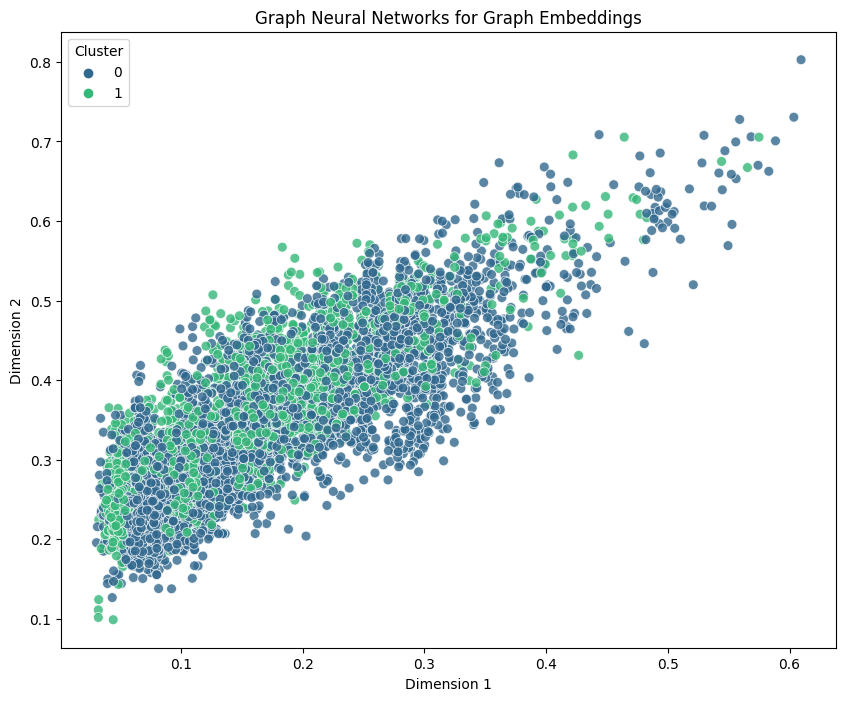

In [ ]:
# Plot the clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=embeddings[:, 0],
    y=embeddings[:, 1],
    hue=clusters,
    palette="viridis",
    s=50,
    alpha=0.8
)
plt.title("Graph Neural Networks for Graph Embeddings")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.legend(title='Cluster')
plt.show()